## What's this TensorFlow business?

You've written a lot of code in this assignment to provide a whole host of neural network functionality. Dropout, Batch Norm, and 2D convolutions are some of the workhorses of deep learning in computer vision. You've also worked hard to make your code efficient and vectorized.

For the last part of this assignment, though, we're going to leave behind your beautiful codebase and instead migrate to one of two popular deep learning frameworks: in this instance, TensorFlow (or PyTorch, if you switch over to that notebook)

#### What is it?
TensorFlow is a system for executing computational graphs over Tensor objects, with native support for performing backpropogation for its Variables. In it, we work with Tensors which are n-dimensional arrays analogous to the numpy ndarray.

#### Why?

* Our code will now run on GPUs! Much faster training. Writing your own modules to run on GPUs is beyond the scope of this class, unfortunately.
* We want you to be ready to use one of these frameworks for your project so you can experiment more efficiently than if you were writing every feature you want to use by hand. 
* We want you to stand on the shoulders of giants! TensorFlow and PyTorch are both excellent frameworks that will make your lives a lot easier, and now that you understand their guts, you are free to use them :) 
* We want you to be exposed to the sort of deep learning code you might run into in academia or industry. 

## How will I learn TensorFlow?

TensorFlow has many excellent tutorials available, including those from [Google themselves](https://www.tensorflow.org/get_started/get_started).

Otherwise, this notebook will walk you through much of what you need to do to train models in TensorFlow. See the end of the notebook for some links to helpful tutorials if you want to learn more or need further clarification on topics that aren't fully explained here.

## Load Datasets


In [1]:
import tensorflow as tf
import numpy as np
import math
import timeit
import matplotlib.pyplot as plt
%matplotlib inline

/home/d3/.pyenv/versions/anaconda3-4.4.0/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#tf.test.gpu_device_name()

In [2]:
from cs231n.data_utils import load_CIFAR10

def get_CIFAR10_data(num_training=49000, num_validation=1000, num_test=10000):
    """
    Load the CIFAR-10 dataset from disk and perform preprocessing to prepare
    it for the two-layer neural net classifier. These are the same steps as
    we used for the SVM, but condensed to a single function.  
    """
    # Load the raw CIFAR-10 data
    cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'
    X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)

    # Subsample the data
    mask = range(num_training, num_training + num_validation)
    X_val = X_train[mask]
    y_val = y_train[mask]
    mask = range(num_training)
    X_train = X_train[mask]
    y_train = y_train[mask]
    mask = range(num_test)
    X_test = X_test[mask]
    y_test = y_test[mask]

    # Normalize the data: subtract the mean image
    mean_image = np.mean(X_train, axis=0)
    X_train -= mean_image
    X_val -= mean_image
    X_test -= mean_image

    return X_train, y_train, X_val, y_val, X_test, y_test


# Invoke the above function to get our data.
X_train, y_train, X_val, y_val, X_test, y_test = get_CIFAR10_data()
print('Train data shape: ', X_train.shape)
print('Train labels shape: ', y_train.shape)
print('Validation data shape: ', X_val.shape)
print('Validation labels shape: ', y_val.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)

Train data shape:  (49000, 32, 32, 3)
Train labels shape:  (49000,)
Validation data shape:  (1000, 32, 32, 3)
Validation labels shape:  (1000,)
Test data shape:  (10000, 32, 32, 3)
Test labels shape:  (10000,)


## Example Model

### Some useful utilities

. Remember that our image data is initially N x H x W x C, where:
* N is the number of datapoints
* H is the height of each image in pixels
* W is the height of each image in pixels
* C is the number of channels (usually 3: R, G, B)

This is the right way to represent the data when we are doing something like a 2D convolution, which needs spatial understanding of where the pixels are relative to each other. When we input image data into fully connected affine layers, however, we want each data example to be represented by a single vector -- it's no longer useful to segregate the different channels, rows, and columns of the data.

### The example model itself

The first step to training your own model is defining its architecture.

Here's an example of a convolutional neural network defined in TensorFlow -- try to understand what each line is doing, remembering that each layer is composed upon the previous layer. We haven't trained anything yet - that'll come next - for now, we want you to understand how everything gets set up. 

In that example, you see 2D convolutional layers (Conv2d), ReLU activations, and fully-connected layers (Linear). You also see the Hinge loss function, and the Adam optimizer being used. 

Make sure you understand why the parameters of the Linear layer are 5408 and 10.

### TensorFlow Details
In TensorFlow, much like in our previous notebooks, we'll first specifically initialize our variables, and then our network model.

In [3]:
def conv_out_size():
    input_height = 32
    filter_size = 7
    stride = 2
    pad = 0

    output_size = int((input_height - filter_size + 2*pad)/stride + 1)
    return output_size

out_size = conv_out_size()
filter_count = 32
weights_count = out_size ** 2 * filter_count
weights_count

5408

In [5]:
# clear old variables
tf.reset_default_graph()

# setup input (e.g. the data that changes every batch)
# The first dim is None, and gets sets automatically based on batch size fed in
X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

def simple_model(X,y):
    # define our weights (e.g. init_two_layer_convnet)
    
    # setup variables
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 32])
    bconv1 = tf.get_variable("bconv1", shape=[32])
    
    W1 = tf.get_variable("W1", shape=[5408, 10])
    b1 = tf.get_variable("b1", shape=[10])

    # define our graph (e.g. two_layer_convnet)
    a1 = tf.nn.conv2d(X, Wconv1, strides=[1,2,2,1], padding='VALID') + bconv1
    h1 = tf.nn.relu(a1)
    h1_flat = tf.reshape(h1,[-1,5408])
    y_out = tf.matmul(h1_flat,W1) + b1
    return y_out

y_out = simple_model(X,y)

# define our loss
total_loss = tf.losses.hinge_loss(tf.one_hot(y,10),logits=y_out)
mean_loss = tf.reduce_mean(total_loss)

# define our optimizer
optimizer = tf.train.AdamOptimizer(5e-4) # select optimizer and set learning rate
train_step = optimizer.minimize(mean_loss)

TensorFlow supports many other layer types, loss functions, and optimizers - you will experiment with these next. Here's the official API documentation for these (if any of the parameters used above were unclear, this resource will also be helpful). 

* Layers, Activations, Loss functions : https://www.tensorflow.org/api_guides/python/nn
* Optimizers: https://www.tensorflow.org/api_guides/python/train#Optimizers
* BatchNorm: https://www.tensorflow.org/api_docs/python/tf/layers/batch_normalization

### Training the model on one epoch
While we have defined a graph of operations above, in order to execute TensorFlow Graphs, by feeding them input data and computing the results, we first need to create a `tf.Session` object. A session encapsulates the control and state of the TensorFlow runtime. For more information, see the TensorFlow [Getting started](https://www.tensorflow.org/get_started/get_started) guide.

Optionally we can also specify a device context such as `/cpu:0` or `/gpu:0`. For documentation on this behavior see [this TensorFlow guide](https://www.tensorflow.org/tutorials/using_gpu)

You should see a validation loss of around 0.4 to 0.6 and an accuracy of 0.30 to 0.35 below

In [35]:
def run_model(session, predict, loss_val, Xd, yd,
              epochs=1, batch_size=64, print_every=100,
              training=None, plot_losses=False, keep_prob_value=1.0):
    
    # have tensorflow compute accuracy
    correct_prediction = tf.equal(tf.argmax(predict,1), y)
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
    
    # shuffle indicies
    train_indicies = np.arange(Xd.shape[0])
    np.random.shuffle(train_indicies)

    training_now = training is not None
    if not training_now:
        keep_prob_value=1.0
    
    # setting up variables we want to compute (and optimizing)
    # if we have a training function, add that to things we compute
    variables = [mean_loss,correct_prediction,accuracy]
    if training_now:
        variables[-1] = training
    
    # counter 
    iter_cnt = 0
    for e in range(epochs):
        # keep track of losses and accuracy
        correct = 0
        losses = []
        # make sure we iterate over the dataset once
        for i in range(int(math.ceil(Xd.shape[0]/batch_size))):
            # generate indicies for the batch
            start_idx = (i*batch_size)%Xd.shape[0]
            idx = train_indicies[start_idx:start_idx+batch_size]
            
            # create a feed dictionary for this batch
            feed_dict = {X: Xd[idx,:],
                         y: yd[idx],
                         is_training: training_now,
                         keep_prob: keep_prob_value }
            # get batch size
            actual_batch_size = yd[idx].shape[0]
            
            # have tensorflow compute loss and correct predictions
            # and (if given) perform a training step
            loss, corr, _ = session.run(variables,feed_dict=feed_dict)
            
            # aggregate performance stats
            losses.append(loss*actual_batch_size)
            correct += np.sum(corr)
            
            # print every now and then
            if training_now and (iter_cnt % print_every) == 0:
                print("Iteration {0}: with minibatch training loss = {1:.3g} and accuracy of {2:.2g}"\
                      .format(iter_cnt,loss,np.sum(corr)/actual_batch_size))
            iter_cnt += 1
        total_correct = correct/Xd.shape[0]
        total_loss = np.sum(losses)/Xd.shape[0]
        print("Epoch {2}, Overall loss = {0:.3g} and accuracy of {1:.3g}"\
              .format(total_loss,total_correct,e+1))
        if plot_losses:
            plt.plot(losses)
            plt.grid(True)
            plt.title('Epoch {} Loss'.format(e+1))
            plt.xlabel('minibatch number')
            plt.ylabel('minibatch loss')
            plt.show()
    return total_loss,total_correct

In [4]:
config = tf.ConfigProto()
config.log_device_placement = False
config.gpu_options.allow_growth = True

In [ ]:
eval_data = None

# Merge all the summaries and write them out to ./
merged = tf.summary.merge_all()

with tf.Session(config=config) as sess:
    with tf.device("/cpu:0"): #"/cpu:0" or "/gpu:0" 
        sess.run(tf.global_variables_initializer())
        print('Training')
        run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step,True)
        print('Validation')
        run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

## Training a specific model

In this section, we're going to specify a model for you to construct. The goal here isn't to get good performance (that'll be next), but instead to get comfortable with understanding the TensorFlow documentation and configuring your own model. 

Using the code provided above as guidance, and using the following TensorFlow documentation, specify a model with the following architecture:

* 7x7 Convolutional Layer with 32 filters and stride of 1
* ReLU Activation Layer
* Spatial Batch Normalization Layer (trainable parameters, with scale and centering)
* 2x2 Max Pooling layer with a stride of 2
* Affine layer with 1024 output units
* ReLU Activation Layer
* Affine layer from 1024 input units to 10 outputs



In [7]:
def conv_out_size(input_height=32,
                  filter_size=7,
                  stride=2,
                  pad=0,
                  filter_count=32):

    output_size = int((input_height - filter_size + 2*pad)/stride + 1)
    
    weights_count = output_size ** 2 * filter_count
    weights_count

    return output_size, weights_count

In [10]:
conv_out_size(stride=1), conv_out_size(stride=2), conv_out_size(stride=3)

((26, 21632), (13, 5408), (9, 2592))

In [12]:
### pool out size
conv_out_size(input_height=26, stride=2, filter_size=2)

(13, 5408)

In [23]:
# clear old variables
tf.reset_default_graph()

# define our input (e.g. the data that changes every batch)
# The first dim is None, and gets sets automatically based on batch size fed in
X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

# define model
def complex_model(X,y,is_training):
    w_h_stride = 1
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 32])
    bconv1 = tf.get_variable("bconv1", shape=[32])
    
    W1 = tf.get_variable("W1", shape=[5408, 1024])
    b1 = tf.get_variable("b1", shape=[1024])

    # define our graph (e.g. two_layer_convnet)
    a1 = tf.nn.conv2d(X, Wconv1, strides=[1,w_h_stride,w_h_stride,1], padding='VALID') + bconv1
    h1 = tf.nn.relu(a1)
    
    bn = tf.layers.batch_normalization(h1, axis=3)
    
    mp = tf.nn.max_pool(bn, ksize=[1,2,2,1], strides=[1,2,2,1], padding='VALID',)
    
    h1_flat = tf.reshape(mp,[-1,5408])
    h1_out = tf.nn.relu(tf.matmul(h1_flat, W1, name='mul_1') + b1)
    
    W2 = tf.get_variable("W2", shape=[1024, 10])
    b2 = tf.get_variable("b2", shape=[10])
    
    h2_out = tf.matmul(h1_out, W2, name='mul_2') + b2
    return h2_out
    

y_out = complex_model(X,y,is_training)

To make sure you're doing the right thing, use the following tool to check the dimensionality of your output (it should be 64 x 10, since our batches have size 64 and the output of the final affine layer should be 10, corresponding to our 10 classes):

In [24]:
# Now we're going to feed a random batch into the model 
# and make sure the output is the right size
x = np.random.randn(64, 32, 32,3)
with tf.Session(config=config) as sess:
    with tf.device("/cpu:0"): #"/cpu:0" or "/gpu:0"
        tf.global_variables_initializer().run()

        ans = sess.run(y_out,feed_dict={X:x,is_training:True})
        %timeit sess.run(y_out,feed_dict={X:x,is_training:True})
        print(ans.shape)
        print(np.array_equal(ans.shape, np.array([64, 10])))

1000 loops, best of 3: 1.7 ms per loop
(64, 10)
True


You should see the following from the run above 

`(64, 10)`

`True`

### GPU!

Now, we're going to try and start the model under the GPU device, the rest of the code stays unchanged and all our variables and operations will be computed using accelerated code paths. However, if there is no GPU, we get a Python exception and have to rebuild our graph. On a dual-core CPU, you might see around 50-80ms/batch running the above, while the Google Cloud GPUs (run below) should be around 2-5ms/batch.

In [25]:
try:
    with tf.Session(config=config) as sess:
        with tf.device("/gpu:0") as dev: #"/cpu:0" or "/gpu:0"
            tf.global_variables_initializer().run()

            ans = sess.run(y_out,feed_dict={X:x,is_training:True})
            %timeit sess.run(y_out,feed_dict={X:x,is_training:True})
except tf.errors.InvalidArgumentError:
    print("no gpu found, please use Google Cloud if you want GPU acceleration")    
    # rebuild the graph
    # trying to start a GPU throws an exception 
    # and also trashes the original graph
    tf.reset_default_graph()
    X = tf.placeholder(tf.float32, [None, 32, 32, 3])
    y = tf.placeholder(tf.int64, [None])
    is_training = tf.placeholder(tf.bool)
    y_out = complex_model(X,y,is_training)

1000 loops, best of 3: 1.69 ms per loop


You should observe that even a simple forward pass like this is significantly faster on the GPU. So for the rest of the assignment (and when you go train your models in assignment 3 and your project!), you should use GPU devices. However, with TensorFlow, the default device is a GPU if one is available, and a CPU otherwise, so we can skip the device specification from now on.

### Train the model.

Now that you've seen how to define a model and do a single forward pass of some data through it, let's  walk through how you'd actually train one whole epoch over your training data (using the complex_model you created provided above).

Make sure you understand how each TensorFlow function used below corresponds to what you implemented in your custom neural network implementation.

First, set up an **RMSprop optimizer** (using a 1e-3 learning rate) and a **cross-entropy loss** function. See the TensorFlow documentation for more information
* Layers, Activations, Loss functions : https://www.tensorflow.org/api_guides/python/nn
* Optimizers: https://www.tensorflow.org/api_guides/python/train#Optimizers

In [46]:
# Inputs
#     y_out: is what your model computes
#     y: is your TensorFlow variable with label information
# Outputs
#    mean_loss: a TensorFlow variable (scalar) with numerical loss
#    optimizer: a TensorFlow optimizer
# This should be ~3 lines of code!

#mean_loss = tf.nn.softmax_cross_entropy_with_logits(labels=tf.one_hot(y, 10), logits=y_out)
mean_loss = tf.losses.softmax_cross_entropy(onehot_labels=tf.one_hot(y, 10), logits=y_out)
optimizer = tf.train.RMSPropOptimizer(0.001)
# pass

In [47]:
# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

### Train the model
Below we'll create a session and train the model over one epoch. You should see a loss of 1.4 to 2.0 and an accuracy of 0.4 to 0.5. There will be some variation due to random seeds and differences in initialization

In [48]:
sess = tf.Session(config=config)

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step)

Training
Iteration 0: with minibatch training loss = 27.5 and accuracy of 0.19
Iteration 100: with minibatch training loss = 2.59 and accuracy of 0.12
Iteration 200: with minibatch training loss = 4.43 and accuracy of 0.17
Iteration 300: with minibatch training loss = 2.27 and accuracy of 0.094
Iteration 400: with minibatch training loss = 2.06 and accuracy of 0.23
Iteration 500: with minibatch training loss = 1.74 and accuracy of 0.31
Iteration 600: with minibatch training loss = 1.86 and accuracy of 0.33
Iteration 700: with minibatch training loss = 1.77 and accuracy of 0.36
Epoch 1, Overall loss = 4.07 and accuracy of 0.249


(4.069709102124584, 0.24946938775510205)

### Check the accuracy of the model.

Let's see the train and test code in action -- feel free to use these methods when evaluating the models you develop below. You should see a loss of 1.3 to 2.0 with an accuracy of 0.45 to 0.55.

In [49]:
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Validation
Epoch 1, Overall loss = 1.64 and accuracy of 0.405


(1.6435871849060057, 0.405)

In [54]:
##### 
_labels = tf.placeholder(tf.int32, [None])
_logits = tf.placeholder(tf.float32, [None, 10])

_labels_np = np.random.randint(0, 9, size=(5))
_logits_np = np.random.random(size=(5, 10))

loss = tf.losses.softmax_cross_entropy(onehot_labels=tf.one_hot(_labels, 10),
                                       logits=_logits)
logits_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(_labels, 10),
                                                         logits=_logits)

with tf.Session(config=config) as sess:
    _loss, _logits_loss = sess.run([loss, logits_loss], feed_dict={_labels: _labels_np,
                                                                   _logits: _logits_np})
    
    print('Loss: {}'.format(_loss))
    print('Logits loss: {}'.format(_logits_loss))
    print('Logits loss: {}'.format(np.mean(_logits_loss)))

Loss: 2.409179210662842
Logits loss: [1.8373377 2.7468777 2.185281  2.7110033 2.5653973]
Logits loss: 2.409179210662842


## Train a _great_ model on CIFAR-10!

Now it's your job to experiment with architectures, hyperparameters, loss functions, and optimizers to train a model that achieves ** >= 70% accuracy on the validation set** of CIFAR-10. You can use the `run_model` function from above.

### Things you should try:
- **Filter size**: Above we used 7x7; this makes pretty pictures but smaller filters may be more efficient
- **Number of filters**: Above we used 32 filters. Do more or fewer do better?
- **Pooling vs Strided Convolution**: Do you use max pooling or just stride convolutions?
- **Batch normalization**: Try adding spatial batch normalization after convolution layers and vanilla batch normalization after affine layers. Do your networks train faster?
- **Network architecture**: The network above has two layers of trainable parameters. Can you do better with a deep network? Good architectures to try include:
    - [conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
    - [conv-relu-conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
    - [batchnorm-relu-conv]xN -> [affine]xM -> [softmax or SVM]
- **Use TensorFlow Scope**: Use TensorFlow scope and/or [tf.layers](https://www.tensorflow.org/api_docs/python/tf/layers) to make it easier to write deeper networks. See [this tutorial](https://www.tensorflow.org/tutorials/layers) for how to use `tf.layers`. 
- **Use Learning Rate Decay**: [As the notes point out](http://cs231n.github.io/neural-networks-3/#anneal), decaying the learning rate might help the model converge. Feel free to decay every epoch, when loss doesn't change over an entire epoch, or any other heuristic you find appropriate. See the [Tensorflow documentation](https://www.tensorflow.org/versions/master/api_guides/python/train#Decaying_the_learning_rate) for learning rate decay.
- **Global Average Pooling**: Instead of flattening and then having multiple affine layers, perform convolutions until your image gets small (7x7 or so) and then perform an average pooling operation to get to a 1x1 image picture (1, 1 , Filter#), which is then reshaped into a (Filter#) vector. This is used in [Google's Inception Network](https://arxiv.org/abs/1512.00567) (See Table 1 for their architecture).
- **Regularization**: Add l2 weight regularization, or perhaps use [Dropout as in the TensorFlow MNIST tutorial](https://www.tensorflow.org/get_started/mnist/pros)

### Tips for training
For each network architecture that you try, you should tune the learning rate and regularization strength. When doing this there are a couple important things to keep in mind:

- If the parameters are working well, you should see improvement within a few hundred iterations
- Remember the coarse-to-fine approach for hyperparameter tuning: start by testing a large range of hyperparameters for just a few training iterations to find the combinations of parameters that are working at all.
- Once you have found some sets of parameters that seem to work, search more finely around these parameters. You may need to train for more epochs.
- You should use the validation set for hyperparameter search, and we'll save the test set for evaluating your architecture on the best parameters as selected by the validation set.

### Going above and beyond
If you are feeling adventurous there are many other features you can implement to try and improve your performance. You are **not required** to implement any of these; however they would be good things to try for extra credit.

- Alternative update steps: For the assignment we implemented SGD+momentum, RMSprop, and Adam; you could try alternatives like AdaGrad or AdaDelta.
- Alternative activation functions such as leaky ReLU, parametric ReLU, ELU, or MaxOut.
- Model ensembles
- Data augmentation
- New Architectures
  - [ResNets](https://arxiv.org/abs/1512.03385) where the input from the previous layer is added to the output.
  - [DenseNets](https://arxiv.org/abs/1608.06993) where inputs into previous layers are concatenated together.
  - [This blog has an in-depth overview](https://chatbotslife.com/resnets-highwaynets-and-densenets-oh-my-9bb15918ee32)

If you do decide to implement something extra, clearly describe it in the "Extra Credit Description" cell below.

### What we expect
At the very least, you should be able to train a ConvNet that gets at **>= 70% accuracy on the validation set**. This is just a lower bound - if you are careful it should be possible to get accuracies much higher than that! Extra credit points will be awarded for particularly high-scoring models or unique approaches.

You should use the space below to experiment and train your network. The final cell in this notebook should contain the training and validation set accuracies for your final trained network.

Have fun and happy training!

### TODO:
- **Filter size**: Above we used 7x7; this makes pretty pictures but smaller filters may be more efficient
- **Number of filters**: Above we used 32 filters. Do more or fewer do better?
- **Pooling vs Strided Convolution**: Do you use max pooling or just stride convolutions?
- **Batch normalization**: Try adding spatial batch normalization after convolution layers and vanilla batch normalization after affine layers. Do your networks train faster?
- **Network architecture**: The network above has two layers of trainable parameters. Can you do better with a deep network? Good architectures to try include:
    - [conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
    - [conv-relu-conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
    - [batchnorm-relu-conv]xN -> [affine]xM -> [softmax or SVM]
- **Use TensorFlow Scope**: Use TensorFlow scope and/or [tf.layers](https://www.tensorflow.org/api_docs/python/tf/layers) to make it easier to write deeper networks. See [this tutorial](https://www.tensorflow.org/tutorials/layers) for how to use `tf.layers`. 
- **Use Learning Rate Decay**: [As the notes point out](http://cs231n.github.io/neural-networks-3/#anneal), decaying the learning rate might help the model converge. Feel free to decay every epoch, when loss doesn't change over an entire epoch, or any other heuristic you find appropriate. See the [Tensorflow documentation](https://www.tensorflow.org/versions/master/api_guides/python/train#Decaying_the_learning_rate) for learning rate decay.
- **Global Average Pooling**: Instead of flattening and then having multiple affine layers, perform convolutions until your image gets small (7x7 or so) and then perform an average pooling operation to get to a 1x1 image picture (1, 1 , Filter#), which is then reshaped into a (Filter#) vector. This is used in [Google's Inception Network](https://arxiv.org/abs/1512.00567) (See Table 1 for their architecture).
- **Regularization**: Add l2 weight regularization, or perhaps use [Dropout as in the TensorFlow MNIST tutorial](https://www.tensorflow.org/get_started/mnist/pros)

In [ ]:
config = tf.ConfigProto()
config.log_device_placement = False
config.gpu_options.allow_growth = True

In [5]:
def filter_out_size(input_height=32,
                    filter_size=7,
                    stride=2,
                    pad=0,
                    filter_count=32):

    output_size = int((input_height - filter_size + 2*pad)/stride + 1)
    
    weights_count = output_size ** 2 * filter_count
    weights_count

    return output_size, weights_count

In [31]:
# Feel free to play with this cell

def my_model(X,y,is_training, keep_prob, regularizer,
            filter_size=7,
            filters_count=32,
            pool_size=2,
            pool_stride=1,
            stride=1,
            max_pooling_use=True,
            spatial_batch_norm=False,
            vanilla_batch_norm=False,
            net_architecture='v1',
            learning_rate_decay=False,
            global_avg_pooling=False,
            dropout_use=False,
            N=None,
            M=None):
    """
    net_architecture: 
        v1: is for the simplest
        v2: [conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
        v3: [conv-relu-conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
        v4: [batchnorm-relu-conv]xN -> [affine]xM -> [softmax or SVM]
    """
    
    if dropout_use:
        assert keep_prob is not None
    
    if net_architecture in ['v{}'.format(i) for i in range(2,5)]:
        assert N and M

    # vanila ConvNet
    if net_architecture == 'v1':
#         conv_W = tf.get_variable('conv_W', shape=[filter_size, filter_size, filter_count], 
#                                  dtype=tf.float32, 
#                                  regularizer=regularizer)
#         conv_b = tf.Variable(tf.zeros(shape=[filter_count], dtype=tf.float32), name='conv_b')
#         conv_layer = tf.nn.conv2d(X, conv_W, strides=[1, 1, 1, 1], padding='VALID', name='conv_layer') + conv_b
        conv_layer = tf.layers.conv2d(X,
                                  data_format='channels_last',
                                  filters=filters_count,
                                  activation=tf.nn.relu, 
                                  kernel_regularizer=regularizer,
                                  kernel_size=(filter_size, filter_size), 
                                  strides=(stride, stride), 
                                  name='conv_layer')
        output_size, weights_count = filter_out_size(input_height=32,
                                                    filter_size=filter_size,
                                                    stride=stride,
                                                    pad=0,
                                                    filter_count=filters_count)
        print('output_size: ', output_size)
    
        if max_pooling_use:
            assert pool_size and pool_stride
            conv_layer = tf.layers.max_pooling2d(conv_layer, 
                                               data_format='channels_last',
                                               pool_size=[pool_size,pool_size], 
                                               name='max_pool',
                                               strides=[pool_stride,pool_stride], 
                                               padding='VALID')
            output_size, weights_count = filter_out_size(input_height=output_size,
                                                        filter_size=pool_size,
                                                        stride=pool_stride,
                                                        pad=0,
                                                        filter_count=filters_count)
            print('output_size: ', output_size)
            
        if dropout_use:
            conv_layer = tf.nn.dropout(conv_layer, keep_prob=keep_prob, name='dropout_conv')
            
        if spatial_batch_norm:
            # TODO ?
            conv_layer = tf.layers.batch_normalization(conv_layer, axis=3, training=is_training,
                                                     name='spatial_BN')
        # dense_layers
        if not global_avg_pooling:
            conv_layer_flat = tf.reshape(conv_layer, [-1, weights_count])
            print('weights_count: ', weights_count//2)
            
            dense_layer = tf.layers.dense(conv_layer_flat, weights_count//2, 
                                          activation=tf.nn.relu, use_bias=True, 
                                          name='penultimate_layer',
                                          activity_regularizer=regularizer)
            if dropout_use:
                dense_layer = tf.nn.dropout(dense_layer, keep_prob=keep_prob, name='dropout_dense')

            if vanilla_batch_norm:
                dense_layer = tf.layers.batch_normalization(dense_layer, axis=1, name='BN', 
                                                            training=is_training)

            y_out = tf.layers.dense(dense_layer, 10, activation=None, use_bias=True, 
                                    name='last_layer', activity_regularizer=regularizer)
        else:
            """
            Global Average Pooling: Instead of flattening and then having multiple affine layers, 
            perform convolutions until your image gets small (7x7 or so) and then perform an average 
            pooling operation to get to a 1x1 image picture (1, 1 , Filter#), which is then reshaped 
            into a (Filter#) vector. This is used in Google's Inception Network (See Table 1 for their 
            architecture).
            """
            # stride=2, pool_stride=2 does it: output_size=6
            global_avg_pool = tf.layers.average_pooling2d(conv_layer, 
                                        data_format='channels_last',
                                        pool_size=[output_size, output_size],
                                        strides=[1,1], 
                                        name='global_avg_pool',
                                        padding='VALID')
            
            dense_layer = tf.reshape(global_avg_pool, [-1, filters_count])
            
            y_out = tf.layers.dense(dense_layer, 10, activation=None, use_bias=True, 
                                    name='last_layer', activity_regularizer=regularizer)

    # v2
    elif net_architecture == 'v2':
#         [conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
        current_height = 32
        current_input = X
        assert len(filters_count) == N
        assert len(filter_size) == N
        assert len(stride) == N
        assert len(pool_size) == N
        assert len(pool_stride) == N
        
        for i in range(N):
            with tf.variable_scope('conv_layer_{}'.format(i+1)):
                conv_layer = tf.layers.conv2d(current_input,
                              data_format='channels_last',
                              filters=filters_count[i],
                              activation=tf.nn.relu, 
                              kernel_regularizer=regularizer,
                              kernel_size=(filter_size[i], filter_size[i]), 
                              strides=(stride[i], stride[i]), 
                              name='conv_layer')
                output_size, weights_count = filter_out_size(input_height=current_height,
                                                            filter_size=filter_size[i],
                                                            stride=stride[i],
                                                            pad=0,
                                                            filter_count=filters_count[i])
                print('conv output size: ', output_size)
                pool_layer = tf.layers.max_pooling2d(conv_layer, 
                                                   data_format='channels_last',
                                                   pool_size=[pool_size[i],pool_size[i]], 
                                                   name='max_pool_{}'.format(i),
                                                   strides=[pool_stride[i],pool_stride[i]], 
                                                   padding='VALID')
                output_size, weights_count = filter_out_size(input_height=output_size,
                                                            filter_size=pool_size[i],
                                                            stride=pool_stride[i],
                                                            pad=0,
                                                            filter_count=filters_count[i])
                print('pool output size: ', output_size)
                current_height = output_size
                current_input = pool_layer
        
        conv_output = pool_layer
        if dropout_use:
            conv_output = tf.nn.dropout(pool_layer, keep_prob=keep_prob, name='dropout_conv')
        dense_input = tf.reshape(conv_output, [-1, weights_count])
        dense_units = weights_count // 2
        
        for i in range(M):
            print('dense_units: ', dense_units)
            dense_layer = tf.layers.dense(dense_input, dense_units, 
                                          activation=tf.nn.relu, use_bias=True, 
                                          name='layer_{}'.format(i),
                                          activity_regularizer=regularizer)
            dense_units //= 2 
            dense_input = dense_layer
            
            if dropout_use:
                dense_input = tf.nn.dropout(dense_input, keep_prob=keep_prob, name='dropout_conv')
        
        y_out = tf.layers.dense(dense_layer, 10, activation=None, use_bias=True, 
                                name='last_layer', activity_regularizer=regularizer)
    # v3
    elif net_architecture == 'v3':
        pass
    # v4
    elif net_architecture == 'v4':
        pass
    
    return y_out

In [55]:
def init_model(params, lr=0.001, lr_decay=False, lr_decay_steps=None, decay_factor=None):
    tf.reset_default_graph()

    X = tf.placeholder(tf.float32, [None, 32, 32, 3])
    y = tf.placeholder(tf.int64, [None])
    is_training = tf.placeholder(tf.bool)
    keep_prob = tf.placeholder(tf.float32)

    y_out = my_model(X, y, is_training, keep_prob=keep_prob, **params)
    mean_loss = tf.losses.softmax_cross_entropy(tf.one_hot(y, 10), y_out)
    
    if lr_decay:
        global_step = tf.Variable(0, trainable=False)
        starter_learning_rate = lr
        learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step,
                                                   lr_decay_steps, decay_factor, staircase=True)

    optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)

    # batch normalization in tensorflow requires this extra dependency
    extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    reg_losses = tf.get_collection(tf.GraphKeys.REGULARIZATION_LOSSES)
    reg_term = tf.contrib.layers.apply_regularization(params['regularizer'],
                                                      reg_losses)
    with tf.control_dependencies(extra_update_ops):
        mean_loss += reg_term
        if lr_decay:
            train_step = optimizer.minimize(mean_loss)
        else:
            train_step = optimizer.minimize(mean_loss, global_step=global_step)
            
    return y_out, mean_loss, X, y, is_training, train_step, keep_prob

In [58]:
regularizer = tf.contrib.layers.l2_regularizer(0.005)

keep_prob_value = 0.7
params = dict(
    filter_size=[7,6,5,4,3],  # [7,6,5],
    filters_count=[64,64,64,64,64], # [32, 32, 32],
    pool_size=[4,3,2,2,2],  # [1, 1, 1],
    pool_stride=[1,1,1,1,1],  # [1, 1, 1],
    stride=[1,1,1,1,1],  # [1, 1, 1],
    net_architecture='v2',
#     filter_size=7,  # [7,6,5],
#     filters_count=32, # [32, 32, 32],
#     pool_size=1,  # [1, 1, 1],
#     pool_stride=1,  # [1, 1, 1],
#     stride=1,  # [1, 1, 1],
#     net_architecture='v1',
    max_pooling_use=True,
    spatial_batch_norm=False, #True,
    vanilla_batch_norm=False, #True,
    learning_rate_decay=False,
    global_avg_pooling=False,
    regularizer=regularizer,
    dropout_use=True,
    N=5,
    M=2)

lr_decay_steps = X_train.shape[0] // 64 * 25

y_out, mean_loss, X, y, is_training, train_step, keep_prob = init_model(params, lr=0.0001, lr_decay=True,
                                                                       lr_decay_steps=lr_decay_steps,
                                                                       decay_factor=0.96)

conv output size:  26
pool output size:  23
conv output size:  18
pool output size:  16
conv output size:  12
pool output size:  11
conv output size:  8
pool output size:  7
conv output size:  5
pool output size:  4
dense_units:  512
dense_units:  256


Training
Iteration 0: with minibatch training loss = 1.53e+05 and accuracy of 0.047
Iteration 100: with minibatch training loss = 3.57 and accuracy of 0.094
Iteration 200: with minibatch training loss = 2.33 and accuracy of 0.12
Iteration 300: with minibatch training loss = 2.3 and accuracy of 0.16
Iteration 400: with minibatch training loss = 2.3 and accuracy of 0.12
Iteration 500: with minibatch training loss = 2.26 and accuracy of 0.12
Iteration 600: with minibatch training loss = 2.19 and accuracy of 0.22
Iteration 700: with minibatch training loss = 2.25 and accuracy of 0.11
Epoch 1, Overall loss = 245 and accuracy of 0.126


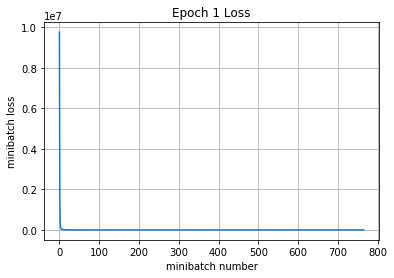

Iteration 800: with minibatch training loss = 2.2 and accuracy of 0.19
Iteration 900: with minibatch training loss = 2.18 and accuracy of 0.2
Iteration 1000: with minibatch training loss = 2.24 and accuracy of 0.12
Iteration 1100: with minibatch training loss = 2.1 and accuracy of 0.16
Iteration 1200: with minibatch training loss = 2.04 and accuracy of 0.27
Iteration 1300: with minibatch training loss = 2.09 and accuracy of 0.27
Iteration 1400: with minibatch training loss = 2.13 and accuracy of 0.14
Iteration 1500: with minibatch training loss = 2.09 and accuracy of 0.14
Epoch 2, Overall loss = 2.15 and accuracy of 0.176


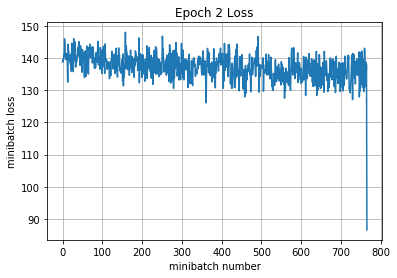

Iteration 1600: with minibatch training loss = 2.19 and accuracy of 0.19
Iteration 1700: with minibatch training loss = 2.03 and accuracy of 0.25
Iteration 1800: with minibatch training loss = 2 and accuracy of 0.25
Iteration 1900: with minibatch training loss = 2.09 and accuracy of 0.22
Iteration 2000: with minibatch training loss = 2.12 and accuracy of 0.25
Iteration 2100: with minibatch training loss = 2.02 and accuracy of 0.27
Iteration 2200: with minibatch training loss = 2.08 and accuracy of 0.19
Epoch 3, Overall loss = 2.08 and accuracy of 0.215


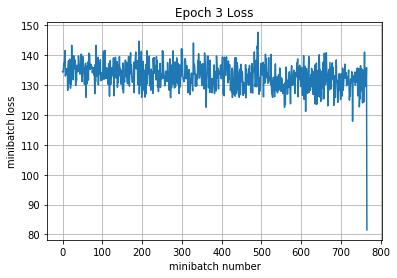

Iteration 2300: with minibatch training loss = 2.07 and accuracy of 0.19
Iteration 2400: with minibatch training loss = 2.11 and accuracy of 0.22
Iteration 2500: with minibatch training loss = 2.06 and accuracy of 0.25
Iteration 2600: with minibatch training loss = 1.97 and accuracy of 0.28
Iteration 2700: with minibatch training loss = 2.12 and accuracy of 0.2
Iteration 2800: with minibatch training loss = 2.04 and accuracy of 0.17
Iteration 2900: with minibatch training loss = 1.99 and accuracy of 0.22
Iteration 3000: with minibatch training loss = 1.98 and accuracy of 0.23
Epoch 4, Overall loss = 2.01 and accuracy of 0.253


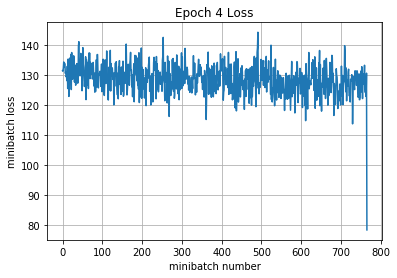

Iteration 3100: with minibatch training loss = 2.01 and accuracy of 0.27
Iteration 3200: with minibatch training loss = 1.99 and accuracy of 0.3
Iteration 3300: with minibatch training loss = 2.06 and accuracy of 0.23
Iteration 3400: with minibatch training loss = 1.99 and accuracy of 0.2
Iteration 3500: with minibatch training loss = 2.16 and accuracy of 0.22
Iteration 3600: with minibatch training loss = 1.89 and accuracy of 0.28
Iteration 3700: with minibatch training loss = 1.99 and accuracy of 0.31
Iteration 3800: with minibatch training loss = 1.9 and accuracy of 0.25
Epoch 5, Overall loss = 1.95 and accuracy of 0.278


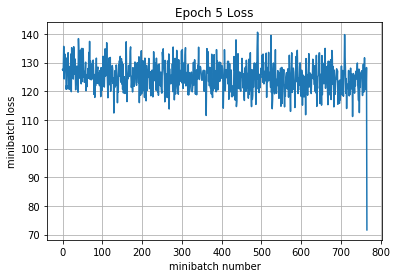

Iteration 3900: with minibatch training loss = 1.96 and accuracy of 0.23
Iteration 4000: with minibatch training loss = 2.06 and accuracy of 0.33
Iteration 4100: with minibatch training loss = 1.93 and accuracy of 0.27
Iteration 4200: with minibatch training loss = 1.84 and accuracy of 0.38
Iteration 4300: with minibatch training loss = 1.88 and accuracy of 0.31
Iteration 4400: with minibatch training loss = 1.99 and accuracy of 0.3
Iteration 4500: with minibatch training loss = 1.86 and accuracy of 0.39
Epoch 6, Overall loss = 1.91 and accuracy of 0.295


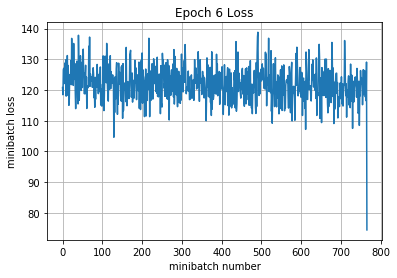

Iteration 4600: with minibatch training loss = 1.83 and accuracy of 0.36
Iteration 4700: with minibatch training loss = 1.7 and accuracy of 0.39
Iteration 4800: with minibatch training loss = 1.94 and accuracy of 0.28
Iteration 4900: with minibatch training loss = 1.99 and accuracy of 0.28
Iteration 5000: with minibatch training loss = 1.7 and accuracy of 0.31
Iteration 5100: with minibatch training loss = 1.91 and accuracy of 0.27
Iteration 5200: with minibatch training loss = 1.87 and accuracy of 0.34
Iteration 5300: with minibatch training loss = 1.86 and accuracy of 0.39
Epoch 7, Overall loss = 1.86 and accuracy of 0.314


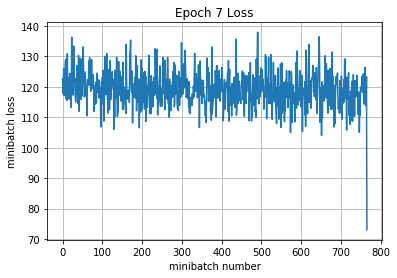

Iteration 5400: with minibatch training loss = 1.8 and accuracy of 0.44
Iteration 5500: with minibatch training loss = 1.68 and accuracy of 0.38
Iteration 5600: with minibatch training loss = 1.97 and accuracy of 0.28
Iteration 5700: with minibatch training loss = 1.84 and accuracy of 0.25
Iteration 5800: with minibatch training loss = 1.68 and accuracy of 0.34
Iteration 5900: with minibatch training loss = 1.64 and accuracy of 0.42
Iteration 6000: with minibatch training loss = 1.97 and accuracy of 0.36
Iteration 6100: with minibatch training loss = 1.89 and accuracy of 0.33
Epoch 8, Overall loss = 1.82 and accuracy of 0.329


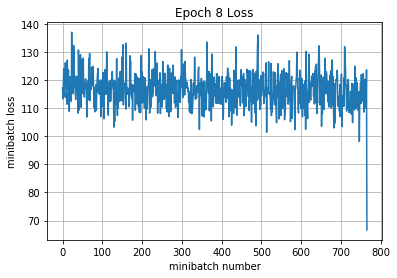

Iteration 6200: with minibatch training loss = 1.74 and accuracy of 0.41
Iteration 6300: with minibatch training loss = 1.79 and accuracy of 0.27
Iteration 6400: with minibatch training loss = 1.59 and accuracy of 0.44
Iteration 6500: with minibatch training loss = 1.66 and accuracy of 0.44
Iteration 6600: with minibatch training loss = 1.87 and accuracy of 0.3
Iteration 6700: with minibatch training loss = 1.76 and accuracy of 0.38
Iteration 6800: with minibatch training loss = 1.86 and accuracy of 0.39
Epoch 9, Overall loss = 1.79 and accuracy of 0.348


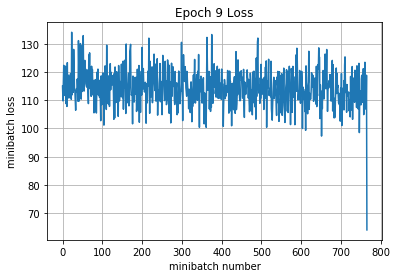

Iteration 6900: with minibatch training loss = 1.79 and accuracy of 0.34
Iteration 7000: with minibatch training loss = 1.79 and accuracy of 0.31
Iteration 7100: with minibatch training loss = 1.66 and accuracy of 0.47
Iteration 7200: with minibatch training loss = 1.9 and accuracy of 0.22
Iteration 7300: with minibatch training loss = 1.78 and accuracy of 0.38
Iteration 7400: with minibatch training loss = 1.7 and accuracy of 0.42
Iteration 7500: with minibatch training loss = 1.86 and accuracy of 0.34
Iteration 7600: with minibatch training loss = 1.66 and accuracy of 0.45
Epoch 10, Overall loss = 1.75 and accuracy of 0.364


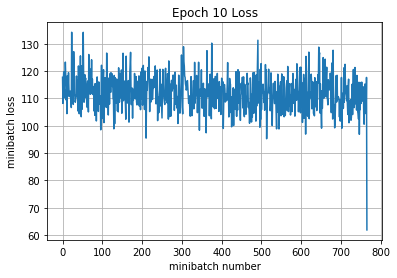

Iteration 7700: with minibatch training loss = 1.91 and accuracy of 0.25
Iteration 7800: with minibatch training loss = 1.59 and accuracy of 0.42
Iteration 7900: with minibatch training loss = 1.68 and accuracy of 0.39
Iteration 8000: with minibatch training loss = 1.71 and accuracy of 0.41
Iteration 8100: with minibatch training loss = 1.64 and accuracy of 0.42
Iteration 8200: with minibatch training loss = 1.73 and accuracy of 0.38
Iteration 8300: with minibatch training loss = 1.71 and accuracy of 0.33
Iteration 8400: with minibatch training loss = 1.75 and accuracy of 0.44
Epoch 11, Overall loss = 1.72 and accuracy of 0.379


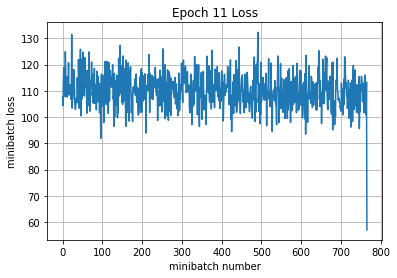

Iteration 8500: with minibatch training loss = 1.75 and accuracy of 0.38
Iteration 8600: with minibatch training loss = 1.62 and accuracy of 0.48
Iteration 8700: with minibatch training loss = 1.66 and accuracy of 0.48
Iteration 8800: with minibatch training loss = 1.53 and accuracy of 0.59
Iteration 8900: with minibatch training loss = 1.66 and accuracy of 0.3
Iteration 9000: with minibatch training loss = 1.62 and accuracy of 0.41
Iteration 9100: with minibatch training loss = 1.78 and accuracy of 0.47
Epoch 12, Overall loss = 1.69 and accuracy of 0.391


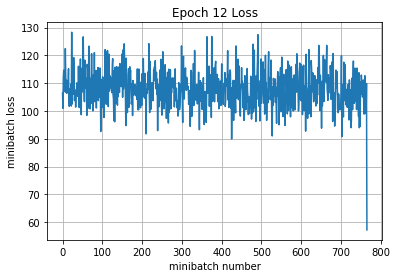

Iteration 9200: with minibatch training loss = 1.73 and accuracy of 0.34
Iteration 9300: with minibatch training loss = 1.64 and accuracy of 0.44
Iteration 9400: with minibatch training loss = 1.68 and accuracy of 0.42
Iteration 9500: with minibatch training loss = 1.78 and accuracy of 0.28
Iteration 9600: with minibatch training loss = 1.69 and accuracy of 0.33
Iteration 9700: with minibatch training loss = 1.57 and accuracy of 0.47
Iteration 9800: with minibatch training loss = 1.51 and accuracy of 0.42
Iteration 9900: with minibatch training loss = 1.65 and accuracy of 0.45
Epoch 13, Overall loss = 1.66 and accuracy of 0.402


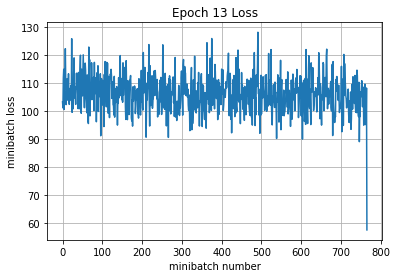

Iteration 10000: with minibatch training loss = 1.56 and accuracy of 0.33
Iteration 10100: with minibatch training loss = 1.6 and accuracy of 0.39
Iteration 10200: with minibatch training loss = 1.61 and accuracy of 0.39
Iteration 10300: with minibatch training loss = 1.77 and accuracy of 0.38
Iteration 10400: with minibatch training loss = 1.54 and accuracy of 0.34
Iteration 10500: with minibatch training loss = 1.56 and accuracy of 0.42
Iteration 10600: with minibatch training loss = 1.74 and accuracy of 0.31
Iteration 10700: with minibatch training loss = 1.67 and accuracy of 0.44
Epoch 14, Overall loss = 1.62 and accuracy of 0.415


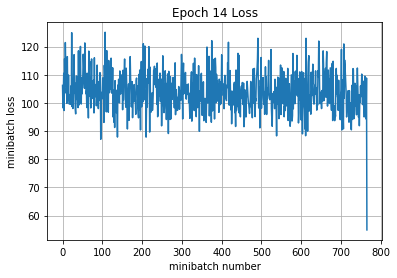

Iteration 10800: with minibatch training loss = 1.49 and accuracy of 0.47
Iteration 10900: with minibatch training loss = 1.42 and accuracy of 0.55
Iteration 11000: with minibatch training loss = 1.63 and accuracy of 0.39
Iteration 11100: with minibatch training loss = 1.55 and accuracy of 0.42
Iteration 11200: with minibatch training loss = 1.6 and accuracy of 0.31
Iteration 11300: with minibatch training loss = 1.66 and accuracy of 0.5
Iteration 11400: with minibatch training loss = 1.39 and accuracy of 0.58
Epoch 15, Overall loss = 1.6 and accuracy of 0.427


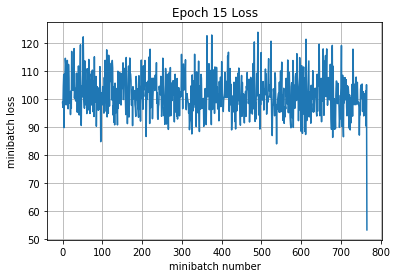

Iteration 11500: with minibatch training loss = 1.65 and accuracy of 0.33
Iteration 11600: with minibatch training loss = 1.56 and accuracy of 0.44
Iteration 11700: with minibatch training loss = 1.31 and accuracy of 0.53
Iteration 11800: with minibatch training loss = 1.52 and accuracy of 0.53
Iteration 11900: with minibatch training loss = 1.72 and accuracy of 0.39
Iteration 12000: with minibatch training loss = 1.72 and accuracy of 0.34
Iteration 12100: with minibatch training loss = 1.65 and accuracy of 0.41
Iteration 12200: with minibatch training loss = 1.62 and accuracy of 0.42
Epoch 16, Overall loss = 1.57 and accuracy of 0.442


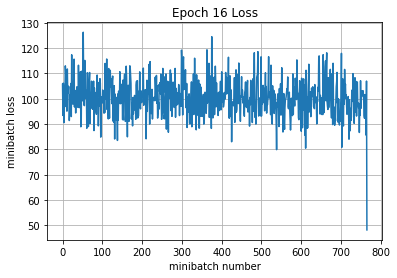

Iteration 12300: with minibatch training loss = 1.65 and accuracy of 0.45
Iteration 12400: with minibatch training loss = 1.65 and accuracy of 0.45
Iteration 12500: with minibatch training loss = 1.57 and accuracy of 0.44
Iteration 12600: with minibatch training loss = 1.3 and accuracy of 0.61
Iteration 12700: with minibatch training loss = 1.4 and accuracy of 0.47
Iteration 12800: with minibatch training loss = 1.35 and accuracy of 0.66
Iteration 12900: with minibatch training loss = 1.74 and accuracy of 0.47
Iteration 13000: with minibatch training loss = 1.44 and accuracy of 0.5
Epoch 17, Overall loss = 1.54 and accuracy of 0.451


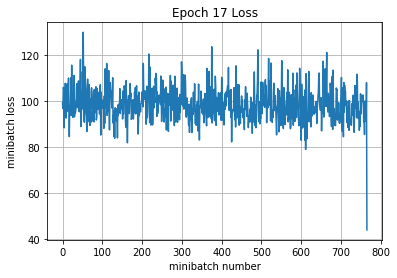

Iteration 13100: with minibatch training loss = 1.61 and accuracy of 0.41
Iteration 13200: with minibatch training loss = 1.47 and accuracy of 0.41
Iteration 13300: with minibatch training loss = 1.61 and accuracy of 0.45
Iteration 13400: with minibatch training loss = 1.46 and accuracy of 0.44
Iteration 13500: with minibatch training loss = 1.55 and accuracy of 0.36
Iteration 13600: with minibatch training loss = 1.37 and accuracy of 0.52
Iteration 13700: with minibatch training loss = 1.64 and accuracy of 0.41
Epoch 18, Overall loss = 1.52 and accuracy of 0.46


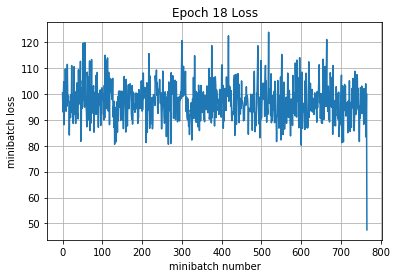

Iteration 13800: with minibatch training loss = 1.63 and accuracy of 0.38
Iteration 13900: with minibatch training loss = 1.46 and accuracy of 0.52
Iteration 14000: with minibatch training loss = 1.57 and accuracy of 0.41
Iteration 14100: with minibatch training loss = 1.43 and accuracy of 0.53
Iteration 14200: with minibatch training loss = 1.63 and accuracy of 0.44
Iteration 14300: with minibatch training loss = 1.57 and accuracy of 0.45
Iteration 14400: with minibatch training loss = 1.74 and accuracy of 0.36
Iteration 14500: with minibatch training loss = 1.37 and accuracy of 0.52
Epoch 19, Overall loss = 1.49 and accuracy of 0.475


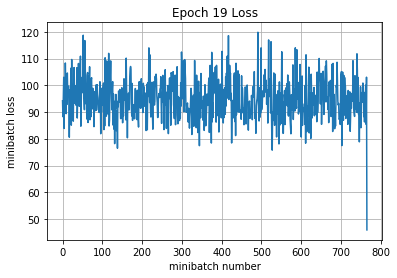

Iteration 14600: with minibatch training loss = 1.32 and accuracy of 0.55
Iteration 14700: with minibatch training loss = 1.36 and accuracy of 0.61
Iteration 14800: with minibatch training loss = 1.52 and accuracy of 0.42
Iteration 14900: with minibatch training loss = 1.55 and accuracy of 0.44
Iteration 15000: with minibatch training loss = 1.37 and accuracy of 0.52
Iteration 15100: with minibatch training loss = 1.4 and accuracy of 0.47
Iteration 15200: with minibatch training loss = 1.61 and accuracy of 0.5
Iteration 15300: with minibatch training loss = 1.22 and accuracy of 0.61
Epoch 20, Overall loss = 1.46 and accuracy of 0.486


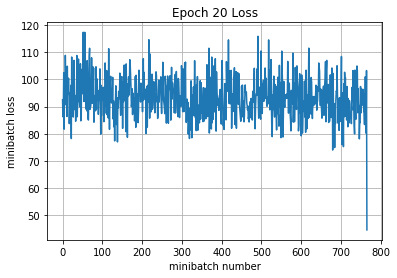

Iteration 15400: with minibatch training loss = 1.49 and accuracy of 0.44
Iteration 15500: with minibatch training loss = 1.38 and accuracy of 0.45
Iteration 15600: with minibatch training loss = 1.52 and accuracy of 0.55
Iteration 15700: with minibatch training loss = 1.43 and accuracy of 0.5
Iteration 15800: with minibatch training loss = 1.36 and accuracy of 0.53
Iteration 15900: with minibatch training loss = 1.36 and accuracy of 0.56
Iteration 16000: with minibatch training loss = 1.72 and accuracy of 0.39
Epoch 21, Overall loss = 1.43 and accuracy of 0.5


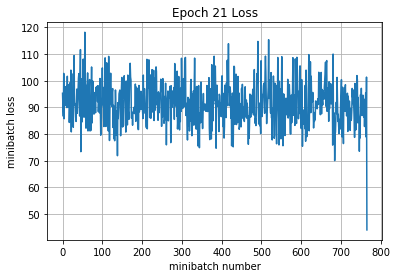

Iteration 16100: with minibatch training loss = 1.39 and accuracy of 0.48
Iteration 16200: with minibatch training loss = 1.33 and accuracy of 0.48
Iteration 16300: with minibatch training loss = 1.35 and accuracy of 0.55
Iteration 16400: with minibatch training loss = 1.21 and accuracy of 0.66
Iteration 16500: with minibatch training loss = 1.56 and accuracy of 0.47
Iteration 16600: with minibatch training loss = 1.34 and accuracy of 0.48
Iteration 16700: with minibatch training loss = 1.24 and accuracy of 0.58
Iteration 16800: with minibatch training loss = 1.28 and accuracy of 0.59
Epoch 22, Overall loss = 1.4 and accuracy of 0.512


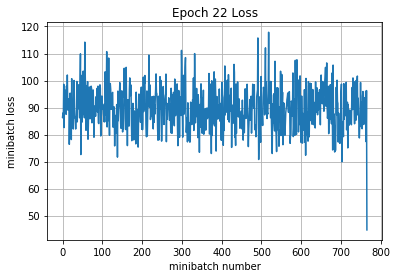

Iteration 16900: with minibatch training loss = 1.45 and accuracy of 0.52
Iteration 17000: with minibatch training loss = 1.44 and accuracy of 0.55
Iteration 17100: with minibatch training loss = 1.35 and accuracy of 0.53
Iteration 17200: with minibatch training loss = 1.41 and accuracy of 0.47
Iteration 17300: with minibatch training loss = 1.35 and accuracy of 0.53
Iteration 17400: with minibatch training loss = 1.55 and accuracy of 0.56
Iteration 17500: with minibatch training loss = 1.49 and accuracy of 0.47
Iteration 17600: with minibatch training loss = 1.24 and accuracy of 0.61
Epoch 23, Overall loss = 1.38 and accuracy of 0.527


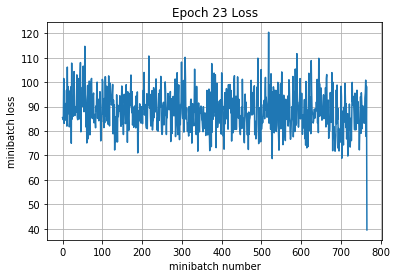

Iteration 17700: with minibatch training loss = 1.42 and accuracy of 0.52
Iteration 17800: with minibatch training loss = 1.25 and accuracy of 0.64
Iteration 17900: with minibatch training loss = 1.5 and accuracy of 0.5
Iteration 18000: with minibatch training loss = 1.34 and accuracy of 0.55
Iteration 18100: with minibatch training loss = 1.47 and accuracy of 0.53
Iteration 18200: with minibatch training loss = 1.39 and accuracy of 0.52
Iteration 18300: with minibatch training loss = 1.25 and accuracy of 0.61
Epoch 24, Overall loss = 1.35 and accuracy of 0.538


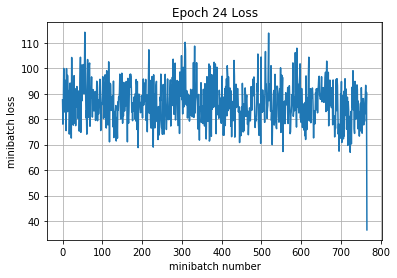

Iteration 18400: with minibatch training loss = 1.44 and accuracy of 0.5
Iteration 18500: with minibatch training loss = 1.59 and accuracy of 0.45
Iteration 18600: with minibatch training loss = 1.4 and accuracy of 0.5
Iteration 18700: with minibatch training loss = 1.22 and accuracy of 0.53
Iteration 18800: with minibatch training loss = 1.35 and accuracy of 0.5
Iteration 18900: with minibatch training loss = 1.32 and accuracy of 0.56
Iteration 19000: with minibatch training loss = 1.31 and accuracy of 0.52
Iteration 19100: with minibatch training loss = 1.37 and accuracy of 0.53
Epoch 25, Overall loss = 1.33 and accuracy of 0.548


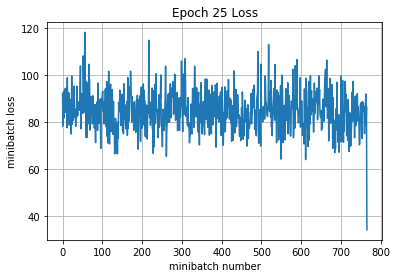

Iteration 19200: with minibatch training loss = 1.48 and accuracy of 0.55
Iteration 19300: with minibatch training loss = 1.29 and accuracy of 0.61
Iteration 19400: with minibatch training loss = 1.24 and accuracy of 0.56
Iteration 19500: with minibatch training loss = 1.26 and accuracy of 0.59
Iteration 19600: with minibatch training loss = 1.55 and accuracy of 0.48
Iteration 19700: with minibatch training loss = 1.38 and accuracy of 0.47
Iteration 19800: with minibatch training loss = 1.38 and accuracy of 0.48
Iteration 19900: with minibatch training loss = 1.2 and accuracy of 0.64
Epoch 26, Overall loss = 1.3 and accuracy of 0.561


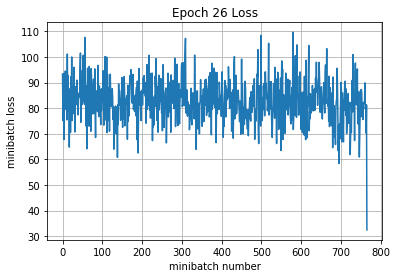

Iteration 20000: with minibatch training loss = 1.32 and accuracy of 0.61
Iteration 20100: with minibatch training loss = 1.14 and accuracy of 0.62
Iteration 20200: with minibatch training loss = 1.21 and accuracy of 0.58
Iteration 20300: with minibatch training loss = 1.58 and accuracy of 0.44
Iteration 20400: with minibatch training loss = 1.32 and accuracy of 0.5
Iteration 20500: with minibatch training loss = 1.28 and accuracy of 0.55
Iteration 20600: with minibatch training loss = 0.992 and accuracy of 0.64
Epoch 27, Overall loss = 1.28 and accuracy of 0.569


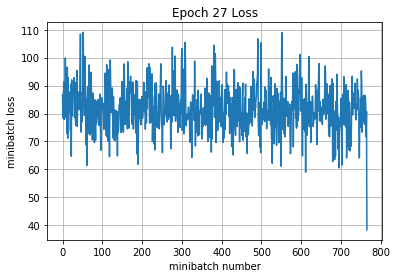

Iteration 20700: with minibatch training loss = 1.16 and accuracy of 0.61
Iteration 20800: with minibatch training loss = 1.14 and accuracy of 0.66
Iteration 20900: with minibatch training loss = 1.33 and accuracy of 0.58
Iteration 21000: with minibatch training loss = 1.19 and accuracy of 0.59
Iteration 21100: with minibatch training loss = 1.27 and accuracy of 0.59
Iteration 21200: with minibatch training loss = 1.59 and accuracy of 0.45
Iteration 21300: with minibatch training loss = 1.4 and accuracy of 0.53
Iteration 21400: with minibatch training loss = 1.32 and accuracy of 0.48
Epoch 28, Overall loss = 1.25 and accuracy of 0.579


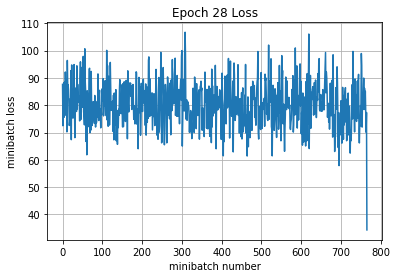

Iteration 21500: with minibatch training loss = 1.46 and accuracy of 0.47
Iteration 21600: with minibatch training loss = 1.25 and accuracy of 0.59
Iteration 21700: with minibatch training loss = 1.25 and accuracy of 0.58
Iteration 21800: with minibatch training loss = 1.12 and accuracy of 0.72
Iteration 21900: with minibatch training loss = 1.4 and accuracy of 0.53
Iteration 22000: with minibatch training loss = 1.3 and accuracy of 0.58
Iteration 22100: with minibatch training loss = 1.13 and accuracy of 0.69
Iteration 22200: with minibatch training loss = 1.31 and accuracy of 0.53
Epoch 29, Overall loss = 1.23 and accuracy of 0.592


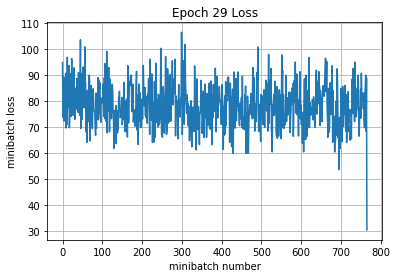

Iteration 22300: with minibatch training loss = 1.15 and accuracy of 0.66
Iteration 22400: with minibatch training loss = 1.39 and accuracy of 0.52
Iteration 22500: with minibatch training loss = 1.32 and accuracy of 0.5
Iteration 22600: with minibatch training loss = 0.981 and accuracy of 0.72
Iteration 22700: with minibatch training loss = 1.23 and accuracy of 0.59
Iteration 22800: with minibatch training loss = 1.32 and accuracy of 0.55
Iteration 22900: with minibatch training loss = 0.986 and accuracy of 0.7
Epoch 30, Overall loss = 1.2 and accuracy of 0.6


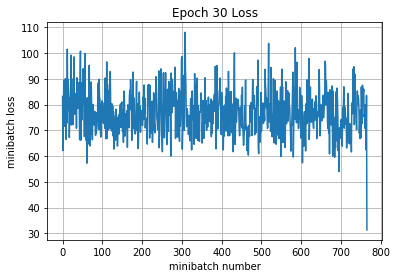

Iteration 23000: with minibatch training loss = 1.05 and accuracy of 0.66
Iteration 23100: with minibatch training loss = 1.31 and accuracy of 0.56
Iteration 23200: with minibatch training loss = 1.4 and accuracy of 0.62
Iteration 23300: with minibatch training loss = 1.14 and accuracy of 0.61
Iteration 23400: with minibatch training loss = 1.03 and accuracy of 0.62
Iteration 23500: with minibatch training loss = 1.18 and accuracy of 0.58
Iteration 23600: with minibatch training loss = 1.11 and accuracy of 0.64
Iteration 23700: with minibatch training loss = 0.935 and accuracy of 0.7
Epoch 31, Overall loss = 1.18 and accuracy of 0.608


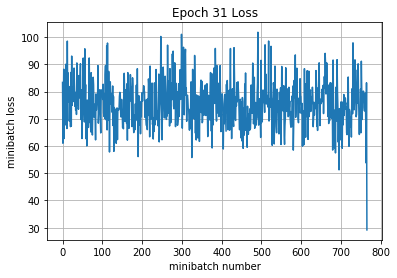

Iteration 23800: with minibatch training loss = 1.24 and accuracy of 0.59
Iteration 23900: with minibatch training loss = 1.29 and accuracy of 0.62
Iteration 24000: with minibatch training loss = 1.29 and accuracy of 0.5
Iteration 24100: with minibatch training loss = 1.12 and accuracy of 0.7
Iteration 24200: with minibatch training loss = 0.966 and accuracy of 0.73
Iteration 24300: with minibatch training loss = 0.992 and accuracy of 0.7
Iteration 24400: with minibatch training loss = 1.16 and accuracy of 0.66
Iteration 24500: with minibatch training loss = 1.26 and accuracy of 0.58
Epoch 32, Overall loss = 1.16 and accuracy of 0.617


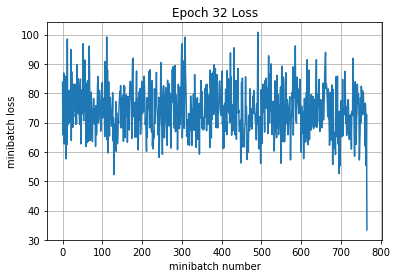

Iteration 24600: with minibatch training loss = 1.14 and accuracy of 0.64
Iteration 24700: with minibatch training loss = 1.21 and accuracy of 0.58
Iteration 24800: with minibatch training loss = 1.24 and accuracy of 0.55
Iteration 24900: with minibatch training loss = 1.48 and accuracy of 0.5
Iteration 25000: with minibatch training loss = 1.16 and accuracy of 0.59
Iteration 25100: with minibatch training loss = 1.1 and accuracy of 0.69
Iteration 25200: with minibatch training loss = 1.02 and accuracy of 0.66
Epoch 33, Overall loss = 1.14 and accuracy of 0.626


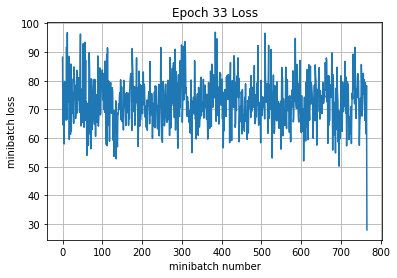

Iteration 25300: with minibatch training loss = 1.08 and accuracy of 0.66
Iteration 25400: with minibatch training loss = 1.15 and accuracy of 0.59
Iteration 25500: with minibatch training loss = 1.15 and accuracy of 0.61
Iteration 25600: with minibatch training loss = 1.16 and accuracy of 0.66
Iteration 25700: with minibatch training loss = 1.31 and accuracy of 0.45
Iteration 25800: with minibatch training loss = 1.13 and accuracy of 0.69
Iteration 25900: with minibatch training loss = 1.23 and accuracy of 0.53
Iteration 26000: with minibatch training loss = 0.863 and accuracy of 0.7
Epoch 34, Overall loss = 1.12 and accuracy of 0.631


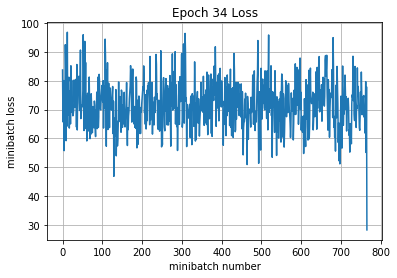

Iteration 26100: with minibatch training loss = 1.45 and accuracy of 0.52
Iteration 26200: with minibatch training loss = 1.04 and accuracy of 0.66
Iteration 26300: with minibatch training loss = 0.938 and accuracy of 0.7
Iteration 26400: with minibatch training loss = 0.94 and accuracy of 0.69
Iteration 26500: with minibatch training loss = 1.02 and accuracy of 0.64
Iteration 26600: with minibatch training loss = 1.18 and accuracy of 0.55
Iteration 26700: with minibatch training loss = 1.19 and accuracy of 0.58
Iteration 26800: with minibatch training loss = 1.2 and accuracy of 0.62
Epoch 35, Overall loss = 1.1 and accuracy of 0.639


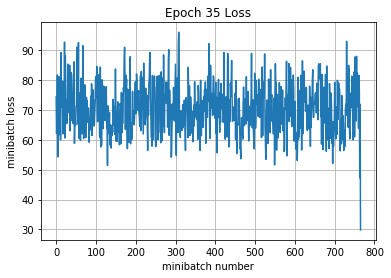

Iteration 26900: with minibatch training loss = 1.03 and accuracy of 0.64
Iteration 27000: with minibatch training loss = 0.89 and accuracy of 0.67
Iteration 27100: with minibatch training loss = 0.969 and accuracy of 0.58
Iteration 27200: with minibatch training loss = 0.976 and accuracy of 0.62
Iteration 27300: with minibatch training loss = 1.19 and accuracy of 0.55
Iteration 27400: with minibatch training loss = 1 and accuracy of 0.73
Iteration 27500: with minibatch training loss = 1.07 and accuracy of 0.64
Epoch 36, Overall loss = 1.08 and accuracy of 0.646


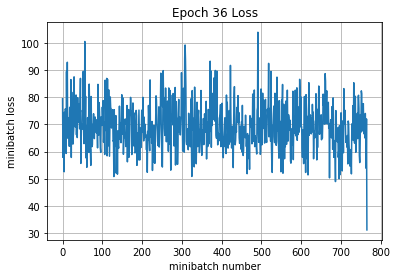

Iteration 27600: with minibatch training loss = 1.06 and accuracy of 0.67
Iteration 27700: with minibatch training loss = 1.11 and accuracy of 0.64
Iteration 27800: with minibatch training loss = 1.02 and accuracy of 0.72
Iteration 27900: with minibatch training loss = 0.94 and accuracy of 0.69
Iteration 28000: with minibatch training loss = 1.12 and accuracy of 0.59
Iteration 28100: with minibatch training loss = 1.43 and accuracy of 0.53
Iteration 28200: with minibatch training loss = 0.976 and accuracy of 0.72
Iteration 28300: with minibatch training loss = 0.966 and accuracy of 0.73
Epoch 37, Overall loss = 1.07 and accuracy of 0.653


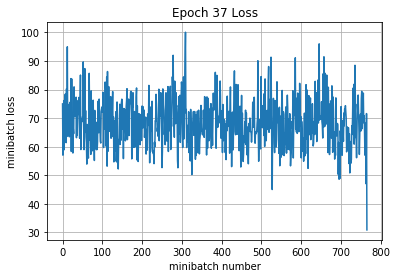

Iteration 28400: with minibatch training loss = 1.22 and accuracy of 0.56
Iteration 28500: with minibatch training loss = 0.953 and accuracy of 0.72
Iteration 28600: with minibatch training loss = 1.02 and accuracy of 0.69
Iteration 28700: with minibatch training loss = 1.11 and accuracy of 0.66
Iteration 28800: with minibatch training loss = 1.01 and accuracy of 0.61
Iteration 28900: with minibatch training loss = 0.997 and accuracy of 0.73
Iteration 29000: with minibatch training loss = 1.06 and accuracy of 0.61
Iteration 29100: with minibatch training loss = 1.03 and accuracy of 0.66
Epoch 38, Overall loss = 1.06 and accuracy of 0.657


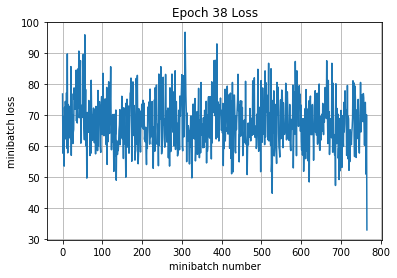

Iteration 29200: with minibatch training loss = 1.11 and accuracy of 0.64
Iteration 29300: with minibatch training loss = 0.998 and accuracy of 0.66
Iteration 29400: with minibatch training loss = 0.978 and accuracy of 0.66
Iteration 29500: with minibatch training loss = 1.11 and accuracy of 0.61
Iteration 29600: with minibatch training loss = 0.982 and accuracy of 0.67
Iteration 29700: with minibatch training loss = 0.949 and accuracy of 0.7
Iteration 29800: with minibatch training loss = 1.15 and accuracy of 0.62
Epoch 39, Overall loss = 1.04 and accuracy of 0.664


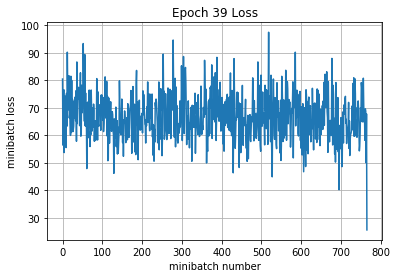

Iteration 29900: with minibatch training loss = 0.877 and accuracy of 0.77
Iteration 30000: with minibatch training loss = 1.17 and accuracy of 0.58
Iteration 30100: with minibatch training loss = 0.868 and accuracy of 0.66
Iteration 30200: with minibatch training loss = 1.1 and accuracy of 0.59
Iteration 30300: with minibatch training loss = 1.02 and accuracy of 0.64
Iteration 30400: with minibatch training loss = 0.817 and accuracy of 0.77
Iteration 30500: with minibatch training loss = 0.94 and accuracy of 0.7
Iteration 30600: with minibatch training loss = 0.81 and accuracy of 0.78
Epoch 40, Overall loss = 1.03 and accuracy of 0.669


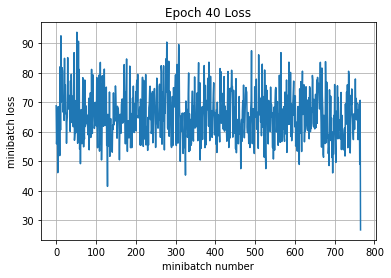

Iteration 30700: with minibatch training loss = 1.17 and accuracy of 0.66
Iteration 30800: with minibatch training loss = 1.02 and accuracy of 0.69
Iteration 30900: with minibatch training loss = 1.04 and accuracy of 0.64
Iteration 31000: with minibatch training loss = 0.889 and accuracy of 0.73
Iteration 31100: with minibatch training loss = 1.22 and accuracy of 0.64
Iteration 31200: with minibatch training loss = 0.905 and accuracy of 0.75
Iteration 31300: with minibatch training loss = 1.26 and accuracy of 0.62
Iteration 31400: with minibatch training loss = 0.99 and accuracy of 0.73
Epoch 41, Overall loss = 1.02 and accuracy of 0.674


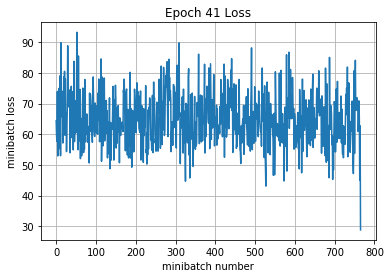

Iteration 31500: with minibatch training loss = 0.967 and accuracy of 0.61
Iteration 31600: with minibatch training loss = 1.11 and accuracy of 0.69
Iteration 31700: with minibatch training loss = 0.831 and accuracy of 0.75
Iteration 31800: with minibatch training loss = 0.97 and accuracy of 0.69
Iteration 31900: with minibatch training loss = 0.987 and accuracy of 0.69
Iteration 32000: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 32100: with minibatch training loss = 0.873 and accuracy of 0.73
Epoch 42, Overall loss = 1 and accuracy of 0.679


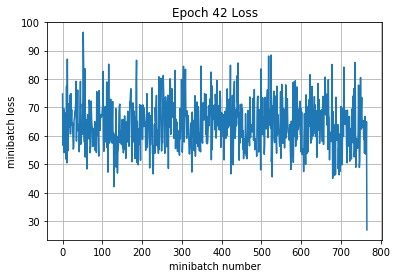

Iteration 32200: with minibatch training loss = 0.987 and accuracy of 0.7
Iteration 32300: with minibatch training loss = 0.957 and accuracy of 0.69
Iteration 32400: with minibatch training loss = 0.762 and accuracy of 0.81
Iteration 32500: with minibatch training loss = 0.979 and accuracy of 0.73
Iteration 32600: with minibatch training loss = 0.932 and accuracy of 0.69
Iteration 32700: with minibatch training loss = 1.06 and accuracy of 0.7
Iteration 32800: with minibatch training loss = 1.16 and accuracy of 0.64
Iteration 32900: with minibatch training loss = 1.1 and accuracy of 0.66
Epoch 43, Overall loss = 0.982 and accuracy of 0.687


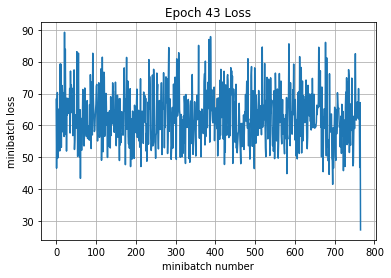

Iteration 33000: with minibatch training loss = 0.864 and accuracy of 0.78
Iteration 33100: with minibatch training loss = 1.06 and accuracy of 0.72
Iteration 33200: with minibatch training loss = 0.87 and accuracy of 0.72
Iteration 33300: with minibatch training loss = 0.912 and accuracy of 0.69
Iteration 33400: with minibatch training loss = 0.734 and accuracy of 0.73
Iteration 33500: with minibatch training loss = 0.867 and accuracy of 0.77
Iteration 33600: with minibatch training loss = 1.03 and accuracy of 0.72
Iteration 33700: with minibatch training loss = 0.937 and accuracy of 0.64
Epoch 44, Overall loss = 0.973 and accuracy of 0.69


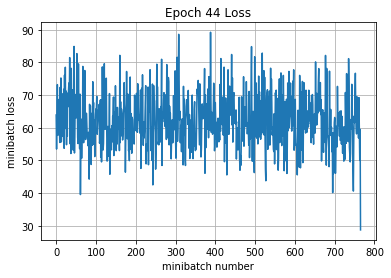

Iteration 33800: with minibatch training loss = 0.918 and accuracy of 0.67
Iteration 33900: with minibatch training loss = 0.839 and accuracy of 0.72
Iteration 34000: with minibatch training loss = 0.909 and accuracy of 0.72
Iteration 34100: with minibatch training loss = 1.06 and accuracy of 0.73
Iteration 34200: with minibatch training loss = 0.908 and accuracy of 0.69
Iteration 34300: with minibatch training loss = 1.08 and accuracy of 0.67
Iteration 34400: with minibatch training loss = 0.942 and accuracy of 0.7
Epoch 45, Overall loss = 0.951 and accuracy of 0.701


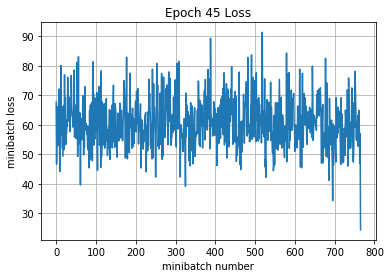

Iteration 34500: with minibatch training loss = 0.919 and accuracy of 0.72
Iteration 34600: with minibatch training loss = 0.971 and accuracy of 0.66
Iteration 34700: with minibatch training loss = 0.88 and accuracy of 0.75
Iteration 34800: with minibatch training loss = 0.863 and accuracy of 0.75
Iteration 34900: with minibatch training loss = 0.994 and accuracy of 0.66
Iteration 35000: with minibatch training loss = 1.16 and accuracy of 0.62
Iteration 35100: with minibatch training loss = 0.847 and accuracy of 0.77
Iteration 35200: with minibatch training loss = 1.06 and accuracy of 0.66
Epoch 46, Overall loss = 0.947 and accuracy of 0.701


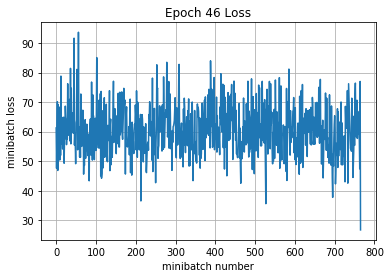

Iteration 35300: with minibatch training loss = 0.819 and accuracy of 0.8
Iteration 35400: with minibatch training loss = 0.995 and accuracy of 0.66
Iteration 35500: with minibatch training loss = 1.05 and accuracy of 0.69
Iteration 35600: with minibatch training loss = 0.794 and accuracy of 0.77
Iteration 35700: with minibatch training loss = 0.634 and accuracy of 0.81
Iteration 35800: with minibatch training loss = 1 and accuracy of 0.67
Iteration 35900: with minibatch training loss = 1.1 and accuracy of 0.66
Iteration 36000: with minibatch training loss = 0.915 and accuracy of 0.66
Epoch 47, Overall loss = 0.936 and accuracy of 0.704


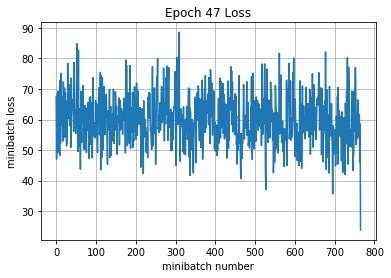

Iteration 36100: with minibatch training loss = 1.07 and accuracy of 0.66
Iteration 36200: with minibatch training loss = 1.04 and accuracy of 0.77
Iteration 36300: with minibatch training loss = 1.07 and accuracy of 0.67
Iteration 36400: with minibatch training loss = 0.771 and accuracy of 0.75
Iteration 36500: with minibatch training loss = 0.785 and accuracy of 0.77
Iteration 36600: with minibatch training loss = 0.721 and accuracy of 0.77
Iteration 36700: with minibatch training loss = 0.847 and accuracy of 0.75
Epoch 48, Overall loss = 0.925 and accuracy of 0.71


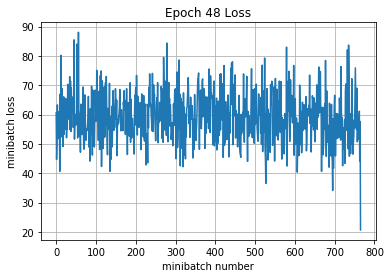

Iteration 36800: with minibatch training loss = 1.02 and accuracy of 0.62
Iteration 36900: with minibatch training loss = 0.949 and accuracy of 0.72
Iteration 37000: with minibatch training loss = 0.669 and accuracy of 0.83
Iteration 37100: with minibatch training loss = 0.916 and accuracy of 0.78
Iteration 37200: with minibatch training loss = 1.24 and accuracy of 0.56
Iteration 37300: with minibatch training loss = 0.87 and accuracy of 0.8
Iteration 37400: with minibatch training loss = 0.899 and accuracy of 0.77
Iteration 37500: with minibatch training loss = 1.2 and accuracy of 0.67
Epoch 49, Overall loss = 0.916 and accuracy of 0.713


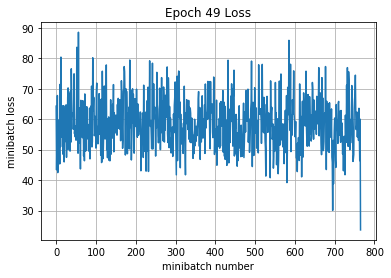

Iteration 37600: with minibatch training loss = 0.852 and accuracy of 0.78
Iteration 37700: with minibatch training loss = 0.832 and accuracy of 0.78
Iteration 37800: with minibatch training loss = 0.735 and accuracy of 0.77
Iteration 37900: with minibatch training loss = 0.999 and accuracy of 0.64
Iteration 38000: with minibatch training loss = 0.962 and accuracy of 0.72
Iteration 38100: with minibatch training loss = 0.778 and accuracy of 0.72
Iteration 38200: with minibatch training loss = 0.797 and accuracy of 0.78
Epoch 50, Overall loss = 0.9 and accuracy of 0.719


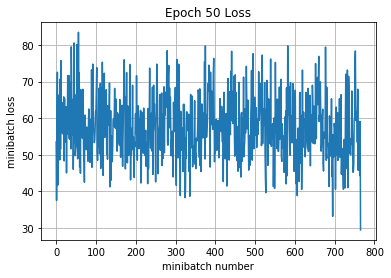

Iteration 38300: with minibatch training loss = 1.01 and accuracy of 0.69
Iteration 38400: with minibatch training loss = 0.896 and accuracy of 0.72
Iteration 38500: with minibatch training loss = 1.13 and accuracy of 0.62
Iteration 38600: with minibatch training loss = 1.09 and accuracy of 0.7
Iteration 38700: with minibatch training loss = 0.913 and accuracy of 0.7
Iteration 38800: with minibatch training loss = 0.962 and accuracy of 0.67
Iteration 38900: with minibatch training loss = 0.882 and accuracy of 0.7
Iteration 39000: with minibatch training loss = 0.967 and accuracy of 0.69
Epoch 51, Overall loss = 0.901 and accuracy of 0.718


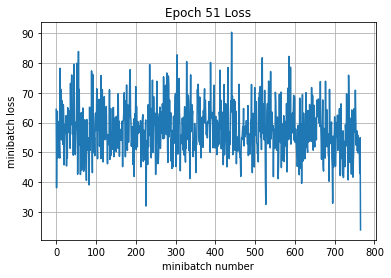

Iteration 39100: with minibatch training loss = 1.01 and accuracy of 0.72
Iteration 39200: with minibatch training loss = 1.05 and accuracy of 0.72
Iteration 39300: with minibatch training loss = 0.908 and accuracy of 0.72
Iteration 39400: with minibatch training loss = 0.612 and accuracy of 0.83
Iteration 39500: with minibatch training loss = 0.741 and accuracy of 0.78
Iteration 39600: with minibatch training loss = 1.02 and accuracy of 0.69
Iteration 39700: with minibatch training loss = 0.848 and accuracy of 0.72
Iteration 39800: with minibatch training loss = 0.804 and accuracy of 0.78
Epoch 52, Overall loss = 0.882 and accuracy of 0.723


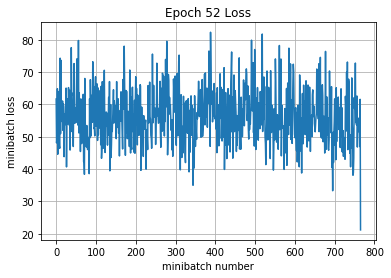

Iteration 39900: with minibatch training loss = 1.03 and accuracy of 0.62
Iteration 40000: with minibatch training loss = 0.848 and accuracy of 0.73
Iteration 40100: with minibatch training loss = 0.973 and accuracy of 0.67
Iteration 40200: with minibatch training loss = 0.819 and accuracy of 0.77
Iteration 40300: with minibatch training loss = 0.947 and accuracy of 0.67
Iteration 40400: with minibatch training loss = 0.846 and accuracy of 0.73
Iteration 40500: with minibatch training loss = 1.05 and accuracy of 0.61
Epoch 53, Overall loss = 0.877 and accuracy of 0.729


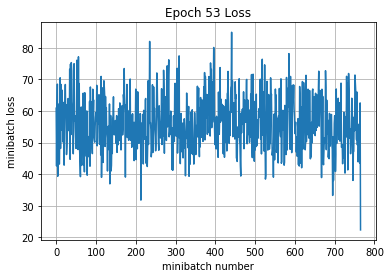

Iteration 40600: with minibatch training loss = 0.847 and accuracy of 0.69
Iteration 40700: with minibatch training loss = 1.13 and accuracy of 0.62
Iteration 40800: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 40900: with minibatch training loss = 0.654 and accuracy of 0.84
Iteration 41000: with minibatch training loss = 0.873 and accuracy of 0.7
Iteration 41100: with minibatch training loss = 0.835 and accuracy of 0.7
Iteration 41200: with minibatch training loss = 0.718 and accuracy of 0.8
Iteration 41300: with minibatch training loss = 0.595 and accuracy of 0.88
Epoch 54, Overall loss = 0.87 and accuracy of 0.729


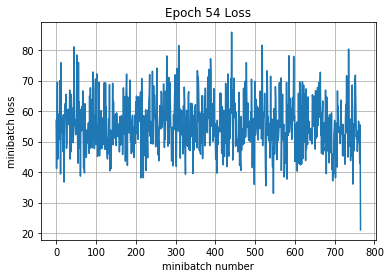

Iteration 41400: with minibatch training loss = 1.12 and accuracy of 0.62
Iteration 41500: with minibatch training loss = 0.723 and accuracy of 0.72
Iteration 41600: with minibatch training loss = 0.808 and accuracy of 0.75
Iteration 41700: with minibatch training loss = 0.716 and accuracy of 0.75
Iteration 41800: with minibatch training loss = 0.869 and accuracy of 0.7
Iteration 41900: with minibatch training loss = 0.782 and accuracy of 0.8
Iteration 42000: with minibatch training loss = 0.877 and accuracy of 0.66
Iteration 42100: with minibatch training loss = 0.833 and accuracy of 0.77
Epoch 55, Overall loss = 0.854 and accuracy of 0.733


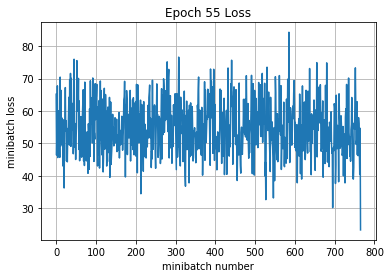

Iteration 42200: with minibatch training loss = 0.779 and accuracy of 0.72
Iteration 42300: with minibatch training loss = 0.986 and accuracy of 0.69
Iteration 42400: with minibatch training loss = 1.21 and accuracy of 0.58
Iteration 42500: with minibatch training loss = 1.02 and accuracy of 0.67
Iteration 42600: with minibatch training loss = 0.935 and accuracy of 0.66
Iteration 42700: with minibatch training loss = 0.746 and accuracy of 0.81
Iteration 42800: with minibatch training loss = 0.996 and accuracy of 0.72
Epoch 56, Overall loss = 0.857 and accuracy of 0.734


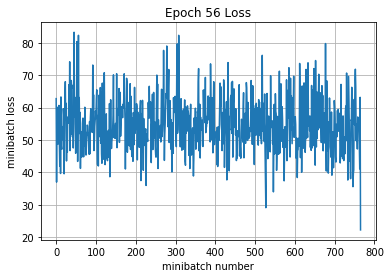

Iteration 42900: with minibatch training loss = 0.683 and accuracy of 0.78
Iteration 43000: with minibatch training loss = 0.818 and accuracy of 0.73
Iteration 43100: with minibatch training loss = 0.635 and accuracy of 0.8
Iteration 43200: with minibatch training loss = 1.03 and accuracy of 0.72
Iteration 43300: with minibatch training loss = 0.637 and accuracy of 0.83
Iteration 43400: with minibatch training loss = 0.996 and accuracy of 0.64
Iteration 43500: with minibatch training loss = 0.661 and accuracy of 0.8
Iteration 43600: with minibatch training loss = 0.963 and accuracy of 0.66
Epoch 57, Overall loss = 0.847 and accuracy of 0.737


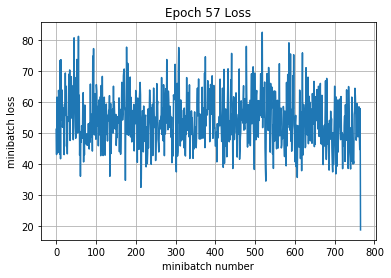

Iteration 43700: with minibatch training loss = 1.09 and accuracy of 0.67
Iteration 43800: with minibatch training loss = 0.62 and accuracy of 0.84
Iteration 43900: with minibatch training loss = 0.78 and accuracy of 0.81
Iteration 44000: with minibatch training loss = 0.947 and accuracy of 0.7
Iteration 44100: with minibatch training loss = 0.891 and accuracy of 0.72
Iteration 44200: with minibatch training loss = 0.719 and accuracy of 0.77
Iteration 44300: with minibatch training loss = 0.881 and accuracy of 0.7
Iteration 44400: with minibatch training loss = 0.801 and accuracy of 0.78
Epoch 58, Overall loss = 0.837 and accuracy of 0.743


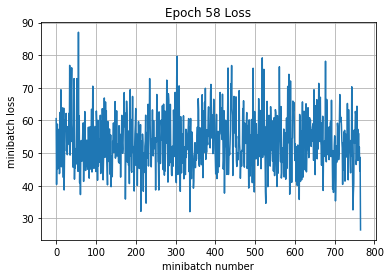

Iteration 44500: with minibatch training loss = 0.928 and accuracy of 0.72
Iteration 44600: with minibatch training loss = 0.936 and accuracy of 0.73
Iteration 44700: with minibatch training loss = 0.63 and accuracy of 0.86
Iteration 44800: with minibatch training loss = 0.739 and accuracy of 0.8
Iteration 44900: with minibatch training loss = 0.72 and accuracy of 0.75
Iteration 45000: with minibatch training loss = 0.731 and accuracy of 0.73
Iteration 45100: with minibatch training loss = 0.691 and accuracy of 0.83
Epoch 59, Overall loss = 0.83 and accuracy of 0.743


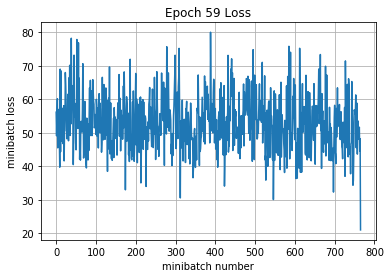

Iteration 45200: with minibatch training loss = 0.884 and accuracy of 0.75
Iteration 45300: with minibatch training loss = 0.664 and accuracy of 0.77
Iteration 45400: with minibatch training loss = 0.762 and accuracy of 0.77
Iteration 45500: with minibatch training loss = 0.841 and accuracy of 0.72
Iteration 45600: with minibatch training loss = 0.718 and accuracy of 0.8
Iteration 45700: with minibatch training loss = 0.878 and accuracy of 0.7
Iteration 45800: with minibatch training loss = 0.575 and accuracy of 0.83
Iteration 45900: with minibatch training loss = 0.719 and accuracy of 0.77
Epoch 60, Overall loss = 0.825 and accuracy of 0.746


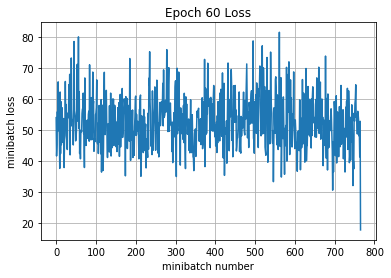

Iteration 46000: with minibatch training loss = 0.803 and accuracy of 0.72
Iteration 46100: with minibatch training loss = 0.81 and accuracy of 0.8
Iteration 46200: with minibatch training loss = 0.632 and accuracy of 0.8
Iteration 46300: with minibatch training loss = 0.671 and accuracy of 0.8
Iteration 46400: with minibatch training loss = 0.973 and accuracy of 0.62
Iteration 46500: with minibatch training loss = 0.929 and accuracy of 0.7
Iteration 46600: with minibatch training loss = 0.844 and accuracy of 0.75
Iteration 46700: with minibatch training loss = 0.507 and accuracy of 0.84
Epoch 61, Overall loss = 0.804 and accuracy of 0.754


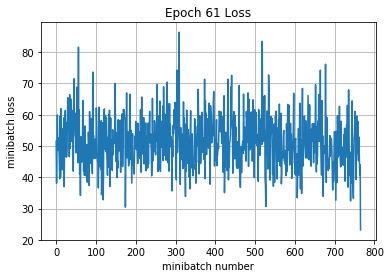

Iteration 46800: with minibatch training loss = 0.557 and accuracy of 0.89
Iteration 46900: with minibatch training loss = 0.674 and accuracy of 0.77
Iteration 47000: with minibatch training loss = 0.94 and accuracy of 0.67
Iteration 47100: with minibatch training loss = 0.625 and accuracy of 0.83
Iteration 47200: with minibatch training loss = 0.826 and accuracy of 0.72
Iteration 47300: with minibatch training loss = 0.58 and accuracy of 0.86
Iteration 47400: with minibatch training loss = 0.704 and accuracy of 0.78
Epoch 62, Overall loss = 0.811 and accuracy of 0.751


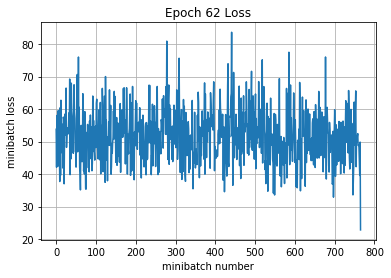

Iteration 47500: with minibatch training loss = 0.757 and accuracy of 0.73
Iteration 47600: with minibatch training loss = 0.959 and accuracy of 0.72
Iteration 47700: with minibatch training loss = 0.88 and accuracy of 0.72
Iteration 47800: with minibatch training loss = 1.2 and accuracy of 0.61
Iteration 47900: with minibatch training loss = 0.684 and accuracy of 0.8
Iteration 48000: with minibatch training loss = 0.679 and accuracy of 0.81
Iteration 48100: with minibatch training loss = 0.679 and accuracy of 0.78
Iteration 48200: with minibatch training loss = 0.671 and accuracy of 0.72
Epoch 63, Overall loss = 0.8 and accuracy of 0.757


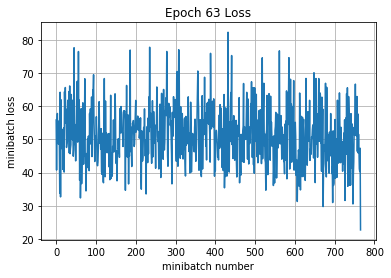

Iteration 48300: with minibatch training loss = 0.66 and accuracy of 0.77
Iteration 48400: with minibatch training loss = 0.806 and accuracy of 0.81
Iteration 48500: with minibatch training loss = 0.876 and accuracy of 0.72
Iteration 48600: with minibatch training loss = 0.802 and accuracy of 0.72
Iteration 48700: with minibatch training loss = 0.75 and accuracy of 0.73
Iteration 48800: with minibatch training loss = 0.82 and accuracy of 0.83
Iteration 48900: with minibatch training loss = 0.848 and accuracy of 0.69
Iteration 49000: with minibatch training loss = 0.653 and accuracy of 0.83
Epoch 64, Overall loss = 0.799 and accuracy of 0.755


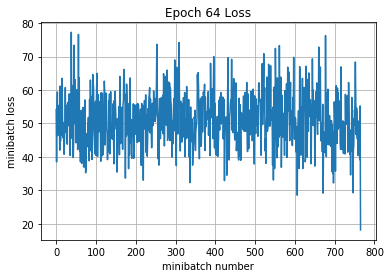

Iteration 49100: with minibatch training loss = 0.673 and accuracy of 0.8
Iteration 49200: with minibatch training loss = 0.765 and accuracy of 0.75
Iteration 49300: with minibatch training loss = 0.749 and accuracy of 0.77
Iteration 49400: with minibatch training loss = 0.69 and accuracy of 0.81
Iteration 49500: with minibatch training loss = 0.791 and accuracy of 0.75
Iteration 49600: with minibatch training loss = 0.794 and accuracy of 0.78
Iteration 49700: with minibatch training loss = 0.768 and accuracy of 0.77
Epoch 65, Overall loss = 0.786 and accuracy of 0.761


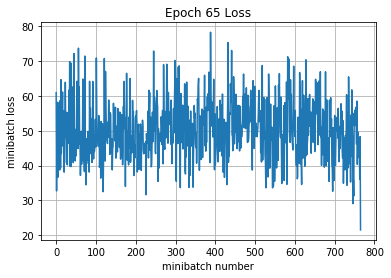

Iteration 49800: with minibatch training loss = 0.997 and accuracy of 0.67
Iteration 49900: with minibatch training loss = 0.786 and accuracy of 0.75
Iteration 50000: with minibatch training loss = 0.842 and accuracy of 0.72
Iteration 50100: with minibatch training loss = 0.877 and accuracy of 0.73
Iteration 50200: with minibatch training loss = 0.741 and accuracy of 0.78
Iteration 50300: with minibatch training loss = 0.89 and accuracy of 0.73
Iteration 50400: with minibatch training loss = 0.709 and accuracy of 0.77
Iteration 50500: with minibatch training loss = 0.732 and accuracy of 0.81
Epoch 66, Overall loss = 0.791 and accuracy of 0.759


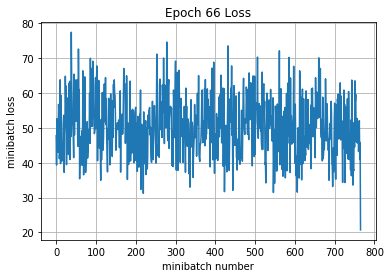

Iteration 50600: with minibatch training loss = 0.71 and accuracy of 0.8
Iteration 50700: with minibatch training loss = 0.967 and accuracy of 0.69
Iteration 50800: with minibatch training loss = 0.716 and accuracy of 0.78
Iteration 50900: with minibatch training loss = 0.461 and accuracy of 0.88
Iteration 51000: with minibatch training loss = 0.618 and accuracy of 0.81
Iteration 51100: with minibatch training loss = 0.647 and accuracy of 0.8
Iteration 51200: with minibatch training loss = 0.906 and accuracy of 0.77
Iteration 51300: with minibatch training loss = 0.92 and accuracy of 0.7
Epoch 67, Overall loss = 0.78 and accuracy of 0.762


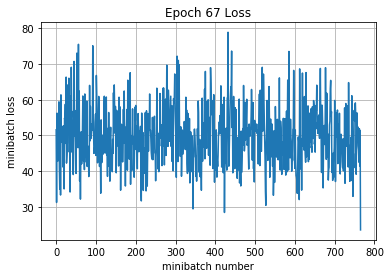

Iteration 51400: with minibatch training loss = 0.692 and accuracy of 0.78
Iteration 51500: with minibatch training loss = 0.736 and accuracy of 0.77
Iteration 51600: with minibatch training loss = 1.04 and accuracy of 0.66
Iteration 51700: with minibatch training loss = 0.681 and accuracy of 0.83
Iteration 51800: with minibatch training loss = 0.873 and accuracy of 0.72
Iteration 51900: with minibatch training loss = 0.761 and accuracy of 0.72
Iteration 52000: with minibatch training loss = 0.79 and accuracy of 0.77
Epoch 68, Overall loss = 0.779 and accuracy of 0.764


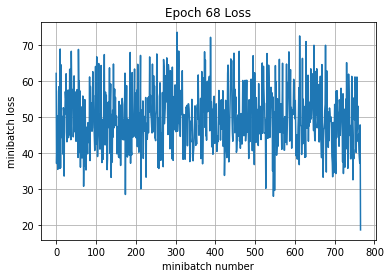

Iteration 52100: with minibatch training loss = 0.926 and accuracy of 0.7
Iteration 52200: with minibatch training loss = 0.649 and accuracy of 0.86
Iteration 52300: with minibatch training loss = 0.838 and accuracy of 0.72
Iteration 52400: with minibatch training loss = 0.565 and accuracy of 0.84
Iteration 52500: with minibatch training loss = 0.942 and accuracy of 0.7
Iteration 52600: with minibatch training loss = 0.845 and accuracy of 0.72
Iteration 52700: with minibatch training loss = 1.12 and accuracy of 0.62
Iteration 52800: with minibatch training loss = 0.833 and accuracy of 0.75
Epoch 69, Overall loss = 0.762 and accuracy of 0.77


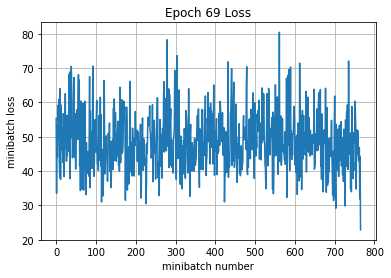

Iteration 52900: with minibatch training loss = 0.763 and accuracy of 0.78
Iteration 53000: with minibatch training loss = 0.846 and accuracy of 0.72
Iteration 53100: with minibatch training loss = 0.778 and accuracy of 0.73
Iteration 53200: with minibatch training loss = 0.703 and accuracy of 0.8
Iteration 53300: with minibatch training loss = 0.891 and accuracy of 0.77
Iteration 53400: with minibatch training loss = 0.461 and accuracy of 0.91
Iteration 53500: with minibatch training loss = 0.849 and accuracy of 0.7
Iteration 53600: with minibatch training loss = 0.486 and accuracy of 0.86
Epoch 70, Overall loss = 0.762 and accuracy of 0.77


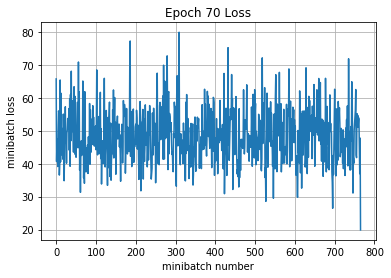

Iteration 53700: with minibatch training loss = 0.656 and accuracy of 0.81
Iteration 53800: with minibatch training loss = 0.838 and accuracy of 0.73
Iteration 53900: with minibatch training loss = 0.645 and accuracy of 0.81
Iteration 54000: with minibatch training loss = 0.728 and accuracy of 0.84
Iteration 54100: with minibatch training loss = 0.672 and accuracy of 0.81
Iteration 54200: with minibatch training loss = 0.626 and accuracy of 0.83
Iteration 54300: with minibatch training loss = 0.841 and accuracy of 0.73
Epoch 71, Overall loss = 0.756 and accuracy of 0.771


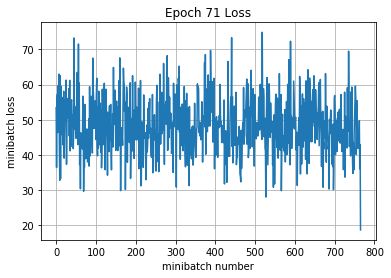

Iteration 54400: with minibatch training loss = 0.793 and accuracy of 0.77
Iteration 54500: with minibatch training loss = 0.578 and accuracy of 0.81
Iteration 54600: with minibatch training loss = 0.509 and accuracy of 0.88
Iteration 54700: with minibatch training loss = 0.716 and accuracy of 0.83
Iteration 54800: with minibatch training loss = 0.923 and accuracy of 0.69
Iteration 54900: with minibatch training loss = 0.88 and accuracy of 0.7
Iteration 55000: with minibatch training loss = 0.619 and accuracy of 0.78
Iteration 55100: with minibatch training loss = 0.61 and accuracy of 0.83
Epoch 72, Overall loss = 0.756 and accuracy of 0.771


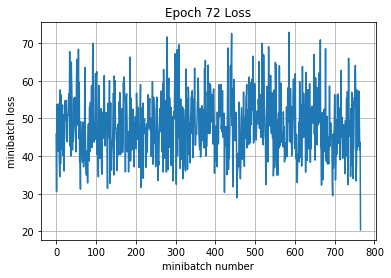

Iteration 55200: with minibatch training loss = 0.77 and accuracy of 0.75
Iteration 55300: with minibatch training loss = 0.736 and accuracy of 0.75
Iteration 55400: with minibatch training loss = 0.784 and accuracy of 0.77
Iteration 55500: with minibatch training loss = 0.768 and accuracy of 0.78
Iteration 55600: with minibatch training loss = 0.807 and accuracy of 0.75
Iteration 55700: with minibatch training loss = 0.779 and accuracy of 0.72
Iteration 55800: with minibatch training loss = 0.827 and accuracy of 0.69
Iteration 55900: with minibatch training loss = 0.626 and accuracy of 0.81
Epoch 73, Overall loss = 0.751 and accuracy of 0.775


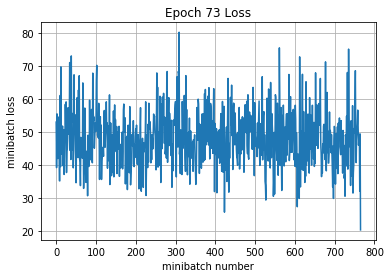

Iteration 56000: with minibatch training loss = 0.634 and accuracy of 0.8
Iteration 56100: with minibatch training loss = 0.605 and accuracy of 0.75
Iteration 56200: with minibatch training loss = 0.94 and accuracy of 0.73
Iteration 56300: with minibatch training loss = 0.89 and accuracy of 0.69
Iteration 56400: with minibatch training loss = 0.986 and accuracy of 0.67
Iteration 56500: with minibatch training loss = 0.815 and accuracy of 0.77
Iteration 56600: with minibatch training loss = 0.665 and accuracy of 0.81
Epoch 74, Overall loss = 0.746 and accuracy of 0.776


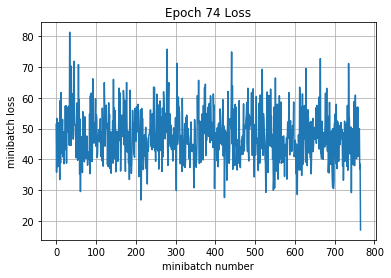

Iteration 56700: with minibatch training loss = 0.733 and accuracy of 0.77
Iteration 56800: with minibatch training loss = 0.782 and accuracy of 0.8
Iteration 56900: with minibatch training loss = 0.675 and accuracy of 0.73
Iteration 57000: with minibatch training loss = 0.703 and accuracy of 0.75
Iteration 57100: with minibatch training loss = 0.771 and accuracy of 0.73
Iteration 57200: with minibatch training loss = 0.718 and accuracy of 0.8
Iteration 57300: with minibatch training loss = 0.809 and accuracy of 0.75
Iteration 57400: with minibatch training loss = 0.829 and accuracy of 0.75
Epoch 75, Overall loss = 0.735 and accuracy of 0.78


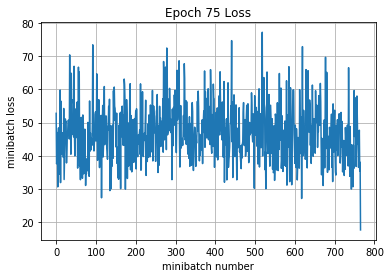

Iteration 57500: with minibatch training loss = 0.626 and accuracy of 0.8
Iteration 57600: with minibatch training loss = 0.568 and accuracy of 0.83
Iteration 57700: with minibatch training loss = 0.594 and accuracy of 0.84
Iteration 57800: with minibatch training loss = 0.696 and accuracy of 0.84
Iteration 57900: with minibatch training loss = 0.643 and accuracy of 0.83
Iteration 58000: with minibatch training loss = 0.775 and accuracy of 0.78
Iteration 58100: with minibatch training loss = 0.768 and accuracy of 0.73
Iteration 58200: with minibatch training loss = 0.673 and accuracy of 0.84
Epoch 76, Overall loss = 0.732 and accuracy of 0.78


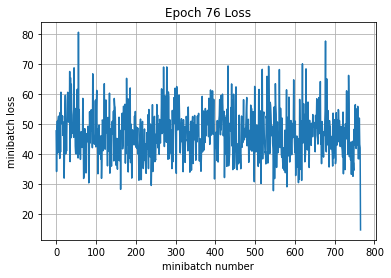

Iteration 58300: with minibatch training loss = 0.938 and accuracy of 0.72
Iteration 58400: with minibatch training loss = 0.589 and accuracy of 0.83
Iteration 58500: with minibatch training loss = 0.605 and accuracy of 0.81
Iteration 58600: with minibatch training loss = 0.866 and accuracy of 0.72
Iteration 58700: with minibatch training loss = 0.688 and accuracy of 0.75
Iteration 58800: with minibatch training loss = 0.734 and accuracy of 0.77
Iteration 58900: with minibatch training loss = 0.615 and accuracy of 0.78
Epoch 77, Overall loss = 0.728 and accuracy of 0.781


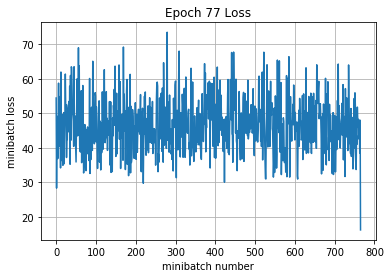

Iteration 59000: with minibatch training loss = 0.749 and accuracy of 0.8
Iteration 59100: with minibatch training loss = 0.52 and accuracy of 0.89
Iteration 59200: with minibatch training loss = 0.663 and accuracy of 0.83
Iteration 59300: with minibatch training loss = 0.65 and accuracy of 0.83
Iteration 59400: with minibatch training loss = 0.82 and accuracy of 0.73
Iteration 59500: with minibatch training loss = 0.962 and accuracy of 0.69
Iteration 59600: with minibatch training loss = 0.699 and accuracy of 0.8
Iteration 59700: with minibatch training loss = 0.659 and accuracy of 0.8
Epoch 78, Overall loss = 0.72 and accuracy of 0.785


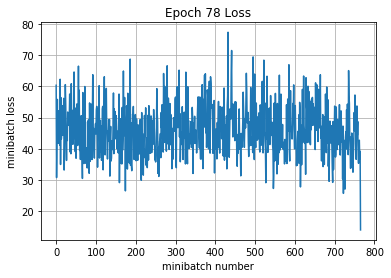

Iteration 59800: with minibatch training loss = 0.849 and accuracy of 0.73
Iteration 59900: with minibatch training loss = 0.722 and accuracy of 0.77
Iteration 60000: with minibatch training loss = 0.735 and accuracy of 0.78
Iteration 60100: with minibatch training loss = 0.639 and accuracy of 0.81
Iteration 60200: with minibatch training loss = 0.846 and accuracy of 0.75
Iteration 60300: with minibatch training loss = 0.849 and accuracy of 0.73
Iteration 60400: with minibatch training loss = 0.822 and accuracy of 0.72
Iteration 60500: with minibatch training loss = 0.801 and accuracy of 0.78
Epoch 79, Overall loss = 0.719 and accuracy of 0.786


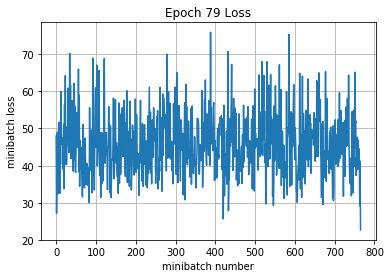

Iteration 60600: with minibatch training loss = 0.835 and accuracy of 0.75
Iteration 60700: with minibatch training loss = 0.936 and accuracy of 0.7
Iteration 60800: with minibatch training loss = 0.737 and accuracy of 0.78
Iteration 60900: with minibatch training loss = 0.726 and accuracy of 0.78
Iteration 61000: with minibatch training loss = 0.754 and accuracy of 0.77
Iteration 61100: with minibatch training loss = 0.662 and accuracy of 0.8
Iteration 61200: with minibatch training loss = 0.594 and accuracy of 0.83
Epoch 80, Overall loss = 0.713 and accuracy of 0.789


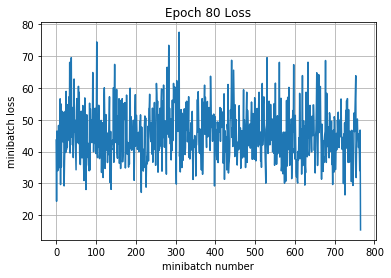

Iteration 61300: with minibatch training loss = 0.442 and accuracy of 0.86
Iteration 61400: with minibatch training loss = 0.76 and accuracy of 0.77
Iteration 61500: with minibatch training loss = 0.675 and accuracy of 0.81
Iteration 61600: with minibatch training loss = 0.702 and accuracy of 0.8
Iteration 61700: with minibatch training loss = 0.439 and accuracy of 0.89
Iteration 61800: with minibatch training loss = 0.65 and accuracy of 0.81
Iteration 61900: with minibatch training loss = 0.588 and accuracy of 0.81
Iteration 62000: with minibatch training loss = 0.599 and accuracy of 0.84
Epoch 81, Overall loss = 0.701 and accuracy of 0.793


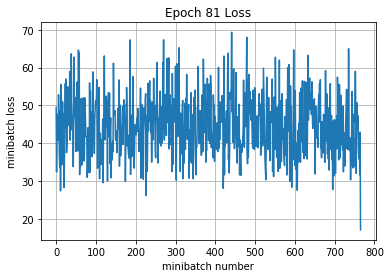

Iteration 62100: with minibatch training loss = 0.642 and accuracy of 0.88
Iteration 62200: with minibatch training loss = 0.702 and accuracy of 0.81
Iteration 62300: with minibatch training loss = 0.9 and accuracy of 0.67
Iteration 62400: with minibatch training loss = 0.677 and accuracy of 0.81
Iteration 62500: with minibatch training loss = 0.505 and accuracy of 0.86
Iteration 62600: with minibatch training loss = 0.572 and accuracy of 0.8
Iteration 62700: with minibatch training loss = 0.675 and accuracy of 0.83
Iteration 62800: with minibatch training loss = 0.538 and accuracy of 0.84
Epoch 82, Overall loss = 0.703 and accuracy of 0.792


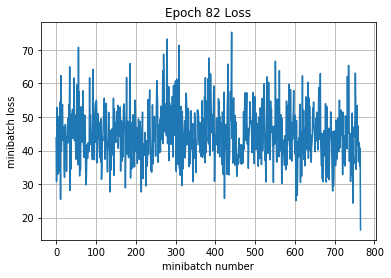

Iteration 62900: with minibatch training loss = 0.643 and accuracy of 0.81
Iteration 63000: with minibatch training loss = 0.692 and accuracy of 0.81
Iteration 63100: with minibatch training loss = 0.926 and accuracy of 0.73
Iteration 63200: with minibatch training loss = 0.964 and accuracy of 0.66
Iteration 63300: with minibatch training loss = 0.627 and accuracy of 0.8
Iteration 63400: with minibatch training loss = 0.604 and accuracy of 0.81
Iteration 63500: with minibatch training loss = 0.695 and accuracy of 0.84
Epoch 83, Overall loss = 0.697 and accuracy of 0.793


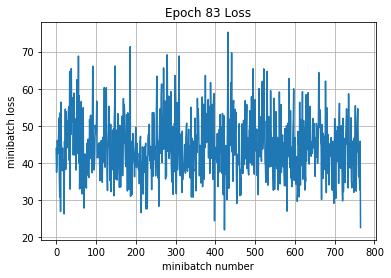

Iteration 63600: with minibatch training loss = 0.731 and accuracy of 0.83
Iteration 63700: with minibatch training loss = 0.553 and accuracy of 0.78
Iteration 63800: with minibatch training loss = 0.723 and accuracy of 0.77
Iteration 63900: with minibatch training loss = 0.716 and accuracy of 0.78
Iteration 64000: with minibatch training loss = 0.771 and accuracy of 0.78
Iteration 64100: with minibatch training loss = 0.925 and accuracy of 0.72
Iteration 64200: with minibatch training loss = 0.857 and accuracy of 0.69
Iteration 64300: with minibatch training loss = 0.531 and accuracy of 0.88
Epoch 84, Overall loss = 0.694 and accuracy of 0.795


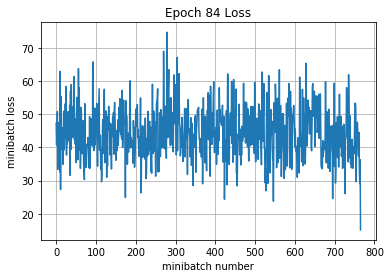

Iteration 64400: with minibatch training loss = 1.04 and accuracy of 0.66
Iteration 64500: with minibatch training loss = 0.601 and accuracy of 0.81
Iteration 64600: with minibatch training loss = 0.57 and accuracy of 0.84
Iteration 64700: with minibatch training loss = 0.887 and accuracy of 0.73
Iteration 64800: with minibatch training loss = 0.583 and accuracy of 0.83
Iteration 64900: with minibatch training loss = 0.771 and accuracy of 0.8
Iteration 65000: with minibatch training loss = 0.599 and accuracy of 0.86
Iteration 65100: with minibatch training loss = 0.724 and accuracy of 0.77
Epoch 85, Overall loss = 0.682 and accuracy of 0.8


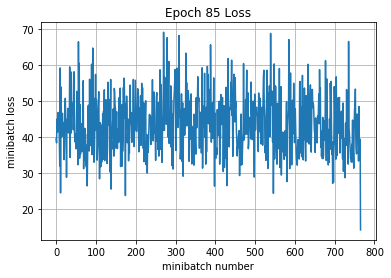

Iteration 65200: with minibatch training loss = 0.563 and accuracy of 0.84
Iteration 65300: with minibatch training loss = 0.554 and accuracy of 0.83
Iteration 65400: with minibatch training loss = 0.707 and accuracy of 0.75
Iteration 65500: with minibatch training loss = 0.675 and accuracy of 0.73
Iteration 65600: with minibatch training loss = 0.89 and accuracy of 0.72
Iteration 65700: with minibatch training loss = 0.674 and accuracy of 0.8
Iteration 65800: with minibatch training loss = 0.673 and accuracy of 0.78
Epoch 86, Overall loss = 0.687 and accuracy of 0.798


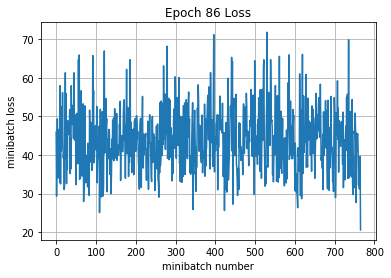

Iteration 65900: with minibatch training loss = 0.775 and accuracy of 0.72
Iteration 66000: with minibatch training loss = 0.676 and accuracy of 0.78
Iteration 66100: with minibatch training loss = 0.907 and accuracy of 0.72
Iteration 66200: with minibatch training loss = 0.506 and accuracy of 0.86
Iteration 66300: with minibatch training loss = 0.791 and accuracy of 0.77
Iteration 66400: with minibatch training loss = 0.805 and accuracy of 0.73
Iteration 66500: with minibatch training loss = 0.672 and accuracy of 0.83
Iteration 66600: with minibatch training loss = 0.569 and accuracy of 0.88
Epoch 87, Overall loss = 0.68 and accuracy of 0.801


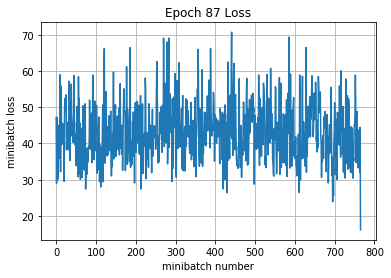

Iteration 66700: with minibatch training loss = 0.884 and accuracy of 0.72
Iteration 66800: with minibatch training loss = 0.752 and accuracy of 0.8
Iteration 66900: with minibatch training loss = 0.513 and accuracy of 0.86
Iteration 67000: with minibatch training loss = 0.782 and accuracy of 0.73
Iteration 67100: with minibatch training loss = 0.596 and accuracy of 0.81
Iteration 67200: with minibatch training loss = 0.612 and accuracy of 0.81
Iteration 67300: with minibatch training loss = 0.701 and accuracy of 0.8
Iteration 67400: with minibatch training loss = 0.755 and accuracy of 0.81
Epoch 88, Overall loss = 0.675 and accuracy of 0.802


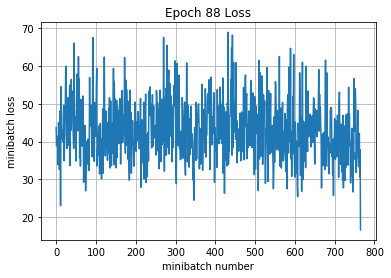

Iteration 67500: with minibatch training loss = 0.827 and accuracy of 0.77
Iteration 67600: with minibatch training loss = 0.668 and accuracy of 0.81
Iteration 67700: with minibatch training loss = 0.787 and accuracy of 0.73
Iteration 67800: with minibatch training loss = 0.708 and accuracy of 0.75
Iteration 67900: with minibatch training loss = 0.695 and accuracy of 0.78
Iteration 68000: with minibatch training loss = 0.552 and accuracy of 0.88
Iteration 68100: with minibatch training loss = 0.599 and accuracy of 0.83
Epoch 89, Overall loss = 0.664 and accuracy of 0.807


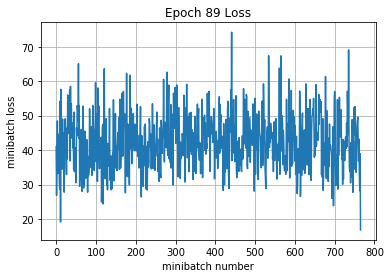

Iteration 68200: with minibatch training loss = 0.614 and accuracy of 0.86
Iteration 68300: with minibatch training loss = 0.767 and accuracy of 0.77
Iteration 68400: with minibatch training loss = 0.569 and accuracy of 0.8
Iteration 68500: with minibatch training loss = 0.746 and accuracy of 0.73
Iteration 68600: with minibatch training loss = 0.469 and accuracy of 0.86
Iteration 68700: with minibatch training loss = 0.514 and accuracy of 0.88
Iteration 68800: with minibatch training loss = 0.602 and accuracy of 0.84
Iteration 68900: with minibatch training loss = 0.447 and accuracy of 0.88
Epoch 90, Overall loss = 0.668 and accuracy of 0.805


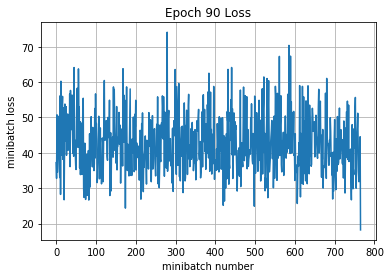

Iteration 69000: with minibatch training loss = 0.528 and accuracy of 0.86
Iteration 69100: with minibatch training loss = 0.696 and accuracy of 0.83
Iteration 69200: with minibatch training loss = 0.597 and accuracy of 0.81
Iteration 69300: with minibatch training loss = 0.569 and accuracy of 0.81
Iteration 69400: with minibatch training loss = 0.684 and accuracy of 0.8
Iteration 69500: with minibatch training loss = 0.576 and accuracy of 0.84
Iteration 69600: with minibatch training loss = 0.917 and accuracy of 0.75
Iteration 69700: with minibatch training loss = 0.661 and accuracy of 0.84
Epoch 91, Overall loss = 0.662 and accuracy of 0.806


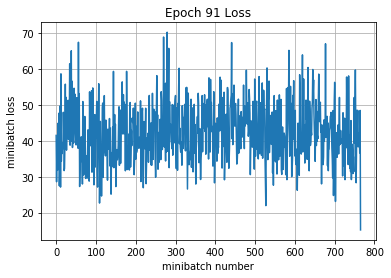

Iteration 69800: with minibatch training loss = 0.612 and accuracy of 0.88
Iteration 69900: with minibatch training loss = 0.612 and accuracy of 0.83
Iteration 70000: with minibatch training loss = 0.465 and accuracy of 0.88
Iteration 70100: with minibatch training loss = 0.616 and accuracy of 0.84
Iteration 70200: with minibatch training loss = 0.757 and accuracy of 0.75
Iteration 70300: with minibatch training loss = 0.602 and accuracy of 0.81
Iteration 70400: with minibatch training loss = 0.549 and accuracy of 0.84
Epoch 92, Overall loss = 0.653 and accuracy of 0.81


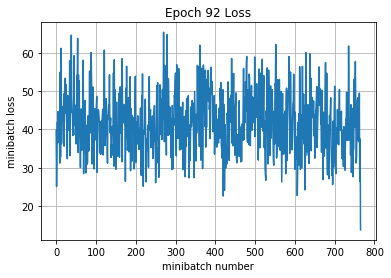

Iteration 70500: with minibatch training loss = 0.547 and accuracy of 0.86
Iteration 70600: with minibatch training loss = 0.651 and accuracy of 0.8
Iteration 70700: with minibatch training loss = 0.833 and accuracy of 0.78
Iteration 70800: with minibatch training loss = 0.783 and accuracy of 0.77
Iteration 70900: with minibatch training loss = 0.678 and accuracy of 0.78
Iteration 71000: with minibatch training loss = 0.686 and accuracy of 0.81
Iteration 71100: with minibatch training loss = 1.03 and accuracy of 0.73
Iteration 71200: with minibatch training loss = 0.74 and accuracy of 0.8
Epoch 93, Overall loss = 0.653 and accuracy of 0.811


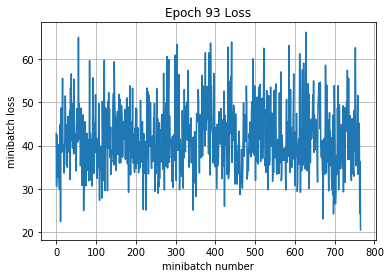

Iteration 71300: with minibatch training loss = 0.591 and accuracy of 0.84
Iteration 71400: with minibatch training loss = 0.486 and accuracy of 0.89
Iteration 71500: with minibatch training loss = 0.659 and accuracy of 0.83
Iteration 71600: with minibatch training loss = 0.574 and accuracy of 0.83
Iteration 71700: with minibatch training loss = 0.64 and accuracy of 0.81
Iteration 71800: with minibatch training loss = 0.605 and accuracy of 0.86
Iteration 71900: with minibatch training loss = 0.68 and accuracy of 0.81
Iteration 72000: with minibatch training loss = 0.572 and accuracy of 0.84
Epoch 94, Overall loss = 0.651 and accuracy of 0.81


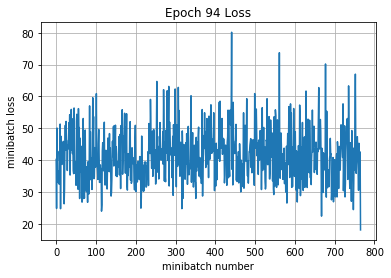

Iteration 72100: with minibatch training loss = 0.608 and accuracy of 0.8
Iteration 72200: with minibatch training loss = 0.494 and accuracy of 0.88
Iteration 72300: with minibatch training loss = 0.751 and accuracy of 0.8
Iteration 72400: with minibatch training loss = 0.781 and accuracy of 0.83
Iteration 72500: with minibatch training loss = 0.713 and accuracy of 0.83
Iteration 72600: with minibatch training loss = 0.772 and accuracy of 0.83
Iteration 72700: with minibatch training loss = 0.585 and accuracy of 0.83
Epoch 95, Overall loss = 0.644 and accuracy of 0.812


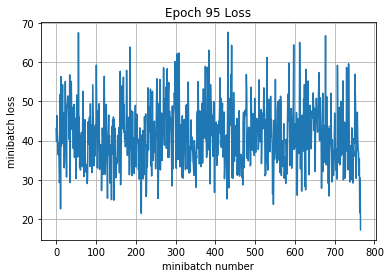

Iteration 72800: with minibatch training loss = 0.742 and accuracy of 0.8
Iteration 72900: with minibatch training loss = 0.711 and accuracy of 0.78
Iteration 73000: with minibatch training loss = 0.629 and accuracy of 0.84
Iteration 73100: with minibatch training loss = 0.571 and accuracy of 0.83
Iteration 73200: with minibatch training loss = 0.596 and accuracy of 0.88
Iteration 73300: with minibatch training loss = 0.951 and accuracy of 0.72
Iteration 73400: with minibatch training loss = 0.638 and accuracy of 0.83
Iteration 73500: with minibatch training loss = 0.766 and accuracy of 0.73
Epoch 96, Overall loss = 0.642 and accuracy of 0.815


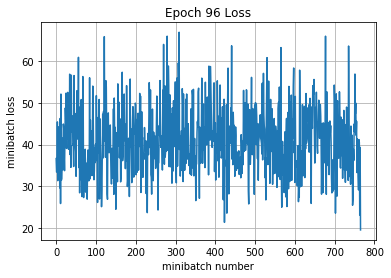

Iteration 73600: with minibatch training loss = 0.665 and accuracy of 0.8
Iteration 73700: with minibatch training loss = 0.679 and accuracy of 0.73
Iteration 73800: with minibatch training loss = 0.711 and accuracy of 0.83
Iteration 73900: with minibatch training loss = 0.592 and accuracy of 0.83
Iteration 74000: with minibatch training loss = 0.433 and accuracy of 0.91
Iteration 74100: with minibatch training loss = 0.688 and accuracy of 0.83
Iteration 74200: with minibatch training loss = 0.749 and accuracy of 0.77
Iteration 74300: with minibatch training loss = 0.487 and accuracy of 0.83
Epoch 97, Overall loss = 0.645 and accuracy of 0.813


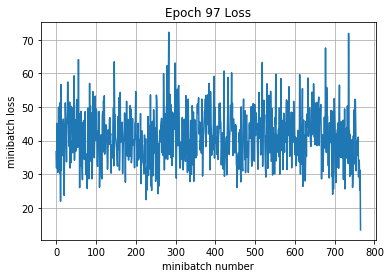

Iteration 74400: with minibatch training loss = 0.643 and accuracy of 0.81
Iteration 74500: with minibatch training loss = 0.665 and accuracy of 0.84
Iteration 74600: with minibatch training loss = 0.687 and accuracy of 0.83
Iteration 74700: with minibatch training loss = 0.452 and accuracy of 0.88
Iteration 74800: with minibatch training loss = 0.457 and accuracy of 0.88
Iteration 74900: with minibatch training loss = 0.62 and accuracy of 0.83
Iteration 75000: with minibatch training loss = 0.405 and accuracy of 0.91
Epoch 98, Overall loss = 0.643 and accuracy of 0.813


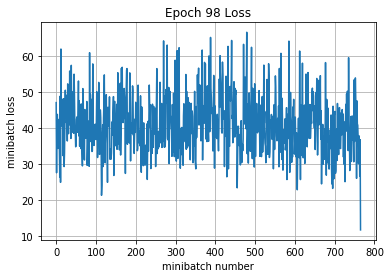

Iteration 75100: with minibatch training loss = 0.737 and accuracy of 0.8
Iteration 75200: with minibatch training loss = 0.73 and accuracy of 0.84
Iteration 75300: with minibatch training loss = 0.569 and accuracy of 0.84
Iteration 75400: with minibatch training loss = 0.753 and accuracy of 0.77
Iteration 75500: with minibatch training loss = 0.848 and accuracy of 0.75
Iteration 75600: with minibatch training loss = 0.532 and accuracy of 0.88
Iteration 75700: with minibatch training loss = 0.734 and accuracy of 0.8
Iteration 75800: with minibatch training loss = 0.768 and accuracy of 0.77
Epoch 99, Overall loss = 0.638 and accuracy of 0.816


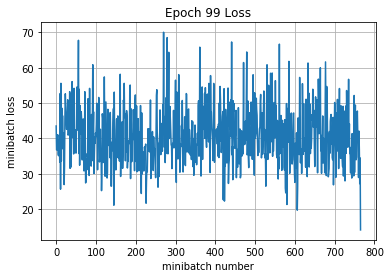

Iteration 75900: with minibatch training loss = 0.44 and accuracy of 0.92
Iteration 76000: with minibatch training loss = 0.646 and accuracy of 0.81
Iteration 76100: with minibatch training loss = 0.609 and accuracy of 0.83
Iteration 76200: with minibatch training loss = 0.721 and accuracy of 0.72
Iteration 76300: with minibatch training loss = 0.58 and accuracy of 0.83
Iteration 76400: with minibatch training loss = 0.487 and accuracy of 0.89
Iteration 76500: with minibatch training loss = 0.529 and accuracy of 0.83
Epoch 100, Overall loss = 0.628 and accuracy of 0.819


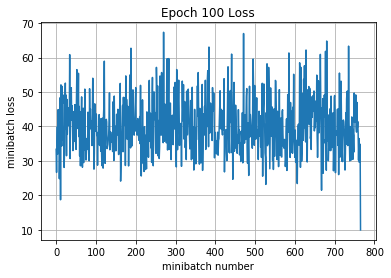

Iteration 76600: with minibatch training loss = 0.538 and accuracy of 0.86
Iteration 76700: with minibatch training loss = 0.559 and accuracy of 0.83
Iteration 76800: with minibatch training loss = 0.58 and accuracy of 0.88
Iteration 76900: with minibatch training loss = 0.671 and accuracy of 0.84
Iteration 77000: with minibatch training loss = 0.709 and accuracy of 0.77
Iteration 77100: with minibatch training loss = 0.646 and accuracy of 0.83
Iteration 77200: with minibatch training loss = 0.512 and accuracy of 0.84
Iteration 77300: with minibatch training loss = 0.832 and accuracy of 0.77
Epoch 101, Overall loss = 0.625 and accuracy of 0.822


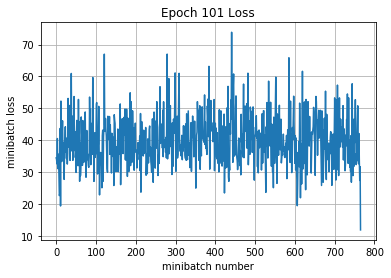

Iteration 77400: with minibatch training loss = 0.683 and accuracy of 0.78
Iteration 77500: with minibatch training loss = 0.752 and accuracy of 0.77
Iteration 77600: with minibatch training loss = 0.729 and accuracy of 0.73
Iteration 77700: with minibatch training loss = 0.507 and accuracy of 0.88
Iteration 77800: with minibatch training loss = 0.651 and accuracy of 0.8
Iteration 77900: with minibatch training loss = 0.756 and accuracy of 0.73
Iteration 78000: with minibatch training loss = 0.574 and accuracy of 0.81
Iteration 78100: with minibatch training loss = 0.613 and accuracy of 0.81
Epoch 102, Overall loss = 0.619 and accuracy of 0.822


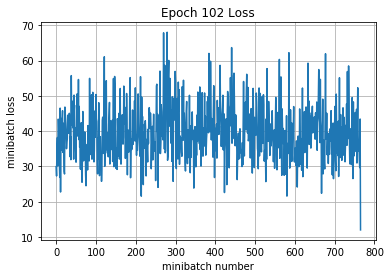

Iteration 78200: with minibatch training loss = 0.648 and accuracy of 0.78
Iteration 78300: with minibatch training loss = 0.561 and accuracy of 0.88
Iteration 78400: with minibatch training loss = 0.738 and accuracy of 0.8
Iteration 78500: with minibatch training loss = 0.5 and accuracy of 0.84
Iteration 78600: with minibatch training loss = 0.486 and accuracy of 0.84
Iteration 78700: with minibatch training loss = 0.651 and accuracy of 0.81
Iteration 78800: with minibatch training loss = 0.63 and accuracy of 0.77
Epoch 103, Overall loss = 0.615 and accuracy of 0.824


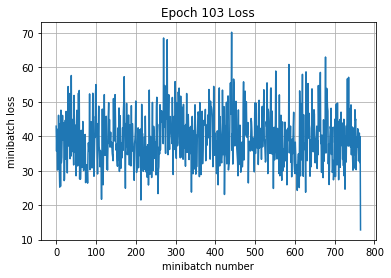

Iteration 78900: with minibatch training loss = 0.606 and accuracy of 0.81
Iteration 79000: with minibatch training loss = 0.63 and accuracy of 0.78
Iteration 79100: with minibatch training loss = 0.584 and accuracy of 0.78
Iteration 79200: with minibatch training loss = 0.584 and accuracy of 0.83
Iteration 79300: with minibatch training loss = 0.613 and accuracy of 0.78
Iteration 79400: with minibatch training loss = 0.645 and accuracy of 0.81
Iteration 79500: with minibatch training loss = 0.574 and accuracy of 0.83
Iteration 79600: with minibatch training loss = 0.42 and accuracy of 0.91
Epoch 104, Overall loss = 0.615 and accuracy of 0.824


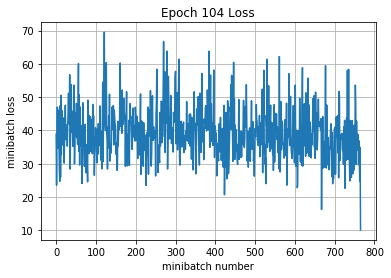

Iteration 79700: with minibatch training loss = 0.639 and accuracy of 0.86
Iteration 79800: with minibatch training loss = 0.648 and accuracy of 0.81
Iteration 79900: with minibatch training loss = 0.462 and accuracy of 0.89
Iteration 80000: with minibatch training loss = 0.52 and accuracy of 0.83
Iteration 80100: with minibatch training loss = 0.551 and accuracy of 0.81
Iteration 80200: with minibatch training loss = 0.669 and accuracy of 0.73
Iteration 80300: with minibatch training loss = 0.476 and accuracy of 0.88
Iteration 80400: with minibatch training loss = 0.681 and accuracy of 0.8
Epoch 105, Overall loss = 0.61 and accuracy of 0.826


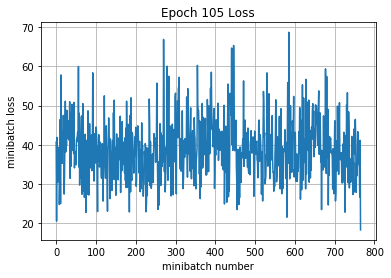

Iteration 80500: with minibatch training loss = 0.581 and accuracy of 0.8
Iteration 80600: with minibatch training loss = 0.764 and accuracy of 0.83
Iteration 80700: with minibatch training loss = 0.941 and accuracy of 0.7
Iteration 80800: with minibatch training loss = 0.728 and accuracy of 0.78
Iteration 80900: with minibatch training loss = 0.571 and accuracy of 0.86
Iteration 81000: with minibatch training loss = 0.729 and accuracy of 0.78
Iteration 81100: with minibatch training loss = 0.714 and accuracy of 0.78
Epoch 106, Overall loss = 0.607 and accuracy of 0.827


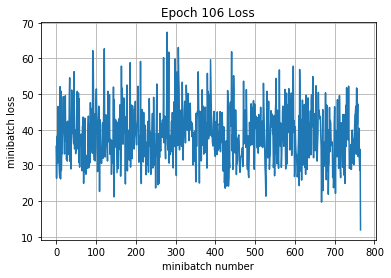

Iteration 81200: with minibatch training loss = 0.619 and accuracy of 0.78
Iteration 81300: with minibatch training loss = 0.403 and accuracy of 0.89
Iteration 81400: with minibatch training loss = 0.532 and accuracy of 0.83
Iteration 81500: with minibatch training loss = 0.877 and accuracy of 0.73
Iteration 81600: with minibatch training loss = 0.472 and accuracy of 0.88
Iteration 81700: with minibatch training loss = 0.744 and accuracy of 0.77
Iteration 81800: with minibatch training loss = 0.503 and accuracy of 0.88
Iteration 81900: with minibatch training loss = 0.735 and accuracy of 0.75
Epoch 107, Overall loss = 0.611 and accuracy of 0.825


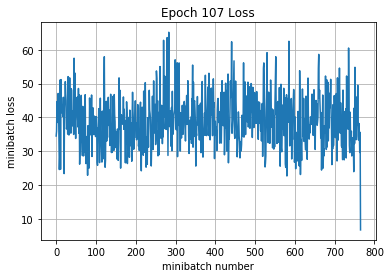

Iteration 82000: with minibatch training loss = 0.685 and accuracy of 0.8
Iteration 82100: with minibatch training loss = 0.554 and accuracy of 0.83
Iteration 82200: with minibatch training loss = 0.457 and accuracy of 0.92
Iteration 82300: with minibatch training loss = 0.614 and accuracy of 0.83
Iteration 82400: with minibatch training loss = 0.685 and accuracy of 0.81
Iteration 82500: with minibatch training loss = 0.521 and accuracy of 0.86
Iteration 82600: with minibatch training loss = 0.805 and accuracy of 0.75
Iteration 82700: with minibatch training loss = 0.402 and accuracy of 0.89
Epoch 108, Overall loss = 0.602 and accuracy of 0.828


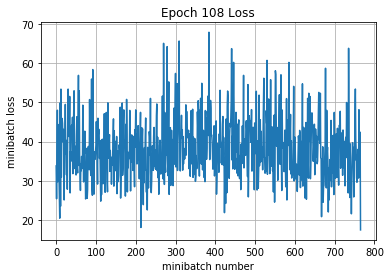

Iteration 82800: with minibatch training loss = 0.587 and accuracy of 0.86
Iteration 82900: with minibatch training loss = 0.714 and accuracy of 0.8
Iteration 83000: with minibatch training loss = 0.748 and accuracy of 0.78
Iteration 83100: with minibatch training loss = 0.755 and accuracy of 0.83
Iteration 83200: with minibatch training loss = 0.544 and accuracy of 0.84
Iteration 83300: with minibatch training loss = 0.566 and accuracy of 0.86
Iteration 83400: with minibatch training loss = 0.524 and accuracy of 0.86
Epoch 109, Overall loss = 0.593 and accuracy of 0.831


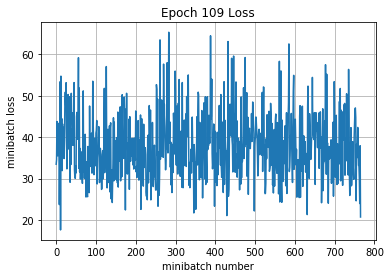

Iteration 83500: with minibatch training loss = 0.643 and accuracy of 0.77
Iteration 83600: with minibatch training loss = 0.561 and accuracy of 0.83
Iteration 83700: with minibatch training loss = 0.592 and accuracy of 0.83
Iteration 83800: with minibatch training loss = 0.513 and accuracy of 0.88
Iteration 83900: with minibatch training loss = 0.632 and accuracy of 0.8
Iteration 84000: with minibatch training loss = 0.702 and accuracy of 0.8
Iteration 84100: with minibatch training loss = 0.337 and accuracy of 0.91
Iteration 84200: with minibatch training loss = 0.486 and accuracy of 0.91
Epoch 110, Overall loss = 0.596 and accuracy of 0.83


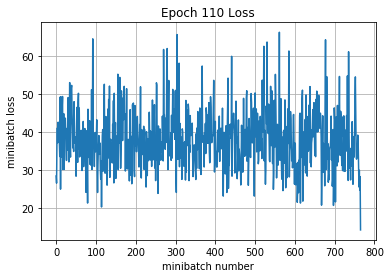

Iteration 84300: with minibatch training loss = 0.784 and accuracy of 0.77
Iteration 84400: with minibatch training loss = 0.562 and accuracy of 0.81
Iteration 84500: with minibatch training loss = 0.51 and accuracy of 0.84
Iteration 84600: with minibatch training loss = 0.449 and accuracy of 0.88
Iteration 84700: with minibatch training loss = 0.684 and accuracy of 0.81
Iteration 84800: with minibatch training loss = 0.496 and accuracy of 0.86
Iteration 84900: with minibatch training loss = 0.584 and accuracy of 0.84
Iteration 85000: with minibatch training loss = 0.417 and accuracy of 0.92
Epoch 111, Overall loss = 0.594 and accuracy of 0.831


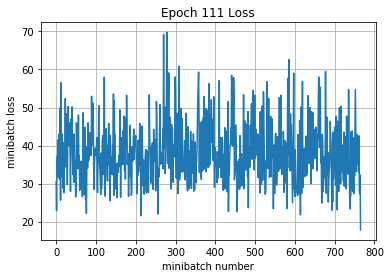

Iteration 85100: with minibatch training loss = 0.419 and accuracy of 0.89
Iteration 85200: with minibatch training loss = 0.408 and accuracy of 0.88
Iteration 85300: with minibatch training loss = 0.574 and accuracy of 0.84
Iteration 85400: with minibatch training loss = 0.684 and accuracy of 0.78
Iteration 85500: with minibatch training loss = 0.587 and accuracy of 0.83
Iteration 85600: with minibatch training loss = 0.448 and accuracy of 0.88
Iteration 85700: with minibatch training loss = 0.443 and accuracy of 0.88
Epoch 112, Overall loss = 0.593 and accuracy of 0.832


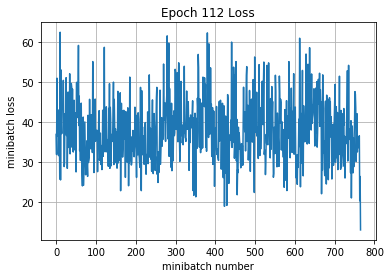

Iteration 85800: with minibatch training loss = 0.544 and accuracy of 0.84
Iteration 85900: with minibatch training loss = 0.675 and accuracy of 0.83
Iteration 86000: with minibatch training loss = 0.473 and accuracy of 0.89
Iteration 86100: with minibatch training loss = 0.723 and accuracy of 0.83
Iteration 86200: with minibatch training loss = 0.553 and accuracy of 0.88
Iteration 86300: with minibatch training loss = 0.327 and accuracy of 0.91
Iteration 86400: with minibatch training loss = 0.54 and accuracy of 0.83
Iteration 86500: with minibatch training loss = 0.582 and accuracy of 0.83
Epoch 113, Overall loss = 0.586 and accuracy of 0.836


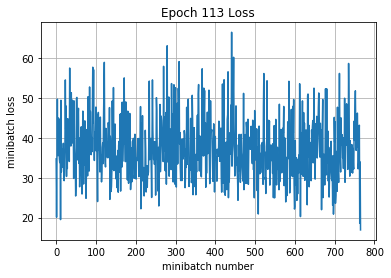

Iteration 86600: with minibatch training loss = 0.571 and accuracy of 0.84
Iteration 86700: with minibatch training loss = 0.565 and accuracy of 0.84
Iteration 86800: with minibatch training loss = 0.711 and accuracy of 0.81
Iteration 86900: with minibatch training loss = 0.675 and accuracy of 0.78
Iteration 87000: with minibatch training loss = 0.484 and accuracy of 0.88
Iteration 87100: with minibatch training loss = 0.651 and accuracy of 0.81
Iteration 87200: with minibatch training loss = 0.463 and accuracy of 0.92
Iteration 87300: with minibatch training loss = 0.484 and accuracy of 0.89
Epoch 114, Overall loss = 0.584 and accuracy of 0.836


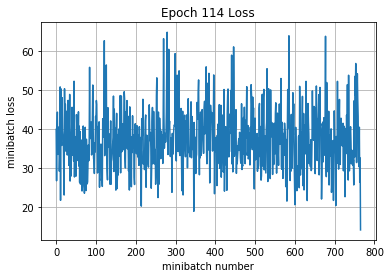

Iteration 87400: with minibatch training loss = 0.459 and accuracy of 0.88
Iteration 87500: with minibatch training loss = 0.632 and accuracy of 0.84
Iteration 87600: with minibatch training loss = 0.664 and accuracy of 0.81
Iteration 87700: with minibatch training loss = 0.461 and accuracy of 0.89
Iteration 87800: with minibatch training loss = 0.563 and accuracy of 0.88
Iteration 87900: with minibatch training loss = 0.496 and accuracy of 0.91
Iteration 88000: with minibatch training loss = 0.624 and accuracy of 0.81
Epoch 115, Overall loss = 0.582 and accuracy of 0.836


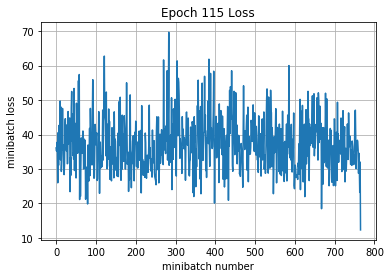

Iteration 88100: with minibatch training loss = 0.681 and accuracy of 0.8
Iteration 88200: with minibatch training loss = 0.576 and accuracy of 0.8
Iteration 88300: with minibatch training loss = 0.492 and accuracy of 0.86
Iteration 88400: with minibatch training loss = 0.577 and accuracy of 0.83
Iteration 88500: with minibatch training loss = 0.566 and accuracy of 0.86
Iteration 88600: with minibatch training loss = 0.689 and accuracy of 0.83
Iteration 88700: with minibatch training loss = 0.604 and accuracy of 0.84
Iteration 88800: with minibatch training loss = 0.518 and accuracy of 0.84
Epoch 116, Overall loss = 0.584 and accuracy of 0.833


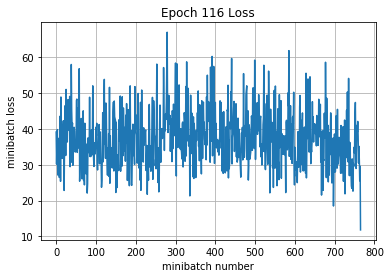

Iteration 88900: with minibatch training loss = 0.511 and accuracy of 0.88
Iteration 89000: with minibatch training loss = 0.752 and accuracy of 0.81
Iteration 89100: with minibatch training loss = 0.562 and accuracy of 0.83
Iteration 89200: with minibatch training loss = 0.31 and accuracy of 0.92
Iteration 89300: with minibatch training loss = 0.408 and accuracy of 0.92
Iteration 89400: with minibatch training loss = 0.477 and accuracy of 0.86
Iteration 89500: with minibatch training loss = 0.69 and accuracy of 0.8
Iteration 89600: with minibatch training loss = 0.499 and accuracy of 0.83
Epoch 117, Overall loss = 0.57 and accuracy of 0.841


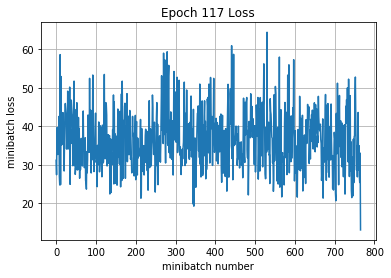

Iteration 89700: with minibatch training loss = 0.435 and accuracy of 0.84
Iteration 89800: with minibatch training loss = 0.599 and accuracy of 0.86
Iteration 89900: with minibatch training loss = 0.678 and accuracy of 0.78
Iteration 90000: with minibatch training loss = 0.48 and accuracy of 0.91
Iteration 90100: with minibatch training loss = 0.708 and accuracy of 0.8
Iteration 90200: with minibatch training loss = 0.552 and accuracy of 0.83
Iteration 90300: with minibatch training loss = 0.658 and accuracy of 0.81
Epoch 118, Overall loss = 0.579 and accuracy of 0.838


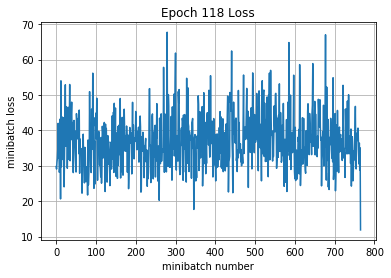

Iteration 90400: with minibatch training loss = 0.755 and accuracy of 0.8
Iteration 90500: with minibatch training loss = 0.448 and accuracy of 0.91
Iteration 90600: with minibatch training loss = 0.572 and accuracy of 0.81
Iteration 90700: with minibatch training loss = 0.582 and accuracy of 0.84
Iteration 90800: with minibatch training loss = 0.716 and accuracy of 0.8
Iteration 90900: with minibatch training loss = 0.52 and accuracy of 0.81
Iteration 91000: with minibatch training loss = 0.63 and accuracy of 0.81
Iteration 91100: with minibatch training loss = 0.784 and accuracy of 0.78
Epoch 119, Overall loss = 0.577 and accuracy of 0.838


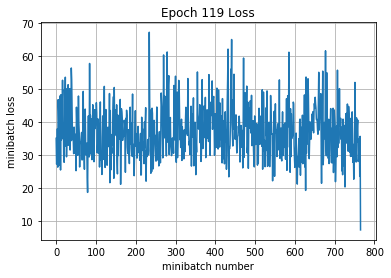

Iteration 91200: with minibatch training loss = 0.577 and accuracy of 0.83
Iteration 91300: with minibatch training loss = 0.734 and accuracy of 0.8
Iteration 91400: with minibatch training loss = 0.58 and accuracy of 0.84
Iteration 91500: with minibatch training loss = 0.446 and accuracy of 0.89
Iteration 91600: with minibatch training loss = 0.771 and accuracy of 0.77
Iteration 91700: with minibatch training loss = 0.403 and accuracy of 0.91
Iteration 91800: with minibatch training loss = 0.629 and accuracy of 0.86
Iteration 91900: with minibatch training loss = 0.557 and accuracy of 0.83
Epoch 120, Overall loss = 0.562 and accuracy of 0.844


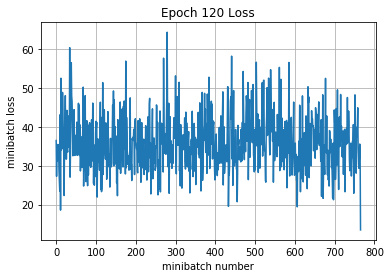

Iteration 92000: with minibatch training loss = 0.608 and accuracy of 0.8
Iteration 92100: with minibatch training loss = 0.715 and accuracy of 0.8
Iteration 92200: with minibatch training loss = 0.511 and accuracy of 0.86
Iteration 92300: with minibatch training loss = 0.657 and accuracy of 0.81
Iteration 92400: with minibatch training loss = 0.455 and accuracy of 0.86
Iteration 92500: with minibatch training loss = 0.432 and accuracy of 0.92
Iteration 92600: with minibatch training loss = 0.867 and accuracy of 0.77
Epoch 121, Overall loss = 0.559 and accuracy of 0.843


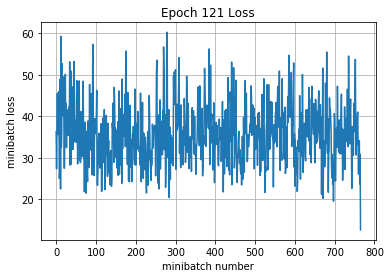

Iteration 92700: with minibatch training loss = 0.643 and accuracy of 0.75
Iteration 92800: with minibatch training loss = 0.332 and accuracy of 0.92
Iteration 92900: with minibatch training loss = 0.419 and accuracy of 0.91
Iteration 93000: with minibatch training loss = 0.508 and accuracy of 0.86
Iteration 93100: with minibatch training loss = 0.601 and accuracy of 0.88
Iteration 93200: with minibatch training loss = 0.528 and accuracy of 0.84
Iteration 93300: with minibatch training loss = 0.38 and accuracy of 0.92
Iteration 93400: with minibatch training loss = 0.674 and accuracy of 0.81
Epoch 122, Overall loss = 0.567 and accuracy of 0.843


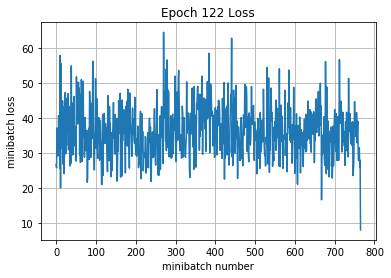

Iteration 93500: with minibatch training loss = 0.549 and accuracy of 0.86
Iteration 93600: with minibatch training loss = 0.442 and accuracy of 0.92
Iteration 93700: with minibatch training loss = 0.545 and accuracy of 0.83
Iteration 93800: with minibatch training loss = 0.588 and accuracy of 0.86
Iteration 93900: with minibatch training loss = 0.763 and accuracy of 0.72
Iteration 94000: with minibatch training loss = 0.677 and accuracy of 0.8
Iteration 94100: with minibatch training loss = 0.579 and accuracy of 0.83
Iteration 94200: with minibatch training loss = 0.411 and accuracy of 0.92
Epoch 123, Overall loss = 0.561 and accuracy of 0.845


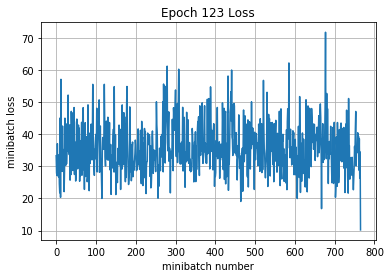

Iteration 94300: with minibatch training loss = 0.471 and accuracy of 0.89
Iteration 94400: with minibatch training loss = 0.516 and accuracy of 0.83
Iteration 94500: with minibatch training loss = 0.73 and accuracy of 0.77
Iteration 94600: with minibatch training loss = 0.664 and accuracy of 0.81
Iteration 94700: with minibatch training loss = 0.581 and accuracy of 0.8
Iteration 94800: with minibatch training loss = 0.655 and accuracy of 0.84
Iteration 94900: with minibatch training loss = 0.63 and accuracy of 0.81
Epoch 124, Overall loss = 0.56 and accuracy of 0.843


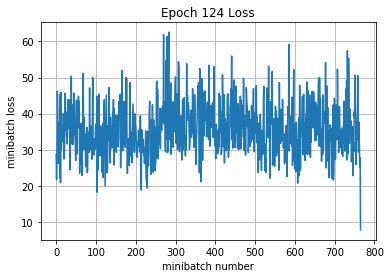

Iteration 95000: with minibatch training loss = 0.739 and accuracy of 0.78
Iteration 95100: with minibatch training loss = 0.499 and accuracy of 0.86
Iteration 95200: with minibatch training loss = 0.437 and accuracy of 0.91
Iteration 95300: with minibatch training loss = 0.394 and accuracy of 0.89
Iteration 95400: with minibatch training loss = 0.491 and accuracy of 0.88
Iteration 95500: with minibatch training loss = 0.473 and accuracy of 0.91
Iteration 95600: with minibatch training loss = 0.473 and accuracy of 0.86
Iteration 95700: with minibatch training loss = 0.603 and accuracy of 0.84
Epoch 125, Overall loss = 0.556 and accuracy of 0.846


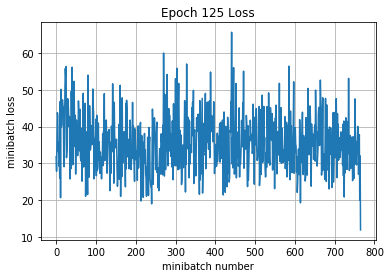

Iteration 95800: with minibatch training loss = 0.473 and accuracy of 0.86
Iteration 95900: with minibatch training loss = 0.51 and accuracy of 0.88
Iteration 96000: with minibatch training loss = 0.421 and accuracy of 0.91
Iteration 96100: with minibatch training loss = 0.505 and accuracy of 0.81
Iteration 96200: with minibatch training loss = 0.56 and accuracy of 0.84
Iteration 96300: with minibatch training loss = 0.443 and accuracy of 0.91
Iteration 96400: with minibatch training loss = 0.704 and accuracy of 0.77
Iteration 96500: with minibatch training loss = 0.501 and accuracy of 0.84
Epoch 126, Overall loss = 0.559 and accuracy of 0.845


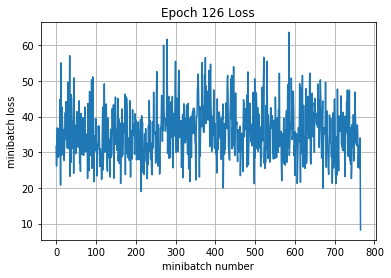

Iteration 96600: with minibatch training loss = 0.741 and accuracy of 0.8
Iteration 96700: with minibatch training loss = 0.578 and accuracy of 0.84
Iteration 96800: with minibatch training loss = 0.418 and accuracy of 0.89
Iteration 96900: with minibatch training loss = 0.792 and accuracy of 0.78
Iteration 97000: with minibatch training loss = 0.48 and accuracy of 0.88
Iteration 97100: with minibatch training loss = 0.543 and accuracy of 0.88
Iteration 97200: with minibatch training loss = 0.485 and accuracy of 0.86
Epoch 127, Overall loss = 0.557 and accuracy of 0.844


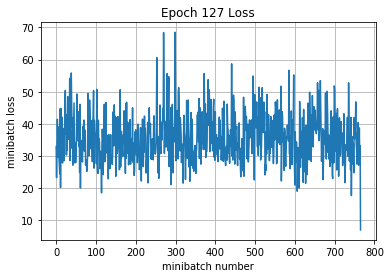

Iteration 97300: with minibatch training loss = 0.567 and accuracy of 0.81
Iteration 97400: with minibatch training loss = 0.39 and accuracy of 0.91
Iteration 97500: with minibatch training loss = 0.476 and accuracy of 0.86
Iteration 97600: with minibatch training loss = 0.667 and accuracy of 0.81
Iteration 97700: with minibatch training loss = 0.562 and accuracy of 0.86
Iteration 97800: with minibatch training loss = 0.513 and accuracy of 0.88
Iteration 97900: with minibatch training loss = 0.505 and accuracy of 0.88
Iteration 98000: with minibatch training loss = 0.575 and accuracy of 0.88
Epoch 128, Overall loss = 0.543 and accuracy of 0.851


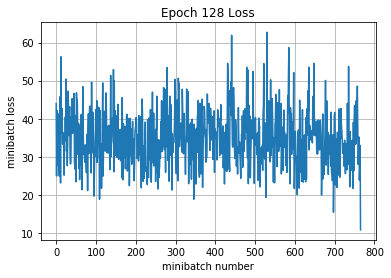

Iteration 98100: with minibatch training loss = 0.533 and accuracy of 0.86
Iteration 98200: with minibatch training loss = 0.436 and accuracy of 0.92
Iteration 98300: with minibatch training loss = 0.741 and accuracy of 0.81
Iteration 98400: with minibatch training loss = 0.407 and accuracy of 0.91
Iteration 98500: with minibatch training loss = 0.689 and accuracy of 0.81
Iteration 98600: with minibatch training loss = 0.857 and accuracy of 0.75
Iteration 98700: with minibatch training loss = 0.608 and accuracy of 0.84
Iteration 98800: with minibatch training loss = 0.608 and accuracy of 0.83
Epoch 129, Overall loss = 0.546 and accuracy of 0.849


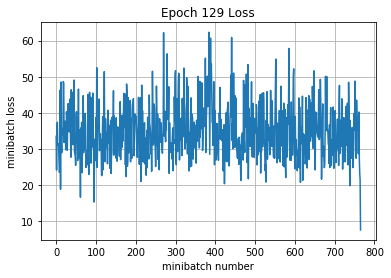

Iteration 98900: with minibatch training loss = 0.596 and accuracy of 0.8
Iteration 99000: with minibatch training loss = 0.658 and accuracy of 0.78
Iteration 99100: with minibatch training loss = 0.466 and accuracy of 0.89
Iteration 99200: with minibatch training loss = 0.498 and accuracy of 0.86
Iteration 99300: with minibatch training loss = 0.527 and accuracy of 0.89
Iteration 99400: with minibatch training loss = 0.53 and accuracy of 0.86
Iteration 99500: with minibatch training loss = 0.41 and accuracy of 0.91
Epoch 130, Overall loss = 0.539 and accuracy of 0.853


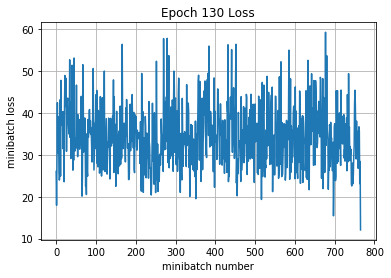

Iteration 99600: with minibatch training loss = 0.269 and accuracy of 0.92
Iteration 99700: with minibatch training loss = 0.589 and accuracy of 0.81
Iteration 99800: with minibatch training loss = 0.643 and accuracy of 0.83
Iteration 99900: with minibatch training loss = 0.653 and accuracy of 0.84
Iteration 100000: with minibatch training loss = 0.472 and accuracy of 0.88
Iteration 100100: with minibatch training loss = 0.591 and accuracy of 0.84
Iteration 100200: with minibatch training loss = 0.45 and accuracy of 0.89
Iteration 100300: with minibatch training loss = 0.399 and accuracy of 0.88
Epoch 131, Overall loss = 0.556 and accuracy of 0.845


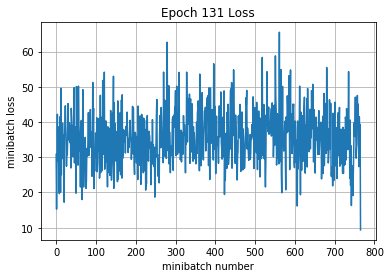

Iteration 100400: with minibatch training loss = 0.402 and accuracy of 0.94
Iteration 100500: with minibatch training loss = 0.457 and accuracy of 0.86
Iteration 100600: with minibatch training loss = 0.493 and accuracy of 0.84
Iteration 100700: with minibatch training loss = 0.581 and accuracy of 0.86
Iteration 100800: with minibatch training loss = 0.479 and accuracy of 0.92
Iteration 100900: with minibatch training loss = 0.356 and accuracy of 0.89
Iteration 101000: with minibatch training loss = 0.562 and accuracy of 0.86
Iteration 101100: with minibatch training loss = 0.565 and accuracy of 0.84
Epoch 132, Overall loss = 0.542 and accuracy of 0.85


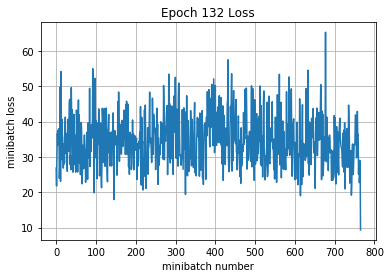

Iteration 101200: with minibatch training loss = 0.558 and accuracy of 0.81
Iteration 101300: with minibatch training loss = 0.604 and accuracy of 0.81
Iteration 101400: with minibatch training loss = 0.589 and accuracy of 0.8
Iteration 101500: with minibatch training loss = 0.779 and accuracy of 0.78
Iteration 101600: with minibatch training loss = 0.527 and accuracy of 0.83
Iteration 101700: with minibatch training loss = 0.566 and accuracy of 0.84
Iteration 101800: with minibatch training loss = 0.752 and accuracy of 0.78
Epoch 133, Overall loss = 0.538 and accuracy of 0.852


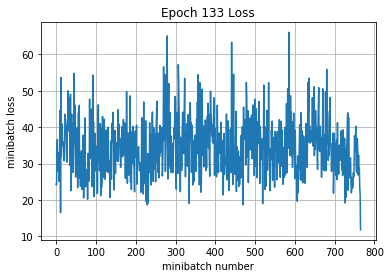

Iteration 101900: with minibatch training loss = 0.715 and accuracy of 0.75
Iteration 102000: with minibatch training loss = 0.431 and accuracy of 0.91
Iteration 102100: with minibatch training loss = 0.517 and accuracy of 0.83
Iteration 102200: with minibatch training loss = 0.58 and accuracy of 0.83
Iteration 102300: with minibatch training loss = 0.589 and accuracy of 0.81
Iteration 102400: with minibatch training loss = 0.659 and accuracy of 0.75
Iteration 102500: with minibatch training loss = 0.557 and accuracy of 0.89
Iteration 102600: with minibatch training loss = 0.413 and accuracy of 0.95
Epoch 134, Overall loss = 0.535 and accuracy of 0.851


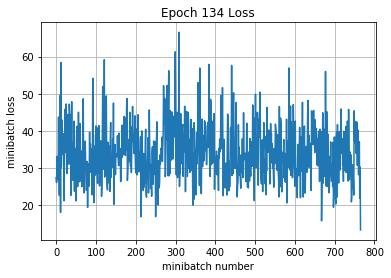

Iteration 102700: with minibatch training loss = 0.613 and accuracy of 0.84
Iteration 102800: with minibatch training loss = 0.435 and accuracy of 0.91
Iteration 102900: with minibatch training loss = 0.323 and accuracy of 0.91
Iteration 103000: with minibatch training loss = 0.691 and accuracy of 0.8
Iteration 103100: with minibatch training loss = 0.477 and accuracy of 0.89
Iteration 103200: with minibatch training loss = 0.479 and accuracy of 0.89
Iteration 103300: with minibatch training loss = 0.478 and accuracy of 0.89
Iteration 103400: with minibatch training loss = 0.479 and accuracy of 0.88
Epoch 135, Overall loss = 0.533 and accuracy of 0.854


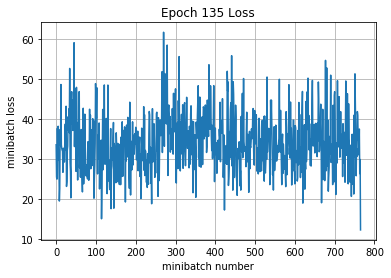

Iteration 103500: with minibatch training loss = 0.466 and accuracy of 0.89
Iteration 103600: with minibatch training loss = 0.378 and accuracy of 0.88
Iteration 103700: with minibatch training loss = 0.533 and accuracy of 0.89
Iteration 103800: with minibatch training loss = 0.625 and accuracy of 0.84
Iteration 103900: with minibatch training loss = 0.739 and accuracy of 0.78
Iteration 104000: with minibatch training loss = 0.524 and accuracy of 0.88
Iteration 104100: with minibatch training loss = 0.659 and accuracy of 0.77
Epoch 136, Overall loss = 0.529 and accuracy of 0.856


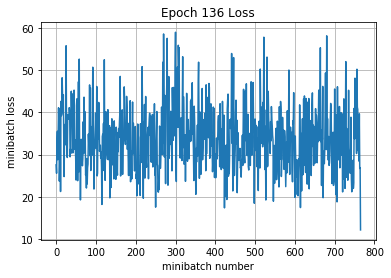

Iteration 104200: with minibatch training loss = 0.554 and accuracy of 0.81
Iteration 104300: with minibatch training loss = 0.441 and accuracy of 0.88
Iteration 104400: with minibatch training loss = 0.5 and accuracy of 0.89
Iteration 104500: with minibatch training loss = 0.569 and accuracy of 0.86
Iteration 104600: with minibatch training loss = 0.473 and accuracy of 0.91
Iteration 104700: with minibatch training loss = 0.503 and accuracy of 0.91
Iteration 104800: with minibatch training loss = 0.525 and accuracy of 0.88
Iteration 104900: with minibatch training loss = 0.45 and accuracy of 0.91
Epoch 137, Overall loss = 0.525 and accuracy of 0.857


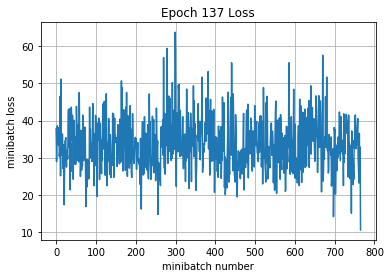

Iteration 105000: with minibatch training loss = 0.611 and accuracy of 0.8
Iteration 105100: with minibatch training loss = 0.492 and accuracy of 0.91
Iteration 105200: with minibatch training loss = 0.354 and accuracy of 0.92
Iteration 105300: with minibatch training loss = 0.576 and accuracy of 0.84
Iteration 105400: with minibatch training loss = 0.575 and accuracy of 0.81
Iteration 105500: with minibatch training loss = 0.43 and accuracy of 0.91
Iteration 105600: with minibatch training loss = 0.482 and accuracy of 0.91
Iteration 105700: with minibatch training loss = 0.521 and accuracy of 0.86
Epoch 138, Overall loss = 0.519 and accuracy of 0.86


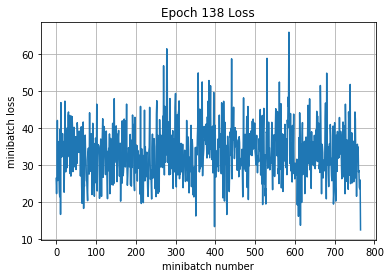

Iteration 105800: with minibatch training loss = 0.801 and accuracy of 0.78
Iteration 105900: with minibatch training loss = 0.617 and accuracy of 0.83
Iteration 106000: with minibatch training loss = 0.603 and accuracy of 0.83
Iteration 106100: with minibatch training loss = 0.602 and accuracy of 0.83
Iteration 106200: with minibatch training loss = 0.493 and accuracy of 0.84
Iteration 106300: with minibatch training loss = 0.581 and accuracy of 0.84
Iteration 106400: with minibatch training loss = 0.455 and accuracy of 0.88
Epoch 139, Overall loss = 0.528 and accuracy of 0.856


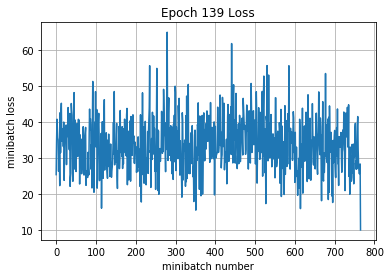

Iteration 106500: with minibatch training loss = 0.491 and accuracy of 0.91
Iteration 106600: with minibatch training loss = 0.626 and accuracy of 0.8
Iteration 106700: with minibatch training loss = 0.49 and accuracy of 0.88
Iteration 106800: with minibatch training loss = 0.602 and accuracy of 0.81
Iteration 106900: with minibatch training loss = 0.533 and accuracy of 0.83
Iteration 107000: with minibatch training loss = 0.484 and accuracy of 0.88
Iteration 107100: with minibatch training loss = 0.616 and accuracy of 0.8
Iteration 107200: with minibatch training loss = 0.39 and accuracy of 0.91
Epoch 140, Overall loss = 0.53 and accuracy of 0.855


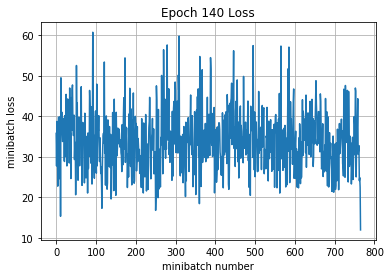

Iteration 107300: with minibatch training loss = 0.649 and accuracy of 0.72
Iteration 107400: with minibatch training loss = 0.489 and accuracy of 0.84
Iteration 107500: with minibatch training loss = 0.575 and accuracy of 0.86
Iteration 107600: with minibatch training loss = 0.297 and accuracy of 0.94
Iteration 107700: with minibatch training loss = 0.437 and accuracy of 0.86
Iteration 107800: with minibatch training loss = 0.579 and accuracy of 0.88
Iteration 107900: with minibatch training loss = 0.746 and accuracy of 0.78
Iteration 108000: with minibatch training loss = 0.444 and accuracy of 0.91
Epoch 141, Overall loss = 0.533 and accuracy of 0.853


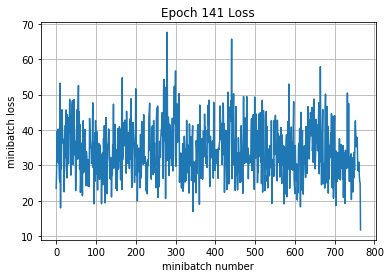

Iteration 108100: with minibatch training loss = 0.415 and accuracy of 0.89
Iteration 108200: with minibatch training loss = 0.609 and accuracy of 0.86
Iteration 108300: with minibatch training loss = 0.441 and accuracy of 0.92
Iteration 108400: with minibatch training loss = 0.538 and accuracy of 0.86
Iteration 108500: with minibatch training loss = 0.53 and accuracy of 0.83
Iteration 108600: with minibatch training loss = 0.509 and accuracy of 0.84
Iteration 108700: with minibatch training loss = 0.393 and accuracy of 0.89
Epoch 142, Overall loss = 0.516 and accuracy of 0.86


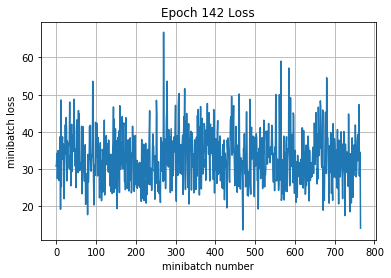

Iteration 108800: with minibatch training loss = 0.59 and accuracy of 0.81
Iteration 108900: with minibatch training loss = 0.414 and accuracy of 0.86
Iteration 109000: with minibatch training loss = 0.496 and accuracy of 0.91
Iteration 109100: with minibatch training loss = 0.587 and accuracy of 0.83
Iteration 109200: with minibatch training loss = 0.491 and accuracy of 0.84
Iteration 109300: with minibatch training loss = 0.543 and accuracy of 0.86
Iteration 109400: with minibatch training loss = 0.6 and accuracy of 0.88
Iteration 109500: with minibatch training loss = 0.683 and accuracy of 0.78
Epoch 143, Overall loss = 0.524 and accuracy of 0.857


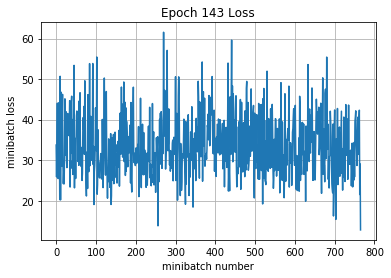

Iteration 109600: with minibatch training loss = 0.469 and accuracy of 0.88
Iteration 109700: with minibatch training loss = 0.398 and accuracy of 0.91
Iteration 109800: with minibatch training loss = 0.493 and accuracy of 0.88
Iteration 109900: with minibatch training loss = 0.398 and accuracy of 0.91
Iteration 110000: with minibatch training loss = 0.473 and accuracy of 0.83
Iteration 110100: with minibatch training loss = 0.517 and accuracy of 0.92
Iteration 110200: with minibatch training loss = 0.508 and accuracy of 0.86
Iteration 110300: with minibatch training loss = 0.479 and accuracy of 0.88
Epoch 144, Overall loss = 0.51 and accuracy of 0.863


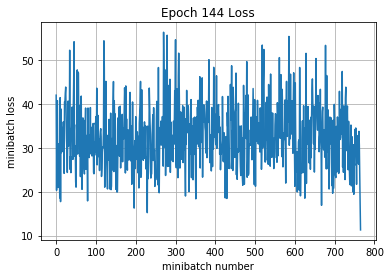

Iteration 110400: with minibatch training loss = 0.424 and accuracy of 0.91
Iteration 110500: with minibatch training loss = 0.466 and accuracy of 0.88
Iteration 110600: with minibatch training loss = 0.577 and accuracy of 0.8
Iteration 110700: with minibatch training loss = 0.704 and accuracy of 0.81
Iteration 110800: with minibatch training loss = 0.62 and accuracy of 0.83
Iteration 110900: with minibatch training loss = 0.584 and accuracy of 0.84
Iteration 111000: with minibatch training loss = 0.605 and accuracy of 0.84
Epoch 145, Overall loss = 0.523 and accuracy of 0.858


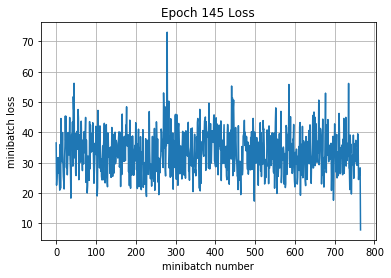

Iteration 111100: with minibatch training loss = 0.645 and accuracy of 0.84
Iteration 111200: with minibatch training loss = 0.43 and accuracy of 0.94
Iteration 111300: with minibatch training loss = 0.446 and accuracy of 0.86
Iteration 111400: with minibatch training loss = 0.483 and accuracy of 0.88
Iteration 111500: with minibatch training loss = 0.558 and accuracy of 0.81
Iteration 111600: with minibatch training loss = 0.605 and accuracy of 0.83
Iteration 111700: with minibatch training loss = 0.461 and accuracy of 0.91
Iteration 111800: with minibatch training loss = 0.707 and accuracy of 0.83
Epoch 146, Overall loss = 0.5 and accuracy of 0.866


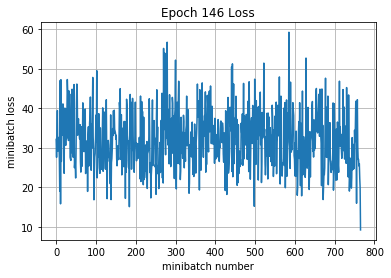

Iteration 111900: with minibatch training loss = 0.4 and accuracy of 0.91
Iteration 112000: with minibatch training loss = 0.576 and accuracy of 0.83
Iteration 112100: with minibatch training loss = 0.491 and accuracy of 0.91
Iteration 112200: with minibatch training loss = 0.476 and accuracy of 0.83
Iteration 112300: with minibatch training loss = 0.391 and accuracy of 0.92
Iteration 112400: with minibatch training loss = 0.622 and accuracy of 0.81
Iteration 112500: with minibatch training loss = 0.547 and accuracy of 0.88
Iteration 112600: with minibatch training loss = 0.445 and accuracy of 0.89
Epoch 147, Overall loss = 0.508 and accuracy of 0.862


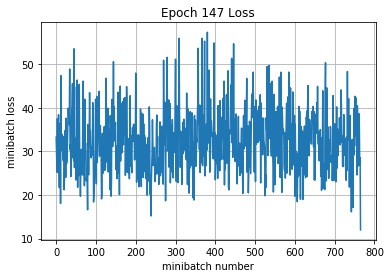

Iteration 112700: with minibatch training loss = 0.45 and accuracy of 0.92
Iteration 112800: with minibatch training loss = 0.595 and accuracy of 0.84
Iteration 112900: with minibatch training loss = 0.539 and accuracy of 0.84
Iteration 113000: with minibatch training loss = 0.368 and accuracy of 0.92
Iteration 113100: with minibatch training loss = 0.339 and accuracy of 0.94
Iteration 113200: with minibatch training loss = 0.384 and accuracy of 0.91
Iteration 113300: with minibatch training loss = 0.43 and accuracy of 0.89
Epoch 148, Overall loss = 0.512 and accuracy of 0.86


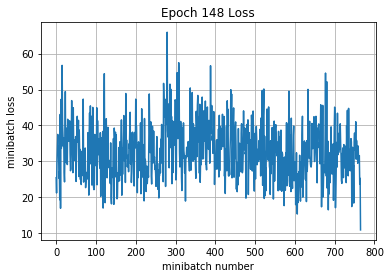

Iteration 113400: with minibatch training loss = 0.53 and accuracy of 0.84
Iteration 113500: with minibatch training loss = 0.566 and accuracy of 0.88
Iteration 113600: with minibatch training loss = 0.402 and accuracy of 0.89
Iteration 113700: with minibatch training loss = 0.586 and accuracy of 0.83
Iteration 113800: with minibatch training loss = 0.578 and accuracy of 0.84
Iteration 113900: with minibatch training loss = 0.53 and accuracy of 0.86
Iteration 114000: with minibatch training loss = 0.532 and accuracy of 0.81
Iteration 114100: with minibatch training loss = 0.582 and accuracy of 0.84
Epoch 149, Overall loss = 0.502 and accuracy of 0.864


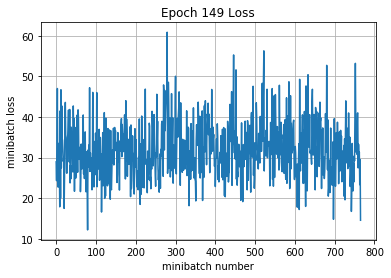

Iteration 114200: with minibatch training loss = 0.398 and accuracy of 0.88
Iteration 114300: with minibatch training loss = 0.56 and accuracy of 0.83
Iteration 114400: with minibatch training loss = 0.625 and accuracy of 0.83
Iteration 114500: with minibatch training loss = 0.57 and accuracy of 0.81
Iteration 114600: with minibatch training loss = 0.607 and accuracy of 0.84
Iteration 114700: with minibatch training loss = 0.393 and accuracy of 0.91
Iteration 114800: with minibatch training loss = 0.565 and accuracy of 0.86
Epoch 150, Overall loss = 0.514 and accuracy of 0.861


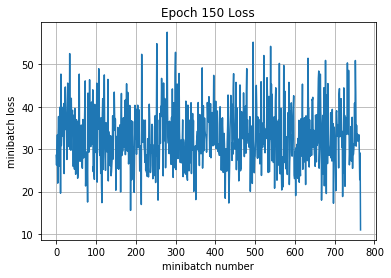

Iteration 114900: with minibatch training loss = 0.375 and accuracy of 0.92
Iteration 115000: with minibatch training loss = 0.587 and accuracy of 0.84
Iteration 115100: with minibatch training loss = 0.645 and accuracy of 0.81
Iteration 115200: with minibatch training loss = 0.789 and accuracy of 0.81
Iteration 115300: with minibatch training loss = 0.394 and accuracy of 0.91
Iteration 115400: with minibatch training loss = 0.525 and accuracy of 0.83
Iteration 115500: with minibatch training loss = 0.396 and accuracy of 0.89
Iteration 115600: with minibatch training loss = 0.482 and accuracy of 0.89
Epoch 151, Overall loss = 0.506 and accuracy of 0.863


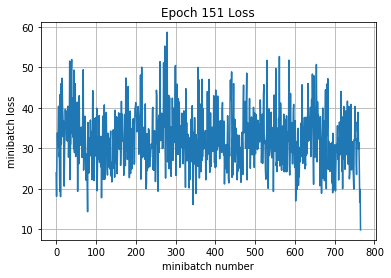

Iteration 115700: with minibatch training loss = 0.638 and accuracy of 0.83
Iteration 115800: with minibatch training loss = 0.498 and accuracy of 0.86
Iteration 115900: with minibatch training loss = 0.445 and accuracy of 0.84
Iteration 116000: with minibatch training loss = 0.384 and accuracy of 0.92
Iteration 116100: with minibatch training loss = 0.349 and accuracy of 0.91
Iteration 116200: with minibatch training loss = 0.694 and accuracy of 0.75
Iteration 116300: with minibatch training loss = 0.625 and accuracy of 0.86
Iteration 116400: with minibatch training loss = 0.42 and accuracy of 0.88
Epoch 152, Overall loss = 0.493 and accuracy of 0.869


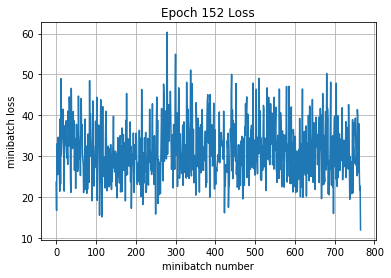

Iteration 116500: with minibatch training loss = 0.438 and accuracy of 0.84
Iteration 116600: with minibatch training loss = 0.449 and accuracy of 0.89
Iteration 116700: with minibatch training loss = 0.586 and accuracy of 0.84
Iteration 116800: with minibatch training loss = 0.462 and accuracy of 0.89
Iteration 116900: with minibatch training loss = 0.545 and accuracy of 0.83
Iteration 117000: with minibatch training loss = 0.482 and accuracy of 0.86
Iteration 117100: with minibatch training loss = 0.488 and accuracy of 0.86
Epoch 153, Overall loss = 0.503 and accuracy of 0.863


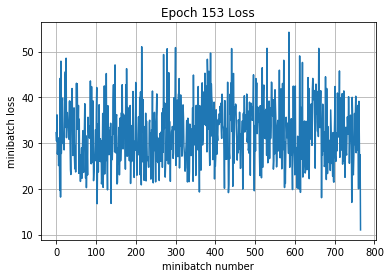

Iteration 117200: with minibatch training loss = 0.547 and accuracy of 0.81
Iteration 117300: with minibatch training loss = 0.685 and accuracy of 0.8
Iteration 117400: with minibatch training loss = 0.341 and accuracy of 0.92
Iteration 117500: with minibatch training loss = 0.314 and accuracy of 0.95
Iteration 117600: with minibatch training loss = 0.513 and accuracy of 0.84
Iteration 117700: with minibatch training loss = 0.417 and accuracy of 0.88
Iteration 117800: with minibatch training loss = 0.441 and accuracy of 0.86
Iteration 117900: with minibatch training loss = 0.406 and accuracy of 0.88
Epoch 154, Overall loss = 0.491 and accuracy of 0.868


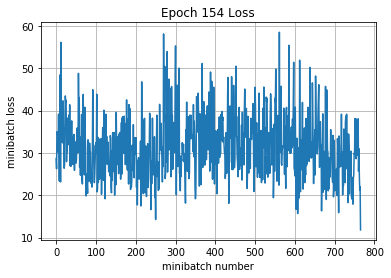

Iteration 118000: with minibatch training loss = 0.359 and accuracy of 0.92
Iteration 118100: with minibatch training loss = 0.447 and accuracy of 0.91
Iteration 118200: with minibatch training loss = 0.434 and accuracy of 0.89
Iteration 118300: with minibatch training loss = 0.503 and accuracy of 0.84
Iteration 118400: with minibatch training loss = 0.567 and accuracy of 0.8
Iteration 118500: with minibatch training loss = 0.493 and accuracy of 0.88
Iteration 118600: with minibatch training loss = 0.526 and accuracy of 0.86
Iteration 118700: with minibatch training loss = 0.37 and accuracy of 0.92
Epoch 155, Overall loss = 0.486 and accuracy of 0.87


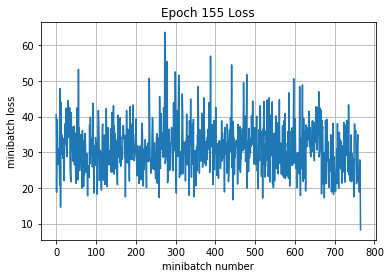

Iteration 118800: with minibatch training loss = 0.646 and accuracy of 0.83
Iteration 118900: with minibatch training loss = 0.584 and accuracy of 0.84
Iteration 119000: with minibatch training loss = 0.749 and accuracy of 0.8
Iteration 119100: with minibatch training loss = 0.587 and accuracy of 0.81
Iteration 119200: with minibatch training loss = 0.518 and accuracy of 0.88
Iteration 119300: with minibatch training loss = 0.462 and accuracy of 0.91
Iteration 119400: with minibatch training loss = 0.761 and accuracy of 0.77
Epoch 156, Overall loss = 0.499 and accuracy of 0.865


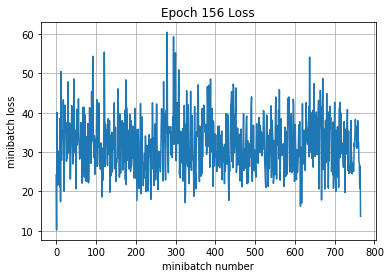

Iteration 119500: with minibatch training loss = 0.318 and accuracy of 0.94
Iteration 119600: with minibatch training loss = 0.43 and accuracy of 0.89
Iteration 119700: with minibatch training loss = 0.418 and accuracy of 0.91
Iteration 119800: with minibatch training loss = 0.676 and accuracy of 0.78
Iteration 119900: with minibatch training loss = 0.511 and accuracy of 0.84
Iteration 120000: with minibatch training loss = 0.503 and accuracy of 0.91
Iteration 120100: with minibatch training loss = 0.397 and accuracy of 0.89
Iteration 120200: with minibatch training loss = 0.568 and accuracy of 0.86
Epoch 157, Overall loss = 0.492 and accuracy of 0.868


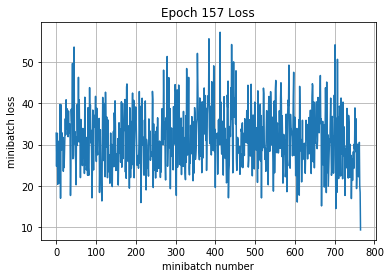

Iteration 120300: with minibatch training loss = 0.615 and accuracy of 0.84
Iteration 120400: with minibatch training loss = 0.275 and accuracy of 0.97
Iteration 120500: with minibatch training loss = 0.452 and accuracy of 0.92
Iteration 120600: with minibatch training loss = 0.629 and accuracy of 0.78
Iteration 120700: with minibatch training loss = 0.587 and accuracy of 0.83
Iteration 120800: with minibatch training loss = 0.513 and accuracy of 0.86
Iteration 120900: with minibatch training loss = 0.587 and accuracy of 0.83
Iteration 121000: with minibatch training loss = 0.47 and accuracy of 0.88
Epoch 158, Overall loss = 0.497 and accuracy of 0.866


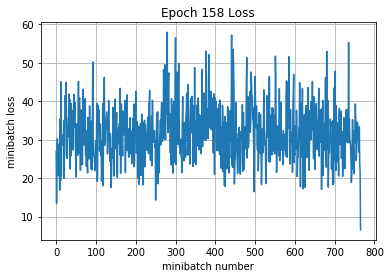

Iteration 121100: with minibatch training loss = 0.589 and accuracy of 0.89
Iteration 121200: with minibatch training loss = 0.468 and accuracy of 0.89
Iteration 121300: with minibatch training loss = 0.56 and accuracy of 0.88
Iteration 121400: with minibatch training loss = 0.627 and accuracy of 0.8
Iteration 121500: with minibatch training loss = 0.461 and accuracy of 0.89
Iteration 121600: with minibatch training loss = 0.513 and accuracy of 0.89
Iteration 121700: with minibatch training loss = 0.415 and accuracy of 0.91
Epoch 159, Overall loss = 0.488 and accuracy of 0.869


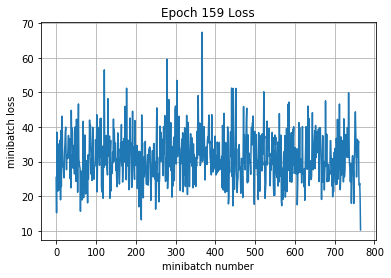

Iteration 121800: with minibatch training loss = 0.449 and accuracy of 0.88
Iteration 121900: with minibatch training loss = 0.432 and accuracy of 0.86
Iteration 122000: with minibatch training loss = 0.389 and accuracy of 0.91
Iteration 122100: with minibatch training loss = 0.399 and accuracy of 0.88
Iteration 122200: with minibatch training loss = 0.558 and accuracy of 0.88
Iteration 122300: with minibatch training loss = 0.401 and accuracy of 0.89
Iteration 122400: with minibatch training loss = 0.26 and accuracy of 0.97
Iteration 122500: with minibatch training loss = 0.34 and accuracy of 0.91
Epoch 160, Overall loss = 0.493 and accuracy of 0.869


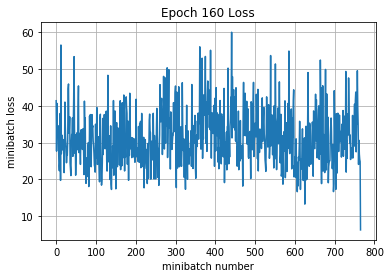

Iteration 122600: with minibatch training loss = 0.596 and accuracy of 0.81
Iteration 122700: with minibatch training loss = 0.467 and accuracy of 0.89
Iteration 122800: with minibatch training loss = 0.383 and accuracy of 0.89
Iteration 122900: with minibatch training loss = 0.475 and accuracy of 0.89
Iteration 123000: with minibatch training loss = 0.582 and accuracy of 0.84
Iteration 123100: with minibatch training loss = 0.511 and accuracy of 0.86
Iteration 123200: with minibatch training loss = 0.555 and accuracy of 0.83
Iteration 123300: with minibatch training loss = 0.418 and accuracy of 0.91
Epoch 161, Overall loss = 0.496 and accuracy of 0.867


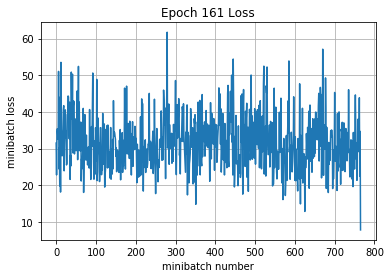

Iteration 123400: with minibatch training loss = 0.359 and accuracy of 0.92
Iteration 123500: with minibatch training loss = 0.405 and accuracy of 0.92
Iteration 123600: with minibatch training loss = 0.439 and accuracy of 0.83
Iteration 123700: with minibatch training loss = 0.342 and accuracy of 0.92
Iteration 123800: with minibatch training loss = 0.528 and accuracy of 0.86
Iteration 123900: with minibatch training loss = 0.415 and accuracy of 0.91
Iteration 124000: with minibatch training loss = 0.344 and accuracy of 0.92
Epoch 162, Overall loss = 0.484 and accuracy of 0.871


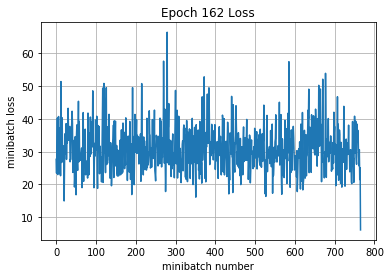

Iteration 124100: with minibatch training loss = 0.344 and accuracy of 0.92
Iteration 124200: with minibatch training loss = 0.459 and accuracy of 0.88
Iteration 124300: with minibatch training loss = 0.472 and accuracy of 0.88
Iteration 124400: with minibatch training loss = 0.834 and accuracy of 0.77
Iteration 124500: with minibatch training loss = 0.526 and accuracy of 0.84
Iteration 124600: with minibatch training loss = 0.361 and accuracy of 0.92
Iteration 124700: with minibatch training loss = 0.279 and accuracy of 0.97
Iteration 124800: with minibatch training loss = 0.37 and accuracy of 0.89
Epoch 163, Overall loss = 0.492 and accuracy of 0.868


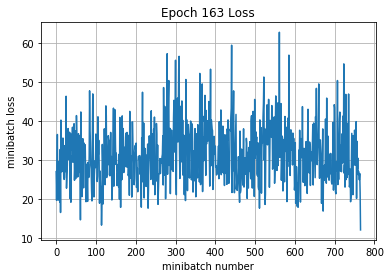

Iteration 124900: with minibatch training loss = 0.446 and accuracy of 0.91
Iteration 125000: with minibatch training loss = 0.46 and accuracy of 0.89
Iteration 125100: with minibatch training loss = 0.546 and accuracy of 0.84
Iteration 125200: with minibatch training loss = 0.464 and accuracy of 0.88
Iteration 125300: with minibatch training loss = 0.45 and accuracy of 0.89
Iteration 125400: with minibatch training loss = 0.429 and accuracy of 0.88
Iteration 125500: with minibatch training loss = 0.507 and accuracy of 0.88
Iteration 125600: with minibatch training loss = 0.409 and accuracy of 0.92
Epoch 164, Overall loss = 0.479 and accuracy of 0.874


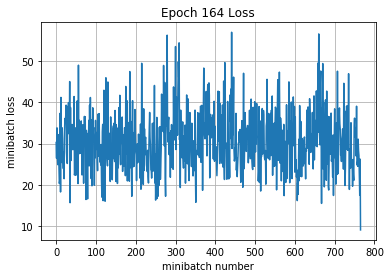

Iteration 125700: with minibatch training loss = 0.452 and accuracy of 0.88
Iteration 125800: with minibatch training loss = 0.709 and accuracy of 0.8
Iteration 125900: with minibatch training loss = 0.581 and accuracy of 0.84
Iteration 126000: with minibatch training loss = 0.352 and accuracy of 0.92
Iteration 126100: with minibatch training loss = 0.559 and accuracy of 0.83
Iteration 126200: with minibatch training loss = 0.449 and accuracy of 0.86
Iteration 126300: with minibatch training loss = 0.567 and accuracy of 0.83
Epoch 165, Overall loss = 0.487 and accuracy of 0.872


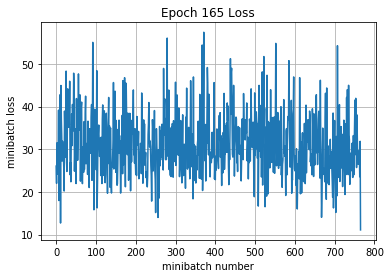

Iteration 126400: with minibatch training loss = 0.511 and accuracy of 0.89
Iteration 126500: with minibatch training loss = 0.454 and accuracy of 0.84
Iteration 126600: with minibatch training loss = 0.366 and accuracy of 0.88
Iteration 126700: with minibatch training loss = 0.343 and accuracy of 0.92
Iteration 126800: with minibatch training loss = 0.47 and accuracy of 0.91
Iteration 126900: with minibatch training loss = 0.508 and accuracy of 0.89
Iteration 127000: with minibatch training loss = 0.438 and accuracy of 0.86
Iteration 127100: with minibatch training loss = 0.451 and accuracy of 0.88
Epoch 166, Overall loss = 0.474 and accuracy of 0.874


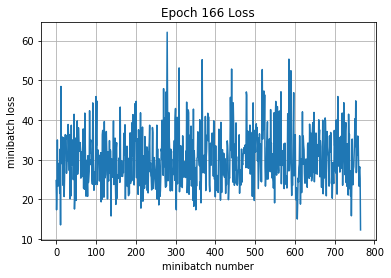

Iteration 127200: with minibatch training loss = 0.425 and accuracy of 0.89
Iteration 127300: with minibatch training loss = 0.606 and accuracy of 0.86
Iteration 127400: with minibatch training loss = 0.409 and accuracy of 0.91
Iteration 127500: with minibatch training loss = 0.335 and accuracy of 0.92
Iteration 127600: with minibatch training loss = 0.367 and accuracy of 0.91
Iteration 127700: with minibatch training loss = 0.465 and accuracy of 0.88
Iteration 127800: with minibatch training loss = 0.567 and accuracy of 0.84
Iteration 127900: with minibatch training loss = 0.49 and accuracy of 0.84
Epoch 167, Overall loss = 0.482 and accuracy of 0.871


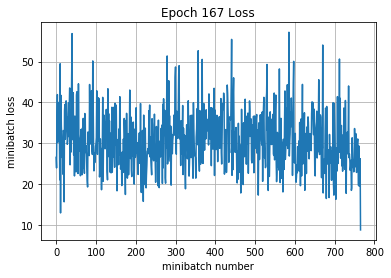

Iteration 128000: with minibatch training loss = 0.211 and accuracy of 0.98
Iteration 128100: with minibatch training loss = 0.542 and accuracy of 0.83
Iteration 128200: with minibatch training loss = 0.515 and accuracy of 0.84
Iteration 128300: with minibatch training loss = 0.405 and accuracy of 0.89
Iteration 128400: with minibatch training loss = 0.551 and accuracy of 0.88
Iteration 128500: with minibatch training loss = 0.391 and accuracy of 0.91
Iteration 128600: with minibatch training loss = 0.47 and accuracy of 0.89
Epoch 168, Overall loss = 0.467 and accuracy of 0.877


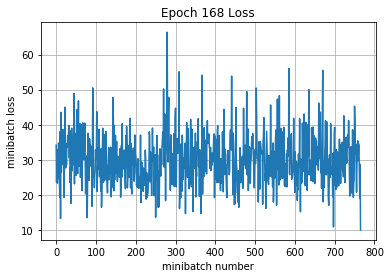

Iteration 128700: with minibatch training loss = 0.705 and accuracy of 0.81
Iteration 128800: with minibatch training loss = 0.446 and accuracy of 0.88
Iteration 128900: with minibatch training loss = 0.591 and accuracy of 0.84
Iteration 129000: with minibatch training loss = 0.312 and accuracy of 0.91
Iteration 129100: with minibatch training loss = 0.512 and accuracy of 0.88
Iteration 129200: with minibatch training loss = 0.395 and accuracy of 0.91
Iteration 129300: with minibatch training loss = 0.633 and accuracy of 0.81
Iteration 129400: with minibatch training loss = 0.564 and accuracy of 0.83
Epoch 169, Overall loss = 0.479 and accuracy of 0.873


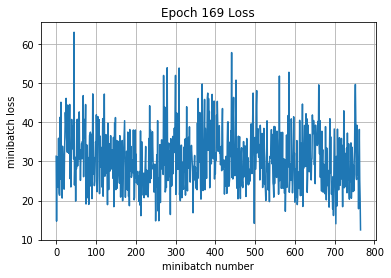

Iteration 129500: with minibatch training loss = 0.538 and accuracy of 0.88
Iteration 129600: with minibatch training loss = 0.595 and accuracy of 0.84
Iteration 129700: with minibatch training loss = 0.605 and accuracy of 0.81
Iteration 129800: with minibatch training loss = 0.354 and accuracy of 0.92
Iteration 129900: with minibatch training loss = 0.676 and accuracy of 0.83
Iteration 130000: with minibatch training loss = 0.405 and accuracy of 0.84
Iteration 130100: with minibatch training loss = 0.408 and accuracy of 0.91
Iteration 130200: with minibatch training loss = 0.384 and accuracy of 0.89
Epoch 170, Overall loss = 0.477 and accuracy of 0.876


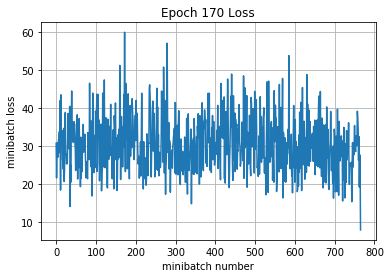

Iteration 130300: with minibatch training loss = 0.549 and accuracy of 0.83
Iteration 130400: with minibatch training loss = 0.668 and accuracy of 0.73
Iteration 130500: with minibatch training loss = 0.444 and accuracy of 0.92
Iteration 130600: with minibatch training loss = 0.645 and accuracy of 0.86
Iteration 130700: with minibatch training loss = 0.729 and accuracy of 0.84
Iteration 130800: with minibatch training loss = 0.268 and accuracy of 0.94
Iteration 130900: with minibatch training loss = 0.608 and accuracy of 0.8
Epoch 171, Overall loss = 0.475 and accuracy of 0.874


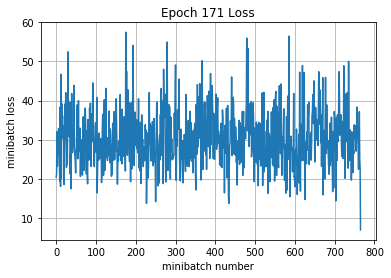

Iteration 131000: with minibatch training loss = 0.563 and accuracy of 0.86
Iteration 131100: with minibatch training loss = 0.419 and accuracy of 0.88
Iteration 131200: with minibatch training loss = 0.232 and accuracy of 0.98
Iteration 131300: with minibatch training loss = 0.54 and accuracy of 0.86
Iteration 131400: with minibatch training loss = 0.538 and accuracy of 0.86
Iteration 131500: with minibatch training loss = 0.526 and accuracy of 0.84
Iteration 131600: with minibatch training loss = 0.194 and accuracy of 0.98
Iteration 131700: with minibatch training loss = 0.405 and accuracy of 0.92
Epoch 172, Overall loss = 0.473 and accuracy of 0.874


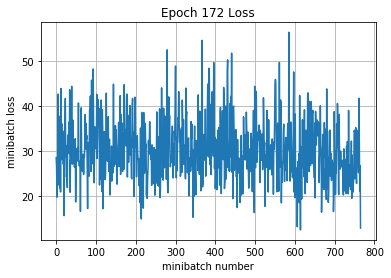

Iteration 131800: with minibatch training loss = 0.511 and accuracy of 0.88
Iteration 131900: with minibatch training loss = 0.56 and accuracy of 0.88
Iteration 132000: with minibatch training loss = 0.292 and accuracy of 0.94
Iteration 132100: with minibatch training loss = 0.65 and accuracy of 0.84
Iteration 132200: with minibatch training loss = 0.313 and accuracy of 0.91
Iteration 132300: with minibatch training loss = 0.584 and accuracy of 0.83
Iteration 132400: with minibatch training loss = 0.525 and accuracy of 0.84
Iteration 132500: with minibatch training loss = 0.36 and accuracy of 0.92
Epoch 173, Overall loss = 0.472 and accuracy of 0.876


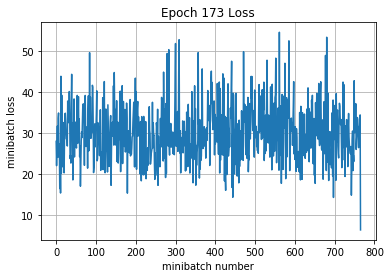

Iteration 132600: with minibatch training loss = 0.439 and accuracy of 0.89
Iteration 132700: with minibatch training loss = 0.328 and accuracy of 0.92
Iteration 132800: with minibatch training loss = 0.44 and accuracy of 0.89
Iteration 132900: with minibatch training loss = 0.546 and accuracy of 0.86
Iteration 133000: with minibatch training loss = 0.609 and accuracy of 0.81
Iteration 133100: with minibatch training loss = 0.516 and accuracy of 0.84
Iteration 133200: with minibatch training loss = 0.437 and accuracy of 0.86
Epoch 174, Overall loss = 0.459 and accuracy of 0.879


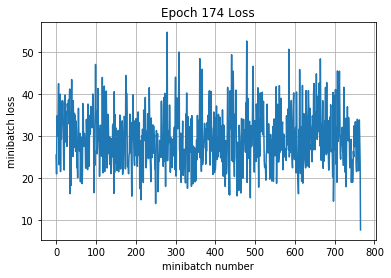

Iteration 133300: with minibatch training loss = 0.478 and accuracy of 0.92
Iteration 133400: with minibatch training loss = 0.455 and accuracy of 0.88
Iteration 133500: with minibatch training loss = 0.377 and accuracy of 0.91
Iteration 133600: with minibatch training loss = 0.534 and accuracy of 0.88
Iteration 133700: with minibatch training loss = 0.347 and accuracy of 0.94
Iteration 133800: with minibatch training loss = 0.452 and accuracy of 0.92
Iteration 133900: with minibatch training loss = 0.399 and accuracy of 0.91
Iteration 134000: with minibatch training loss = 0.538 and accuracy of 0.86
Epoch 175, Overall loss = 0.467 and accuracy of 0.877


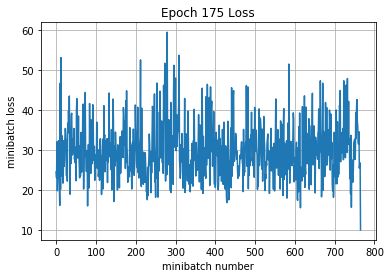

Iteration 134100: with minibatch training loss = 0.364 and accuracy of 0.92
Iteration 134200: with minibatch training loss = 0.316 and accuracy of 0.95
Iteration 134300: with minibatch training loss = 0.299 and accuracy of 0.94
Iteration 134400: with minibatch training loss = 0.303 and accuracy of 0.94
Iteration 134500: with minibatch training loss = 0.417 and accuracy of 0.91
Iteration 134600: with minibatch training loss = 0.497 and accuracy of 0.86
Iteration 134700: with minibatch training loss = 0.419 and accuracy of 0.91
Iteration 134800: with minibatch training loss = 0.344 and accuracy of 0.94
Epoch 176, Overall loss = 0.47 and accuracy of 0.877


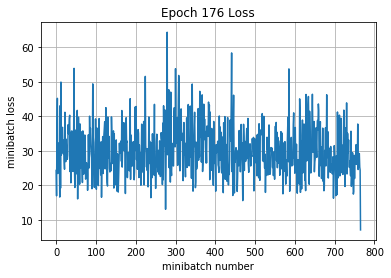

Iteration 134900: with minibatch training loss = 0.582 and accuracy of 0.83
Iteration 135000: with minibatch training loss = 0.43 and accuracy of 0.89
Iteration 135100: with minibatch training loss = 0.554 and accuracy of 0.84
Iteration 135200: with minibatch training loss = 0.574 and accuracy of 0.88
Iteration 135300: with minibatch training loss = 0.416 and accuracy of 0.94
Iteration 135400: with minibatch training loss = 0.535 and accuracy of 0.84
Iteration 135500: with minibatch training loss = 0.492 and accuracy of 0.86
Epoch 177, Overall loss = 0.469 and accuracy of 0.876


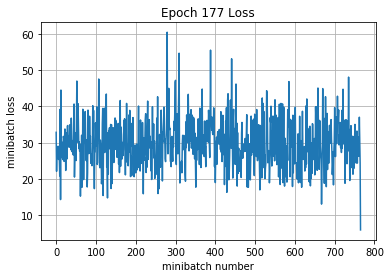

Iteration 135600: with minibatch training loss = 0.57 and accuracy of 0.84
Iteration 135700: with minibatch training loss = 0.451 and accuracy of 0.88
Iteration 135800: with minibatch training loss = 0.442 and accuracy of 0.86
Iteration 135900: with minibatch training loss = 0.406 and accuracy of 0.92
Iteration 136000: with minibatch training loss = 0.569 and accuracy of 0.88
Iteration 136100: with minibatch training loss = 0.433 and accuracy of 0.88
Iteration 136200: with minibatch training loss = 0.435 and accuracy of 0.88
Iteration 136300: with minibatch training loss = 0.421 and accuracy of 0.89
Epoch 178, Overall loss = 0.475 and accuracy of 0.873


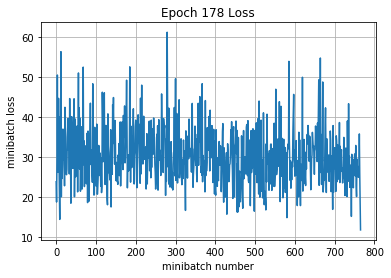

Iteration 136400: with minibatch training loss = 0.472 and accuracy of 0.88
Iteration 136500: with minibatch training loss = 0.431 and accuracy of 0.89
Iteration 136600: with minibatch training loss = 0.588 and accuracy of 0.84
Iteration 136700: with minibatch training loss = 0.602 and accuracy of 0.81
Iteration 136800: with minibatch training loss = 0.586 and accuracy of 0.86
Iteration 136900: with minibatch training loss = 0.579 and accuracy of 0.86
Iteration 137000: with minibatch training loss = 0.534 and accuracy of 0.88
Iteration 137100: with minibatch training loss = 0.482 and accuracy of 0.86
Epoch 179, Overall loss = 0.461 and accuracy of 0.879


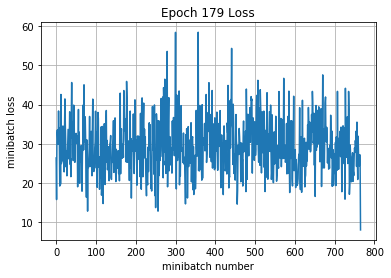

Iteration 137200: with minibatch training loss = 0.518 and accuracy of 0.84
Iteration 137300: with minibatch training loss = 0.514 and accuracy of 0.88
Iteration 137400: with minibatch training loss = 0.49 and accuracy of 0.89
Iteration 137500: with minibatch training loss = 0.33 and accuracy of 0.92
Iteration 137600: with minibatch training loss = 0.571 and accuracy of 0.86
Iteration 137700: with minibatch training loss = 0.52 and accuracy of 0.86
Iteration 137800: with minibatch training loss = 0.525 and accuracy of 0.84
Epoch 180, Overall loss = 0.471 and accuracy of 0.875


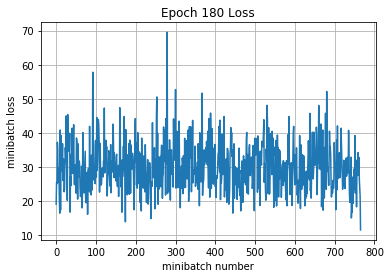

Iteration 137900: with minibatch training loss = 0.469 and accuracy of 0.88
Iteration 138000: with minibatch training loss = 0.604 and accuracy of 0.83
Iteration 138100: with minibatch training loss = 0.54 and accuracy of 0.86
Iteration 138200: with minibatch training loss = 0.371 and accuracy of 0.91
Iteration 138300: with minibatch training loss = 0.423 and accuracy of 0.92
Iteration 138400: with minibatch training loss = 0.571 and accuracy of 0.88
Iteration 138500: with minibatch training loss = 0.362 and accuracy of 0.89
Iteration 138600: with minibatch training loss = 0.338 and accuracy of 0.94
Epoch 181, Overall loss = 0.462 and accuracy of 0.879


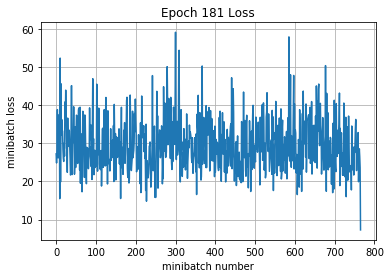

Iteration 138700: with minibatch training loss = 0.407 and accuracy of 0.91
Iteration 138800: with minibatch training loss = 0.337 and accuracy of 0.91
Iteration 138900: with minibatch training loss = 0.442 and accuracy of 0.86
Iteration 139000: with minibatch training loss = 0.314 and accuracy of 0.94
Iteration 139100: with minibatch training loss = 0.513 and accuracy of 0.89
Iteration 139200: with minibatch training loss = 0.354 and accuracy of 0.91
Iteration 139300: with minibatch training loss = 0.683 and accuracy of 0.81
Iteration 139400: with minibatch training loss = 0.464 and accuracy of 0.89
Epoch 182, Overall loss = 0.462 and accuracy of 0.879


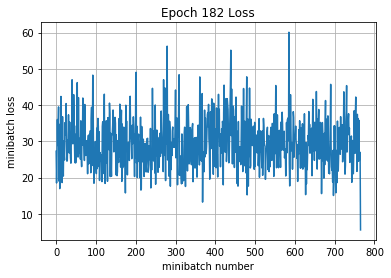

Iteration 139500: with minibatch training loss = 0.406 and accuracy of 0.92
Iteration 139600: with minibatch training loss = 0.481 and accuracy of 0.88
Iteration 139700: with minibatch training loss = 0.572 and accuracy of 0.84
Iteration 139800: with minibatch training loss = 0.559 and accuracy of 0.84
Iteration 139900: with minibatch training loss = 0.347 and accuracy of 0.91
Iteration 140000: with minibatch training loss = 0.353 and accuracy of 0.91
Iteration 140100: with minibatch training loss = 0.539 and accuracy of 0.84
Epoch 183, Overall loss = 0.443 and accuracy of 0.886


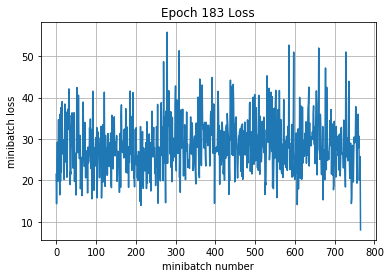

Iteration 140200: with minibatch training loss = 0.649 and accuracy of 0.77
Iteration 140300: with minibatch training loss = 0.39 and accuracy of 0.92
Iteration 140400: with minibatch training loss = 0.32 and accuracy of 0.94
Iteration 140500: with minibatch training loss = 0.447 and accuracy of 0.91
Iteration 140600: with minibatch training loss = 0.533 and accuracy of 0.81
Iteration 140700: with minibatch training loss = 0.567 and accuracy of 0.84
Iteration 140800: with minibatch training loss = 0.317 and accuracy of 0.97
Iteration 140900: with minibatch training loss = 0.401 and accuracy of 0.91
Epoch 184, Overall loss = 0.456 and accuracy of 0.883


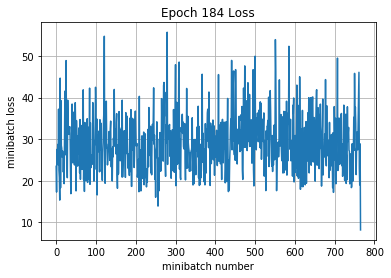

Iteration 141000: with minibatch training loss = 0.508 and accuracy of 0.88
Iteration 141100: with minibatch training loss = 0.358 and accuracy of 0.91
Iteration 141200: with minibatch training loss = 0.295 and accuracy of 0.95
Iteration 141300: with minibatch training loss = 0.471 and accuracy of 0.86
Iteration 141400: with minibatch training loss = 0.39 and accuracy of 0.91
Iteration 141500: with minibatch training loss = 0.47 and accuracy of 0.89
Iteration 141600: with minibatch training loss = 0.46 and accuracy of 0.86
Iteration 141700: with minibatch training loss = 0.411 and accuracy of 0.89
Epoch 185, Overall loss = 0.449 and accuracy of 0.884


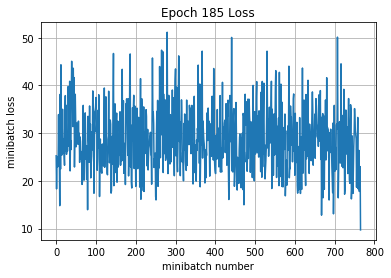

Iteration 141800: with minibatch training loss = 0.454 and accuracy of 0.91
Iteration 141900: with minibatch training loss = 0.357 and accuracy of 0.94
Iteration 142000: with minibatch training loss = 0.468 and accuracy of 0.88
Iteration 142100: with minibatch training loss = 0.501 and accuracy of 0.88
Iteration 142200: with minibatch training loss = 0.494 and accuracy of 0.84
Iteration 142300: with minibatch training loss = 0.394 and accuracy of 0.92
Iteration 142400: with minibatch training loss = 0.469 and accuracy of 0.89
Epoch 186, Overall loss = 0.454 and accuracy of 0.882


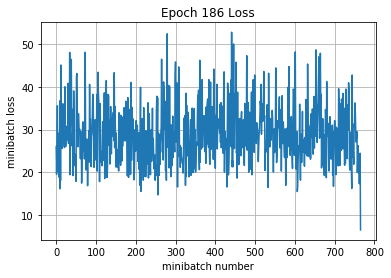

Iteration 142500: with minibatch training loss = 0.351 and accuracy of 0.94
Iteration 142600: with minibatch training loss = 0.477 and accuracy of 0.86
Iteration 142700: with minibatch training loss = 0.411 and accuracy of 0.89
Iteration 142800: with minibatch training loss = 0.386 and accuracy of 0.92
Iteration 142900: with minibatch training loss = 0.484 and accuracy of 0.86
Iteration 143000: with minibatch training loss = 0.461 and accuracy of 0.89
Iteration 143100: with minibatch training loss = 0.485 and accuracy of 0.86
Iteration 143200: with minibatch training loss = 0.499 and accuracy of 0.84
Epoch 187, Overall loss = 0.459 and accuracy of 0.88


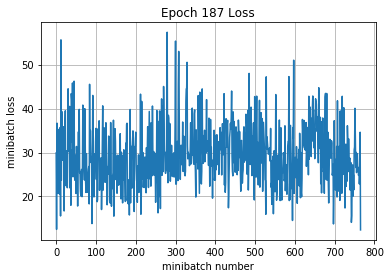

Iteration 143300: with minibatch training loss = 0.46 and accuracy of 0.84
Iteration 143400: with minibatch training loss = 0.42 and accuracy of 0.89
Iteration 143500: with minibatch training loss = 0.389 and accuracy of 0.92
Iteration 143600: with minibatch training loss = 0.485 and accuracy of 0.88
Iteration 143700: with minibatch training loss = 0.492 and accuracy of 0.86
Iteration 143800: with minibatch training loss = 0.597 and accuracy of 0.86
Iteration 143900: with minibatch training loss = 0.579 and accuracy of 0.86
Iteration 144000: with minibatch training loss = 0.41 and accuracy of 0.91
Epoch 188, Overall loss = 0.455 and accuracy of 0.882


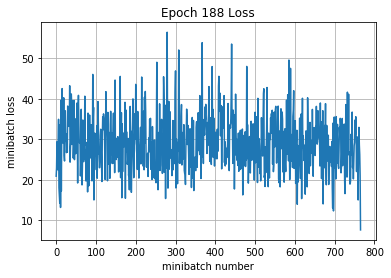

Iteration 144100: with minibatch training loss = 0.52 and accuracy of 0.88
Iteration 144200: with minibatch training loss = 0.369 and accuracy of 0.91
Iteration 144300: with minibatch training loss = 0.556 and accuracy of 0.86
Iteration 144400: with minibatch training loss = 0.629 and accuracy of 0.86
Iteration 144500: with minibatch training loss = 0.56 and accuracy of 0.83
Iteration 144600: with minibatch training loss = 0.428 and accuracy of 0.91
Iteration 144700: with minibatch training loss = 0.415 and accuracy of 0.89
Epoch 189, Overall loss = 0.455 and accuracy of 0.883


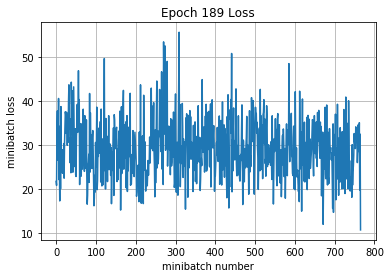

Iteration 144800: with minibatch training loss = 0.39 and accuracy of 0.91
Iteration 144900: with minibatch training loss = 0.441 and accuracy of 0.86
Iteration 145000: with minibatch training loss = 0.436 and accuracy of 0.86
Iteration 145100: with minibatch training loss = 0.526 and accuracy of 0.86
Iteration 145200: with minibatch training loss = 0.403 and accuracy of 0.89
Iteration 145300: with minibatch training loss = 0.34 and accuracy of 0.92
Iteration 145400: with minibatch training loss = 0.358 and accuracy of 0.91
Iteration 145500: with minibatch training loss = 0.321 and accuracy of 0.91
Epoch 190, Overall loss = 0.447 and accuracy of 0.884


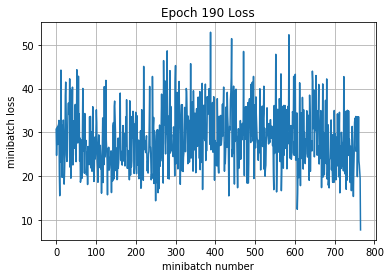

Iteration 145600: with minibatch training loss = 0.435 and accuracy of 0.88
Iteration 145700: with minibatch training loss = 0.443 and accuracy of 0.89
Iteration 145800: with minibatch training loss = 0.568 and accuracy of 0.84
Iteration 145900: with minibatch training loss = 0.19 and accuracy of 1
Iteration 146000: with minibatch training loss = 0.385 and accuracy of 0.92
Iteration 146100: with minibatch training loss = 0.357 and accuracy of 0.92
Iteration 146200: with minibatch training loss = 0.631 and accuracy of 0.81
Iteration 146300: with minibatch training loss = 0.423 and accuracy of 0.89
Epoch 191, Overall loss = 0.448 and accuracy of 0.885


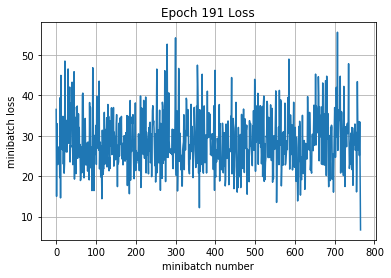

Iteration 146400: with minibatch training loss = 0.422 and accuracy of 0.86
Iteration 146500: with minibatch training loss = 0.509 and accuracy of 0.89
Iteration 146600: with minibatch training loss = 0.444 and accuracy of 0.89
Iteration 146700: with minibatch training loss = 0.416 and accuracy of 0.91
Iteration 146800: with minibatch training loss = 0.521 and accuracy of 0.84
Iteration 146900: with minibatch training loss = 0.402 and accuracy of 0.89
Iteration 147000: with minibatch training loss = 0.449 and accuracy of 0.88
Epoch 192, Overall loss = 0.453 and accuracy of 0.883


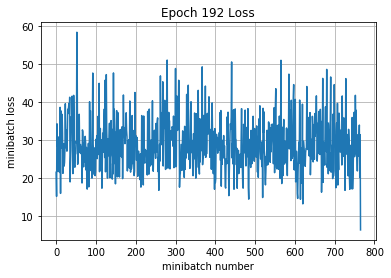

Iteration 147100: with minibatch training loss = 0.432 and accuracy of 0.89
Iteration 147200: with minibatch training loss = 0.327 and accuracy of 0.94
Iteration 147300: with minibatch training loss = 0.36 and accuracy of 0.94
Iteration 147400: with minibatch training loss = 0.561 and accuracy of 0.84
Iteration 147500: with minibatch training loss = 0.385 and accuracy of 0.89
Iteration 147600: with minibatch training loss = 0.358 and accuracy of 0.91
Iteration 147700: with minibatch training loss = 0.395 and accuracy of 0.91
Iteration 147800: with minibatch training loss = 0.488 and accuracy of 0.86
Epoch 193, Overall loss = 0.441 and accuracy of 0.887


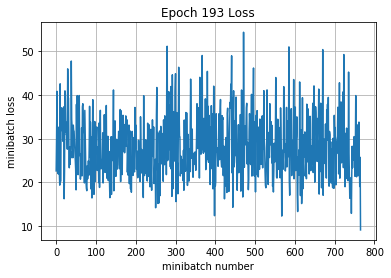

Iteration 147900: with minibatch training loss = 0.52 and accuracy of 0.86
Iteration 148000: with minibatch training loss = 0.31 and accuracy of 0.92
Iteration 148100: with minibatch training loss = 0.319 and accuracy of 0.94
Iteration 148200: with minibatch training loss = 0.362 and accuracy of 0.92
Iteration 148300: with minibatch training loss = 0.391 and accuracy of 0.89
Iteration 148400: with minibatch training loss = 0.349 and accuracy of 0.91
Iteration 148500: with minibatch training loss = 0.558 and accuracy of 0.86
Iteration 148600: with minibatch training loss = 0.512 and accuracy of 0.86
Epoch 194, Overall loss = 0.437 and accuracy of 0.887


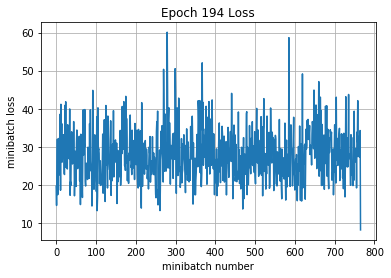

Iteration 148700: with minibatch training loss = 0.345 and accuracy of 0.92
Iteration 148800: with minibatch training loss = 0.273 and accuracy of 0.95
Iteration 148900: with minibatch training loss = 0.448 and accuracy of 0.92
Iteration 149000: with minibatch training loss = 0.529 and accuracy of 0.86
Iteration 149100: with minibatch training loss = 0.448 and accuracy of 0.91
Iteration 149200: with minibatch training loss = 0.637 and accuracy of 0.84
Iteration 149300: with minibatch training loss = 0.378 and accuracy of 0.92
Epoch 195, Overall loss = 0.444 and accuracy of 0.885


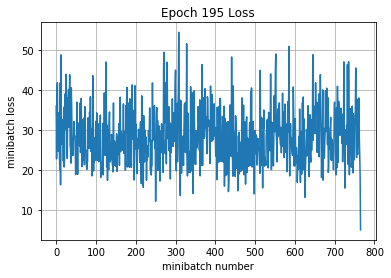

Iteration 149400: with minibatch training loss = 0.61 and accuracy of 0.84
Iteration 149500: with minibatch training loss = 0.482 and accuracy of 0.88
Iteration 149600: with minibatch training loss = 0.454 and accuracy of 0.89
Iteration 149700: with minibatch training loss = 0.343 and accuracy of 0.91
Iteration 149800: with minibatch training loss = 0.654 and accuracy of 0.83
Iteration 149900: with minibatch training loss = 0.674 and accuracy of 0.83
Iteration 150000: with minibatch training loss = 0.42 and accuracy of 0.91
Iteration 150100: with minibatch training loss = 0.536 and accuracy of 0.84
Epoch 196, Overall loss = 0.448 and accuracy of 0.885


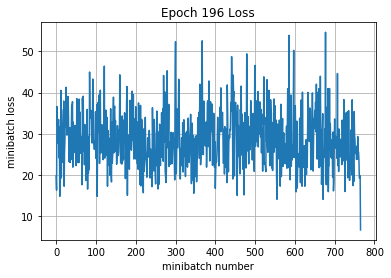

Iteration 150200: with minibatch training loss = 0.46 and accuracy of 0.91
Iteration 150300: with minibatch training loss = 0.429 and accuracy of 0.91
Iteration 150400: with minibatch training loss = 0.447 and accuracy of 0.91
Iteration 150500: with minibatch training loss = 0.481 and accuracy of 0.86
Iteration 150600: with minibatch training loss = 0.254 and accuracy of 0.95
Iteration 150700: with minibatch training loss = 0.411 and accuracy of 0.91
Iteration 150800: with minibatch training loss = 0.61 and accuracy of 0.86
Iteration 150900: with minibatch training loss = 0.398 and accuracy of 0.89
Epoch 197, Overall loss = 0.443 and accuracy of 0.886


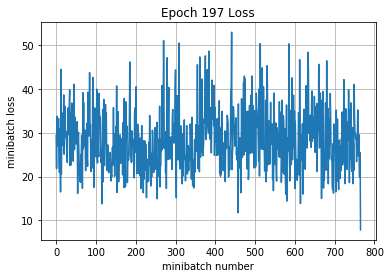

Iteration 151000: with minibatch training loss = 0.335 and accuracy of 0.91
Iteration 151100: with minibatch training loss = 0.479 and accuracy of 0.86
Iteration 151200: with minibatch training loss = 0.439 and accuracy of 0.89
Iteration 151300: with minibatch training loss = 0.251 and accuracy of 0.97
Iteration 151400: with minibatch training loss = 0.257 and accuracy of 0.92
Iteration 151500: with minibatch training loss = 0.362 and accuracy of 0.92
Iteration 151600: with minibatch training loss = 0.29 and accuracy of 0.95
Epoch 198, Overall loss = 0.449 and accuracy of 0.883


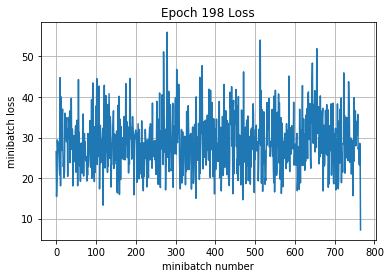

Iteration 151700: with minibatch training loss = 0.506 and accuracy of 0.89
Iteration 151800: with minibatch training loss = 0.465 and accuracy of 0.86
Iteration 151900: with minibatch training loss = 0.395 and accuracy of 0.92
Iteration 152000: with minibatch training loss = 0.539 and accuracy of 0.86
Iteration 152100: with minibatch training loss = 0.388 and accuracy of 0.89
Iteration 152200: with minibatch training loss = 0.387 and accuracy of 0.89
Iteration 152300: with minibatch training loss = 0.394 and accuracy of 0.92
Iteration 152400: with minibatch training loss = 0.567 and accuracy of 0.86
Epoch 199, Overall loss = 0.43 and accuracy of 0.89


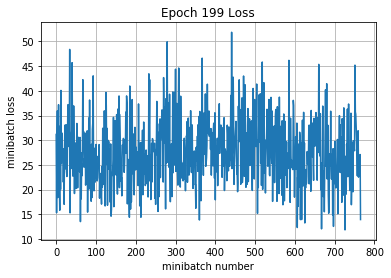

Iteration 152500: with minibatch training loss = 0.272 and accuracy of 0.95
Iteration 152600: with minibatch training loss = 0.546 and accuracy of 0.81
Iteration 152700: with minibatch training loss = 0.552 and accuracy of 0.8
Iteration 152800: with minibatch training loss = 0.46 and accuracy of 0.89
Iteration 152900: with minibatch training loss = 0.59 and accuracy of 0.86
Iteration 153000: with minibatch training loss = 0.33 and accuracy of 0.92
Iteration 153100: with minibatch training loss = 0.506 and accuracy of 0.84
Epoch 200, Overall loss = 0.441 and accuracy of 0.888


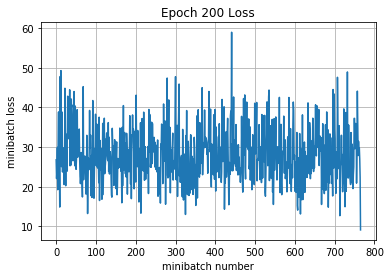

Validation
Epoch 1, Overall loss = 1.21 and accuracy of 0.676
CPU times: user 29min 49s, sys: 5min 17s, total: 35min 7s
Wall time: 24min 57s


In [59]:
%%time
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy

epochs = 200

sess = tf.Session(config=config)

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,epochs,64,100,train_step,True, 
          keep_prob_value=keep_prob_value)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [60]:
# Test your model here, and make sure 
# the output of this cell is the accuracy
# of your best model on the training and val sets
# We're looking for >= 70% accuracy on Validation
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Training
Epoch 1, Overall loss = 0.488 and accuracy of 0.868
Validation
Epoch 1, Overall loss = 1.21 and accuracy of 0.676


(1.2101727209091186, 0.676)

### Describe what you did here
In this cell you should also write an explanation of what you did, any additional features that you implemented, and any visualizations or graphs that you make in the process of training and evaluating your network

_Tell us here_

0.1 Basic model, no global avg pooling

Training
Iteration 0: with minibatch training loss = 31.5 and accuracy of 0.031
Iteration 100: with minibatch training loss = 2.09 and accuracy of 0.23
Iteration 200: with minibatch training loss = 1.93 and accuracy of 0.23
Iteration 300: with minibatch training loss = 1.68 and accuracy of 0.34
Iteration 400: with minibatch training loss = 1.76 and accuracy of 0.33
Iteration 500: with minibatch training loss = 1.53 and accuracy of 0.42
Iteration 600: with minibatch training loss = 1.69 and accuracy of 0.42
Iteration 700: with minibatch training loss = 1.65 and accuracy of 0.44
Epoch 1, Overall loss = 48.3 and accuracy of 0.314


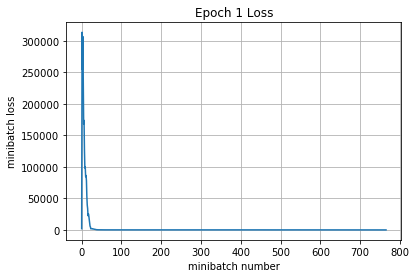

Iteration 800: with minibatch training loss = 1.64 and accuracy of 0.44
Iteration 900: with minibatch training loss = 1.39 and accuracy of 0.45
Iteration 1000: with minibatch training loss = 1.47 and accuracy of 0.47
Iteration 1100: with minibatch training loss = 1.6 and accuracy of 0.36
Iteration 1200: with minibatch training loss = 1.76 and accuracy of 0.41
Iteration 1300: with minibatch training loss = 1.68 and accuracy of 0.42
Iteration 1400: with minibatch training loss = 1.34 and accuracy of 0.48
Iteration 1500: with minibatch training loss = 1.32 and accuracy of 0.5
Epoch 2, Overall loss = 1.54 and accuracy of 0.432


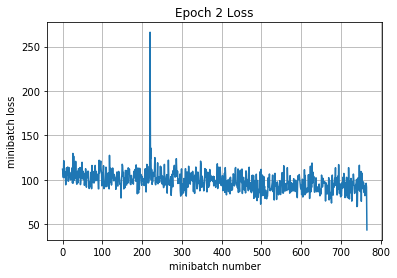

Iteration 1600: with minibatch training loss = 1.31 and accuracy of 0.47
Iteration 1700: with minibatch training loss = 1.42 and accuracy of 0.47
Iteration 1800: with minibatch training loss = 1.35 and accuracy of 0.52
Iteration 1900: with minibatch training loss = 1.47 and accuracy of 0.41
Iteration 2000: with minibatch training loss = 1.74 and accuracy of 0.48
Iteration 2100: with minibatch training loss = 1.56 and accuracy of 0.42
Iteration 2200: with minibatch training loss = 1.22 and accuracy of 0.58
Epoch 3, Overall loss = 1.37 and accuracy of 0.5


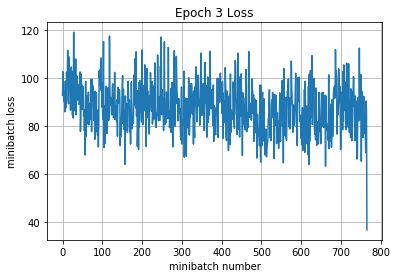

Iteration 2300: with minibatch training loss = 1.46 and accuracy of 0.47
Iteration 2400: with minibatch training loss = 1.46 and accuracy of 0.41
Iteration 2500: with minibatch training loss = 1.16 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 1.16 and accuracy of 0.5
Iteration 2700: with minibatch training loss = 1.47 and accuracy of 0.42
Iteration 2800: with minibatch training loss = 1.38 and accuracy of 0.48
Iteration 2900: with minibatch training loss = 1.32 and accuracy of 0.55
Iteration 3000: with minibatch training loss = 1.31 and accuracy of 0.5
Epoch 4, Overall loss = 1.31 and accuracy of 0.522


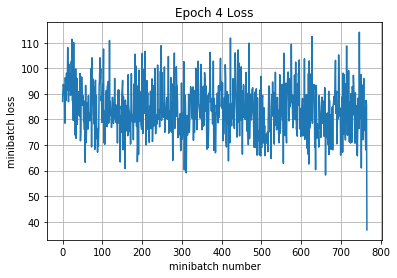

Iteration 3100: with minibatch training loss = 1.32 and accuracy of 0.58
Iteration 3200: with minibatch training loss = 1.15 and accuracy of 0.58
Iteration 3300: with minibatch training loss = 1.37 and accuracy of 0.56
Iteration 3400: with minibatch training loss = 1.31 and accuracy of 0.55
Iteration 3500: with minibatch training loss = 1.49 and accuracy of 0.52
Iteration 3600: with minibatch training loss = 1.23 and accuracy of 0.55
Iteration 3700: with minibatch training loss = 0.905 and accuracy of 0.7
Iteration 3800: with minibatch training loss = 1.43 and accuracy of 0.48
Epoch 5, Overall loss = 1.28 and accuracy of 0.535


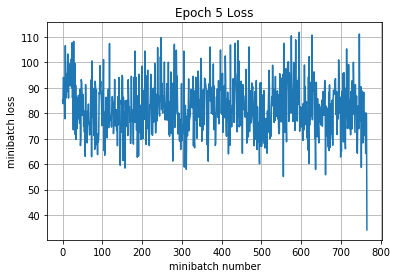

Iteration 3900: with minibatch training loss = 1.12 and accuracy of 0.64
Iteration 4000: with minibatch training loss = 1.17 and accuracy of 0.58
Iteration 4100: with minibatch training loss = 1.3 and accuracy of 0.59
Iteration 4200: with minibatch training loss = 1.44 and accuracy of 0.48
Iteration 4300: with minibatch training loss = 1.19 and accuracy of 0.55
Iteration 4400: with minibatch training loss = 1.56 and accuracy of 0.52
Iteration 4500: with minibatch training loss = 0.948 and accuracy of 0.61
Epoch 6, Overall loss = 1.26 and accuracy of 0.543


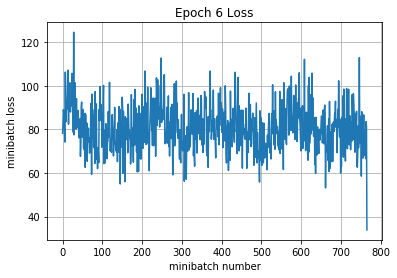

Iteration 4600: with minibatch training loss = 1.28 and accuracy of 0.56
Iteration 4700: with minibatch training loss = 0.999 and accuracy of 0.66
Iteration 4800: with minibatch training loss = 1.27 and accuracy of 0.58
Iteration 4900: with minibatch training loss = 1.18 and accuracy of 0.56
Iteration 5000: with minibatch training loss = 1.29 and accuracy of 0.55
Iteration 5100: with minibatch training loss = 1.11 and accuracy of 0.62
Iteration 5200: with minibatch training loss = 0.96 and accuracy of 0.59
Iteration 5300: with minibatch training loss = 1.2 and accuracy of 0.56
Epoch 7, Overall loss = 1.25 and accuracy of 0.544


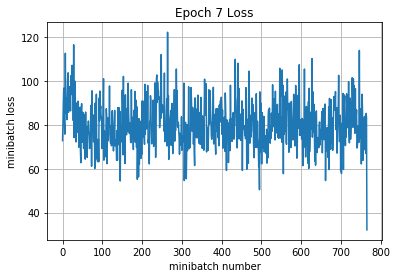

Iteration 5400: with minibatch training loss = 1.28 and accuracy of 0.53
Iteration 5500: with minibatch training loss = 1.03 and accuracy of 0.64
Iteration 5600: with minibatch training loss = 1.49 and accuracy of 0.52
Iteration 5700: with minibatch training loss = 1.09 and accuracy of 0.59
Iteration 5800: with minibatch training loss = 1.2 and accuracy of 0.56
Iteration 5900: with minibatch training loss = 1.29 and accuracy of 0.59
Iteration 6000: with minibatch training loss = 1.29 and accuracy of 0.47
Iteration 6100: with minibatch training loss = 1.34 and accuracy of 0.55
Epoch 8, Overall loss = 1.25 and accuracy of 0.548


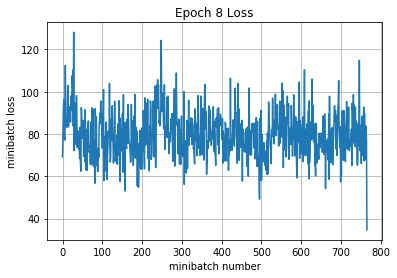

Iteration 6200: with minibatch training loss = 1.34 and accuracy of 0.56
Iteration 6300: with minibatch training loss = 1.13 and accuracy of 0.58
Iteration 6400: with minibatch training loss = 1.33 and accuracy of 0.53
Iteration 6500: with minibatch training loss = 1.21 and accuracy of 0.5
Iteration 6600: with minibatch training loss = 1.31 and accuracy of 0.64
Iteration 6700: with minibatch training loss = 1.37 and accuracy of 0.53
Iteration 6800: with minibatch training loss = 1 and accuracy of 0.69
Epoch 9, Overall loss = 1.25 and accuracy of 0.548


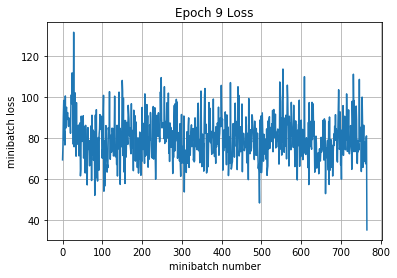

Iteration 6900: with minibatch training loss = 1.16 and accuracy of 0.59
Iteration 7000: with minibatch training loss = 0.908 and accuracy of 0.7
Iteration 7100: with minibatch training loss = 1.12 and accuracy of 0.64
Iteration 7200: with minibatch training loss = 1.03 and accuracy of 0.62
Iteration 7300: with minibatch training loss = 1.33 and accuracy of 0.44
Iteration 7400: with minibatch training loss = 1.2 and accuracy of 0.58
Iteration 7500: with minibatch training loss = 1.26 and accuracy of 0.55
Iteration 7600: with minibatch training loss = 1.03 and accuracy of 0.64
Epoch 10, Overall loss = 1.26 and accuracy of 0.549


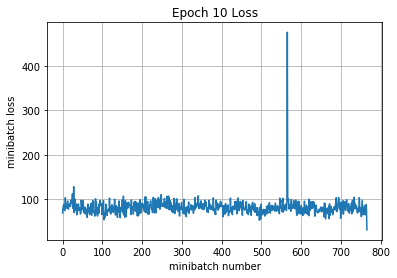

Validation
Epoch 1, Overall loss = 1.63 and accuracy of 0.501


(1.6284531030654907, 0.501)

In [11]:
params = dict(
    filter_size=7,
    filters_count=32,
    pool_size=1,
    pool_stride=1,
    stride=2,
    max_pooling_use=True,
    spatial_batch_norm=False,
    vanilla_batch_norm=False,
    net_architecture='v1',
    learning_rate_decay=False,
    global_avg_pooling=False,
    regularizer=regularizer,
    dropout_use=False,
    N=None,
    M=None)

# output_size:  26
# output_size:  25

# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session(config=config)

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [12]:
# Test your model here, and make sure 
# the output of this cell is the accuracy
# of your best model on the training and val sets
# We're looking for >= 70% accuracy on Validation
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Training
Epoch 1, Overall loss = 1.37 and accuracy of 0.529
Validation
Epoch 1, Overall loss = 1.63 and accuracy of 0.501


(1.6284530811309814, 0.501)

0.2 Global Avg Pooling

In [ ]:
params = dict(
    filter_size=7,
    filters_count=32,
    pool_size=2,
    pool_stride=2,
    stride=2,
    max_pooling_use=True,
    spatial_batch_norm=False,
    vanilla_batch_norm=False,
    net_architecture='v1',
    learning_rate_decay=False,
    global_avg_pooling=True,
    regularizer=regularizer,
    dropout_use=False,
    N=None,
    M=None)

Training
Iteration 0: with minibatch training loss = 33.4 and accuracy of 0.22
Iteration 100: with minibatch training loss = 2.92 and accuracy of 0.3
Iteration 200: with minibatch training loss = 2.6 and accuracy of 0.28
Iteration 300: with minibatch training loss = 2.37 and accuracy of 0.25
Iteration 400: with minibatch training loss = 2.32 and accuracy of 0.38
Iteration 500: with minibatch training loss = 1.82 and accuracy of 0.38
Iteration 600: with minibatch training loss = 2.03 and accuracy of 0.34
Iteration 700: with minibatch training loss = 2.05 and accuracy of 0.34
Epoch 1, Overall loss = 2.93 and accuracy of 0.3


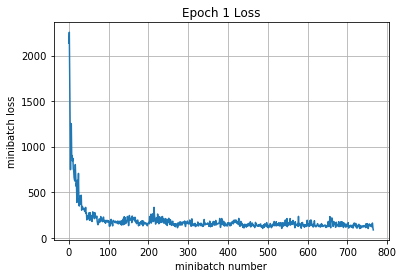

Iteration 800: with minibatch training loss = 1.95 and accuracy of 0.34
Iteration 900: with minibatch training loss = 1.77 and accuracy of 0.36
Iteration 1000: with minibatch training loss = 2.07 and accuracy of 0.33
Iteration 1100: with minibatch training loss = 2.07 and accuracy of 0.38
Iteration 1200: with minibatch training loss = 1.97 and accuracy of 0.28
Iteration 1300: with minibatch training loss = 1.71 and accuracy of 0.38
Iteration 1400: with minibatch training loss = 2.22 and accuracy of 0.25
Iteration 1500: with minibatch training loss = 1.78 and accuracy of 0.41
Epoch 2, Overall loss = 2.05 and accuracy of 0.365


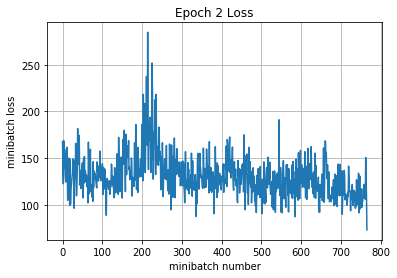

Iteration 1600: with minibatch training loss = 2.04 and accuracy of 0.33
Iteration 1700: with minibatch training loss = 2.27 and accuracy of 0.28
Iteration 1800: with minibatch training loss = 1.61 and accuracy of 0.39
Iteration 1900: with minibatch training loss = 1.68 and accuracy of 0.39
Iteration 2000: with minibatch training loss = 1.76 and accuracy of 0.41
Iteration 2100: with minibatch training loss = 1.51 and accuracy of 0.42
Iteration 2200: with minibatch training loss = 1.6 and accuracy of 0.47
Epoch 3, Overall loss = 1.88 and accuracy of 0.389


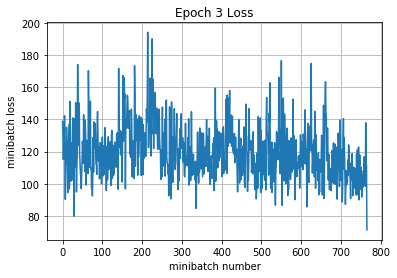

Iteration 2300: with minibatch training loss = 1.7 and accuracy of 0.41
Iteration 2400: with minibatch training loss = 1.57 and accuracy of 0.47
Iteration 2500: with minibatch training loss = 1.52 and accuracy of 0.48
Iteration 2600: with minibatch training loss = 1.9 and accuracy of 0.39
Iteration 2700: with minibatch training loss = 1.75 and accuracy of 0.41
Iteration 2800: with minibatch training loss = 1.45 and accuracy of 0.47
Iteration 2900: with minibatch training loss = 1.51 and accuracy of 0.39
Iteration 3000: with minibatch training loss = 1.8 and accuracy of 0.48
Epoch 4, Overall loss = 1.77 and accuracy of 0.406


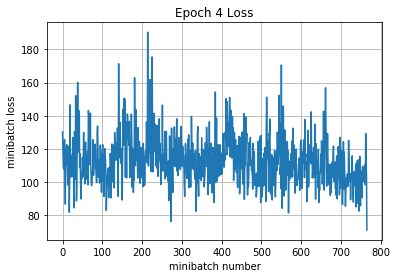

Iteration 3100: with minibatch training loss = 1.48 and accuracy of 0.48
Iteration 3200: with minibatch training loss = 1.73 and accuracy of 0.44
Iteration 3300: with minibatch training loss = 1.7 and accuracy of 0.39
Iteration 3400: with minibatch training loss = 1.26 and accuracy of 0.64
Iteration 3500: with minibatch training loss = 1.69 and accuracy of 0.36
Iteration 3600: with minibatch training loss = 1.55 and accuracy of 0.39
Iteration 3700: with minibatch training loss = 1.44 and accuracy of 0.41
Iteration 3800: with minibatch training loss = 1.54 and accuracy of 0.38
Epoch 5, Overall loss = 1.69 and accuracy of 0.422


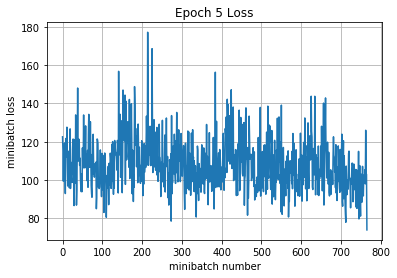

Iteration 3900: with minibatch training loss = 1.95 and accuracy of 0.33
Iteration 4000: with minibatch training loss = 1.64 and accuracy of 0.36
Iteration 4100: with minibatch training loss = 1.55 and accuracy of 0.36
Iteration 4200: with minibatch training loss = 1.44 and accuracy of 0.48
Iteration 4300: with minibatch training loss = 1.68 and accuracy of 0.39
Iteration 4400: with minibatch training loss = 1.31 and accuracy of 0.55
Iteration 4500: with minibatch training loss = 1.43 and accuracy of 0.5
Epoch 6, Overall loss = 1.64 and accuracy of 0.433


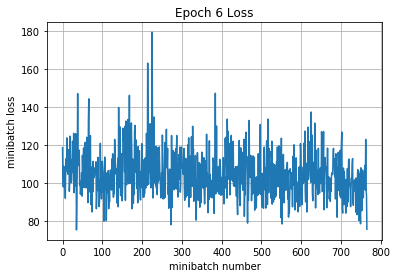

Iteration 4600: with minibatch training loss = 1.54 and accuracy of 0.45
Iteration 4700: with minibatch training loss = 1.14 and accuracy of 0.61
Iteration 4800: with minibatch training loss = 1.36 and accuracy of 0.52
Iteration 4900: with minibatch training loss = 1.64 and accuracy of 0.39
Iteration 5000: with minibatch training loss = 1.69 and accuracy of 0.47
Iteration 5100: with minibatch training loss = 1.5 and accuracy of 0.45
Iteration 5200: with minibatch training loss = 1.56 and accuracy of 0.41
Iteration 5300: with minibatch training loss = 1.28 and accuracy of 0.48
Epoch 7, Overall loss = 1.61 and accuracy of 0.441


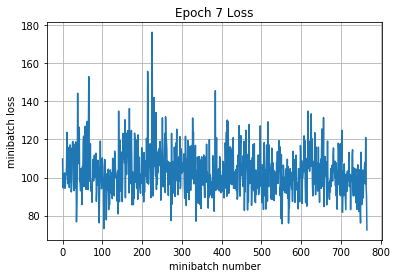

Iteration 5400: with minibatch training loss = 2.15 and accuracy of 0.36
Iteration 5500: with minibatch training loss = 1.57 and accuracy of 0.45
Iteration 5600: with minibatch training loss = 1.5 and accuracy of 0.44
Iteration 5700: with minibatch training loss = 1.49 and accuracy of 0.5
Iteration 5800: with minibatch training loss = 1.61 and accuracy of 0.41
Iteration 5900: with minibatch training loss = 1.61 and accuracy of 0.38
Iteration 6000: with minibatch training loss = 1.44 and accuracy of 0.48
Iteration 6100: with minibatch training loss = 1.34 and accuracy of 0.42
Epoch 8, Overall loss = 1.57 and accuracy of 0.449


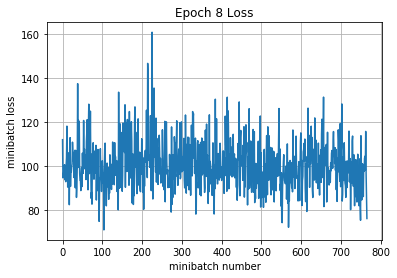

Iteration 6200: with minibatch training loss = 1.31 and accuracy of 0.56
Iteration 6300: with minibatch training loss = 1.65 and accuracy of 0.41
Iteration 6400: with minibatch training loss = 1.58 and accuracy of 0.39
Iteration 6500: with minibatch training loss = 1.57 and accuracy of 0.52
Iteration 6600: with minibatch training loss = 1.61 and accuracy of 0.39
Iteration 6700: with minibatch training loss = 1.6 and accuracy of 0.36
Iteration 6800: with minibatch training loss = 1.47 and accuracy of 0.48
Epoch 9, Overall loss = 1.55 and accuracy of 0.455


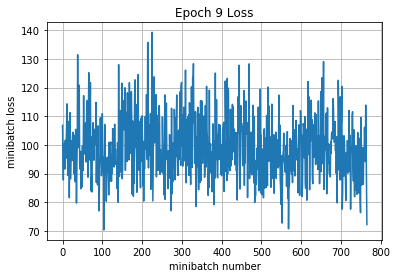

Iteration 6900: with minibatch training loss = 1.43 and accuracy of 0.45
Iteration 7000: with minibatch training loss = 1.63 and accuracy of 0.44
Iteration 7100: with minibatch training loss = 1.4 and accuracy of 0.5
Iteration 7200: with minibatch training loss = 1.5 and accuracy of 0.42
Iteration 7300: with minibatch training loss = 1.31 and accuracy of 0.55
Iteration 7400: with minibatch training loss = 1.53 and accuracy of 0.48
Iteration 7500: with minibatch training loss = 1.7 and accuracy of 0.38
Iteration 7600: with minibatch training loss = 1.44 and accuracy of 0.38
Epoch 10, Overall loss = 1.53 and accuracy of 0.459


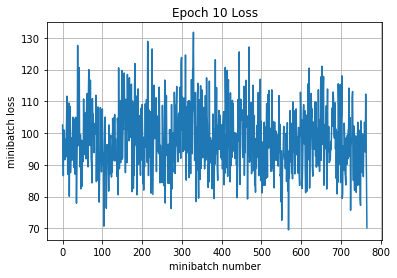

Validation
Epoch 1, Overall loss = 1.51 and accuracy of 0.476


(1.5090888538360596, 0.476)

In [22]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session(config=config)

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [23]:
# Test your model here, and make sure 
# the output of this cell is the accuracy
# of your best model on the training and val sets
# We're looking for >= 70% accuracy on Validation
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Training
Epoch 1, Overall loss = 1.5 and accuracy of 0.471
Validation
Epoch 1, Overall loss = 1.51 and accuracy of 0.476


(1.5090888538360596, 0.476)

0.3 'v2' architecture; overfitting(

In [16]:
regularizer = tf.contrib.layers.l2_regularizer(0.0)

params = dict(
    filter_size=[7,6,5],  # [7,6,5],
    filters_count=[64,64,64], # [32, 32, 32],
    pool_size=[4,3,2],  # [1, 1, 1],
    pool_stride=[1,1,2],  # [1, 1, 1],
    stride=[1,1,2],  # [1, 1, 1],
    net_architecture='v2',
#     filter_size=7,  # [7,6,5],
#     filters_count=32, # [32, 32, 32],
#     pool_size=1,  # [1, 1, 1],
#     pool_stride=1,  # [1, 1, 1],
#     stride=1,  # [1, 1, 1],
#     net_architecture='v1',
    max_pooling_use=True,
    spatial_batch_norm=False, #True,
    vanilla_batch_norm=False, #True,
    learning_rate_decay=False,
    global_avg_pooling=False,
    regularizer=regularizer,
    dropout_use=False,
    keep_prob=1.0,
    N=3,
    M=1)

y_out, mean_loss, X, y, is_training, train_step = init_model(params, lr=0.0001)

INFO:tensorflow:Scale of 0 disables regularizer.
conv output size:  26
pool output size:  23
conv output size:  18
pool output size:  16
conv output size:  6
pool output size:  3
dense_units:  288


Training
Iteration 0: with minibatch training loss = 21.9 and accuracy of 0.062
Iteration 100: with minibatch training loss = 2.04 and accuracy of 0.23
Iteration 200: with minibatch training loss = 1.79 and accuracy of 0.31
Iteration 300: with minibatch training loss = 2.16 and accuracy of 0.22
Iteration 400: with minibatch training loss = 1.95 and accuracy of 0.31
Iteration 500: with minibatch training loss = 1.71 and accuracy of 0.42
Iteration 600: with minibatch training loss = 1.95 and accuracy of 0.28
Iteration 700: with minibatch training loss = 1.93 and accuracy of 0.33
Epoch 1, Overall loss = 1.97 and accuracy of 0.325


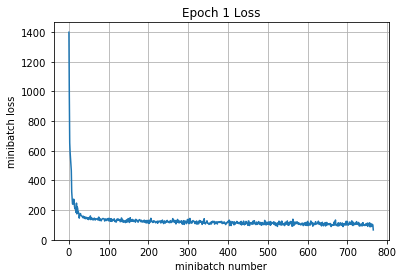

Iteration 800: with minibatch training loss = 1.57 and accuracy of 0.44
Iteration 900: with minibatch training loss = 1.48 and accuracy of 0.47
Iteration 1000: with minibatch training loss = 1.63 and accuracy of 0.39
Iteration 1100: with minibatch training loss = 1.84 and accuracy of 0.38
Iteration 1200: with minibatch training loss = 1.26 and accuracy of 0.53
Iteration 1300: with minibatch training loss = 1.35 and accuracy of 0.58
Iteration 1400: with minibatch training loss = 1.56 and accuracy of 0.44
Iteration 1500: with minibatch training loss = 1.43 and accuracy of 0.5
Epoch 2, Overall loss = 1.52 and accuracy of 0.455


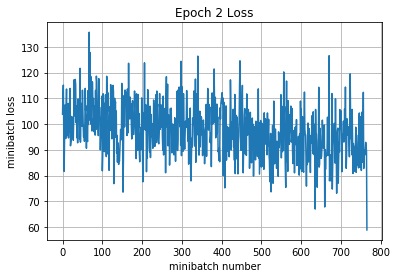

Iteration 1600: with minibatch training loss = 1.61 and accuracy of 0.38
Iteration 1700: with minibatch training loss = 1.43 and accuracy of 0.47
Iteration 1800: with minibatch training loss = 1.4 and accuracy of 0.5
Iteration 1900: with minibatch training loss = 1.48 and accuracy of 0.45
Iteration 2000: with minibatch training loss = 1.43 and accuracy of 0.47
Iteration 2100: with minibatch training loss = 1.31 and accuracy of 0.56
Iteration 2200: with minibatch training loss = 1.28 and accuracy of 0.55
Epoch 3, Overall loss = 1.38 and accuracy of 0.508


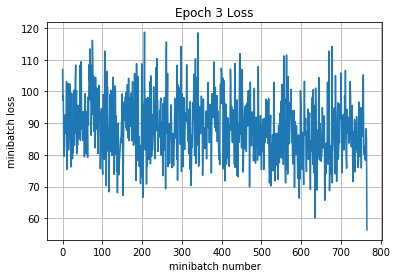

Iteration 2300: with minibatch training loss = 1.41 and accuracy of 0.58
Iteration 2400: with minibatch training loss = 1.47 and accuracy of 0.55
Iteration 2500: with minibatch training loss = 0.92 and accuracy of 0.69
Iteration 2600: with minibatch training loss = 1.25 and accuracy of 0.58
Iteration 2700: with minibatch training loss = 1.36 and accuracy of 0.52
Iteration 2800: with minibatch training loss = 1.17 and accuracy of 0.59
Iteration 2900: with minibatch training loss = 1.12 and accuracy of 0.61
Iteration 3000: with minibatch training loss = 1.09 and accuracy of 0.56
Epoch 4, Overall loss = 1.29 and accuracy of 0.542


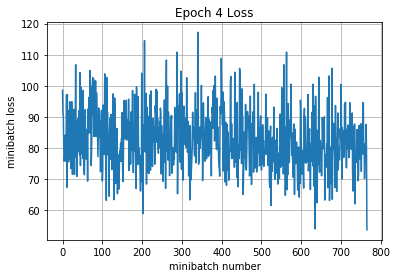

Iteration 3100: with minibatch training loss = 1.07 and accuracy of 0.64
Iteration 3200: with minibatch training loss = 1.07 and accuracy of 0.59
Iteration 3300: with minibatch training loss = 1.21 and accuracy of 0.5
Iteration 3400: with minibatch training loss = 1.37 and accuracy of 0.5
Iteration 3500: with minibatch training loss = 1.26 and accuracy of 0.45
Iteration 3600: with minibatch training loss = 1.13 and accuracy of 0.61
Iteration 3700: with minibatch training loss = 1.41 and accuracy of 0.58
Iteration 3800: with minibatch training loss = 1.19 and accuracy of 0.66
Epoch 5, Overall loss = 1.23 and accuracy of 0.568


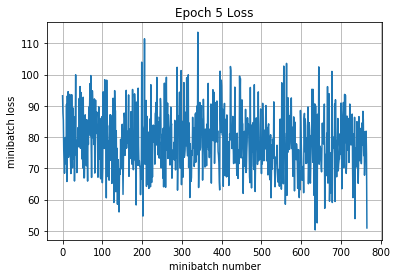

Iteration 3900: with minibatch training loss = 1.22 and accuracy of 0.61
Iteration 4000: with minibatch training loss = 1.27 and accuracy of 0.52
Iteration 4100: with minibatch training loss = 1.04 and accuracy of 0.7
Iteration 4200: with minibatch training loss = 1.28 and accuracy of 0.55
Iteration 4300: with minibatch training loss = 0.969 and accuracy of 0.62
Iteration 4400: with minibatch training loss = 1.14 and accuracy of 0.61
Iteration 4500: with minibatch training loss = 1.38 and accuracy of 0.56
Epoch 6, Overall loss = 1.17 and accuracy of 0.585


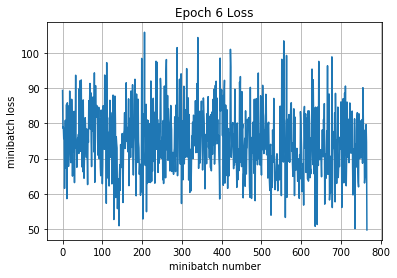

Iteration 4600: with minibatch training loss = 1.13 and accuracy of 0.62
Iteration 4700: with minibatch training loss = 1.18 and accuracy of 0.55
Iteration 4800: with minibatch training loss = 1.26 and accuracy of 0.59
Iteration 4900: with minibatch training loss = 1.28 and accuracy of 0.64
Iteration 5000: with minibatch training loss = 0.97 and accuracy of 0.66
Iteration 5100: with minibatch training loss = 1.25 and accuracy of 0.55
Iteration 5200: with minibatch training loss = 0.912 and accuracy of 0.62
Iteration 5300: with minibatch training loss = 1.16 and accuracy of 0.59
Epoch 7, Overall loss = 1.12 and accuracy of 0.605


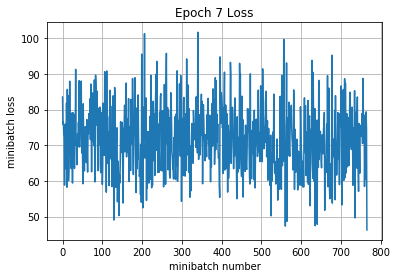

Iteration 5400: with minibatch training loss = 1.11 and accuracy of 0.64
Iteration 5500: with minibatch training loss = 0.799 and accuracy of 0.73
Iteration 5600: with minibatch training loss = 1.06 and accuracy of 0.69
Iteration 5700: with minibatch training loss = 1.22 and accuracy of 0.59
Iteration 5800: with minibatch training loss = 0.811 and accuracy of 0.7
Iteration 5900: with minibatch training loss = 1.06 and accuracy of 0.59
Iteration 6000: with minibatch training loss = 1.16 and accuracy of 0.66
Iteration 6100: with minibatch training loss = 1.06 and accuracy of 0.66
Epoch 8, Overall loss = 1.08 and accuracy of 0.621


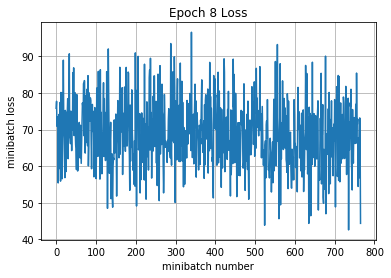

Iteration 6200: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 6300: with minibatch training loss = 1.22 and accuracy of 0.62
Iteration 6400: with minibatch training loss = 1.31 and accuracy of 0.53
Iteration 6500: with minibatch training loss = 0.812 and accuracy of 0.7
Iteration 6600: with minibatch training loss = 1.2 and accuracy of 0.59
Iteration 6700: with minibatch training loss = 1.09 and accuracy of 0.66
Iteration 6800: with minibatch training loss = 0.751 and accuracy of 0.73
Epoch 9, Overall loss = 1.03 and accuracy of 0.637


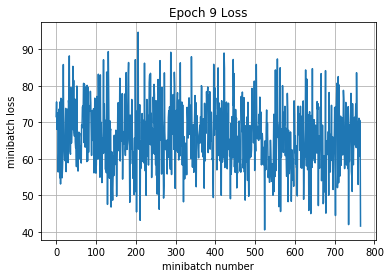

Iteration 6900: with minibatch training loss = 0.996 and accuracy of 0.61
Iteration 7000: with minibatch training loss = 1.2 and accuracy of 0.56
Iteration 7100: with minibatch training loss = 1.47 and accuracy of 0.45
Iteration 7200: with minibatch training loss = 0.954 and accuracy of 0.66
Iteration 7300: with minibatch training loss = 1.09 and accuracy of 0.59
Iteration 7400: with minibatch training loss = 0.932 and accuracy of 0.67
Iteration 7500: with minibatch training loss = 0.705 and accuracy of 0.72
Iteration 7600: with minibatch training loss = 1.16 and accuracy of 0.58
Epoch 10, Overall loss = 1 and accuracy of 0.649


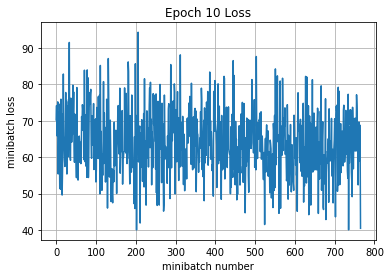

Iteration 7700: with minibatch training loss = 1.02 and accuracy of 0.59
Iteration 7800: with minibatch training loss = 0.862 and accuracy of 0.7
Iteration 7900: with minibatch training loss = 0.803 and accuracy of 0.72
Iteration 8000: with minibatch training loss = 1.3 and accuracy of 0.62
Iteration 8100: with minibatch training loss = 0.716 and accuracy of 0.7
Iteration 8200: with minibatch training loss = 0.914 and accuracy of 0.77
Iteration 8300: with minibatch training loss = 0.726 and accuracy of 0.75
Iteration 8400: with minibatch training loss = 0.964 and accuracy of 0.7
Epoch 11, Overall loss = 0.966 and accuracy of 0.663


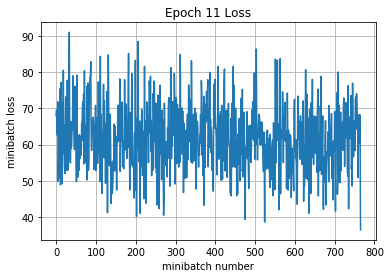

Iteration 8500: with minibatch training loss = 0.907 and accuracy of 0.69
Iteration 8600: with minibatch training loss = 0.91 and accuracy of 0.72
Iteration 8700: with minibatch training loss = 0.805 and accuracy of 0.72
Iteration 8800: with minibatch training loss = 0.864 and accuracy of 0.69
Iteration 8900: with minibatch training loss = 0.953 and accuracy of 0.69
Iteration 9000: with minibatch training loss = 0.968 and accuracy of 0.66
Iteration 9100: with minibatch training loss = 0.777 and accuracy of 0.73
Epoch 12, Overall loss = 0.937 and accuracy of 0.672


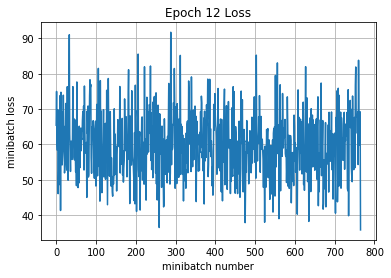

Iteration 9200: with minibatch training loss = 0.762 and accuracy of 0.67
Iteration 9300: with minibatch training loss = 0.856 and accuracy of 0.62
Iteration 9400: with minibatch training loss = 0.729 and accuracy of 0.78
Iteration 9500: with minibatch training loss = 0.763 and accuracy of 0.69
Iteration 9600: with minibatch training loss = 0.842 and accuracy of 0.75
Iteration 9700: with minibatch training loss = 0.881 and accuracy of 0.7
Iteration 9800: with minibatch training loss = 1.2 and accuracy of 0.58
Iteration 9900: with minibatch training loss = 0.757 and accuracy of 0.73
Epoch 13, Overall loss = 0.91 and accuracy of 0.68


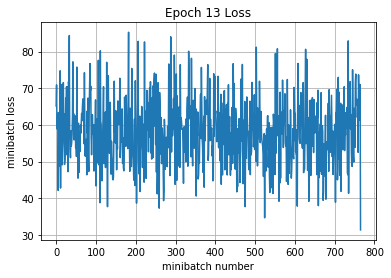

Iteration 10000: with minibatch training loss = 1.08 and accuracy of 0.59
Iteration 10100: with minibatch training loss = 0.68 and accuracy of 0.67
Iteration 10200: with minibatch training loss = 1.02 and accuracy of 0.62
Iteration 10300: with minibatch training loss = 0.882 and accuracy of 0.77
Iteration 10400: with minibatch training loss = 0.993 and accuracy of 0.66
Iteration 10500: with minibatch training loss = 0.646 and accuracy of 0.78
Iteration 10600: with minibatch training loss = 0.889 and accuracy of 0.66
Iteration 10700: with minibatch training loss = 0.844 and accuracy of 0.7
Epoch 14, Overall loss = 0.879 and accuracy of 0.692


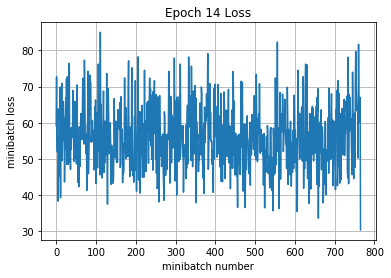

Iteration 10800: with minibatch training loss = 0.829 and accuracy of 0.73
Iteration 10900: with minibatch training loss = 0.96 and accuracy of 0.69
Iteration 11000: with minibatch training loss = 0.661 and accuracy of 0.78
Iteration 11100: with minibatch training loss = 0.897 and accuracy of 0.67
Iteration 11200: with minibatch training loss = 0.655 and accuracy of 0.8
Iteration 11300: with minibatch training loss = 0.833 and accuracy of 0.73
Iteration 11400: with minibatch training loss = 0.755 and accuracy of 0.8
Epoch 15, Overall loss = 0.852 and accuracy of 0.701


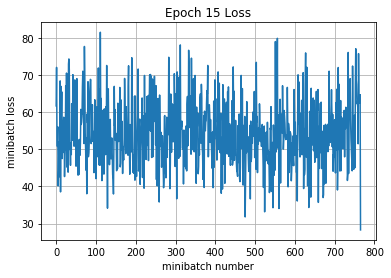

Iteration 11500: with minibatch training loss = 1.11 and accuracy of 0.61
Iteration 11600: with minibatch training loss = 0.613 and accuracy of 0.75
Iteration 11700: with minibatch training loss = 0.944 and accuracy of 0.61
Iteration 11800: with minibatch training loss = 0.96 and accuracy of 0.62
Iteration 11900: with minibatch training loss = 0.984 and accuracy of 0.72
Iteration 12000: with minibatch training loss = 0.847 and accuracy of 0.7
Iteration 12100: with minibatch training loss = 0.997 and accuracy of 0.67
Iteration 12200: with minibatch training loss = 0.67 and accuracy of 0.75
Epoch 16, Overall loss = 0.828 and accuracy of 0.709


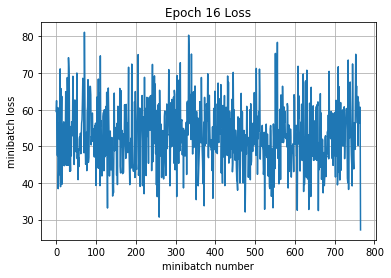

Iteration 12300: with minibatch training loss = 0.867 and accuracy of 0.69
Iteration 12400: with minibatch training loss = 0.563 and accuracy of 0.78
Iteration 12500: with minibatch training loss = 0.857 and accuracy of 0.69
Iteration 12600: with minibatch training loss = 0.906 and accuracy of 0.69
Iteration 12700: with minibatch training loss = 0.695 and accuracy of 0.72
Iteration 12800: with minibatch training loss = 0.779 and accuracy of 0.72
Iteration 12900: with minibatch training loss = 0.914 and accuracy of 0.64
Iteration 13000: with minibatch training loss = 0.606 and accuracy of 0.77
Epoch 17, Overall loss = 0.808 and accuracy of 0.716


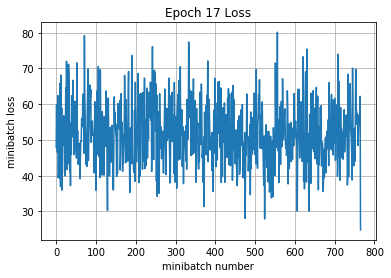

Iteration 13100: with minibatch training loss = 0.906 and accuracy of 0.73
Iteration 13200: with minibatch training loss = 0.743 and accuracy of 0.77
Iteration 13300: with minibatch training loss = 0.887 and accuracy of 0.67
Iteration 13400: with minibatch training loss = 0.867 and accuracy of 0.7
Iteration 13500: with minibatch training loss = 0.753 and accuracy of 0.75
Iteration 13600: with minibatch training loss = 0.806 and accuracy of 0.72
Iteration 13700: with minibatch training loss = 0.591 and accuracy of 0.77
Epoch 18, Overall loss = 0.784 and accuracy of 0.724


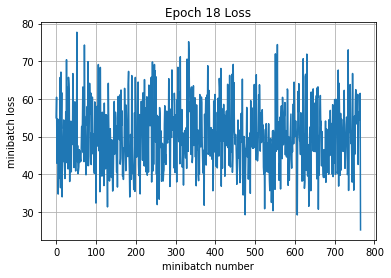

Iteration 13800: with minibatch training loss = 0.972 and accuracy of 0.73
Iteration 13900: with minibatch training loss = 0.829 and accuracy of 0.77
Iteration 14000: with minibatch training loss = 0.732 and accuracy of 0.78
Iteration 14100: with minibatch training loss = 1.08 and accuracy of 0.66
Iteration 14200: with minibatch training loss = 0.765 and accuracy of 0.7
Iteration 14300: with minibatch training loss = 0.832 and accuracy of 0.69
Iteration 14400: with minibatch training loss = 0.746 and accuracy of 0.73
Iteration 14500: with minibatch training loss = 0.854 and accuracy of 0.67
Epoch 19, Overall loss = 0.77 and accuracy of 0.731


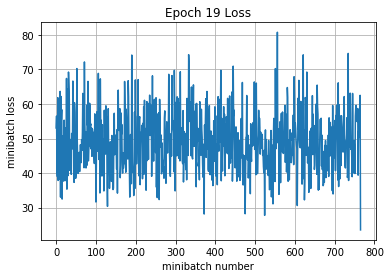

Iteration 14600: with minibatch training loss = 0.89 and accuracy of 0.7
Iteration 14700: with minibatch training loss = 0.857 and accuracy of 0.7
Iteration 14800: with minibatch training loss = 0.79 and accuracy of 0.7
Iteration 14900: with minibatch training loss = 0.775 and accuracy of 0.8
Iteration 15000: with minibatch training loss = 0.802 and accuracy of 0.75
Iteration 15100: with minibatch training loss = 0.759 and accuracy of 0.75
Iteration 15200: with minibatch training loss = 0.999 and accuracy of 0.64
Iteration 15300: with minibatch training loss = 0.7 and accuracy of 0.77
Epoch 20, Overall loss = 0.753 and accuracy of 0.737


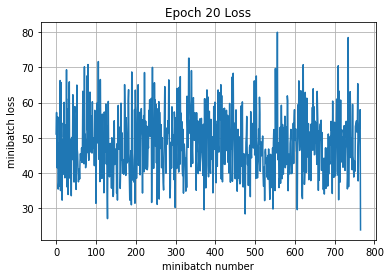

Iteration 15400: with minibatch training loss = 1.01 and accuracy of 0.62
Iteration 15500: with minibatch training loss = 0.646 and accuracy of 0.83
Iteration 15600: with minibatch training loss = 0.689 and accuracy of 0.73
Iteration 15700: with minibatch training loss = 0.686 and accuracy of 0.72
Iteration 15800: with minibatch training loss = 0.697 and accuracy of 0.75
Iteration 15900: with minibatch training loss = 0.651 and accuracy of 0.8
Iteration 16000: with minibatch training loss = 0.555 and accuracy of 0.77
Epoch 21, Overall loss = 0.737 and accuracy of 0.74


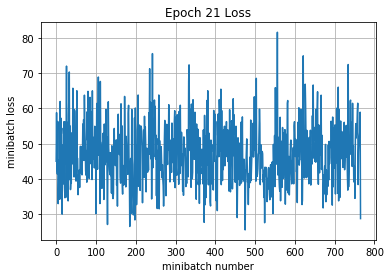

Iteration 16100: with minibatch training loss = 0.854 and accuracy of 0.78
Iteration 16200: with minibatch training loss = 0.679 and accuracy of 0.8
Iteration 16300: with minibatch training loss = 0.787 and accuracy of 0.69
Iteration 16400: with minibatch training loss = 0.69 and accuracy of 0.8
Iteration 16500: with minibatch training loss = 0.986 and accuracy of 0.73
Iteration 16600: with minibatch training loss = 0.651 and accuracy of 0.75
Iteration 16700: with minibatch training loss = 0.795 and accuracy of 0.73
Iteration 16800: with minibatch training loss = 0.657 and accuracy of 0.75
Epoch 22, Overall loss = 0.711 and accuracy of 0.751


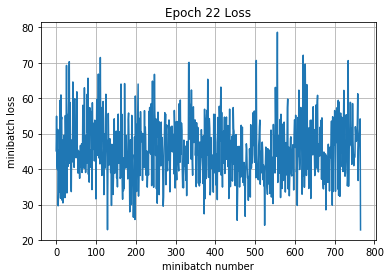

Iteration 16900: with minibatch training loss = 0.727 and accuracy of 0.77
Iteration 17000: with minibatch training loss = 0.707 and accuracy of 0.7
Iteration 17100: with minibatch training loss = 0.796 and accuracy of 0.78
Iteration 17200: with minibatch training loss = 0.805 and accuracy of 0.7
Iteration 17300: with minibatch training loss = 0.7 and accuracy of 0.73
Iteration 17400: with minibatch training loss = 0.587 and accuracy of 0.8
Iteration 17500: with minibatch training loss = 0.668 and accuracy of 0.75
Iteration 17600: with minibatch training loss = 0.641 and accuracy of 0.77
Epoch 23, Overall loss = 0.691 and accuracy of 0.757


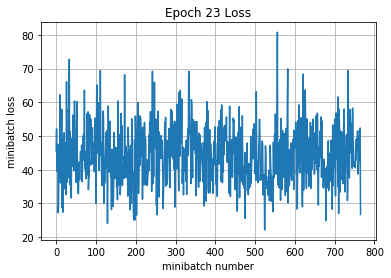

Iteration 17700: with minibatch training loss = 0.533 and accuracy of 0.81
Iteration 17800: with minibatch training loss = 0.727 and accuracy of 0.77
Iteration 17900: with minibatch training loss = 0.636 and accuracy of 0.78
Iteration 18000: with minibatch training loss = 0.502 and accuracy of 0.8
Iteration 18100: with minibatch training loss = 0.567 and accuracy of 0.8
Iteration 18200: with minibatch training loss = 0.999 and accuracy of 0.69
Iteration 18300: with minibatch training loss = 0.623 and accuracy of 0.8
Epoch 24, Overall loss = 0.676 and accuracy of 0.764


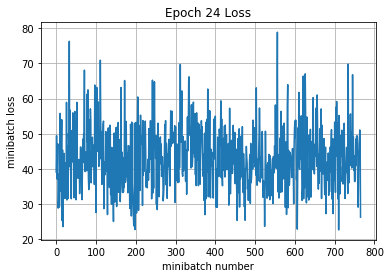

Iteration 18400: with minibatch training loss = 0.685 and accuracy of 0.8
Iteration 18500: with minibatch training loss = 0.805 and accuracy of 0.72
Iteration 18600: with minibatch training loss = 0.645 and accuracy of 0.77
Iteration 18700: with minibatch training loss = 1 and accuracy of 0.67
Iteration 18800: with minibatch training loss = 0.812 and accuracy of 0.64
Iteration 18900: with minibatch training loss = 0.569 and accuracy of 0.81
Iteration 19000: with minibatch training loss = 0.789 and accuracy of 0.8
Iteration 19100: with minibatch training loss = 0.662 and accuracy of 0.66
Epoch 25, Overall loss = 0.655 and accuracy of 0.771


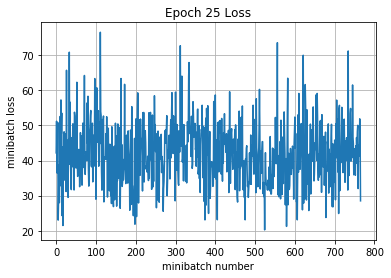

Validation
Epoch 1, Overall loss = 1.49 and accuracy of 0.568


(1.4909024410247802, 0.568)

In [17]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session(config=config)

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,25,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

0.4 L2 reg + drop_out

In [39]:
regularizer = tf.contrib.layers.l2_regularizer(0.001)

keep_prob_value = 0.8
params = dict(
    filter_size=[7,6,5],  # [7,6,5],
    filters_count=[64,64,64], # [32, 32, 32],
    pool_size=[4,3,2],  # [1, 1, 1],
    pool_stride=[1,1,2],  # [1, 1, 1],
    stride=[1,1,2],  # [1, 1, 1],
    net_architecture='v2',
#     filter_size=7,  # [7,6,5],
#     filters_count=32, # [32, 32, 32],
#     pool_size=1,  # [1, 1, 1],
#     pool_stride=1,  # [1, 1, 1],
#     stride=1,  # [1, 1, 1],
#     net_architecture='v1',
    max_pooling_use=True,
    spatial_batch_norm=False, #True,
    vanilla_batch_norm=False, #True,
    learning_rate_decay=False,
    global_avg_pooling=False,
    regularizer=regularizer,
    dropout_use=True,
    N=3,
    M=1)

y_out, mean_loss, X, y, is_training, train_step, keep_prob = init_model(params, lr=0.0001)

conv output size:  26
pool output size:  23
conv output size:  18
pool output size:  16
conv output size:  6
pool output size:  3
dense_units:  288


Training
Iteration 0: with minibatch training loss = 2.05e+03 and accuracy of 0.016
Iteration 100: with minibatch training loss = 2.31 and accuracy of 0.062
Iteration 200: with minibatch training loss = 2.11 and accuracy of 0.2
Iteration 300: with minibatch training loss = 2.21 and accuracy of 0.19
Iteration 400: with minibatch training loss = 2.2 and accuracy of 0.25
Iteration 500: with minibatch training loss = 2.12 and accuracy of 0.19
Iteration 600: with minibatch training loss = 2.1 and accuracy of 0.25
Iteration 700: with minibatch training loss = 2.15 and accuracy of 0.19
Epoch 1, Overall loss = 6.48 and accuracy of 0.189


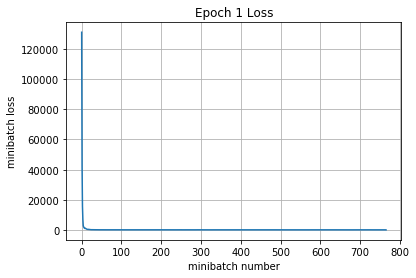

Iteration 800: with minibatch training loss = 2.06 and accuracy of 0.22
Iteration 900: with minibatch training loss = 1.95 and accuracy of 0.25
Iteration 1000: with minibatch training loss = 1.93 and accuracy of 0.22
Iteration 1100: with minibatch training loss = 1.94 and accuracy of 0.34
Iteration 1200: with minibatch training loss = 1.82 and accuracy of 0.45
Iteration 1300: with minibatch training loss = 1.95 and accuracy of 0.27
Iteration 1400: with minibatch training loss = 1.9 and accuracy of 0.25
Iteration 1500: with minibatch training loss = 1.98 and accuracy of 0.25
Epoch 2, Overall loss = 1.96 and accuracy of 0.288


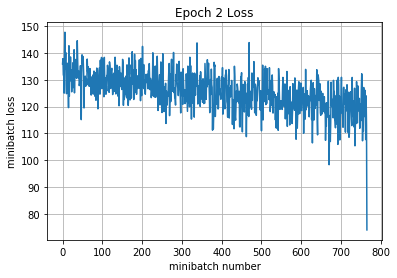

Iteration 1600: with minibatch training loss = 1.88 and accuracy of 0.33
Iteration 1700: with minibatch training loss = 1.88 and accuracy of 0.22
Iteration 1800: with minibatch training loss = 1.95 and accuracy of 0.2
Iteration 1900: with minibatch training loss = 1.8 and accuracy of 0.33
Iteration 2000: with minibatch training loss = 1.63 and accuracy of 0.39
Iteration 2100: with minibatch training loss = 1.88 and accuracy of 0.3
Iteration 2200: with minibatch training loss = 1.82 and accuracy of 0.44
Epoch 3, Overall loss = 1.8 and accuracy of 0.34


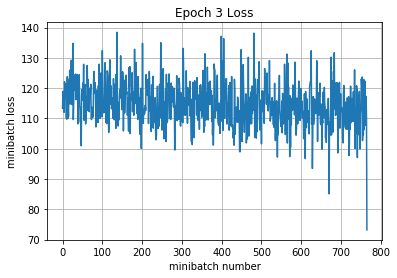

Iteration 2300: with minibatch training loss = 1.75 and accuracy of 0.33
Iteration 2400: with minibatch training loss = 1.66 and accuracy of 0.36
Iteration 2500: with minibatch training loss = 1.73 and accuracy of 0.33
Iteration 2600: with minibatch training loss = 1.68 and accuracy of 0.41
Iteration 2700: with minibatch training loss = 1.77 and accuracy of 0.41
Iteration 2800: with minibatch training loss = 1.82 and accuracy of 0.41
Iteration 2900: with minibatch training loss = 1.84 and accuracy of 0.36
Iteration 3000: with minibatch training loss = 1.72 and accuracy of 0.41
Epoch 4, Overall loss = 1.71 and accuracy of 0.37


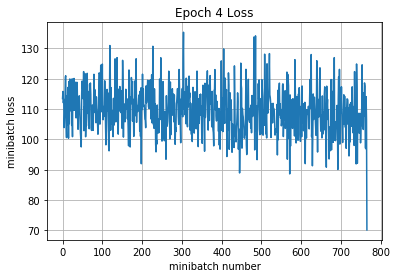

Iteration 3100: with minibatch training loss = 1.84 and accuracy of 0.27
Iteration 3200: with minibatch training loss = 1.6 and accuracy of 0.41
Iteration 3300: with minibatch training loss = 1.41 and accuracy of 0.5
Iteration 3400: with minibatch training loss = 1.7 and accuracy of 0.38
Iteration 3500: with minibatch training loss = 1.44 and accuracy of 0.48
Iteration 3600: with minibatch training loss = 1.54 and accuracy of 0.36
Iteration 3700: with minibatch training loss = 1.61 and accuracy of 0.39
Iteration 3800: with minibatch training loss = 1.37 and accuracy of 0.41
Epoch 5, Overall loss = 1.65 and accuracy of 0.398


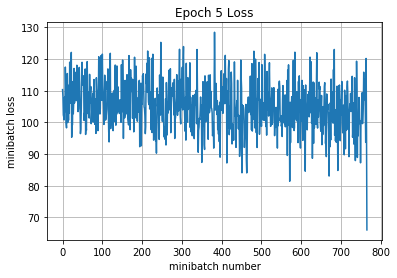

Iteration 3900: with minibatch training loss = 1.64 and accuracy of 0.36
Iteration 4000: with minibatch training loss = 1.46 and accuracy of 0.48
Iteration 4100: with minibatch training loss = 1.68 and accuracy of 0.44
Iteration 4200: with minibatch training loss = 1.6 and accuracy of 0.42
Iteration 4300: with minibatch training loss = 1.59 and accuracy of 0.42
Iteration 4400: with minibatch training loss = 1.51 and accuracy of 0.45
Iteration 4500: with minibatch training loss = 1.26 and accuracy of 0.53
Epoch 6, Overall loss = 1.58 and accuracy of 0.425


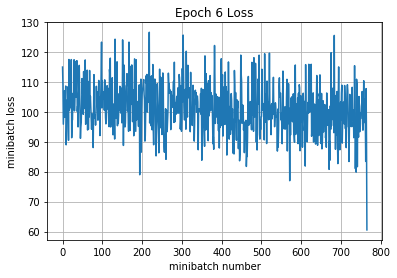

Iteration 4600: with minibatch training loss = 1.44 and accuracy of 0.39
Iteration 4700: with minibatch training loss = 1.48 and accuracy of 0.45
Iteration 4800: with minibatch training loss = 1.53 and accuracy of 0.45
Iteration 4900: with minibatch training loss = 1.88 and accuracy of 0.28
Iteration 5000: with minibatch training loss = 1.48 and accuracy of 0.44
Iteration 5100: with minibatch training loss = 1.53 and accuracy of 0.44
Iteration 5200: with minibatch training loss = 1.44 and accuracy of 0.52
Iteration 5300: with minibatch training loss = 1.39 and accuracy of 0.52
Epoch 7, Overall loss = 1.51 and accuracy of 0.457


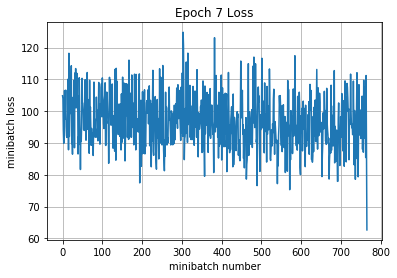

Iteration 5400: with minibatch training loss = 1.45 and accuracy of 0.5
Iteration 5500: with minibatch training loss = 1.49 and accuracy of 0.41
Iteration 5600: with minibatch training loss = 1.62 and accuracy of 0.36
Iteration 5700: with minibatch training loss = 1.57 and accuracy of 0.45
Iteration 5800: with minibatch training loss = 1.38 and accuracy of 0.52
Iteration 5900: with minibatch training loss = 1.34 and accuracy of 0.55
Iteration 6000: with minibatch training loss = 1.51 and accuracy of 0.45
Iteration 6100: with minibatch training loss = 1.26 and accuracy of 0.52
Epoch 8, Overall loss = 1.45 and accuracy of 0.482


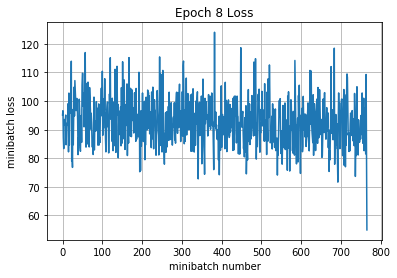

Iteration 6200: with minibatch training loss = 1.41 and accuracy of 0.44
Iteration 6300: with minibatch training loss = 1.54 and accuracy of 0.41
Iteration 6400: with minibatch training loss = 1.46 and accuracy of 0.53
Iteration 6500: with minibatch training loss = 1.42 and accuracy of 0.48
Iteration 6600: with minibatch training loss = 1.53 and accuracy of 0.52
Iteration 6700: with minibatch training loss = 1.32 and accuracy of 0.52
Iteration 6800: with minibatch training loss = 1.32 and accuracy of 0.56
Epoch 9, Overall loss = 1.4 and accuracy of 0.503


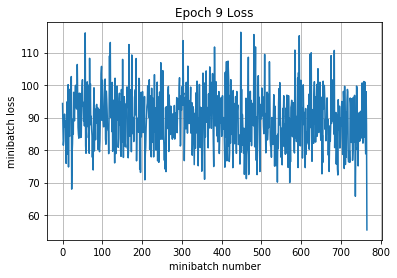

Iteration 6900: with minibatch training loss = 1.32 and accuracy of 0.52
Iteration 7000: with minibatch training loss = 1.42 and accuracy of 0.42
Iteration 7100: with minibatch training loss = 1.38 and accuracy of 0.58
Iteration 7200: with minibatch training loss = 1.18 and accuracy of 0.56
Iteration 7300: with minibatch training loss = 1.34 and accuracy of 0.59
Iteration 7400: with minibatch training loss = 1.37 and accuracy of 0.48
Iteration 7500: with minibatch training loss = 1.4 and accuracy of 0.55
Iteration 7600: with minibatch training loss = 1.45 and accuracy of 0.5
Epoch 10, Overall loss = 1.35 and accuracy of 0.522


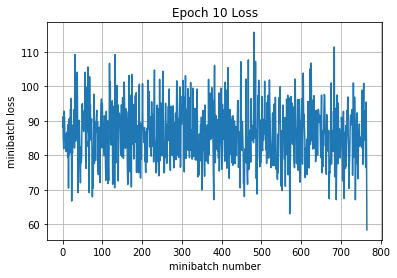

Iteration 7700: with minibatch training loss = 1.27 and accuracy of 0.53
Iteration 7800: with minibatch training loss = 1.22 and accuracy of 0.61
Iteration 7900: with minibatch training loss = 1.43 and accuracy of 0.45
Iteration 8000: with minibatch training loss = 1.04 and accuracy of 0.72
Iteration 8100: with minibatch training loss = 1.41 and accuracy of 0.53
Iteration 8200: with minibatch training loss = 0.972 and accuracy of 0.7
Iteration 8300: with minibatch training loss = 1.48 and accuracy of 0.47
Iteration 8400: with minibatch training loss = 1.35 and accuracy of 0.45
Epoch 11, Overall loss = 1.31 and accuracy of 0.538


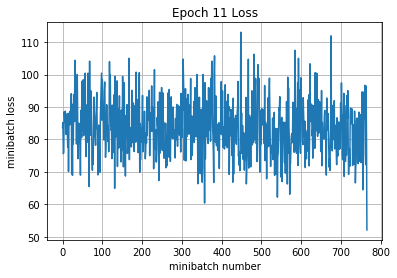

Iteration 8500: with minibatch training loss = 1.14 and accuracy of 0.58
Iteration 8600: with minibatch training loss = 1.47 and accuracy of 0.45
Iteration 8700: with minibatch training loss = 1.35 and accuracy of 0.44
Iteration 8800: with minibatch training loss = 1.3 and accuracy of 0.56
Iteration 8900: with minibatch training loss = 1.45 and accuracy of 0.47
Iteration 9000: with minibatch training loss = 1.23 and accuracy of 0.53
Iteration 9100: with minibatch training loss = 1.21 and accuracy of 0.58
Epoch 12, Overall loss = 1.27 and accuracy of 0.556


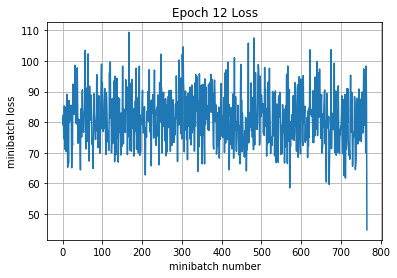

Iteration 9200: with minibatch training loss = 1.24 and accuracy of 0.62
Iteration 9300: with minibatch training loss = 1.07 and accuracy of 0.61
Iteration 9400: with minibatch training loss = 1.03 and accuracy of 0.69
Iteration 9500: with minibatch training loss = 1.14 and accuracy of 0.58
Iteration 9600: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 9700: with minibatch training loss = 1.55 and accuracy of 0.36
Iteration 9800: with minibatch training loss = 1.21 and accuracy of 0.55
Iteration 9900: with minibatch training loss = 1.06 and accuracy of 0.64
Epoch 13, Overall loss = 1.24 and accuracy of 0.567


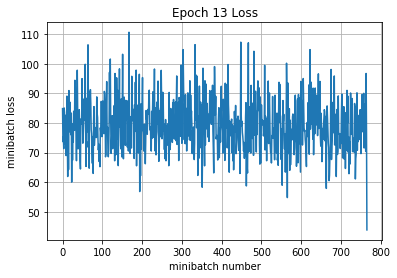

Iteration 10000: with minibatch training loss = 1.21 and accuracy of 0.59
Iteration 10100: with minibatch training loss = 1.11 and accuracy of 0.66
Iteration 10200: with minibatch training loss = 1.02 and accuracy of 0.61
Iteration 10300: with minibatch training loss = 1.42 and accuracy of 0.55
Iteration 10400: with minibatch training loss = 1.12 and accuracy of 0.64
Iteration 10500: with minibatch training loss = 1.07 and accuracy of 0.66
Iteration 10600: with minibatch training loss = 1.23 and accuracy of 0.59
Iteration 10700: with minibatch training loss = 1.13 and accuracy of 0.64
Epoch 14, Overall loss = 1.2 and accuracy of 0.584


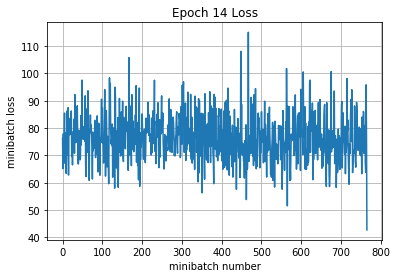

Iteration 10800: with minibatch training loss = 1.09 and accuracy of 0.62
Iteration 10900: with minibatch training loss = 1.15 and accuracy of 0.62
Iteration 11000: with minibatch training loss = 1.07 and accuracy of 0.62
Iteration 11100: with minibatch training loss = 1.22 and accuracy of 0.64
Iteration 11200: with minibatch training loss = 1.25 and accuracy of 0.56
Iteration 11300: with minibatch training loss = 1.12 and accuracy of 0.58
Iteration 11400: with minibatch training loss = 0.984 and accuracy of 0.62
Epoch 15, Overall loss = 1.17 and accuracy of 0.593


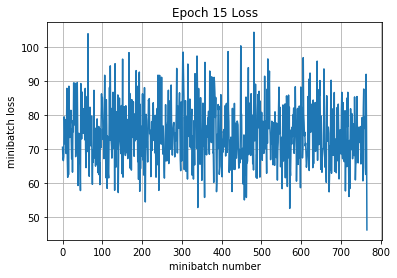

Iteration 11500: with minibatch training loss = 1.23 and accuracy of 0.61
Iteration 11600: with minibatch training loss = 1.29 and accuracy of 0.52
Iteration 11700: with minibatch training loss = 1.29 and accuracy of 0.58
Iteration 11800: with minibatch training loss = 0.977 and accuracy of 0.64
Iteration 11900: with minibatch training loss = 0.961 and accuracy of 0.66
Iteration 12000: with minibatch training loss = 1.22 and accuracy of 0.56
Iteration 12100: with minibatch training loss = 1.05 and accuracy of 0.66
Iteration 12200: with minibatch training loss = 1.2 and accuracy of 0.59
Epoch 16, Overall loss = 1.14 and accuracy of 0.602


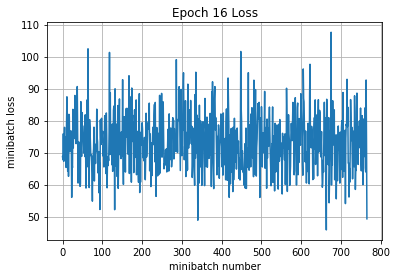

Iteration 12300: with minibatch training loss = 0.883 and accuracy of 0.67
Iteration 12400: with minibatch training loss = 1.11 and accuracy of 0.66
Iteration 12500: with minibatch training loss = 1.35 and accuracy of 0.56
Iteration 12600: with minibatch training loss = 1.16 and accuracy of 0.55
Iteration 12700: with minibatch training loss = 0.963 and accuracy of 0.69
Iteration 12800: with minibatch training loss = 0.999 and accuracy of 0.72
Iteration 12900: with minibatch training loss = 1 and accuracy of 0.7
Iteration 13000: with minibatch training loss = 1.13 and accuracy of 0.56
Epoch 17, Overall loss = 1.12 and accuracy of 0.61


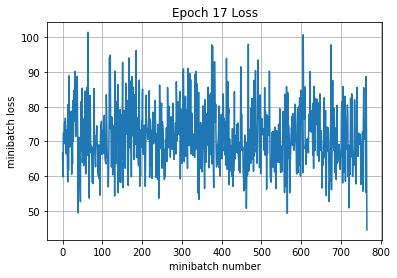

Iteration 13100: with minibatch training loss = 1.07 and accuracy of 0.67
Iteration 13200: with minibatch training loss = 1.24 and accuracy of 0.56
Iteration 13300: with minibatch training loss = 1.16 and accuracy of 0.56
Iteration 13400: with minibatch training loss = 1.11 and accuracy of 0.61
Iteration 13500: with minibatch training loss = 0.958 and accuracy of 0.67
Iteration 13600: with minibatch training loss = 1.03 and accuracy of 0.61
Iteration 13700: with minibatch training loss = 1.11 and accuracy of 0.66
Epoch 18, Overall loss = 1.09 and accuracy of 0.625


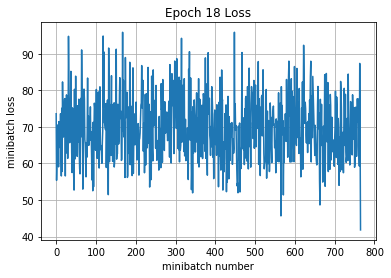

Iteration 13800: with minibatch training loss = 1.04 and accuracy of 0.59
Iteration 13900: with minibatch training loss = 0.76 and accuracy of 0.72
Iteration 14000: with minibatch training loss = 0.951 and accuracy of 0.61
Iteration 14100: with minibatch training loss = 0.847 and accuracy of 0.77
Iteration 14200: with minibatch training loss = 1.15 and accuracy of 0.52
Iteration 14300: with minibatch training loss = 1.1 and accuracy of 0.56
Iteration 14400: with minibatch training loss = 0.949 and accuracy of 0.73
Iteration 14500: with minibatch training loss = 1.01 and accuracy of 0.7
Epoch 19, Overall loss = 1.06 and accuracy of 0.633


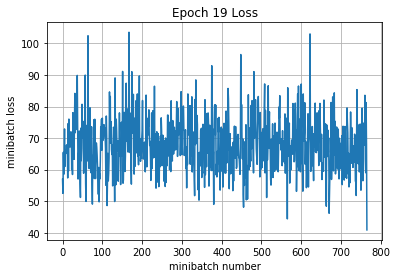

Iteration 14600: with minibatch training loss = 1.08 and accuracy of 0.61
Iteration 14700: with minibatch training loss = 0.833 and accuracy of 0.7
Iteration 14800: with minibatch training loss = 1.08 and accuracy of 0.64
Iteration 14900: with minibatch training loss = 0.95 and accuracy of 0.64
Iteration 15000: with minibatch training loss = 0.913 and accuracy of 0.64
Iteration 15100: with minibatch training loss = 1.13 and accuracy of 0.64
Iteration 15200: with minibatch training loss = 1.09 and accuracy of 0.59
Iteration 15300: with minibatch training loss = 0.944 and accuracy of 0.67
Epoch 20, Overall loss = 1.04 and accuracy of 0.64


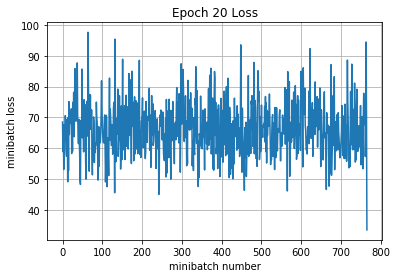

Iteration 15400: with minibatch training loss = 0.961 and accuracy of 0.7
Iteration 15500: with minibatch training loss = 0.835 and accuracy of 0.7
Iteration 15600: with minibatch training loss = 0.922 and accuracy of 0.73
Iteration 15700: with minibatch training loss = 0.898 and accuracy of 0.66
Iteration 15800: with minibatch training loss = 0.874 and accuracy of 0.67
Iteration 15900: with minibatch training loss = 0.978 and accuracy of 0.61
Iteration 16000: with minibatch training loss = 0.875 and accuracy of 0.72
Epoch 21, Overall loss = 1.02 and accuracy of 0.648


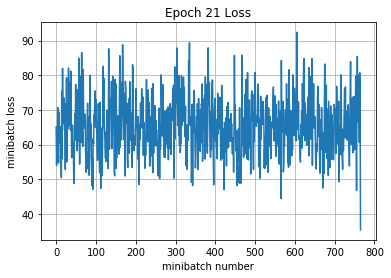

Iteration 16100: with minibatch training loss = 1.16 and accuracy of 0.58
Iteration 16200: with minibatch training loss = 0.755 and accuracy of 0.75
Iteration 16300: with minibatch training loss = 1.11 and accuracy of 0.59
Iteration 16400: with minibatch training loss = 0.851 and accuracy of 0.64
Iteration 16500: with minibatch training loss = 0.898 and accuracy of 0.69
Iteration 16600: with minibatch training loss = 1.24 and accuracy of 0.55
Iteration 16700: with minibatch training loss = 0.91 and accuracy of 0.67
Iteration 16800: with minibatch training loss = 0.871 and accuracy of 0.78
Epoch 22, Overall loss = 1 and accuracy of 0.654


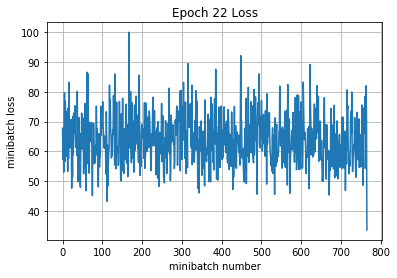

Iteration 16900: with minibatch training loss = 0.997 and accuracy of 0.62
Iteration 17000: with minibatch training loss = 1.11 and accuracy of 0.61
Iteration 17100: with minibatch training loss = 1.03 and accuracy of 0.72
Iteration 17200: with minibatch training loss = 0.992 and accuracy of 0.7
Iteration 17300: with minibatch training loss = 1.26 and accuracy of 0.53
Iteration 17400: with minibatch training loss = 0.892 and accuracy of 0.69
Iteration 17500: with minibatch training loss = 0.906 and accuracy of 0.75
Iteration 17600: with minibatch training loss = 0.902 and accuracy of 0.73
Epoch 23, Overall loss = 0.971 and accuracy of 0.665


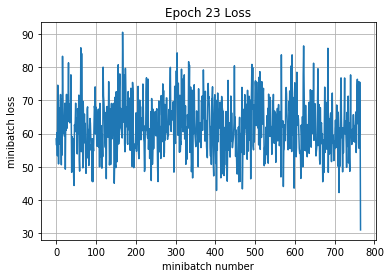

Iteration 17700: with minibatch training loss = 0.844 and accuracy of 0.78
Iteration 17800: with minibatch training loss = 0.937 and accuracy of 0.69
Iteration 17900: with minibatch training loss = 0.815 and accuracy of 0.77
Iteration 18000: with minibatch training loss = 1.15 and accuracy of 0.61
Iteration 18100: with minibatch training loss = 0.911 and accuracy of 0.7
Iteration 18200: with minibatch training loss = 0.821 and accuracy of 0.73
Iteration 18300: with minibatch training loss = 1.01 and accuracy of 0.7
Epoch 24, Overall loss = 0.954 and accuracy of 0.672


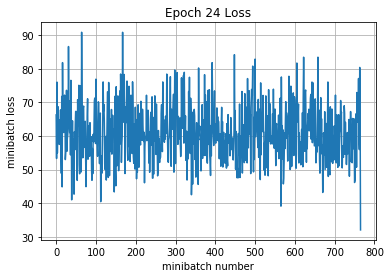

Iteration 18400: with minibatch training loss = 1.11 and accuracy of 0.55
Iteration 18500: with minibatch training loss = 0.878 and accuracy of 0.66
Iteration 18600: with minibatch training loss = 0.888 and accuracy of 0.64
Iteration 18700: with minibatch training loss = 0.983 and accuracy of 0.69
Iteration 18800: with minibatch training loss = 1.08 and accuracy of 0.64
Iteration 18900: with minibatch training loss = 0.998 and accuracy of 0.66
Iteration 19000: with minibatch training loss = 1.03 and accuracy of 0.59
Iteration 19100: with minibatch training loss = 1.04 and accuracy of 0.64
Epoch 25, Overall loss = 0.937 and accuracy of 0.679


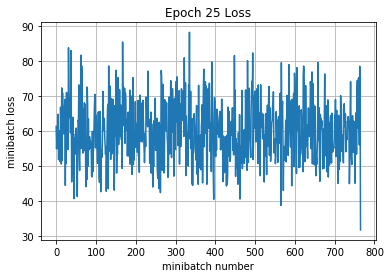

Validation
Epoch 1, Overall loss = 1.05 and accuracy of 0.625


(1.0543606443405151, 0.625)

In [40]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session(config=config)

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,25,64,100,train_step,True, 
          keep_prob_value=keep_prob_value)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [41]:
# Test your model here, and make sure 
# the output of this cell is the accuracy
# of your best model on the training and val sets
# We're looking for >= 70% accuracy on Validation
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Training
Epoch 1, Overall loss = 0.847 and accuracy of 0.715
Validation
Epoch 1, Overall loss = 1.05 and accuracy of 0.625


(1.0543014211654662, 0.625)

0.5

In [47]:
regularizer = tf.contrib.layers.l2_regularizer(0.005)

keep_prob_value = 0.75
params = dict(
    filter_size=[7,6,5,4,3],  # [7,6,5],
    filters_count=[64,64,64,64,64], # [32, 32, 32],
    pool_size=[4,3,2,2,2],  # [1, 1, 1],
    pool_stride=[1,1,1,1,1],  # [1, 1, 1],
    stride=[1,1,1,1,1],  # [1, 1, 1],
    net_architecture='v2',
#     filter_size=7,  # [7,6,5],
#     filters_count=32, # [32, 32, 32],
#     pool_size=1,  # [1, 1, 1],
#     pool_stride=1,  # [1, 1, 1],
#     stride=1,  # [1, 1, 1],
#     net_architecture='v1',
    max_pooling_use=True,
    spatial_batch_norm=False, #True,
    vanilla_batch_norm=False, #True,
    learning_rate_decay=False,
    global_avg_pooling=False,
    regularizer=regularizer,
    dropout_use=True,
    N=5,
    M=3)

y_out, mean_loss, X, y, is_training, train_step, keep_prob = init_model(params, lr=0.0001)

conv output size:  26
pool output size:  23
conv output size:  18
pool output size:  16
conv output size:  12
pool output size:  11
conv output size:  8
pool output size:  7
conv output size:  5
pool output size:  4
dense_units:  512
dense_units:  256
dense_units:  128


Training
Iteration 0: with minibatch training loss = 2.41e+05 and accuracy of 0.12
Iteration 100: with minibatch training loss = 4.07 and accuracy of 0.14
Iteration 200: with minibatch training loss = 2.61 and accuracy of 0.094
Iteration 300: with minibatch training loss = 2.44 and accuracy of 0.062
Iteration 400: with minibatch training loss = 2.33 and accuracy of 0.16
Iteration 500: with minibatch training loss = 2.33 and accuracy of 0.062
Iteration 600: with minibatch training loss = 2.32 and accuracy of 0.11
Iteration 700: with minibatch training loss = 2.32 and accuracy of 0.16
Epoch 1, Overall loss = 378 and accuracy of 0.101


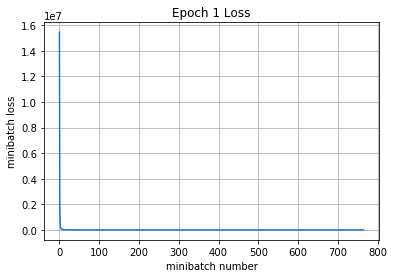

Iteration 800: with minibatch training loss = 2.3 and accuracy of 0.16
Iteration 900: with minibatch training loss = 2.3 and accuracy of 0.062
Iteration 1000: with minibatch training loss = 2.3 and accuracy of 0.12
Iteration 1100: with minibatch training loss = 2.29 and accuracy of 0.14
Iteration 1200: with minibatch training loss = 2.32 and accuracy of 0.094
Iteration 1300: with minibatch training loss = 2.3 and accuracy of 0.094
Iteration 1400: with minibatch training loss = 2.29 and accuracy of 0.12
Iteration 1500: with minibatch training loss = 2.23 and accuracy of 0.16
Epoch 2, Overall loss = 2.29 and accuracy of 0.121


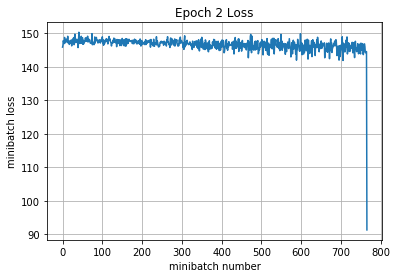

Iteration 1600: with minibatch training loss = 2.27 and accuracy of 0.12
Iteration 1700: with minibatch training loss = 2.24 and accuracy of 0.27
Iteration 1800: with minibatch training loss = 2.24 and accuracy of 0.12
Iteration 1900: with minibatch training loss = 2.27 and accuracy of 0.2
Iteration 2000: with minibatch training loss = 2.22 and accuracy of 0.16
Iteration 2100: with minibatch training loss = 2.25 and accuracy of 0.12
Iteration 2200: with minibatch training loss = 2.29 and accuracy of 0.12
Epoch 3, Overall loss = 2.26 and accuracy of 0.144


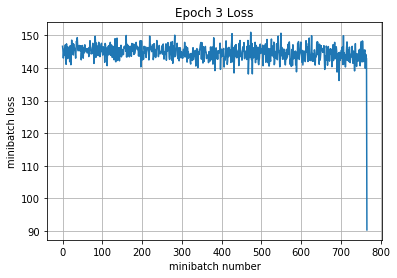

Iteration 2300: with minibatch training loss = 2.18 and accuracy of 0.25
Iteration 2400: with minibatch training loss = 2.24 and accuracy of 0.094
Iteration 2500: with minibatch training loss = 2.21 and accuracy of 0.14
Iteration 2600: with minibatch training loss = 2.18 and accuracy of 0.22
Iteration 2700: with minibatch training loss = 2.17 and accuracy of 0.14
Iteration 2800: with minibatch training loss = 2.21 and accuracy of 0.12
Iteration 2900: with minibatch training loss = 2.15 and accuracy of 0.3
Iteration 3000: with minibatch training loss = 2.18 and accuracy of 0.094
Epoch 4, Overall loss = 2.23 and accuracy of 0.159


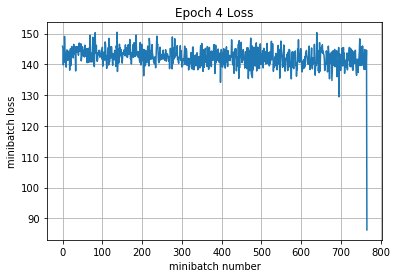

Iteration 3100: with minibatch training loss = 2.22 and accuracy of 0.12
Iteration 3200: with minibatch training loss = 2.25 and accuracy of 0.16
Iteration 3300: with minibatch training loss = 2.27 and accuracy of 0.17
Iteration 3400: with minibatch training loss = 2.19 and accuracy of 0.17
Iteration 3500: with minibatch training loss = 2.27 and accuracy of 0.16
Iteration 3600: with minibatch training loss = 2.2 and accuracy of 0.14
Iteration 3700: with minibatch training loss = 2.17 and accuracy of 0.12
Iteration 3800: with minibatch training loss = 2.27 and accuracy of 0.16
Epoch 5, Overall loss = 2.18 and accuracy of 0.177


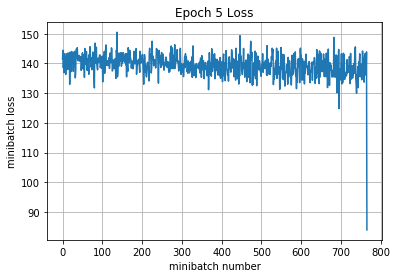

Iteration 3900: with minibatch training loss = 2.21 and accuracy of 0.17
Iteration 4000: with minibatch training loss = 2.18 and accuracy of 0.19
Iteration 4100: with minibatch training loss = 2.06 and accuracy of 0.17
Iteration 4200: with minibatch training loss = 2.11 and accuracy of 0.25
Iteration 4300: with minibatch training loss = 2.16 and accuracy of 0.19
Iteration 4400: with minibatch training loss = 2.17 and accuracy of 0.22
Iteration 4500: with minibatch training loss = 2.02 and accuracy of 0.17
Epoch 6, Overall loss = 2.11 and accuracy of 0.198


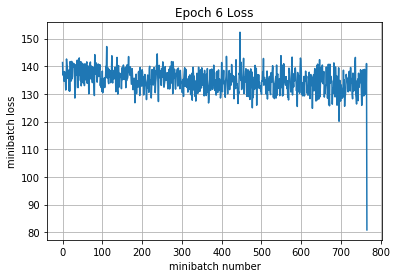

Iteration 4600: with minibatch training loss = 1.99 and accuracy of 0.19
Iteration 4700: with minibatch training loss = 2.03 and accuracy of 0.27
Iteration 4800: with minibatch training loss = 1.98 and accuracy of 0.25
Iteration 4900: with minibatch training loss = 1.96 and accuracy of 0.27
Iteration 5000: with minibatch training loss = 2.11 and accuracy of 0.16
Iteration 5100: with minibatch training loss = 2.03 and accuracy of 0.25
Iteration 5200: with minibatch training loss = 1.92 and accuracy of 0.23
Iteration 5300: with minibatch training loss = 1.96 and accuracy of 0.28
Epoch 7, Overall loss = 2.06 and accuracy of 0.22


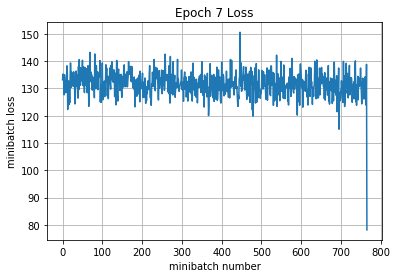

Iteration 5400: with minibatch training loss = 1.99 and accuracy of 0.28
Iteration 5500: with minibatch training loss = 2 and accuracy of 0.14
Iteration 5600: with minibatch training loss = 2.12 and accuracy of 0.14
Iteration 5700: with minibatch training loss = 2.07 and accuracy of 0.22
Iteration 5800: with minibatch training loss = 1.99 and accuracy of 0.31
Iteration 5900: with minibatch training loss = 2.15 and accuracy of 0.2
Iteration 6000: with minibatch training loss = 2.01 and accuracy of 0.23
Iteration 6100: with minibatch training loss = 1.87 and accuracy of 0.22
Epoch 8, Overall loss = 2.02 and accuracy of 0.236


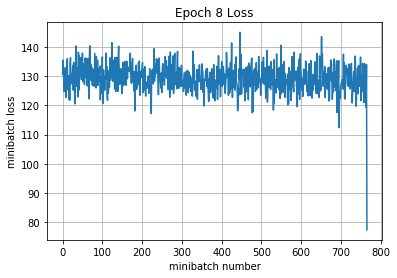

Iteration 6200: with minibatch training loss = 1.97 and accuracy of 0.34
Iteration 6300: with minibatch training loss = 2.02 and accuracy of 0.22
Iteration 6400: with minibatch training loss = 1.98 and accuracy of 0.22
Iteration 6500: with minibatch training loss = 1.97 and accuracy of 0.22
Iteration 6600: with minibatch training loss = 1.92 and accuracy of 0.31
Iteration 6700: with minibatch training loss = 2.09 and accuracy of 0.17
Iteration 6800: with minibatch training loss = 2.09 and accuracy of 0.3
Epoch 9, Overall loss = 1.98 and accuracy of 0.257


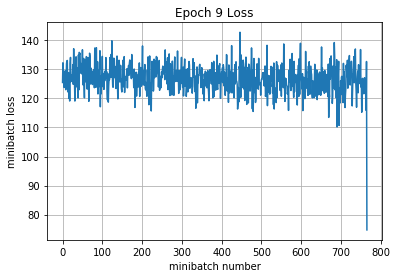

Iteration 6900: with minibatch training loss = 1.98 and accuracy of 0.28
Iteration 7000: with minibatch training loss = 1.89 and accuracy of 0.3
Iteration 7100: with minibatch training loss = 1.93 and accuracy of 0.27
Iteration 7200: with minibatch training loss = 2.07 and accuracy of 0.2
Iteration 7300: with minibatch training loss = 1.89 and accuracy of 0.3
Iteration 7400: with minibatch training loss = 1.91 and accuracy of 0.27
Iteration 7500: with minibatch training loss = 1.94 and accuracy of 0.22
Iteration 7600: with minibatch training loss = 1.99 and accuracy of 0.33
Epoch 10, Overall loss = 1.93 and accuracy of 0.278


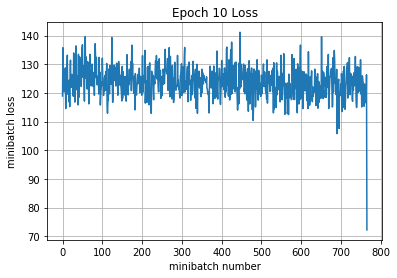

Iteration 7700: with minibatch training loss = 2.05 and accuracy of 0.33
Iteration 7800: with minibatch training loss = 1.94 and accuracy of 0.3
Iteration 7900: with minibatch training loss = 1.95 and accuracy of 0.33
Iteration 8000: with minibatch training loss = 1.91 and accuracy of 0.3
Iteration 8100: with minibatch training loss = 1.71 and accuracy of 0.44
Iteration 8200: with minibatch training loss = 1.99 and accuracy of 0.34
Iteration 8300: with minibatch training loss = 1.86 and accuracy of 0.28
Iteration 8400: with minibatch training loss = 1.76 and accuracy of 0.38
Epoch 11, Overall loss = 1.89 and accuracy of 0.3


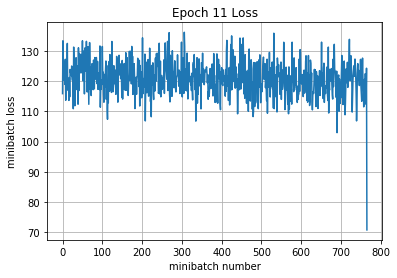

Iteration 8500: with minibatch training loss = 1.88 and accuracy of 0.31
Iteration 8600: with minibatch training loss = 1.95 and accuracy of 0.25
Iteration 8700: with minibatch training loss = 1.8 and accuracy of 0.33
Iteration 8800: with minibatch training loss = 1.9 and accuracy of 0.23
Iteration 8900: with minibatch training loss = 1.89 and accuracy of 0.25
Iteration 9000: with minibatch training loss = 1.84 and accuracy of 0.22
Iteration 9100: with minibatch training loss = 1.89 and accuracy of 0.27
Epoch 12, Overall loss = 1.84 and accuracy of 0.323


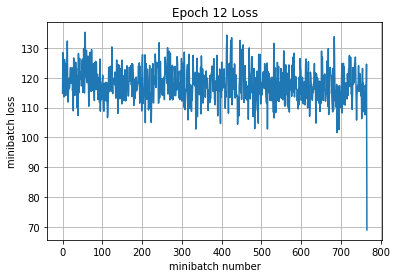

Iteration 9200: with minibatch training loss = 1.84 and accuracy of 0.25
Iteration 9300: with minibatch training loss = 1.8 and accuracy of 0.45
Iteration 9400: with minibatch training loss = 1.68 and accuracy of 0.27
Iteration 9500: with minibatch training loss = 1.74 and accuracy of 0.34
Iteration 9600: with minibatch training loss = 1.82 and accuracy of 0.3
Iteration 9700: with minibatch training loss = 1.96 and accuracy of 0.28
Iteration 9800: with minibatch training loss = 1.67 and accuracy of 0.42
Iteration 9900: with minibatch training loss = 1.86 and accuracy of 0.33
Epoch 13, Overall loss = 1.8 and accuracy of 0.345


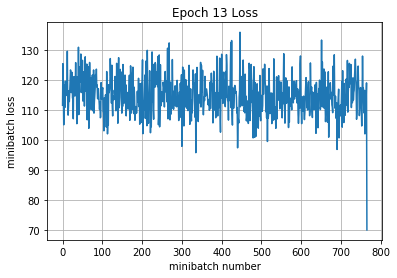

Iteration 10000: with minibatch training loss = 1.86 and accuracy of 0.38
Iteration 10100: with minibatch training loss = 1.79 and accuracy of 0.31
Iteration 10200: with minibatch training loss = 1.66 and accuracy of 0.42
Iteration 10300: with minibatch training loss = 1.71 and accuracy of 0.38
Iteration 10400: with minibatch training loss = 1.66 and accuracy of 0.42
Iteration 10500: with minibatch training loss = 1.74 and accuracy of 0.36
Iteration 10600: with minibatch training loss = 1.64 and accuracy of 0.41
Iteration 10700: with minibatch training loss = 1.74 and accuracy of 0.34
Epoch 14, Overall loss = 1.75 and accuracy of 0.365


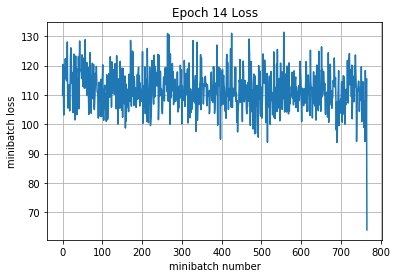

Iteration 10800: with minibatch training loss = 1.59 and accuracy of 0.44
Iteration 10900: with minibatch training loss = 1.84 and accuracy of 0.34
Iteration 11000: with minibatch training loss = 1.86 and accuracy of 0.28
Iteration 11100: with minibatch training loss = 1.76 and accuracy of 0.33
Iteration 11200: with minibatch training loss = 1.76 and accuracy of 0.39
Iteration 11300: with minibatch training loss = 1.62 and accuracy of 0.34
Iteration 11400: with minibatch training loss = 1.7 and accuracy of 0.5
Epoch 15, Overall loss = 1.7 and accuracy of 0.383


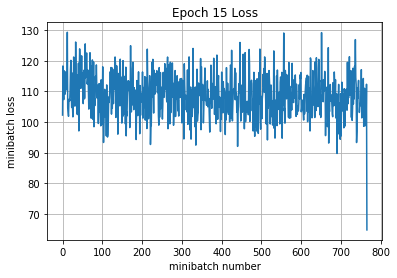

Iteration 11500: with minibatch training loss = 1.68 and accuracy of 0.42
Iteration 11600: with minibatch training loss = 1.46 and accuracy of 0.53
Iteration 11700: with minibatch training loss = 1.76 and accuracy of 0.36
Iteration 11800: with minibatch training loss = 1.67 and accuracy of 0.44
Iteration 11900: with minibatch training loss = 1.69 and accuracy of 0.42
Iteration 12000: with minibatch training loss = 1.66 and accuracy of 0.33
Iteration 12100: with minibatch training loss = 1.67 and accuracy of 0.39
Iteration 12200: with minibatch training loss = 1.49 and accuracy of 0.48
Epoch 16, Overall loss = 1.66 and accuracy of 0.395


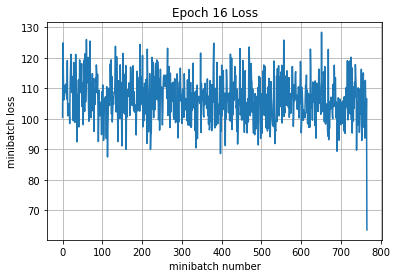

Iteration 12300: with minibatch training loss = 1.61 and accuracy of 0.41
Iteration 12400: with minibatch training loss = 1.51 and accuracy of 0.44
Iteration 12500: with minibatch training loss = 1.52 and accuracy of 0.48
Iteration 12600: with minibatch training loss = 1.56 and accuracy of 0.39
Iteration 12700: with minibatch training loss = 1.56 and accuracy of 0.44
Iteration 12800: with minibatch training loss = 1.56 and accuracy of 0.41
Iteration 12900: with minibatch training loss = 1.84 and accuracy of 0.31
Iteration 13000: with minibatch training loss = 1.66 and accuracy of 0.42
Epoch 17, Overall loss = 1.63 and accuracy of 0.408


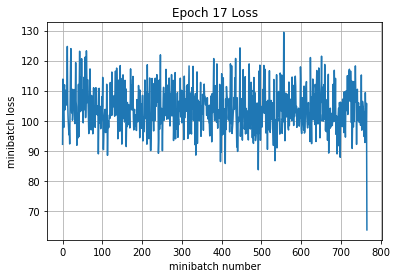

Iteration 13100: with minibatch training loss = 1.72 and accuracy of 0.48
Iteration 13200: with minibatch training loss = 1.49 and accuracy of 0.38
Iteration 13300: with minibatch training loss = 1.65 and accuracy of 0.5
Iteration 13400: with minibatch training loss = 1.64 and accuracy of 0.36
Iteration 13500: with minibatch training loss = 1.6 and accuracy of 0.42
Iteration 13600: with minibatch training loss = 1.6 and accuracy of 0.45
Iteration 13700: with minibatch training loss = 1.63 and accuracy of 0.39
Epoch 18, Overall loss = 1.59 and accuracy of 0.419


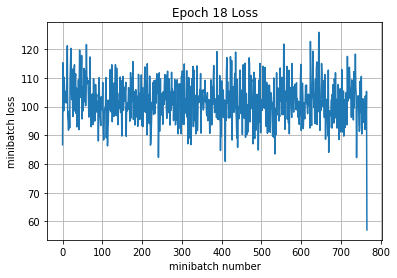

Iteration 13800: with minibatch training loss = 1.9 and accuracy of 0.28
Iteration 13900: with minibatch training loss = 1.57 and accuracy of 0.44
Iteration 14000: with minibatch training loss = 1.3 and accuracy of 0.52
Iteration 14100: with minibatch training loss = 1.7 and accuracy of 0.39
Iteration 14200: with minibatch training loss = 1.67 and accuracy of 0.41
Iteration 14300: with minibatch training loss = 1.48 and accuracy of 0.42
Iteration 14400: with minibatch training loss = 1.58 and accuracy of 0.41
Iteration 14500: with minibatch training loss = 1.53 and accuracy of 0.42
Epoch 19, Overall loss = 1.56 and accuracy of 0.434


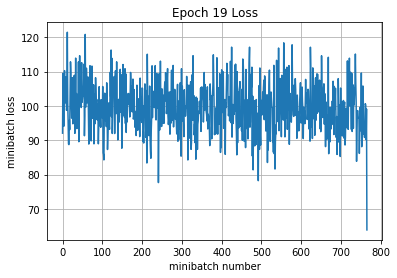

Iteration 14600: with minibatch training loss = 1.58 and accuracy of 0.36
Iteration 14700: with minibatch training loss = 1.5 and accuracy of 0.42
Iteration 14800: with minibatch training loss = 1.6 and accuracy of 0.38
Iteration 14900: with minibatch training loss = 1.47 and accuracy of 0.5
Iteration 15000: with minibatch training loss = 1.62 and accuracy of 0.38
Iteration 15100: with minibatch training loss = 1.51 and accuracy of 0.44
Iteration 15200: with minibatch training loss = 1.62 and accuracy of 0.44
Iteration 15300: with minibatch training loss = 1.34 and accuracy of 0.5
Epoch 20, Overall loss = 1.52 and accuracy of 0.448


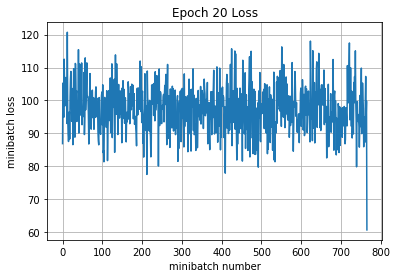

Iteration 15400: with minibatch training loss = 1.54 and accuracy of 0.48
Iteration 15500: with minibatch training loss = 1.61 and accuracy of 0.38
Iteration 15600: with minibatch training loss = 1.52 and accuracy of 0.34
Iteration 15700: with minibatch training loss = 1.68 and accuracy of 0.34
Iteration 15800: with minibatch training loss = 1.4 and accuracy of 0.55
Iteration 15900: with minibatch training loss = 1.34 and accuracy of 0.5
Iteration 16000: with minibatch training loss = 1.66 and accuracy of 0.42
Epoch 21, Overall loss = 1.49 and accuracy of 0.461


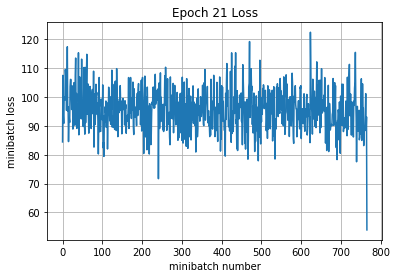

Iteration 16100: with minibatch training loss = 1.48 and accuracy of 0.47
Iteration 16200: with minibatch training loss = 1.36 and accuracy of 0.58
Iteration 16300: with minibatch training loss = 1.49 and accuracy of 0.41
Iteration 16400: with minibatch training loss = 1.6 and accuracy of 0.36
Iteration 16500: with minibatch training loss = 1.39 and accuracy of 0.55
Iteration 16600: with minibatch training loss = 1.57 and accuracy of 0.41
Iteration 16700: with minibatch training loss = 1.69 and accuracy of 0.36
Iteration 16800: with minibatch training loss = 1.41 and accuracy of 0.5
Epoch 22, Overall loss = 1.46 and accuracy of 0.476


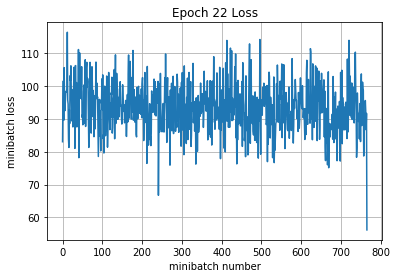

Iteration 16900: with minibatch training loss = 1.7 and accuracy of 0.44
Iteration 17000: with minibatch training loss = 1.36 and accuracy of 0.53
Iteration 17100: with minibatch training loss = 1.46 and accuracy of 0.48
Iteration 17200: with minibatch training loss = 1.45 and accuracy of 0.53
Iteration 17300: with minibatch training loss = 1.49 and accuracy of 0.41
Iteration 17400: with minibatch training loss = 1.5 and accuracy of 0.45
Iteration 17500: with minibatch training loss = 1.44 and accuracy of 0.5
Iteration 17600: with minibatch training loss = 1.45 and accuracy of 0.52
Epoch 23, Overall loss = 1.44 and accuracy of 0.488


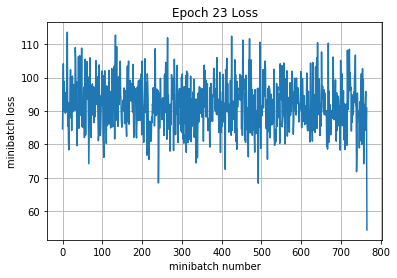

Iteration 17700: with minibatch training loss = 1.42 and accuracy of 0.56
Iteration 17800: with minibatch training loss = 1.35 and accuracy of 0.44
Iteration 17900: with minibatch training loss = 1.52 and accuracy of 0.47
Iteration 18000: with minibatch training loss = 1.39 and accuracy of 0.56
Iteration 18100: with minibatch training loss = 1.25 and accuracy of 0.59
Iteration 18200: with minibatch training loss = 1.57 and accuracy of 0.44
Iteration 18300: with minibatch training loss = 1.37 and accuracy of 0.53
Epoch 24, Overall loss = 1.4 and accuracy of 0.509


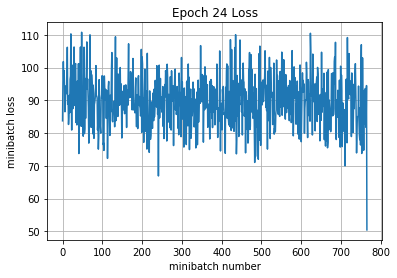

Iteration 18400: with minibatch training loss = 1.34 and accuracy of 0.53
Iteration 18500: with minibatch training loss = 1.45 and accuracy of 0.47
Iteration 18600: with minibatch training loss = 1.16 and accuracy of 0.69
Iteration 18700: with minibatch training loss = 1.5 and accuracy of 0.48
Iteration 18800: with minibatch training loss = 1.33 and accuracy of 0.58
Iteration 18900: with minibatch training loss = 1.56 and accuracy of 0.47
Iteration 19000: with minibatch training loss = 1.22 and accuracy of 0.56
Iteration 19100: with minibatch training loss = 1.61 and accuracy of 0.45
Epoch 25, Overall loss = 1.37 and accuracy of 0.525


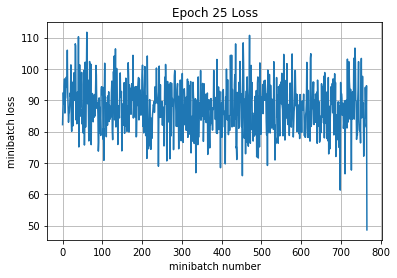

Iteration 19200: with minibatch training loss = 1.34 and accuracy of 0.53
Iteration 19300: with minibatch training loss = 1.44 and accuracy of 0.47
Iteration 19400: with minibatch training loss = 1.23 and accuracy of 0.64
Iteration 19500: with minibatch training loss = 1.4 and accuracy of 0.48
Iteration 19600: with minibatch training loss = 1.31 and accuracy of 0.64
Iteration 19700: with minibatch training loss = 1.36 and accuracy of 0.52
Iteration 19800: with minibatch training loss = 1.23 and accuracy of 0.56
Iteration 19900: with minibatch training loss = 1.32 and accuracy of 0.55
Epoch 26, Overall loss = 1.35 and accuracy of 0.535


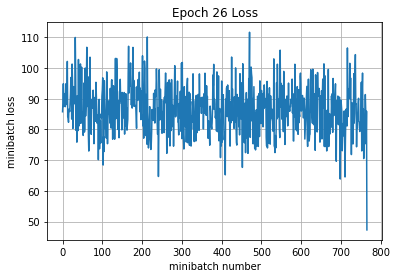

Iteration 20000: with minibatch training loss = 1.41 and accuracy of 0.45
Iteration 20100: with minibatch training loss = 1.4 and accuracy of 0.59
Iteration 20200: with minibatch training loss = 1.26 and accuracy of 0.56
Iteration 20300: with minibatch training loss = 1.34 and accuracy of 0.58
Iteration 20400: with minibatch training loss = 1.29 and accuracy of 0.64
Iteration 20500: with minibatch training loss = 1.46 and accuracy of 0.52
Iteration 20600: with minibatch training loss = 1.35 and accuracy of 0.62
Epoch 27, Overall loss = 1.32 and accuracy of 0.552


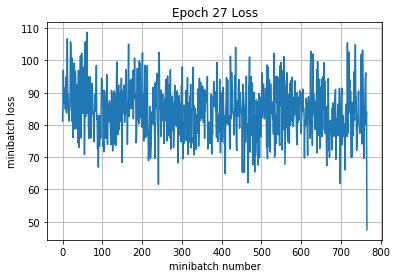

Iteration 20700: with minibatch training loss = 1.29 and accuracy of 0.55
Iteration 20800: with minibatch training loss = 1.38 and accuracy of 0.55
Iteration 20900: with minibatch training loss = 1.09 and accuracy of 0.66
Iteration 21000: with minibatch training loss = 1.39 and accuracy of 0.47
Iteration 21100: with minibatch training loss = 1.41 and accuracy of 0.55
Iteration 21200: with minibatch training loss = 1.38 and accuracy of 0.47
Iteration 21300: with minibatch training loss = 1.49 and accuracy of 0.52
Iteration 21400: with minibatch training loss = 1.29 and accuracy of 0.55
Epoch 28, Overall loss = 1.29 and accuracy of 0.562


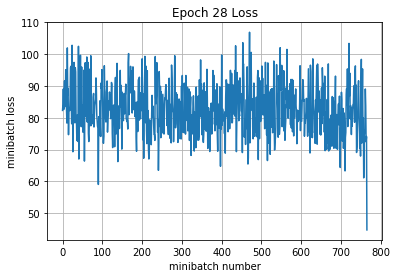

Iteration 21500: with minibatch training loss = 1.16 and accuracy of 0.61
Iteration 21600: with minibatch training loss = 1.36 and accuracy of 0.52
Iteration 21700: with minibatch training loss = 1.23 and accuracy of 0.64
Iteration 21800: with minibatch training loss = 1.47 and accuracy of 0.48
Iteration 21900: with minibatch training loss = 0.963 and accuracy of 0.69
Iteration 22000: with minibatch training loss = 1.27 and accuracy of 0.67
Iteration 22100: with minibatch training loss = 1.07 and accuracy of 0.62
Iteration 22200: with minibatch training loss = 1.05 and accuracy of 0.66
Epoch 29, Overall loss = 1.27 and accuracy of 0.576


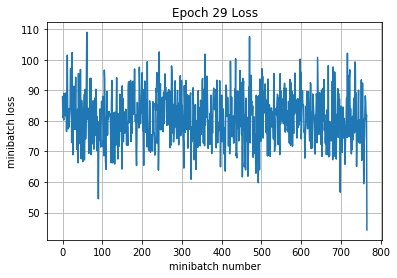

Iteration 22300: with minibatch training loss = 1.13 and accuracy of 0.62
Iteration 22400: with minibatch training loss = 1.13 and accuracy of 0.59
Iteration 22500: with minibatch training loss = 1.24 and accuracy of 0.62
Iteration 22600: with minibatch training loss = 1.29 and accuracy of 0.58
Iteration 22700: with minibatch training loss = 1.06 and accuracy of 0.67
Iteration 22800: with minibatch training loss = 1.35 and accuracy of 0.48
Iteration 22900: with minibatch training loss = 1.36 and accuracy of 0.52
Epoch 30, Overall loss = 1.24 and accuracy of 0.583


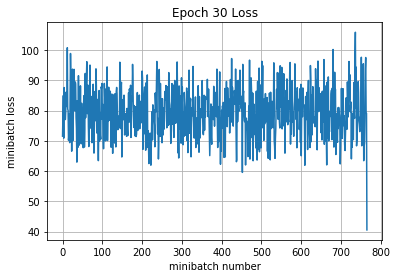

Iteration 23000: with minibatch training loss = 1.39 and accuracy of 0.48
Iteration 23100: with minibatch training loss = 1.25 and accuracy of 0.59
Iteration 23200: with minibatch training loss = 1.17 and accuracy of 0.59
Iteration 23300: with minibatch training loss = 1.24 and accuracy of 0.62
Iteration 23400: with minibatch training loss = 1.08 and accuracy of 0.62
Iteration 23500: with minibatch training loss = 1.32 and accuracy of 0.53
Iteration 23600: with minibatch training loss = 1.25 and accuracy of 0.59
Iteration 23700: with minibatch training loss = 1.46 and accuracy of 0.52
Epoch 31, Overall loss = 1.23 and accuracy of 0.59


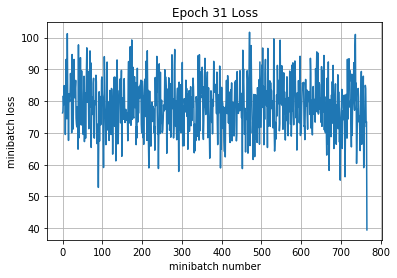

Iteration 23800: with minibatch training loss = 1.34 and accuracy of 0.55
Iteration 23900: with minibatch training loss = 1.32 and accuracy of 0.62
Iteration 24000: with minibatch training loss = 1.37 and accuracy of 0.5
Iteration 24100: with minibatch training loss = 1.04 and accuracy of 0.67
Iteration 24200: with minibatch training loss = 1.24 and accuracy of 0.56
Iteration 24300: with minibatch training loss = 1.16 and accuracy of 0.62
Iteration 24400: with minibatch training loss = 1.37 and accuracy of 0.55
Iteration 24500: with minibatch training loss = 1.31 and accuracy of 0.48
Epoch 32, Overall loss = 1.2 and accuracy of 0.6


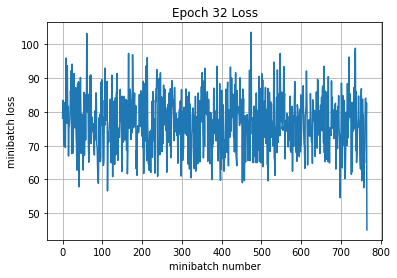

Iteration 24600: with minibatch training loss = 1.03 and accuracy of 0.7
Iteration 24700: with minibatch training loss = 1.23 and accuracy of 0.58
Iteration 24800: with minibatch training loss = 1.29 and accuracy of 0.62
Iteration 24900: with minibatch training loss = 1.52 and accuracy of 0.5
Iteration 25000: with minibatch training loss = 1.03 and accuracy of 0.62
Iteration 25100: with minibatch training loss = 1.09 and accuracy of 0.62
Iteration 25200: with minibatch training loss = 0.997 and accuracy of 0.7
Epoch 33, Overall loss = 1.18 and accuracy of 0.608


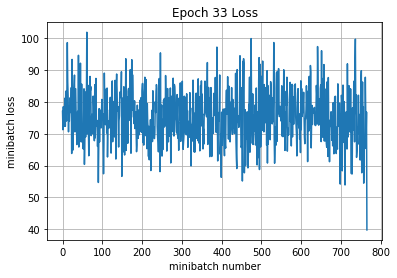

Iteration 25300: with minibatch training loss = 1.24 and accuracy of 0.58
Iteration 25400: with minibatch training loss = 1.1 and accuracy of 0.58
Iteration 25500: with minibatch training loss = 0.961 and accuracy of 0.66
Iteration 25600: with minibatch training loss = 1.27 and accuracy of 0.61
Iteration 25700: with minibatch training loss = 1.43 and accuracy of 0.59
Iteration 25800: with minibatch training loss = 0.954 and accuracy of 0.69
Iteration 25900: with minibatch training loss = 1 and accuracy of 0.72
Iteration 26000: with minibatch training loss = 1.31 and accuracy of 0.52
Epoch 34, Overall loss = 1.16 and accuracy of 0.619


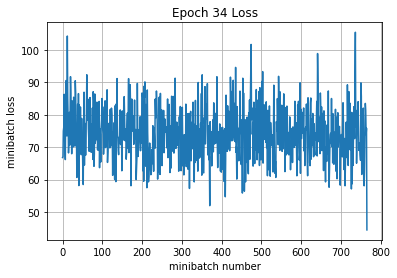

Iteration 26100: with minibatch training loss = 1.08 and accuracy of 0.66
Iteration 26200: with minibatch training loss = 0.97 and accuracy of 0.69
Iteration 26300: with minibatch training loss = 1.32 and accuracy of 0.58
Iteration 26400: with minibatch training loss = 1.26 and accuracy of 0.56
Iteration 26500: with minibatch training loss = 1.19 and accuracy of 0.64
Iteration 26600: with minibatch training loss = 1.29 and accuracy of 0.52
Iteration 26700: with minibatch training loss = 1.08 and accuracy of 0.67
Iteration 26800: with minibatch training loss = 1.21 and accuracy of 0.67
Epoch 35, Overall loss = 1.15 and accuracy of 0.624


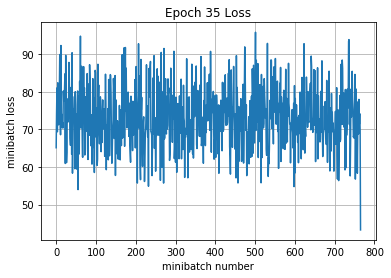

Iteration 26900: with minibatch training loss = 0.965 and accuracy of 0.67
Iteration 27000: with minibatch training loss = 1.05 and accuracy of 0.72
Iteration 27100: with minibatch training loss = 1.14 and accuracy of 0.66
Iteration 27200: with minibatch training loss = 1.06 and accuracy of 0.7
Iteration 27300: with minibatch training loss = 1.32 and accuracy of 0.52
Iteration 27400: with minibatch training loss = 1.11 and accuracy of 0.66
Iteration 27500: with minibatch training loss = 0.884 and accuracy of 0.69
Epoch 36, Overall loss = 1.13 and accuracy of 0.629


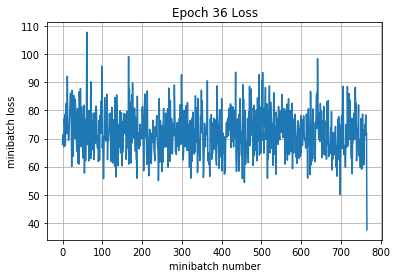

Iteration 27600: with minibatch training loss = 1.19 and accuracy of 0.64
Iteration 27700: with minibatch training loss = 1.19 and accuracy of 0.64
Iteration 27800: with minibatch training loss = 0.926 and accuracy of 0.67
Iteration 27900: with minibatch training loss = 1.18 and accuracy of 0.67
Iteration 28000: with minibatch training loss = 1.08 and accuracy of 0.7
Iteration 28100: with minibatch training loss = 1.2 and accuracy of 0.59
Iteration 28200: with minibatch training loss = 1.12 and accuracy of 0.64
Iteration 28300: with minibatch training loss = 1.24 and accuracy of 0.62
Epoch 37, Overall loss = 1.1 and accuracy of 0.639


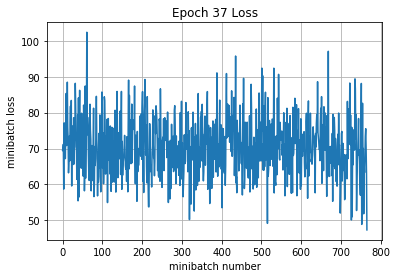

Iteration 28400: with minibatch training loss = 0.972 and accuracy of 0.69
Iteration 28500: with minibatch training loss = 1.1 and accuracy of 0.58
Iteration 28600: with minibatch training loss = 1.13 and accuracy of 0.55
Iteration 28700: with minibatch training loss = 1.19 and accuracy of 0.59
Iteration 28800: with minibatch training loss = 0.96 and accuracy of 0.69
Iteration 28900: with minibatch training loss = 1.17 and accuracy of 0.61
Iteration 29000: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 29100: with minibatch training loss = 0.997 and accuracy of 0.67
Epoch 38, Overall loss = 1.08 and accuracy of 0.647


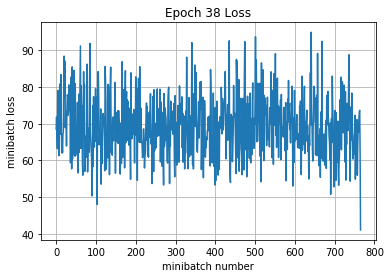

Iteration 29200: with minibatch training loss = 1.14 and accuracy of 0.61
Iteration 29300: with minibatch training loss = 0.87 and accuracy of 0.72
Iteration 29400: with minibatch training loss = 0.989 and accuracy of 0.64
Iteration 29500: with minibatch training loss = 0.915 and accuracy of 0.75
Iteration 29600: with minibatch training loss = 0.958 and accuracy of 0.7
Iteration 29700: with minibatch training loss = 1.3 and accuracy of 0.55
Iteration 29800: with minibatch training loss = 1.1 and accuracy of 0.62
Epoch 39, Overall loss = 1.07 and accuracy of 0.654


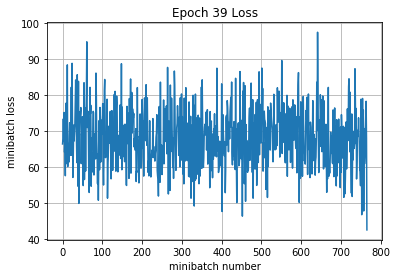

Iteration 29900: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 30000: with minibatch training loss = 0.857 and accuracy of 0.77
Iteration 30100: with minibatch training loss = 0.975 and accuracy of 0.69
Iteration 30200: with minibatch training loss = 1.22 and accuracy of 0.62
Iteration 30300: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 30400: with minibatch training loss = 1.12 and accuracy of 0.61
Iteration 30500: with minibatch training loss = 0.965 and accuracy of 0.67
Iteration 30600: with minibatch training loss = 0.883 and accuracy of 0.75
Epoch 40, Overall loss = 1.06 and accuracy of 0.657


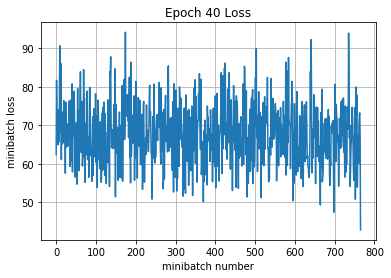

Iteration 30700: with minibatch training loss = 1.08 and accuracy of 0.66
Iteration 30800: with minibatch training loss = 0.949 and accuracy of 0.72
Iteration 30900: with minibatch training loss = 1.03 and accuracy of 0.66
Iteration 31000: with minibatch training loss = 1.09 and accuracy of 0.67
Iteration 31100: with minibatch training loss = 0.909 and accuracy of 0.77
Iteration 31200: with minibatch training loss = 0.963 and accuracy of 0.69
Iteration 31300: with minibatch training loss = 0.94 and accuracy of 0.73
Iteration 31400: with minibatch training loss = 0.918 and accuracy of 0.72
Epoch 41, Overall loss = 1.04 and accuracy of 0.665


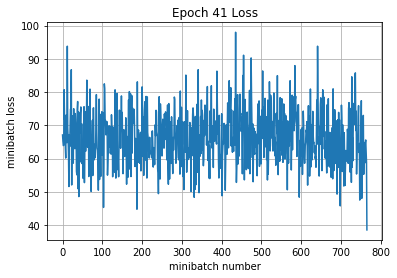

Iteration 31500: with minibatch training loss = 1.18 and accuracy of 0.62
Iteration 31600: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 31700: with minibatch training loss = 0.935 and accuracy of 0.7
Iteration 31800: with minibatch training loss = 1.21 and accuracy of 0.64
Iteration 31900: with minibatch training loss = 1.27 and accuracy of 0.62
Iteration 32000: with minibatch training loss = 1.15 and accuracy of 0.62
Iteration 32100: with minibatch training loss = 1.08 and accuracy of 0.64
Epoch 42, Overall loss = 1.03 and accuracy of 0.668


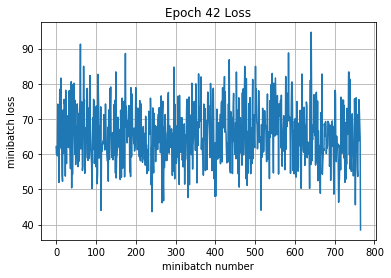

Iteration 32200: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 32300: with minibatch training loss = 0.968 and accuracy of 0.69
Iteration 32400: with minibatch training loss = 0.957 and accuracy of 0.7
Iteration 32500: with minibatch training loss = 1.19 and accuracy of 0.66
Iteration 32600: with minibatch training loss = 1.09 and accuracy of 0.62
Iteration 32700: with minibatch training loss = 1.06 and accuracy of 0.67
Iteration 32800: with minibatch training loss = 1.05 and accuracy of 0.62
Iteration 32900: with minibatch training loss = 0.825 and accuracy of 0.67
Epoch 43, Overall loss = 1.01 and accuracy of 0.677


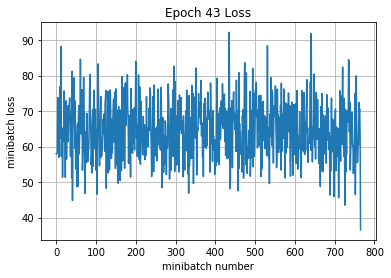

Iteration 33000: with minibatch training loss = 0.934 and accuracy of 0.73
Iteration 33100: with minibatch training loss = 1.08 and accuracy of 0.7
Iteration 33200: with minibatch training loss = 0.926 and accuracy of 0.75
Iteration 33300: with minibatch training loss = 0.937 and accuracy of 0.69
Iteration 33400: with minibatch training loss = 0.82 and accuracy of 0.75
Iteration 33500: with minibatch training loss = 1.04 and accuracy of 0.66
Iteration 33600: with minibatch training loss = 0.869 and accuracy of 0.77
Iteration 33700: with minibatch training loss = 1.04 and accuracy of 0.66
Epoch 44, Overall loss = 0.995 and accuracy of 0.685


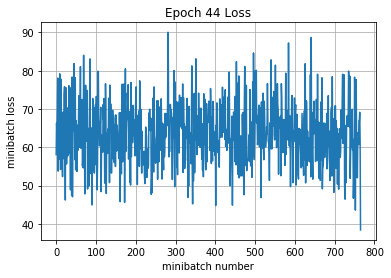

Iteration 33800: with minibatch training loss = 0.856 and accuracy of 0.72
Iteration 33900: with minibatch training loss = 0.935 and accuracy of 0.72
Iteration 34000: with minibatch training loss = 1.25 and accuracy of 0.56
Iteration 34100: with minibatch training loss = 1.04 and accuracy of 0.67
Iteration 34200: with minibatch training loss = 1.11 and accuracy of 0.7
Iteration 34300: with minibatch training loss = 1.01 and accuracy of 0.7
Iteration 34400: with minibatch training loss = 1.12 and accuracy of 0.59
Epoch 45, Overall loss = 0.984 and accuracy of 0.688


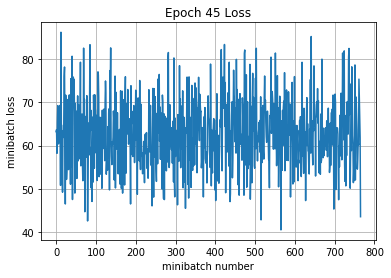

Iteration 34500: with minibatch training loss = 1.04 and accuracy of 0.69
Iteration 34600: with minibatch training loss = 1.08 and accuracy of 0.69
Iteration 34700: with minibatch training loss = 0.9 and accuracy of 0.72
Iteration 34800: with minibatch training loss = 1.05 and accuracy of 0.67
Iteration 34900: with minibatch training loss = 0.839 and accuracy of 0.69
Iteration 35000: with minibatch training loss = 0.977 and accuracy of 0.66
Iteration 35100: with minibatch training loss = 1.07 and accuracy of 0.67
Iteration 35200: with minibatch training loss = 1 and accuracy of 0.64
Epoch 46, Overall loss = 0.972 and accuracy of 0.691


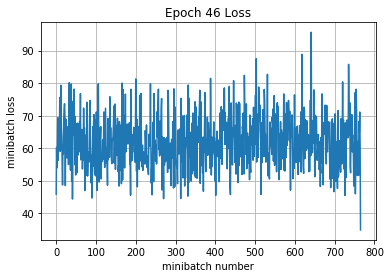

Iteration 35300: with minibatch training loss = 1.02 and accuracy of 0.64
Iteration 35400: with minibatch training loss = 0.804 and accuracy of 0.75
Iteration 35500: with minibatch training loss = 0.967 and accuracy of 0.69
Iteration 35600: with minibatch training loss = 0.97 and accuracy of 0.67
Iteration 35700: with minibatch training loss = 1.03 and accuracy of 0.64
Iteration 35800: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 35900: with minibatch training loss = 0.764 and accuracy of 0.8
Iteration 36000: with minibatch training loss = 0.911 and accuracy of 0.77
Epoch 47, Overall loss = 0.959 and accuracy of 0.697


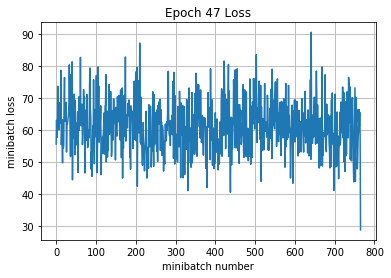

Iteration 36100: with minibatch training loss = 0.92 and accuracy of 0.69
Iteration 36200: with minibatch training loss = 0.942 and accuracy of 0.7
Iteration 36300: with minibatch training loss = 0.819 and accuracy of 0.78
Iteration 36400: with minibatch training loss = 0.813 and accuracy of 0.73
Iteration 36500: with minibatch training loss = 0.928 and accuracy of 0.73
Iteration 36600: with minibatch training loss = 0.88 and accuracy of 0.77
Iteration 36700: with minibatch training loss = 0.642 and accuracy of 0.81
Epoch 48, Overall loss = 0.955 and accuracy of 0.698


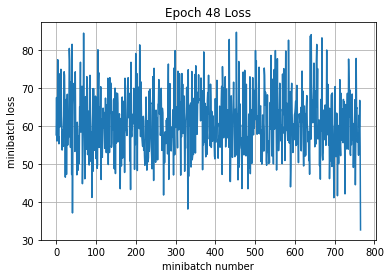

Iteration 36800: with minibatch training loss = 1.05 and accuracy of 0.59
Iteration 36900: with minibatch training loss = 0.992 and accuracy of 0.64
Iteration 37000: with minibatch training loss = 0.745 and accuracy of 0.81
Iteration 37100: with minibatch training loss = 1.06 and accuracy of 0.66
Iteration 37200: with minibatch training loss = 1.04 and accuracy of 0.69
Iteration 37300: with minibatch training loss = 0.764 and accuracy of 0.75
Iteration 37400: with minibatch training loss = 0.893 and accuracy of 0.72
Iteration 37500: with minibatch training loss = 0.997 and accuracy of 0.69
Epoch 49, Overall loss = 0.942 and accuracy of 0.703


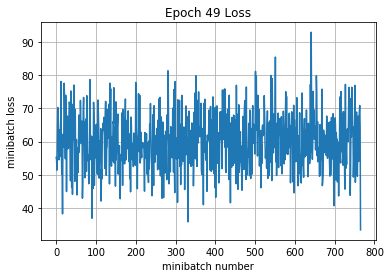

Iteration 37600: with minibatch training loss = 0.663 and accuracy of 0.8
Iteration 37700: with minibatch training loss = 1.2 and accuracy of 0.64
Iteration 37800: with minibatch training loss = 0.824 and accuracy of 0.75
Iteration 37900: with minibatch training loss = 0.936 and accuracy of 0.67
Iteration 38000: with minibatch training loss = 0.849 and accuracy of 0.69
Iteration 38100: with minibatch training loss = 0.98 and accuracy of 0.69
Iteration 38200: with minibatch training loss = 0.911 and accuracy of 0.72
Epoch 50, Overall loss = 0.925 and accuracy of 0.709


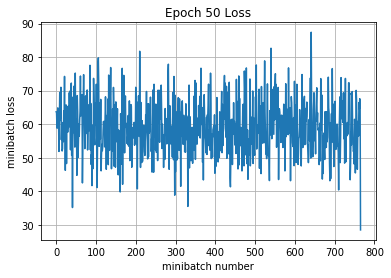

Iteration 38300: with minibatch training loss = 0.858 and accuracy of 0.7
Iteration 38400: with minibatch training loss = 0.808 and accuracy of 0.77
Iteration 38500: with minibatch training loss = 1.27 and accuracy of 0.67
Iteration 38600: with minibatch training loss = 0.934 and accuracy of 0.75
Iteration 38700: with minibatch training loss = 0.956 and accuracy of 0.64
Iteration 38800: with minibatch training loss = 0.963 and accuracy of 0.69
Iteration 38900: with minibatch training loss = 0.841 and accuracy of 0.75
Iteration 39000: with minibatch training loss = 0.922 and accuracy of 0.73
Epoch 51, Overall loss = 0.925 and accuracy of 0.709


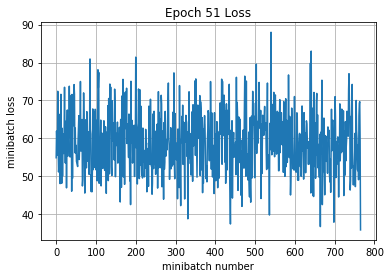

Iteration 39100: with minibatch training loss = 1.01 and accuracy of 0.7
Iteration 39200: with minibatch training loss = 0.786 and accuracy of 0.72
Iteration 39300: with minibatch training loss = 0.886 and accuracy of 0.75
Iteration 39400: with minibatch training loss = 1.01 and accuracy of 0.69
Iteration 39500: with minibatch training loss = 0.947 and accuracy of 0.7
Iteration 39600: with minibatch training loss = 0.913 and accuracy of 0.69
Iteration 39700: with minibatch training loss = 0.899 and accuracy of 0.69
Iteration 39800: with minibatch training loss = 0.773 and accuracy of 0.77
Epoch 52, Overall loss = 0.923 and accuracy of 0.711


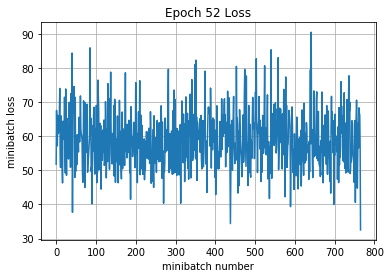

Iteration 39900: with minibatch training loss = 0.968 and accuracy of 0.64
Iteration 40000: with minibatch training loss = 1.12 and accuracy of 0.67
Iteration 40100: with minibatch training loss = 0.932 and accuracy of 0.69
Iteration 40200: with minibatch training loss = 0.852 and accuracy of 0.67
Iteration 40300: with minibatch training loss = 0.93 and accuracy of 0.66
Iteration 40400: with minibatch training loss = 0.833 and accuracy of 0.78
Iteration 40500: with minibatch training loss = 1.13 and accuracy of 0.64
Epoch 53, Overall loss = 0.905 and accuracy of 0.717


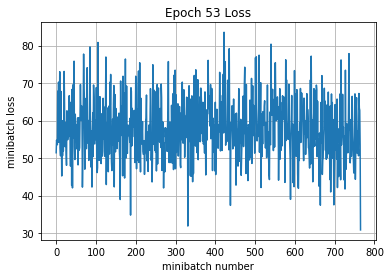

Iteration 40600: with minibatch training loss = 0.803 and accuracy of 0.73
Iteration 40700: with minibatch training loss = 0.717 and accuracy of 0.78
Iteration 40800: with minibatch training loss = 0.834 and accuracy of 0.72
Iteration 40900: with minibatch training loss = 0.942 and accuracy of 0.7
Iteration 41000: with minibatch training loss = 0.951 and accuracy of 0.64
Iteration 41100: with minibatch training loss = 0.954 and accuracy of 0.73
Iteration 41200: with minibatch training loss = 0.871 and accuracy of 0.75
Iteration 41300: with minibatch training loss = 1.02 and accuracy of 0.67
Epoch 54, Overall loss = 0.893 and accuracy of 0.721


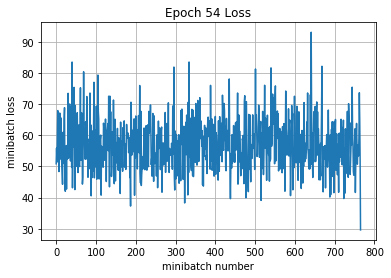

Iteration 41400: with minibatch training loss = 0.665 and accuracy of 0.81
Iteration 41500: with minibatch training loss = 0.89 and accuracy of 0.77
Iteration 41600: with minibatch training loss = 0.932 and accuracy of 0.66
Iteration 41700: with minibatch training loss = 0.861 and accuracy of 0.72
Iteration 41800: with minibatch training loss = 0.838 and accuracy of 0.73
Iteration 41900: with minibatch training loss = 0.658 and accuracy of 0.78
Iteration 42000: with minibatch training loss = 0.837 and accuracy of 0.77
Iteration 42100: with minibatch training loss = 1.08 and accuracy of 0.7
Epoch 55, Overall loss = 0.886 and accuracy of 0.723


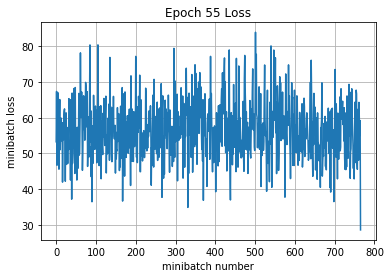

Iteration 42200: with minibatch training loss = 1.02 and accuracy of 0.66
Iteration 42300: with minibatch training loss = 0.968 and accuracy of 0.73
Iteration 42400: with minibatch training loss = 0.712 and accuracy of 0.83
Iteration 42500: with minibatch training loss = 0.756 and accuracy of 0.8
Iteration 42600: with minibatch training loss = 0.996 and accuracy of 0.67
Iteration 42700: with minibatch training loss = 0.972 and accuracy of 0.7
Iteration 42800: with minibatch training loss = 0.687 and accuracy of 0.8
Epoch 56, Overall loss = 0.877 and accuracy of 0.727


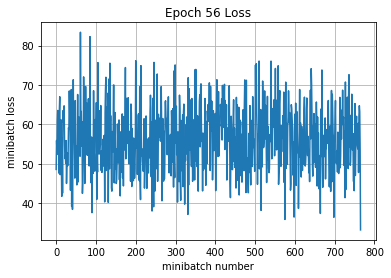

Iteration 42900: with minibatch training loss = 1.04 and accuracy of 0.64
Iteration 43000: with minibatch training loss = 0.766 and accuracy of 0.81
Iteration 43100: with minibatch training loss = 0.674 and accuracy of 0.84
Iteration 43200: with minibatch training loss = 1.01 and accuracy of 0.67
Iteration 43300: with minibatch training loss = 0.89 and accuracy of 0.75
Iteration 43400: with minibatch training loss = 1.04 and accuracy of 0.64
Iteration 43500: with minibatch training loss = 1.02 and accuracy of 0.75
Iteration 43600: with minibatch training loss = 0.873 and accuracy of 0.72
Epoch 57, Overall loss = 0.87 and accuracy of 0.73


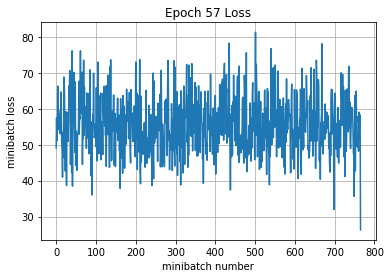

Iteration 43700: with minibatch training loss = 1.06 and accuracy of 0.59
Iteration 43800: with minibatch training loss = 0.825 and accuracy of 0.75
Iteration 43900: with minibatch training loss = 0.886 and accuracy of 0.72
Iteration 44000: with minibatch training loss = 0.757 and accuracy of 0.75
Iteration 44100: with minibatch training loss = 0.534 and accuracy of 0.92
Iteration 44200: with minibatch training loss = 0.767 and accuracy of 0.77
Iteration 44300: with minibatch training loss = 0.979 and accuracy of 0.72
Iteration 44400: with minibatch training loss = 0.904 and accuracy of 0.72
Epoch 58, Overall loss = 0.867 and accuracy of 0.73


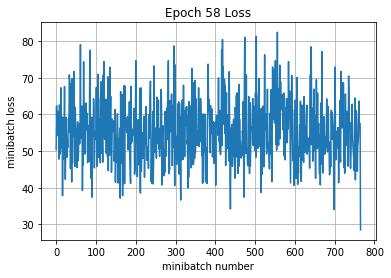

Iteration 44500: with minibatch training loss = 0.857 and accuracy of 0.78
Iteration 44600: with minibatch training loss = 0.701 and accuracy of 0.77
Iteration 44700: with minibatch training loss = 0.71 and accuracy of 0.78
Iteration 44800: with minibatch training loss = 0.768 and accuracy of 0.75
Iteration 44900: with minibatch training loss = 0.858 and accuracy of 0.75
Iteration 45000: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 45100: with minibatch training loss = 0.859 and accuracy of 0.72
Epoch 59, Overall loss = 0.852 and accuracy of 0.737


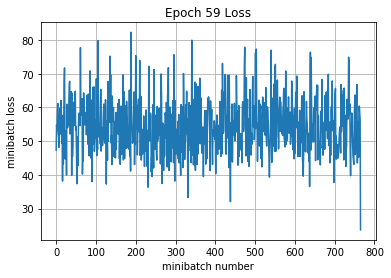

Iteration 45200: with minibatch training loss = 0.917 and accuracy of 0.75
Iteration 45300: with minibatch training loss = 0.938 and accuracy of 0.72
Iteration 45400: with minibatch training loss = 0.929 and accuracy of 0.69
Iteration 45500: with minibatch training loss = 1.07 and accuracy of 0.64
Iteration 45600: with minibatch training loss = 0.863 and accuracy of 0.7
Iteration 45700: with minibatch training loss = 0.748 and accuracy of 0.8
Iteration 45800: with minibatch training loss = 1.05 and accuracy of 0.72
Iteration 45900: with minibatch training loss = 0.762 and accuracy of 0.77
Epoch 60, Overall loss = 0.851 and accuracy of 0.737


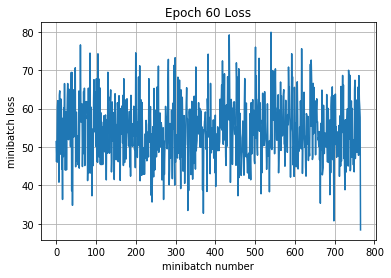

Iteration 46000: with minibatch training loss = 0.968 and accuracy of 0.69
Iteration 46100: with minibatch training loss = 0.884 and accuracy of 0.7
Iteration 46200: with minibatch training loss = 0.76 and accuracy of 0.72
Iteration 46300: with minibatch training loss = 0.836 and accuracy of 0.75
Iteration 46400: with minibatch training loss = 0.947 and accuracy of 0.69
Iteration 46500: with minibatch training loss = 1.06 and accuracy of 0.73
Iteration 46600: with minibatch training loss = 0.707 and accuracy of 0.8
Iteration 46700: with minibatch training loss = 0.775 and accuracy of 0.77
Epoch 61, Overall loss = 0.842 and accuracy of 0.742


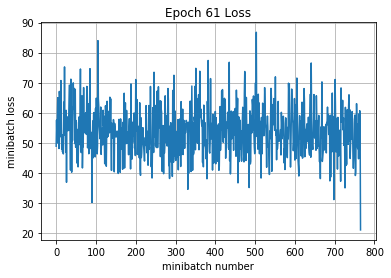

Iteration 46800: with minibatch training loss = 0.914 and accuracy of 0.75
Iteration 46900: with minibatch training loss = 0.798 and accuracy of 0.66
Iteration 47000: with minibatch training loss = 0.915 and accuracy of 0.75
Iteration 47100: with minibatch training loss = 0.92 and accuracy of 0.67
Iteration 47200: with minibatch training loss = 1.08 and accuracy of 0.66
Iteration 47300: with minibatch training loss = 0.907 and accuracy of 0.7
Iteration 47400: with minibatch training loss = 0.758 and accuracy of 0.73
Epoch 62, Overall loss = 0.835 and accuracy of 0.743


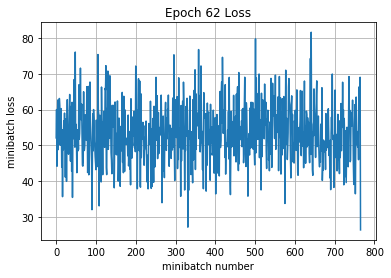

Iteration 47500: with minibatch training loss = 0.806 and accuracy of 0.77
Iteration 47600: with minibatch training loss = 0.752 and accuracy of 0.8
Iteration 47700: with minibatch training loss = 0.986 and accuracy of 0.66
Iteration 47800: with minibatch training loss = 0.99 and accuracy of 0.66
Iteration 47900: with minibatch training loss = 0.854 and accuracy of 0.77
Iteration 48000: with minibatch training loss = 1.01 and accuracy of 0.67
Iteration 48100: with minibatch training loss = 0.617 and accuracy of 0.8
Iteration 48200: with minibatch training loss = 0.816 and accuracy of 0.77
Epoch 63, Overall loss = 0.831 and accuracy of 0.744


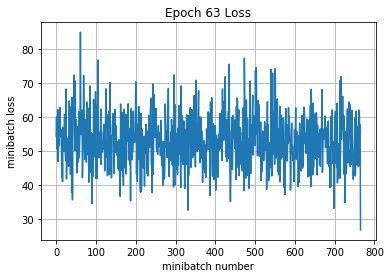

Iteration 48300: with minibatch training loss = 0.961 and accuracy of 0.67
Iteration 48400: with minibatch training loss = 0.833 and accuracy of 0.75
Iteration 48500: with minibatch training loss = 0.797 and accuracy of 0.77
Iteration 48600: with minibatch training loss = 0.844 and accuracy of 0.73
Iteration 48700: with minibatch training loss = 0.952 and accuracy of 0.7
Iteration 48800: with minibatch training loss = 0.646 and accuracy of 0.77
Iteration 48900: with minibatch training loss = 0.949 and accuracy of 0.69
Iteration 49000: with minibatch training loss = 0.837 and accuracy of 0.77
Epoch 64, Overall loss = 0.828 and accuracy of 0.747


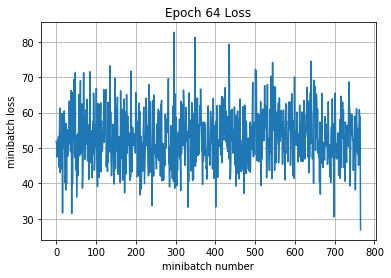

Iteration 49100: with minibatch training loss = 0.768 and accuracy of 0.72
Iteration 49200: with minibatch training loss = 0.792 and accuracy of 0.75
Iteration 49300: with minibatch training loss = 0.72 and accuracy of 0.84
Iteration 49400: with minibatch training loss = 0.599 and accuracy of 0.77
Iteration 49500: with minibatch training loss = 0.939 and accuracy of 0.67
Iteration 49600: with minibatch training loss = 0.866 and accuracy of 0.75
Iteration 49700: with minibatch training loss = 0.896 and accuracy of 0.77
Epoch 65, Overall loss = 0.814 and accuracy of 0.751


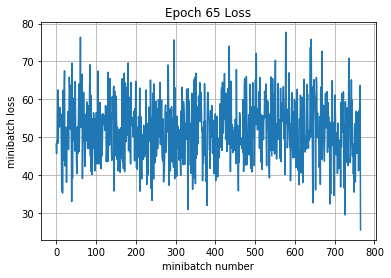

Iteration 49800: with minibatch training loss = 0.718 and accuracy of 0.8
Iteration 49900: with minibatch training loss = 0.851 and accuracy of 0.73
Iteration 50000: with minibatch training loss = 1.01 and accuracy of 0.64
Iteration 50100: with minibatch training loss = 0.784 and accuracy of 0.77
Iteration 50200: with minibatch training loss = 0.704 and accuracy of 0.8
Iteration 50300: with minibatch training loss = 0.831 and accuracy of 0.75
Iteration 50400: with minibatch training loss = 0.719 and accuracy of 0.78
Iteration 50500: with minibatch training loss = 0.754 and accuracy of 0.77
Epoch 66, Overall loss = 0.808 and accuracy of 0.755


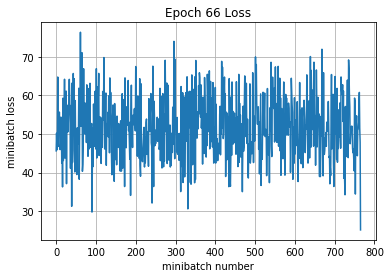

Iteration 50600: with minibatch training loss = 0.857 and accuracy of 0.78
Iteration 50700: with minibatch training loss = 0.856 and accuracy of 0.7
Iteration 50800: with minibatch training loss = 0.775 and accuracy of 0.75
Iteration 50900: with minibatch training loss = 0.86 and accuracy of 0.75
Iteration 51000: with minibatch training loss = 0.84 and accuracy of 0.8
Iteration 51100: with minibatch training loss = 1.02 and accuracy of 0.73
Iteration 51200: with minibatch training loss = 0.856 and accuracy of 0.67
Iteration 51300: with minibatch training loss = 0.986 and accuracy of 0.7
Epoch 67, Overall loss = 0.802 and accuracy of 0.757


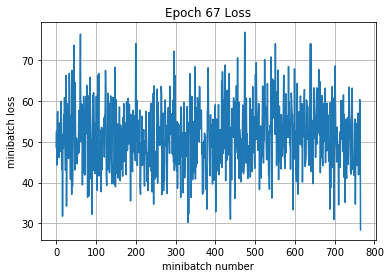

Iteration 51400: with minibatch training loss = 0.859 and accuracy of 0.72
Iteration 51500: with minibatch training loss = 0.811 and accuracy of 0.78
Iteration 51600: with minibatch training loss = 0.874 and accuracy of 0.73
Iteration 51700: with minibatch training loss = 0.746 and accuracy of 0.8
Iteration 51800: with minibatch training loss = 1 and accuracy of 0.72
Iteration 51900: with minibatch training loss = 0.881 and accuracy of 0.75
Iteration 52000: with minibatch training loss = 0.782 and accuracy of 0.73
Epoch 68, Overall loss = 0.8 and accuracy of 0.757


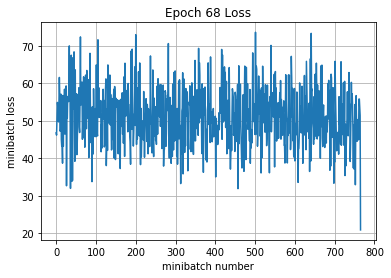

Iteration 52100: with minibatch training loss = 0.961 and accuracy of 0.69
Iteration 52200: with minibatch training loss = 0.845 and accuracy of 0.73
Iteration 52300: with minibatch training loss = 0.649 and accuracy of 0.8
Iteration 52400: with minibatch training loss = 0.76 and accuracy of 0.77
Iteration 52500: with minibatch training loss = 0.934 and accuracy of 0.69
Iteration 52600: with minibatch training loss = 0.983 and accuracy of 0.67
Iteration 52700: with minibatch training loss = 0.954 and accuracy of 0.72
Iteration 52800: with minibatch training loss = 0.802 and accuracy of 0.78
Epoch 69, Overall loss = 0.801 and accuracy of 0.756


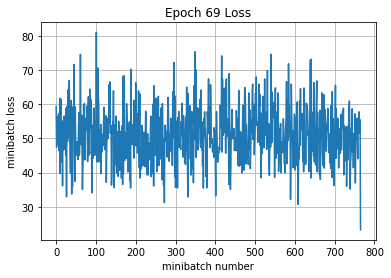

Iteration 52900: with minibatch training loss = 0.926 and accuracy of 0.75
Iteration 53000: with minibatch training loss = 0.551 and accuracy of 0.86
Iteration 53100: with minibatch training loss = 0.974 and accuracy of 0.69
Iteration 53200: with minibatch training loss = 0.827 and accuracy of 0.75
Iteration 53300: with minibatch training loss = 0.781 and accuracy of 0.75
Iteration 53400: with minibatch training loss = 0.722 and accuracy of 0.8
Iteration 53500: with minibatch training loss = 0.695 and accuracy of 0.8
Iteration 53600: with minibatch training loss = 0.773 and accuracy of 0.78
Epoch 70, Overall loss = 0.789 and accuracy of 0.759


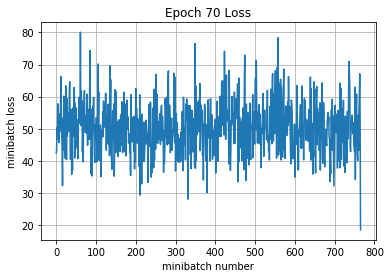

Iteration 53700: with minibatch training loss = 0.628 and accuracy of 0.81
Iteration 53800: with minibatch training loss = 0.909 and accuracy of 0.77
Iteration 53900: with minibatch training loss = 0.843 and accuracy of 0.73
Iteration 54000: with minibatch training loss = 0.744 and accuracy of 0.78
Iteration 54100: with minibatch training loss = 0.836 and accuracy of 0.72
Iteration 54200: with minibatch training loss = 0.838 and accuracy of 0.75
Iteration 54300: with minibatch training loss = 0.757 and accuracy of 0.78
Epoch 71, Overall loss = 0.784 and accuracy of 0.762


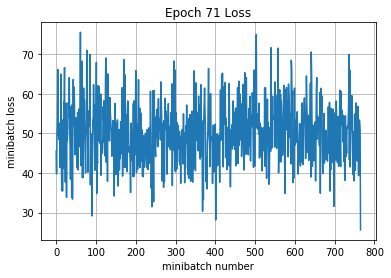

Iteration 54400: with minibatch training loss = 0.589 and accuracy of 0.83
Iteration 54500: with minibatch training loss = 0.789 and accuracy of 0.75
Iteration 54600: with minibatch training loss = 0.636 and accuracy of 0.86
Iteration 54700: with minibatch training loss = 0.818 and accuracy of 0.7
Iteration 54800: with minibatch training loss = 0.697 and accuracy of 0.73
Iteration 54900: with minibatch training loss = 0.86 and accuracy of 0.72
Iteration 55000: with minibatch training loss = 0.746 and accuracy of 0.77
Iteration 55100: with minibatch training loss = 0.648 and accuracy of 0.8
Epoch 72, Overall loss = 0.786 and accuracy of 0.762


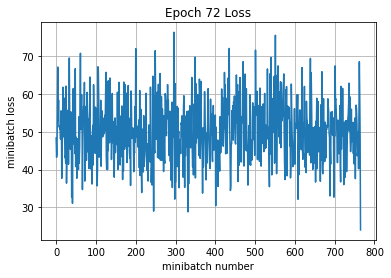

Iteration 55200: with minibatch training loss = 0.975 and accuracy of 0.7
Iteration 55300: with minibatch training loss = 0.845 and accuracy of 0.7
Iteration 55400: with minibatch training loss = 0.759 and accuracy of 0.8
Iteration 55500: with minibatch training loss = 0.602 and accuracy of 0.78
Iteration 55600: with minibatch training loss = 0.789 and accuracy of 0.7
Iteration 55700: with minibatch training loss = 0.871 and accuracy of 0.75
Iteration 55800: with minibatch training loss = 1.05 and accuracy of 0.73
Iteration 55900: with minibatch training loss = 0.774 and accuracy of 0.77
Epoch 73, Overall loss = 0.771 and accuracy of 0.768


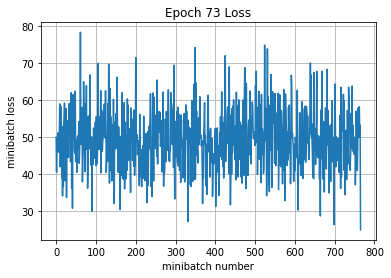

Iteration 56000: with minibatch training loss = 0.563 and accuracy of 0.86
Iteration 56100: with minibatch training loss = 0.697 and accuracy of 0.78
Iteration 56200: with minibatch training loss = 0.941 and accuracy of 0.66
Iteration 56300: with minibatch training loss = 0.874 and accuracy of 0.77
Iteration 56400: with minibatch training loss = 0.552 and accuracy of 0.84
Iteration 56500: with minibatch training loss = 0.855 and accuracy of 0.69
Iteration 56600: with minibatch training loss = 0.756 and accuracy of 0.77
Epoch 74, Overall loss = 0.762 and accuracy of 0.77


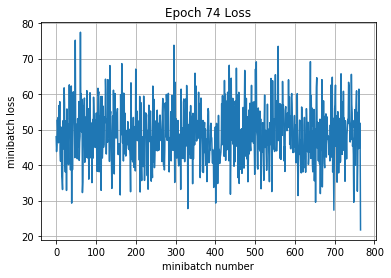

Iteration 56700: with minibatch training loss = 0.474 and accuracy of 0.89
Iteration 56800: with minibatch training loss = 0.766 and accuracy of 0.78
Iteration 56900: with minibatch training loss = 0.759 and accuracy of 0.83
Iteration 57000: with minibatch training loss = 0.872 and accuracy of 0.69
Iteration 57100: with minibatch training loss = 0.962 and accuracy of 0.7
Iteration 57200: with minibatch training loss = 0.904 and accuracy of 0.72
Iteration 57300: with minibatch training loss = 0.537 and accuracy of 0.86
Iteration 57400: with minibatch training loss = 0.901 and accuracy of 0.72
Epoch 75, Overall loss = 0.763 and accuracy of 0.769


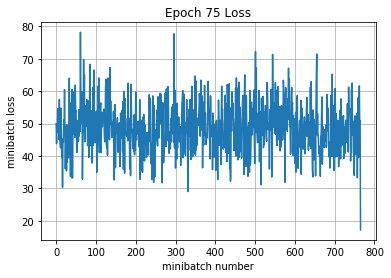

Iteration 57500: with minibatch training loss = 0.787 and accuracy of 0.75
Iteration 57600: with minibatch training loss = 0.792 and accuracy of 0.73
Iteration 57700: with minibatch training loss = 0.855 and accuracy of 0.81
Iteration 57800: with minibatch training loss = 0.563 and accuracy of 0.84
Iteration 57900: with minibatch training loss = 0.868 and accuracy of 0.69
Iteration 58000: with minibatch training loss = 0.84 and accuracy of 0.77
Iteration 58100: with minibatch training loss = 0.672 and accuracy of 0.83
Iteration 58200: with minibatch training loss = 0.904 and accuracy of 0.78
Epoch 76, Overall loss = 0.757 and accuracy of 0.772


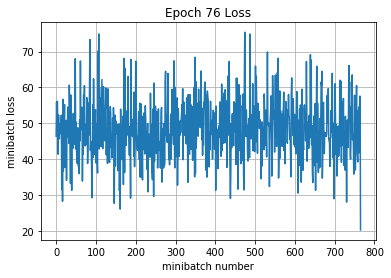

Iteration 58300: with minibatch training loss = 0.671 and accuracy of 0.81
Iteration 58400: with minibatch training loss = 0.715 and accuracy of 0.8
Iteration 58500: with minibatch training loss = 0.813 and accuracy of 0.8
Iteration 58600: with minibatch training loss = 0.694 and accuracy of 0.8
Iteration 58700: with minibatch training loss = 0.857 and accuracy of 0.77
Iteration 58800: with minibatch training loss = 0.8 and accuracy of 0.75
Iteration 58900: with minibatch training loss = 0.934 and accuracy of 0.72
Epoch 77, Overall loss = 0.753 and accuracy of 0.776


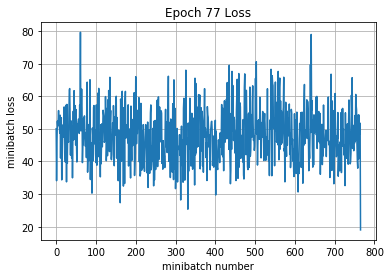

Iteration 59000: with minibatch training loss = 0.687 and accuracy of 0.81
Iteration 59100: with minibatch training loss = 0.84 and accuracy of 0.73
Iteration 59200: with minibatch training loss = 0.745 and accuracy of 0.8
Iteration 59300: with minibatch training loss = 0.792 and accuracy of 0.73
Iteration 59400: with minibatch training loss = 1.07 and accuracy of 0.67
Iteration 59500: with minibatch training loss = 0.649 and accuracy of 0.78
Iteration 59600: with minibatch training loss = 0.901 and accuracy of 0.7
Iteration 59700: with minibatch training loss = 0.901 and accuracy of 0.72
Epoch 78, Overall loss = 0.751 and accuracy of 0.775


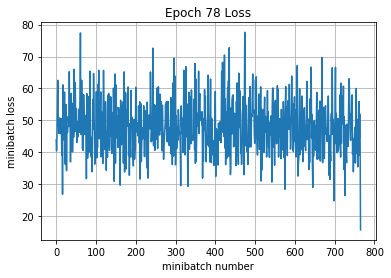

Iteration 59800: with minibatch training loss = 0.579 and accuracy of 0.8
Iteration 59900: with minibatch training loss = 0.735 and accuracy of 0.77
Iteration 60000: with minibatch training loss = 0.696 and accuracy of 0.8
Iteration 60100: with minibatch training loss = 0.757 and accuracy of 0.81
Iteration 60200: with minibatch training loss = 0.464 and accuracy of 0.91
Iteration 60300: with minibatch training loss = 0.679 and accuracy of 0.8
Iteration 60400: with minibatch training loss = 0.58 and accuracy of 0.81
Iteration 60500: with minibatch training loss = 0.621 and accuracy of 0.83
Epoch 79, Overall loss = 0.742 and accuracy of 0.777


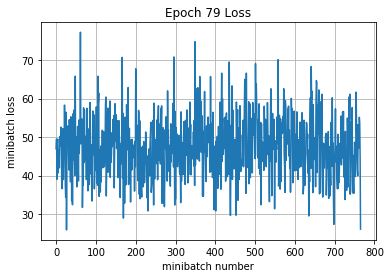

Iteration 60600: with minibatch training loss = 0.478 and accuracy of 0.86
Iteration 60700: with minibatch training loss = 0.737 and accuracy of 0.81
Iteration 60800: with minibatch training loss = 0.648 and accuracy of 0.8
Iteration 60900: with minibatch training loss = 0.74 and accuracy of 0.78
Iteration 61000: with minibatch training loss = 0.582 and accuracy of 0.86
Iteration 61100: with minibatch training loss = 0.859 and accuracy of 0.75
Iteration 61200: with minibatch training loss = 0.586 and accuracy of 0.8
Epoch 80, Overall loss = 0.732 and accuracy of 0.783


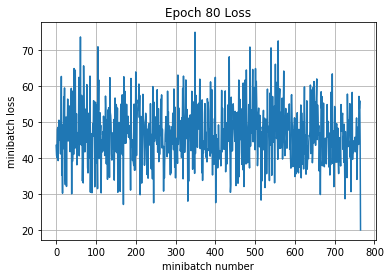

Iteration 61300: with minibatch training loss = 0.789 and accuracy of 0.7
Iteration 61400: with minibatch training loss = 0.727 and accuracy of 0.77
Iteration 61500: with minibatch training loss = 0.891 and accuracy of 0.73
Iteration 61600: with minibatch training loss = 0.772 and accuracy of 0.83
Iteration 61700: with minibatch training loss = 0.653 and accuracy of 0.75
Iteration 61800: with minibatch training loss = 0.831 and accuracy of 0.77
Iteration 61900: with minibatch training loss = 0.606 and accuracy of 0.86
Iteration 62000: with minibatch training loss = 0.801 and accuracy of 0.75
Epoch 81, Overall loss = 0.728 and accuracy of 0.782


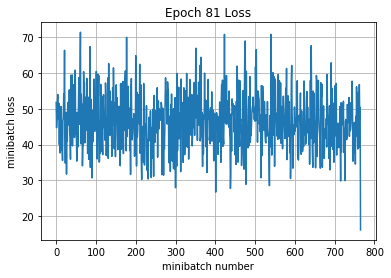

Iteration 62100: with minibatch training loss = 0.753 and accuracy of 0.73
Iteration 62200: with minibatch training loss = 0.687 and accuracy of 0.84
Iteration 62300: with minibatch training loss = 0.723 and accuracy of 0.8
Iteration 62400: with minibatch training loss = 0.714 and accuracy of 0.77
Iteration 62500: with minibatch training loss = 0.748 and accuracy of 0.78
Iteration 62600: with minibatch training loss = 0.774 and accuracy of 0.73
Iteration 62700: with minibatch training loss = 0.926 and accuracy of 0.75
Iteration 62800: with minibatch training loss = 0.717 and accuracy of 0.83
Epoch 82, Overall loss = 0.733 and accuracy of 0.78


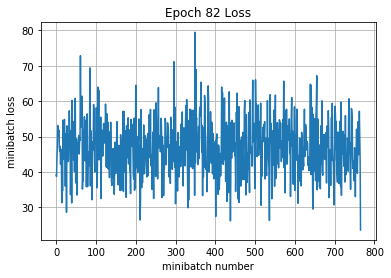

Iteration 62900: with minibatch training loss = 0.539 and accuracy of 0.84
Iteration 63000: with minibatch training loss = 0.773 and accuracy of 0.75
Iteration 63100: with minibatch training loss = 0.786 and accuracy of 0.78
Iteration 63200: with minibatch training loss = 0.88 and accuracy of 0.77
Iteration 63300: with minibatch training loss = 0.63 and accuracy of 0.77
Iteration 63400: with minibatch training loss = 0.499 and accuracy of 0.88
Iteration 63500: with minibatch training loss = 0.6 and accuracy of 0.86
Epoch 83, Overall loss = 0.73 and accuracy of 0.783


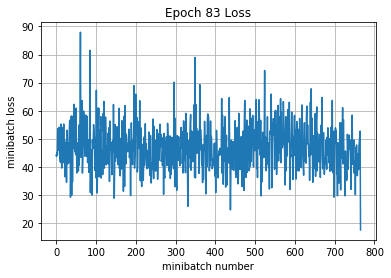

Iteration 63600: with minibatch training loss = 0.625 and accuracy of 0.8
Iteration 63700: with minibatch training loss = 0.625 and accuracy of 0.81
Iteration 63800: with minibatch training loss = 0.646 and accuracy of 0.83
Iteration 63900: with minibatch training loss = 0.77 and accuracy of 0.72
Iteration 64000: with minibatch training loss = 0.973 and accuracy of 0.7
Iteration 64100: with minibatch training loss = 0.664 and accuracy of 0.8
Iteration 64200: with minibatch training loss = 0.644 and accuracy of 0.83
Iteration 64300: with minibatch training loss = 0.827 and accuracy of 0.75
Epoch 84, Overall loss = 0.717 and accuracy of 0.788


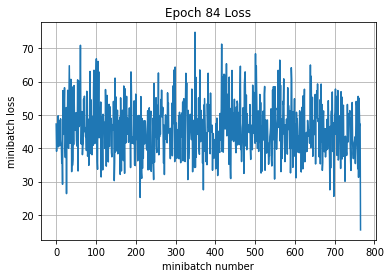

Iteration 64400: with minibatch training loss = 0.665 and accuracy of 0.8
Iteration 64500: with minibatch training loss = 0.609 and accuracy of 0.83
Iteration 64600: with minibatch training loss = 0.71 and accuracy of 0.77
Iteration 64700: with minibatch training loss = 0.811 and accuracy of 0.75
Iteration 64800: with minibatch training loss = 0.823 and accuracy of 0.7
Iteration 64900: with minibatch training loss = 0.733 and accuracy of 0.78
Iteration 65000: with minibatch training loss = 0.643 and accuracy of 0.78
Iteration 65100: with minibatch training loss = 0.646 and accuracy of 0.8
Epoch 85, Overall loss = 0.714 and accuracy of 0.787


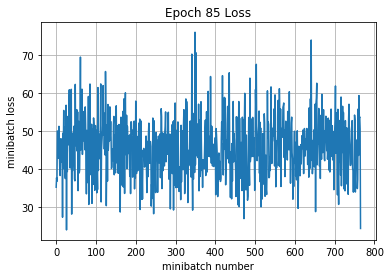

Iteration 65200: with minibatch training loss = 0.513 and accuracy of 0.84
Iteration 65300: with minibatch training loss = 0.714 and accuracy of 0.77
Iteration 65400: with minibatch training loss = 0.817 and accuracy of 0.77
Iteration 65500: with minibatch training loss = 0.632 and accuracy of 0.83
Iteration 65600: with minibatch training loss = 0.665 and accuracy of 0.8
Iteration 65700: with minibatch training loss = 0.664 and accuracy of 0.84
Iteration 65800: with minibatch training loss = 0.558 and accuracy of 0.86
Epoch 86, Overall loss = 0.713 and accuracy of 0.79


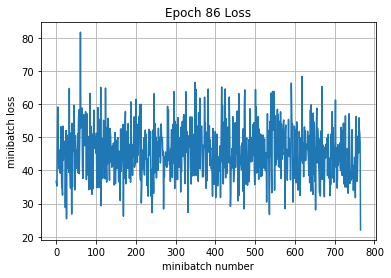

Iteration 65900: with minibatch training loss = 0.545 and accuracy of 0.84
Iteration 66000: with minibatch training loss = 0.81 and accuracy of 0.78
Iteration 66100: with minibatch training loss = 0.645 and accuracy of 0.78
Iteration 66200: with minibatch training loss = 0.633 and accuracy of 0.83
Iteration 66300: with minibatch training loss = 0.679 and accuracy of 0.83
Iteration 66400: with minibatch training loss = 1.06 and accuracy of 0.66
Iteration 66500: with minibatch training loss = 0.834 and accuracy of 0.75
Iteration 66600: with minibatch training loss = 0.671 and accuracy of 0.77
Epoch 87, Overall loss = 0.701 and accuracy of 0.792


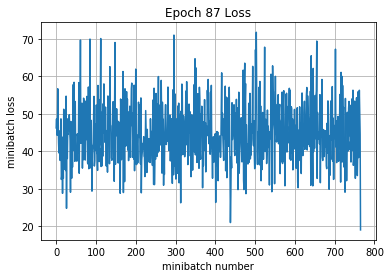

Iteration 66700: with minibatch training loss = 0.69 and accuracy of 0.81
Iteration 66800: with minibatch training loss = 0.817 and accuracy of 0.72
Iteration 66900: with minibatch training loss = 0.678 and accuracy of 0.8
Iteration 67000: with minibatch training loss = 0.839 and accuracy of 0.69
Iteration 67100: with minibatch training loss = 0.588 and accuracy of 0.81
Iteration 67200: with minibatch training loss = 0.826 and accuracy of 0.7
Iteration 67300: with minibatch training loss = 0.718 and accuracy of 0.8
Iteration 67400: with minibatch training loss = 0.543 and accuracy of 0.83
Epoch 88, Overall loss = 0.705 and accuracy of 0.792


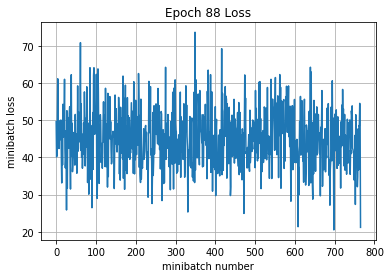

Iteration 67500: with minibatch training loss = 0.84 and accuracy of 0.7
Iteration 67600: with minibatch training loss = 0.683 and accuracy of 0.8
Iteration 67700: with minibatch training loss = 0.606 and accuracy of 0.84
Iteration 67800: with minibatch training loss = 0.64 and accuracy of 0.8
Iteration 67900: with minibatch training loss = 0.635 and accuracy of 0.86
Iteration 68000: with minibatch training loss = 0.945 and accuracy of 0.72
Iteration 68100: with minibatch training loss = 0.863 and accuracy of 0.75
Epoch 89, Overall loss = 0.707 and accuracy of 0.789


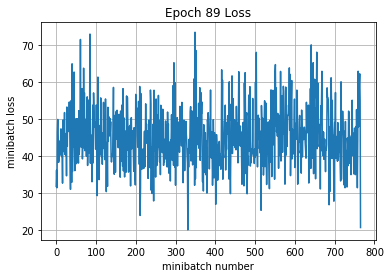

Iteration 68200: with minibatch training loss = 0.421 and accuracy of 0.92
Iteration 68300: with minibatch training loss = 0.632 and accuracy of 0.88
Iteration 68400: with minibatch training loss = 0.858 and accuracy of 0.7
Iteration 68500: with minibatch training loss = 0.849 and accuracy of 0.78
Iteration 68600: with minibatch training loss = 0.806 and accuracy of 0.75
Iteration 68700: with minibatch training loss = 0.768 and accuracy of 0.7
Iteration 68800: with minibatch training loss = 0.613 and accuracy of 0.83
Iteration 68900: with minibatch training loss = 0.403 and accuracy of 0.89
Epoch 90, Overall loss = 0.704 and accuracy of 0.791


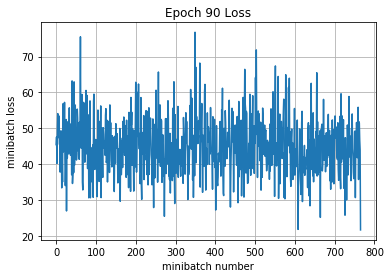

Iteration 69000: with minibatch training loss = 0.82 and accuracy of 0.75
Iteration 69100: with minibatch training loss = 0.666 and accuracy of 0.78
Iteration 69200: with minibatch training loss = 0.6 and accuracy of 0.8
Iteration 69300: with minibatch training loss = 0.74 and accuracy of 0.78
Iteration 69400: with minibatch training loss = 0.593 and accuracy of 0.81
Iteration 69500: with minibatch training loss = 0.7 and accuracy of 0.81
Iteration 69600: with minibatch training loss = 0.577 and accuracy of 0.83
Iteration 69700: with minibatch training loss = 0.657 and accuracy of 0.84
Epoch 91, Overall loss = 0.698 and accuracy of 0.792


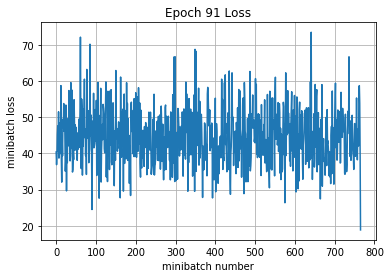

Iteration 69800: with minibatch training loss = 0.914 and accuracy of 0.66
Iteration 69900: with minibatch training loss = 0.671 and accuracy of 0.78
Iteration 70000: with minibatch training loss = 0.809 and accuracy of 0.77
Iteration 70100: with minibatch training loss = 0.664 and accuracy of 0.77
Iteration 70200: with minibatch training loss = 0.903 and accuracy of 0.75
Iteration 70300: with minibatch training loss = 0.705 and accuracy of 0.8
Iteration 70400: with minibatch training loss = 0.841 and accuracy of 0.73
Epoch 92, Overall loss = 0.684 and accuracy of 0.799


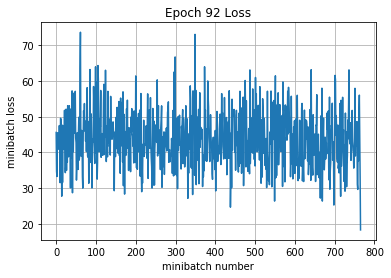

Iteration 70500: with minibatch training loss = 0.518 and accuracy of 0.86
Iteration 70600: with minibatch training loss = 0.689 and accuracy of 0.78
Iteration 70700: with minibatch training loss = 0.556 and accuracy of 0.84
Iteration 70800: with minibatch training loss = 0.794 and accuracy of 0.77
Iteration 70900: with minibatch training loss = 0.795 and accuracy of 0.72
Iteration 71000: with minibatch training loss = 0.618 and accuracy of 0.81
Iteration 71100: with minibatch training loss = 0.613 and accuracy of 0.86
Iteration 71200: with minibatch training loss = 0.593 and accuracy of 0.84
Epoch 93, Overall loss = 0.687 and accuracy of 0.797


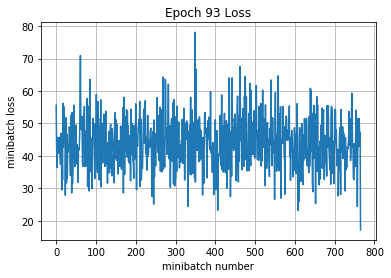

Iteration 71300: with minibatch training loss = 0.683 and accuracy of 0.83
Iteration 71400: with minibatch training loss = 0.887 and accuracy of 0.73
Iteration 71500: with minibatch training loss = 0.571 and accuracy of 0.83
Iteration 71600: with minibatch training loss = 0.592 and accuracy of 0.83
Iteration 71700: with minibatch training loss = 0.872 and accuracy of 0.7
Iteration 71800: with minibatch training loss = 0.746 and accuracy of 0.81
Iteration 71900: with minibatch training loss = 0.608 and accuracy of 0.86
Iteration 72000: with minibatch training loss = 0.87 and accuracy of 0.7
Epoch 94, Overall loss = 0.68 and accuracy of 0.801


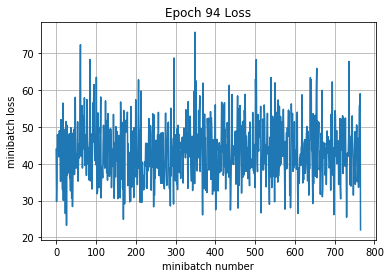

Iteration 72100: with minibatch training loss = 0.803 and accuracy of 0.77
Iteration 72200: with minibatch training loss = 0.838 and accuracy of 0.75
Iteration 72300: with minibatch training loss = 0.964 and accuracy of 0.72
Iteration 72400: with minibatch training loss = 0.612 and accuracy of 0.86
Iteration 72500: with minibatch training loss = 0.852 and accuracy of 0.78
Iteration 72600: with minibatch training loss = 0.581 and accuracy of 0.84
Iteration 72700: with minibatch training loss = 0.74 and accuracy of 0.77
Epoch 95, Overall loss = 0.681 and accuracy of 0.8


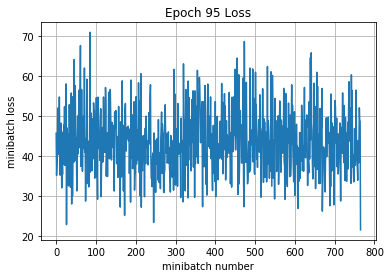

Iteration 72800: with minibatch training loss = 0.666 and accuracy of 0.81
Iteration 72900: with minibatch training loss = 0.771 and accuracy of 0.8
Iteration 73000: with minibatch training loss = 0.735 and accuracy of 0.81
Iteration 73100: with minibatch training loss = 0.605 and accuracy of 0.84
Iteration 73200: with minibatch training loss = 0.719 and accuracy of 0.78
Iteration 73300: with minibatch training loss = 0.814 and accuracy of 0.78
Iteration 73400: with minibatch training loss = 0.823 and accuracy of 0.7
Iteration 73500: with minibatch training loss = 0.474 and accuracy of 0.84
Epoch 96, Overall loss = 0.673 and accuracy of 0.803


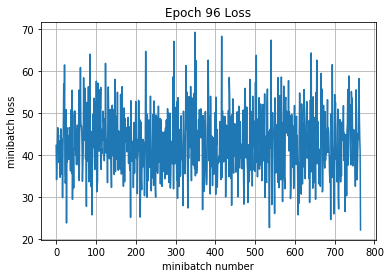

Iteration 73600: with minibatch training loss = 0.701 and accuracy of 0.84
Iteration 73700: with minibatch training loss = 0.495 and accuracy of 0.89
Iteration 73800: with minibatch training loss = 0.751 and accuracy of 0.78
Iteration 73900: with minibatch training loss = 1.02 and accuracy of 0.67
Iteration 74000: with minibatch training loss = 0.674 and accuracy of 0.81
Iteration 74100: with minibatch training loss = 0.817 and accuracy of 0.75
Iteration 74200: with minibatch training loss = 0.49 and accuracy of 0.88
Iteration 74300: with minibatch training loss = 0.649 and accuracy of 0.78
Epoch 97, Overall loss = 0.674 and accuracy of 0.804


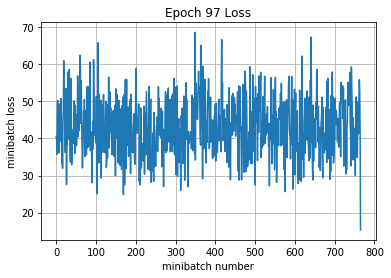

Iteration 74400: with minibatch training loss = 0.599 and accuracy of 0.83
Iteration 74500: with minibatch training loss = 0.618 and accuracy of 0.83
Iteration 74600: with minibatch training loss = 0.637 and accuracy of 0.84
Iteration 74700: with minibatch training loss = 0.661 and accuracy of 0.83
Iteration 74800: with minibatch training loss = 0.68 and accuracy of 0.81
Iteration 74900: with minibatch training loss = 0.626 and accuracy of 0.86
Iteration 75000: with minibatch training loss = 0.454 and accuracy of 0.86
Epoch 98, Overall loss = 0.677 and accuracy of 0.802


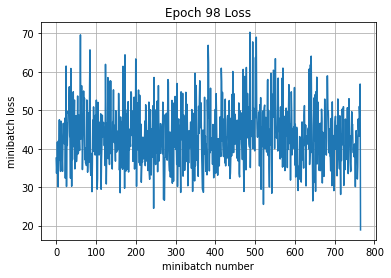

Iteration 75100: with minibatch training loss = 0.551 and accuracy of 0.83
Iteration 75200: with minibatch training loss = 0.668 and accuracy of 0.75
Iteration 75300: with minibatch training loss = 0.544 and accuracy of 0.81
Iteration 75400: with minibatch training loss = 0.692 and accuracy of 0.77
Iteration 75500: with minibatch training loss = 0.757 and accuracy of 0.77
Iteration 75600: with minibatch training loss = 0.633 and accuracy of 0.84
Iteration 75700: with minibatch training loss = 0.585 and accuracy of 0.81
Iteration 75800: with minibatch training loss = 0.852 and accuracy of 0.7
Epoch 99, Overall loss = 0.662 and accuracy of 0.807


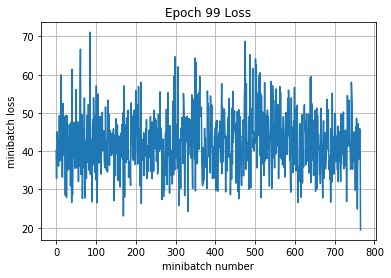

Iteration 75900: with minibatch training loss = 0.498 and accuracy of 0.86
Iteration 76000: with minibatch training loss = 0.702 and accuracy of 0.8
Iteration 76100: with minibatch training loss = 0.515 and accuracy of 0.84
Iteration 76200: with minibatch training loss = 0.654 and accuracy of 0.78
Iteration 76300: with minibatch training loss = 0.356 and accuracy of 0.95
Iteration 76400: with minibatch training loss = 0.847 and accuracy of 0.7
Iteration 76500: with minibatch training loss = 0.893 and accuracy of 0.73
Epoch 100, Overall loss = 0.661 and accuracy of 0.808


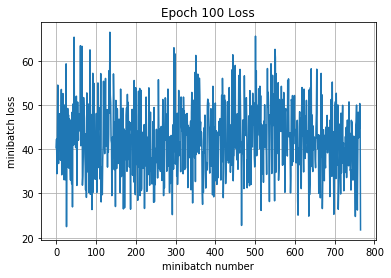

Validation
Epoch 1, Overall loss = 1.03 and accuracy of 0.68
CPU times: user 15min 27s, sys: 2min 34s, total: 18min 1s
Wall time: 13min 23s


In [50]:
%%time
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy

epochs = 100

sess = tf.Session(config=config)

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,epochs,64,100,train_step,True, 
          keep_prob_value=keep_prob_value)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

### Test Set - Do this only once
Now that we've gotten a result that we're happy with, we test our final model on the test set. This would be the score we would achieve on a competition. Think about how this compares to your validation set accuracy.

In [ ]:
print('Test')
run_model(sess,y_out,mean_loss,X_test,y_test,1,64)

## Going further with TensorFlow

The next assignment will make heavy use of TensorFlow. You might also find it useful for your projects. 


# Extra Credit Description
If you implement any additional features for extra credit, clearly describe them here with pointers to any code in this or other files if applicable.